# 데이터 분석 계획

**인사이트 도출 계획**
<br><br>
- 매출에 영향을 주는 요인 분석  
 : 패스트캠퍼스 데이터를 활용해 `매출에 영향을 주는 주요 요인을 예측`하고, `해당 키워드별 매출을 분석`하여 `매출을 증가시키기 위한 방안을 모색`하려고 합니다. 

- 프로젝트 진행 계획
 : 매출에 영향을 줄 것으로 `예측한 주요 요인이 실제로 매출과 어떠한 상관관계를 갖는지 다양한 plot으로 시각화하여 분석`한 후, `검증된 주요 요인간의 상관관계 분석` 및 `개별 요인 내 세부적인 분석`을 통해 <u>어떻게 매출에 영향을 주는지 파악해볼 예정</u>입니다.

# Importing the library

In [1]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import matplotlib.ticker as tkr
import matplotlib.gridspec as grs
import calendar

# Report
import pandas_profiling
from IPython.display import display, HTML

# WordCloud
from wordcloud import WordCloud, STOPWORDS, ImageColorGenerator
from PIL import Image

# plotly
import plotly.express as px
from plotly.subplots import make_subplots
import plotly.offline as offline
import plotly.graph_objs as go
offline.init_notebook_mode(connected = True)

# plot에 한글 폰트 정상 출력
plt.rcParams['font.family'] = 'AppleGothic'

# 데이터 값 자릿수 구분, 실수. 소수점 두째자리까지 표시  -->  https://blog.naver.com/bya135/222223683024
pd.options.display.float_format = '{:.2f}'.format

# 창 크기 조절
display(HTML("<style>.container { width:100% !important; }</style>")) 

In [2]:
from subprocess import check_output
print(check_output(["ls","./"]).decode("utf8"))

AppleGothic.ttf
apr.png
jul.png
mar.jpeg
may.png
sep.png
책_검은배경.jpeg
선우.ipynb
재연.ipynb
혜빈.ipynb
용성.ipynb
프로젝트 통합본(수정중).ipynb
파이널프로젝트_RAW_210329_210926.xlsx



# Dataset

## 데이터 로딩

In [3]:
df = pd.read_excel("./파이널프로젝트_RAW_210329_210926.xlsx")

In [4]:
df.head()

,id,customer_id,course_id,type,state,course_title,category_title,format,completed_at,transaction_amount,coupon_title,coupon_discount_amount,sale_price,tax_free_amount,pg,method,subcategory_title,marketing_start_at
0,970634,504760.00,201435.00,ORDER,CANCELLED,올인원 패키지 : 알고리즘 기술면접 완전 정복,프로그래밍,올인원,2021-03-28 15:00:11,90500,NaN,NaN,110500.00,110500.00,NaN,VBANK,개발자 커리어,NaT
1,970650,432862.00,203178.00,ORDER,CANCELLED,초격차 패키지 : 한번에 끝내는 영상 촬영과 편집,영상/3D,올인원,2021-03-28 15:16:53,96000,NaN,NaN,116000.00,116000.00,NaN,CARD,영상 편집,2020-12-02
2,970657,72297.00,204246.00,PAYMENT,COMPLETED,시크릿코드 : 프론트엔드 실무 완성편,프로그래밍,스쿨 온라인,2021-03-28 15:21:43,171810,[10% 할인] 시크릿코드 실무 완성편,19090.00,190900.00,190900.00,NaN,CARD,NaN,2021-03-04
3,970656,72297.00,204246.00,ORDER,CANCELLED,시크릿코드 : 프론트엔드 실무 완성편,프로그래밍,스쿨 온라인,2021-03-28 15:21:43,171810,NaN,NaN,190900.00,190900.00,NaN,CARD,NaN,2021-03-04
4,970658,478028.00,201797.00,PAYMENT,COMPLETED,올인원 패키지 : 직장인 필수 스킬 3종 세트 MAX,업무 생산성,올인원,2021-03-28 15:21:54,97500,[웰컴쿠폰] 올인원 패키지 2만원 할인 쿠폰,20000.00,117500.00,117500.00,NaN,CARD,PPT/보고서,2019-11-14


In [5]:
## 데이터 살펴보기

In [6]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 105419 entries, 0 to 105418
Data columns (total 18 columns):
 #   Column                  Non-Null Count   Dtype         
---  ------                  --------------   -----         
 0   id                      105419 non-null  int64         
 1   customer_id             105416 non-null  float64       
 2   course_id               100212 non-null  float64       
 3   type                    105419 non-null  object        
 4   state                   105419 non-null  object        
 5   course_title            105403 non-null  object        
 6   category_title          105395 non-null  object        
 7   format                  105403 non-null  object        
 8   completed_at            105419 non-null  datetime64[ns]
 9   transaction_amount      105419 non-null  int64         
 10  coupon_title            31817 non-null   object        
 11  coupon_discount_amount  31817 non-null   float64       
 12  sale_price              104291

In [7]:
# 데이터 종류 확인하기
print("-"*30)
print("* 데이터 타입, 데이터프레임 정보 확인")
print("-"*30)
df.info()

# 결측 데이터 확인
print("-"*30)
print("* 데이터 칼럼별 결측값 개수 및 비율 확인")
print("-"*30)
df.isna().sum()
df_isna = pd.DataFrame(df.isna().sum(), columns = ['count'])
df_isna['rate(%)'] = df_isna.div(len(df)) * 100
df_isna

------------------------------
* 데이터 타입, 데이터프레임 정보 확인
------------------------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 105419 entries, 0 to 105418
Data columns (total 18 columns):
 #   Column                  Non-Null Count   Dtype         
---  ------                  --------------   -----         
 0   id                      105419 non-null  int64         
 1   customer_id             105416 non-null  float64       
 2   course_id               100212 non-null  float64       
 3   type                    105419 non-null  object        
 4   state                   105419 non-null  object        
 5   course_title            105403 non-null  object        
 6   category_title          105395 non-null  object        
 7   format                  105403 non-null  object        
 8   completed_at            105419 non-null  datetime64[ns]
 9   transaction_amount      105419 non-null  int64         
 10  coupon_title            31817 non-null   object        
 11  coupon

,count,rate(%)
id,0,0.00
customer_id,3,0.00
course_id,5207,4.94
type,0,0.00
state,0,0.00
course_title,16,0.02
category_title,24,0.02
format,16,0.02
completed_at,0,0.00
transaction_amount,0,0.00


- 각 칼럼별로 105,419개의 값을 가지고 있으며 `2개`의 **날짜(일자 및 시간)타입**, `5개`의 **float타입**, `2개`의 **int타입**, `9개`의 **object타입**의 column으로 구성되어 있음.

- 결측값은 `course id의` 경우 **약 5%**, `coupon` 관련 데이터는 **약 70%**, `sale 및 tax_free` 관련 데이터는 **약 1%**, `그 외 결측 데이터`는 **약 12~19%** 정도로 확인 됨.

## Profiling Report

In [8]:
report = pandas_profiling.ProfileReport(df)
display(report)

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

## 기초통계랑 확인

In [9]:
# 기초통계량 확인
df.describe()

,id,customer_id,course_id,transaction_amount,coupon_discount_amount,sale_price,tax_free_amount
count,105419.00,105416.00,100212.00,105419.00,31817.00,104291.00,104291.00
mean,1147053.95,417248.25,203868.59,146481.42,49721.72,161080.79,157555.06
std,112589.75,206414.50,1534.58,719506.11,56244.67,395529.75,389813.33
min,567993.00,16.00,2516.00,-4144074.00,0.00,1.00,0.00
25%,1048940.50,256401.00,203100.00,83500.00,20000.00,109000.00,109000.00
50%,1135186.00,501046.00,203787.00,117500.00,21000.00,132000.00,132000.00
75%,1240472.50,566595.00,204775.00,159000.00,69150.00,171000.00,171000.00
max,1381657.00,672308.00,207742.00,113400000.00,2000000.00,90940000.00,90940000.00


## 상관관계 분석

In [10]:
# 상관관계 분석
corr = df.corr()
corr

,id,customer_id,course_id,transaction_amount,coupon_discount_amount,sale_price,tax_free_amount
id,1.00,0.20,0.36,0.03,0.07,0.04,0.04
customer_id,0.20,1.00,0.02,0.02,-0.34,-0.00,-0.00
course_id,0.36,0.02,1.00,0.05,0.02,0.04,0.04
transaction_amount,0.03,0.02,0.05,1.00,-0.34,0.95,0.95
coupon_discount_amount,0.07,-0.34,0.02,-0.34,1.00,0.25,0.24
sale_price,0.04,-0.00,0.04,0.95,0.25,1.00,0.99
tax_free_amount,0.04,-0.00,0.04,0.95,0.24,0.99,1.00


/opt/homebrew/lib/python3.9/site-packages/seaborn/utils.py:95: UserWarning:

Glyph 8722 (\N{MINUS SIGN}) missing from current font.

/opt/homebrew/lib/python3.9/site-packages/IPython/core/pylabtools.py:151: UserWarning:

Glyph 8722 (\N{MINUS SIGN}) missing from current font.



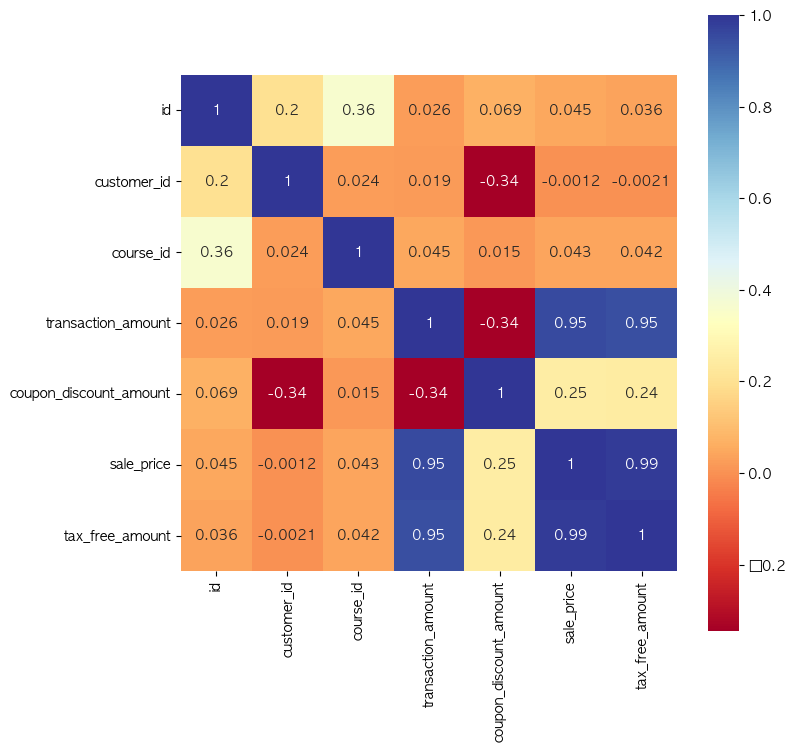

In [11]:
# 상관관계 히트맵
plt.figure(figsize=(8,8))
sns.heatmap(data=corr, square=True, cmap='RdYlBu', annot=True, fmt=".2g")
plt.show()

# Data preprocessing

## 데이터 전처리

In [12]:
# 1. type
## payment 와 refund만 보기
drop_type = df[(df['type'] != 'PAYMENT') & (df['type'] != 'REFUND')].index
df = df.drop(drop_type, axis="index")

# 2. state
## COMPLETED 만 보기
drop_state = df[(df['state'] != 'COMPLETED')].index
df = df.drop(drop_state, axis="index")

# 3. course_title
## 결측치 제거
df = df.dropna(subset=['course_title']).reset_index()

# 4. category_title
## 데이터 사이언스 -> 데이터사이언스로 변경, 띄어쓰기 제거
df.loc[df['category_title'] == '데이터 사이언스', 'category_title'] = '데이터사이언스'

## id 1078156 제거
drop_id = df[df['id'] == 1078156].index
df = df.drop(drop_id, axis="index")

## id 1212937, 1223480 데이터사이언스로 채워넣기
df.loc[df["id"] == 1212937, "category_title"] = "데이터사이언스"
df.loc[df["id"] == 1223480, "category_title"] = "데이터사이언스"

# 5. format
## 결측치 제거
df = df.dropna(subset=['format'])

# 6. category_title
## 관리 제거
drop_category_title = df[df['category_title'] == '관리'].index
df = df.drop(drop_category_title, axis="index")

# course_id 결측치 전부 0으로 추가
df['course_id'] = df['course_id'].fillna(0)

# course_id, customer_id 모두 데이터 타입 정수로 변경
df = df.astype({'customer_id' : 'int64', 'course_id' : 'int64'})

In [13]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 56721 entries, 0 to 56722
Data columns (total 19 columns):
 #   Column                  Non-Null Count  Dtype         
---  ------                  --------------  -----         
 0   index                   56721 non-null  int64         
 1   id                      56721 non-null  int64         
 2   customer_id             56721 non-null  int64         
 3   course_id               56721 non-null  int64         
 4   type                    56721 non-null  object        
 5   state                   56721 non-null  object        
 6   course_title            56721 non-null  object        
 7   category_title          56721 non-null  object        
 8   format                  56721 non-null  object        
 9   completed_at            56721 non-null  datetime64[ns]
 10  transaction_amount      56721 non-null  int64         
 11  coupon_title            23761 non-null  object        
 12  coupon_discount_amount  23761 non-null  float6

## 컬럼 추가

In [14]:
def add_category(df):
    text = df
    if (text == '투자/재테크') or (text == '부동산/금융') or (text == '파이낸스') or (text == '지식콘텐츠'):
        return 'finance'
    elif (text == '크리에이티브') or (text == '디자인') or (text == '마케팅') or (text == '영상/3D'):
        return 'design'
    elif (text == '프로그래밍') or (text == '데이터사이언스'):
        return 'programming'
    elif (text == '업무 생산성') or (text == '비즈니스') or (text == '교육'):
        return 'business'
    else:
        return '기타'

df['big_category_title'] = df['category_title'].apply(add_category)    

In [15]:
# 결제 및 환불 건수
df['is_payment'] = np.where(df['type'] == 'PAYMENT', 1, 0)
df['is_refund'] = np.where(df['type'] == 'REFUND', 1, 0)

# 카테고리별 건수
df['is_finance'] = np.where(df['big_category_title'] == 'finance', 1, 0)
df['is_design'] = np.where(df['big_category_title'] == 'design', 1, 0)
df['is_programming'] = np.where(df['big_category_title'] == 'programming', 1, 0)
df['is_business'] = np.where(df['big_category_title'] == 'business', 1, 0)


# 날짜 및 시간
df['date'] = pd.to_datetime(df['completed_at'])
df['year'] = df['completed_at'].dt.year
df['month'] = df['completed_at'].dt.month
df['week'] = df['completed_at'].dt.isocalendar().week
df['quarter'] = df['completed_at'].dt.quarter
df['day_of_week'] = df['completed_at'].dt.day_name()
df['hour'] = df['completed_at'].dt.hour
df[:2]

,index,id,customer_id,course_id,type,state,course_title,category_title,format,completed_at,...,is_design,is_programming,is_business,date,year,month,week,quarter,day_of_week,hour
0,2,970657,72297,204246,PAYMENT,COMPLETED,시크릿코드 : 프론트엔드 실무 완성편,프로그래밍,스쿨 온라인,2021-03-28 15:21:43,...,0,1,0,2021-03-28 15:21:43,2021,3,12,1,Sunday,15
1,4,970658,478028,201797,PAYMENT,COMPLETED,올인원 패키지 : 직장인 필수 스킬 3종 세트 MAX,업무 생산성,올인원,2021-03-28 15:21:54,...,0,0,1,2021-03-28 15:21:54,2021,3,12,1,Sunday,15


## 조건

In [16]:
# month 조건
mar = df['month'] == 3
apr = df['month'] == 4
may = df['month'] == 5
jun = df['month'] == 6
jul = df['month'] == 7
aug = df['month'] == 8
sep = df['month'] == 9

# type 조건
payment = df['type'] == 'PAYMENT'
refund = df['type'] == 'REFUND'

# Category_title 조건
finance = (df['big_category_title'] == 'finance')
design = (df['big_category_title'] == 'design')
programming = (df['big_category_title'] == 'programming')
business = (df['big_category_title'] == 'business')

In [17]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 56721 entries, 0 to 56722
Data columns (total 33 columns):
 #   Column                  Non-Null Count  Dtype         
---  ------                  --------------  -----         
 0   index                   56721 non-null  int64         
 1   id                      56721 non-null  int64         
 2   customer_id             56721 non-null  int64         
 3   course_id               56721 non-null  int64         
 4   type                    56721 non-null  object        
 5   state                   56721 non-null  object        
 6   course_title            56721 non-null  object        
 7   category_title          56721 non-null  object        
 8   format                  56721 non-null  object        
 9   completed_at            56721 non-null  datetime64[ns]
 10  transaction_amount      56721 non-null  int64         
 11  coupon_title            23761 non-null  object        
 12  coupon_discount_amount  23761 non-null  float6

# 기간별 매출 분석

## 전체 통계

In [18]:
# 전체 고객수
total_customer = len(df[payment].groupby('customer_id').size())

# 총 결제건수
total_payment = df.groupby(payment).size()[1]

# 충성고객수
df_cus = df[payment].groupby('customer_id').size().to_frame().reset_index()
df_cus.columns = ['customer_id', 'count']
two_more_customer = len(df_cus[df_cus['count'] > 1])
three_more_customer = len(df_cus[df_cus['count'] > 2])
four_more_customer = len(df_cus[df_cus['count'] > 3])
five_more_customer = len(df_cus[df_cus['count'] > 4])


# 총 환불건수
total_refund = df.groupby(refund).size()[1]

# 총 강의수
total_course = len(df.groupby('course_id').size())

### 전체 고객, 강의, 결제건수, 환불건수

In [19]:
fig=go.Figure()
fig.add_trace(go.Scatter(
    x=[0, 1, 2, 3],
    y=[1.6, 1.6, 1.6, 1.6],
    mode="text", 
    text=[f"<span style='font-size:33px'><b>{total_customer}</b></span>", 
          f"<span style='font-size:33px'><b>{total_course}</b></span>",
          f"<span style='font-size:33px'><b>{total_payment}</b></span>",
          f"<span style='font-size:33px'><b>{total_refund}</b></span>"],
    textposition="bottom center"
))
fig.add_trace(go.Scatter(
    x=[0, 1, 2, 3],
    y=[1.1, 1.1, 1.1, 1.1],
    mode="text", 
    text=["Customer", "Course", "Payment", "Refund"],
    textposition="bottom center"
))
fig.add_hline(y=2.2, line_width=5, line_color='gray')
fig.add_hline(y=0.3, line_width=3, line_color='gray')
fig.update_yaxes(visible=False)
fig.update_xaxes(visible=False)
fig.update_layout(showlegend=False, height=300, width=700, 
                  title='Customer Payment Summary', title_x=0.5, title_y=0.9,
                  xaxis_range=[-0.5,3.6], yaxis_range=[-0.2,2.2],
                  plot_bgcolor='#fafafa', paper_bgcolor='#fafafa',
                  font=dict(size=23, color='#323232'),
                  title_font=dict(size=35, color='#222'),
                  margin=dict(t=90,l=70,b=0,r=70), 
    )

In [20]:
print(f'전체 고객 : {total_customer}',
      f'2번 이상 결제한 고객 : {two_more_customer}',
      f'3번 이상 결제한 고객 : {three_more_customer}',
      f'4번 이상 결제한 고객 : {four_more_customer}',
      f'5번 이상 결제한 고객 : {five_more_customer}',
      f'총 결제건수 : {total_payment}',    
      f'총 환불건수 : {total_refund}',
      f'총 강의 : {total_course}',
      sep='\n'
     )

전체 고객 : 39518
2번 이상 결제한 고객 : 7827
3번 이상 결제한 고객 : 2507
4번 이상 결제한 고객 : 1113
5번 이상 결제한 고객 : 602
총 결제건수 : 52900
총 환불건수 : 3821
총 강의 : 1310


### 두번 이상 결제한 고객 수

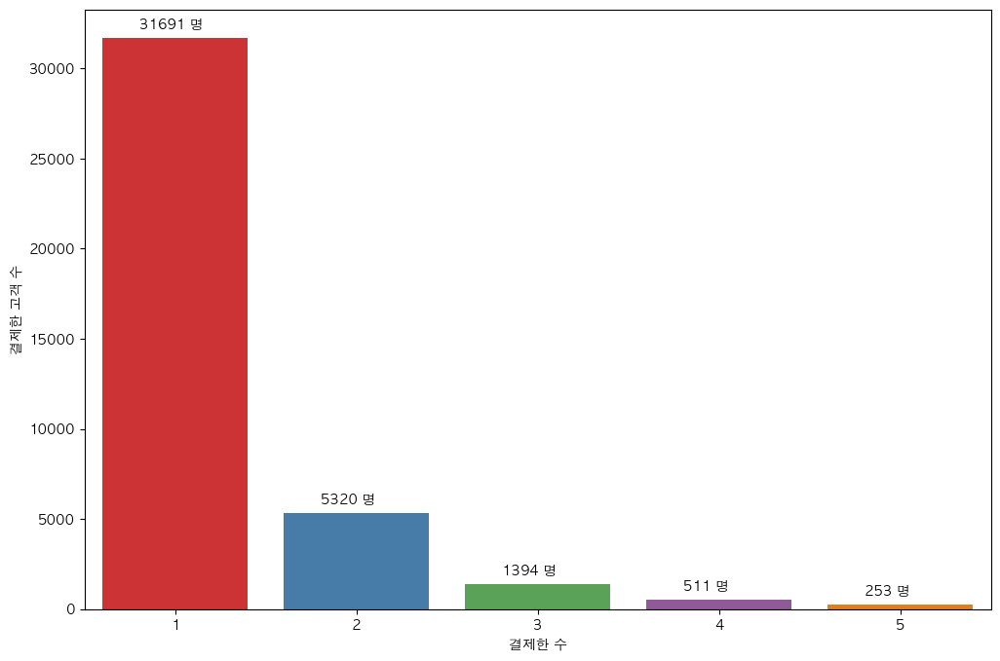

In [21]:
plt.figure(figsize=(12,8))
ax = sns.countplot(x=df_cus['count'], data=df_cus, palette="Set1", order=[1,2,3,4,5])
plt.xlabel('결제한 수')
plt.ylabel('결제한 고객 수')

for p in ax.patches:
        ax.annotate('{} 명'.format(p.get_height()), (p.get_x() + 0.2, p.get_height() + 500))

In [22]:
pm1 = round(len(df_cus[df_cus['count'] == 2]) / len(df_cus[df_cus['count'] == 1])* 100,1) 
pm2 = round(len(df_cus[df_cus['count'] == 3]) / len(df_cus[df_cus['count'] == 1])* 100,1)
pm3 = round(len(df_cus[df_cus['count'] == 4]) / len(df_cus[df_cus['count'] == 1])* 100,1)
pm4 = round(len(df_cus[df_cus['count'] == 5]) / len(df_cus[df_cus['count'] == 1])* 100,1)


print(f"2번 결재률 : {pm1}% \n3번 결재률 : {pm2}% \n4번 결재률 : {pm3}% \n5번 결재률 : {pm4}% \n")

2번 결재률 : 16.8% 
3번 결재률 : 4.4% 
4번 결재률 : 1.6% 
5번 결재률 : 0.8% 



### 전체 카테고리별 결제건수 확인

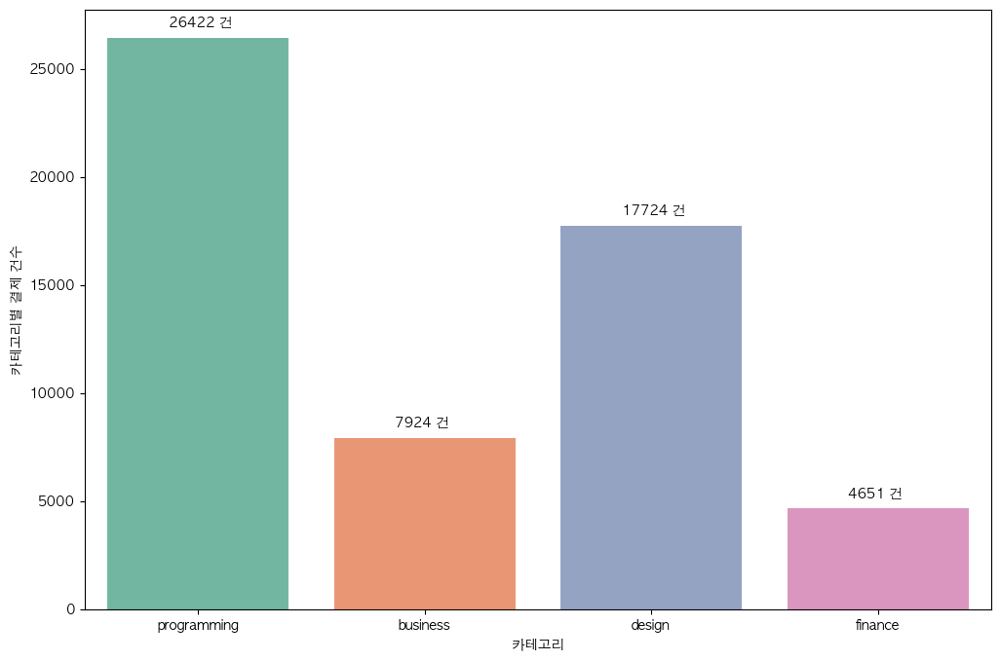

In [23]:
plt.figure(figsize=(12,8))
ax2 = sns.countplot(x=df['big_category_title'], palette="Set2")
plt.xlabel('카테고리')
plt.ylabel('카테고리별 결제 건수')

for p in ax2.patches:
        ax2.annotate('{} 건'.format(p.get_height()), (p.get_x() + 0.27, p.get_height() + 500))

## 월별

### Payment

#### 월별 결제 건수

In [24]:
# data
df_m_pm = df.groupby('month').agg({"is_payment" : "sum"}).reset_index()
df_m_pm['month_text'] = df_m_pm['month'].apply(lambda x: calendar.month_abbr[x])
df_m_pm['text'] = df_m_pm['month_text'] + ' - ' + df_m_pm['is_payment'].astype(str) 

df_w_pm = df.groupby('week').agg({"is_payment" : "sum"}).reset_index()
df_q_pm = df.groupby('quarter').agg({"is_payment" : "sum"}).reset_index()

# chart color
df_m_pm['color'] = '#e8daff'
df_m_pm['color'][:-1] = '#f6f2ff'
df_m_pm['color'][:-1:2] = '#e8daff'
df_w_pm['color'] = '#f6f2ff'

# chart
fig = make_subplots(rows=2, cols=2, vertical_spacing=0.08,
                    row_heights=[0.7, 0.3], 
                    specs=[[{"type": "bar"}, {"type": "pie"}],
                           [{"colspan": 2}, None]],
                    column_widths=[0.7, 0.3],
                    subplot_titles=("Month wise Number of Payment Analysis", "Quarter wise Number of Payment Analysis", 
                                    "Week wise Number of Payment Analysis"))

fig.add_trace(go.Bar(x=df_m_pm['is_payment'],
                     y=df_m_pm['month'],
                     marker=dict(color= df_m_pm['color']),
                     text=df_m_pm['text'],
                     textposition='auto',
                     name='Month',
                     orientation='h'
                    ), 
              row=1, col=1
             )

fig.add_trace(go.Pie(values=df_q_pm['is_payment'], 
                     labels=df_q_pm['quarter'], 
                     name='Quarter',
                     marker=dict(colors=['#e8daff','#d4bbff','#be95ff','#a56eff','#8a3ffc']), 
                     hole=0.7,
                     hoverinfo='label+percent+value', 
                     textinfo='label+percent'), 
                     row=1, col=2)

fig.add_trace(go.Scatter(x=df_w_pm['week'], 
                         y=df_w_pm['is_payment'], 
                         mode='lines+markers', 
                         fill='tozeroy', 
                         fillcolor='#f6f2ff',
                         marker=dict(color= '#be95ff'), 
                         name='Week'
                        ), 
              row=2, col=1
             )

# styling
fig.update_yaxes(visible=False, row=1, col=1)
fig.update_xaxes(visible=False, row=1, col=1)
fig.update_xaxes(tickmode = 'array', tickvals=df_w_pm.week, ticktext=[i for i in range(1,53)], 
                 row=2, col=1)
fig.update_yaxes(visible=False, row=2, col=1)
fig.update_layout(height=750, bargap=0.15,
                  margin=dict(b=0,r=20,l=20), 
                  title_text="Number of Payment Analysis",
                  template="plotly_white",
                  title_font=dict(size=25, color='#8a8d93', family="Lato, sans-serif"),
                  font=dict(color='#8a8d93'),
                  hoverlabel=dict(bgcolor="#f2f2f2", font_size=13, font_family="Lato, sans-serif"),
                  showlegend=False)
fig.show()

/var/folders/1s/mrvvgvcn7yd0tr741bvy1z_r0000gn/T/ipykernel_1836/302055241.py:11: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/var/folders/1s/mrvvgvcn7yd0tr741bvy1z_r0000gn/T/ipykernel_1836/302055241.py:12: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



#### 월별 매출금액

In [25]:
df[payment].groupby('month').agg({"transaction_amount" : "sum"}).reset_index()

,month,transaction_amount
0,3,235919990
1,4,1387643596
2,5,1226717911
3,6,1411925695
4,7,1650138751
5,8,1583177289
6,9,1136283180


In [26]:
# data
df_m_pm_tp = df[payment].groupby('month').agg({"transaction_amount" : "sum"}).reset_index()
df_m_pm_tp['month_text'] = df_m_pm_tp['month'].apply(lambda x: calendar.month_abbr[x])
df_m_pm_tp['text'] = df_m_pm_tp['month_text'] + ' - ' + df_m_pm_tp['transaction_amount'].astype(str) 

# Use the hovertext kw argument for hover text
fig = go.Figure(data=[go.Bar(x=df_m_pm_tp['month_text'], 
                             y=df_m_pm_tp['transaction_amount'],
                             text=df_m_pm_tp['text']
                             )])

# Customize aspect
fig.update_traces(marker_color='rgb(158,202,225)', 
                  marker_line_color='rgb(8,48,107)',
                  marker_line_width=1.5, opacity=0.6)

fig.update_layout(title_text='2021, Monthly Sales Amount Report')
fig.show()

#### 월별 category

In [27]:
df[payment].groupby('big_category_title').size()

big_category_title
business        7572
design         16420
finance         4394
programming    24514
dtype: int64

In [28]:
df_m_pm_ct_p = df[payment].groupby('month').agg({"is_programming" : "sum"}).reset_index()
df_m_pm_ct_p['month_text'] = df_m_pm_ct_p['month'].apply(lambda x: calendar.month_abbr[x])

df_m_pm_ct_d = df[payment].groupby('month').agg({"is_design" : "sum"}).reset_index()
df_m_pm_ct_d['month_text'] = df_m_pm_ct_d['month'].apply(lambda x: calendar.month_abbr[x])

df_m_pm_ct_b = df[payment].groupby('month').agg({"is_business" : "sum"}).reset_index()
df_m_pm_ct_b['month_text'] = df_m_pm_ct_b['month'].apply(lambda x: calendar.month_abbr[x])

df_m_pm_ct_f = df[payment].groupby('month').agg({"is_finance" : "sum"}).reset_index()
df_m_pm_ct_f['month_text'] = df_m_pm_ct_f['month'].apply(lambda x: calendar.month_abbr[x])

data1 = go.Bar(x=df_m_pm_ct_p['month_text'], 
               y=df_m_pm_ct_p['is_programming'], 
               name='programming', 
               text=df_m_pm_ct_p["is_programming"])

data2 = go.Bar(x=df_m_pm_ct_d['month_text'], 
               y=df_m_pm_ct_d['is_design'], 
               name='design',
               text=df_m_pm_ct_d["is_design"])

data3 = go.Bar(x=df_m_pm_ct_b['month_text'], 
               y=df_m_pm_ct_b['is_business'], 
               name='business',
               text=df_m_pm_ct_b["is_business"])

data4 = go.Bar(x=df_m_pm_ct_f['month_text'], 
               y=df_m_pm_ct_f['is_finance'], 
               name='finance',
               text=df_m_pm_ct_f["is_finance"])

layout = go.Layout(title='Population', barmode='stack') # Title 설정 & Stack으로 그리기
 
# 생성된 Bar 클래스를 리스트로 만들어 data 인자로 설정
fig = go.Figure(data=[data1, data2, data3, data4], layout=layout)

fig.update_layout(title_text='2021 Payment, Monthly Category Report')
fig.show()

#### 월별 Course id Top 10

In [29]:
df_m_pm_ci_t10_3 = df.loc[payment & mar, "course_id"].value_counts().head(10).to_frame().reset_index()
df_m_pm_ci_t10_3.columns = ['course_id', 'total']
df_m_pm_ci_t10_3["course_id"] = df_m_pm_ci_t10_3["course_id"].astype(str)

df_m_pm_ci_t10_4 = df.loc[payment & apr, "course_id"].value_counts().head(10).to_frame().reset_index()
df_m_pm_ci_t10_4.columns = ['course_id', 'total']
df_m_pm_ci_t10_4["course_id"] = df_m_pm_ci_t10_4["course_id"].astype(str)

df_m_pm_ci_t10_5 = df.loc[payment & may, "course_id"].value_counts().head(10).to_frame().reset_index()
df_m_pm_ci_t10_5.columns = ['course_id', 'total']
df_m_pm_ci_t10_5["course_id"] = df_m_pm_ci_t10_5["course_id"].astype(str)

df_m_pm_ci_t10_6 = df.loc[payment & jun, "course_id"].value_counts().head(10).to_frame().reset_index()
df_m_pm_ci_t10_6.columns = ['course_id', 'total']
df_m_pm_ci_t10_6["course_id"] = df_m_pm_ci_t10_6["course_id"].astype(str)

df_m_pm_ci_t10_7 = df.loc[payment & jul, "course_id"].value_counts().head(10).to_frame().reset_index()
df_m_pm_ci_t10_7.columns = ['course_id', 'total']
df_m_pm_ci_t10_7["course_id"] = df_m_pm_ci_t10_7["course_id"].astype(str)

df_m_pm_ci_t10_8 = df.loc[payment & aug, "course_id"].value_counts().head(10).to_frame().reset_index()
df_m_pm_ci_t10_8.columns = ['course_id', 'total']
df_m_pm_ci_t10_8["course_id"] = df_m_pm_ci_t10_8["course_id"].astype(str)

df_m_pm_ci_t10_9 = df.loc[payment & sep, "course_id"].value_counts().head(10).to_frame().reset_index()
df_m_pm_ci_t10_9.columns = ['course_id', 'total']
df_m_pm_ci_t10_9["course_id"] = df_m_pm_ci_t10_9["course_id"].astype(str)

fig = make_subplots(rows=2, cols=4, shared_yaxes=True)

fig.add_trace(go.Bar(x=df_m_pm_ci_t10_3['course_id'], y=df_m_pm_ci_t10_3['total'], name="Mar"),1, 1)
fig.add_trace(go.Bar(x=df_m_pm_ci_t10_4['course_id'], y=df_m_pm_ci_t10_4['total'], name="Apr"), 1, 2)
fig.add_trace(go.Bar(x=df_m_pm_ci_t10_5['course_id'], y=df_m_pm_ci_t10_5['total'], name="May"), 1, 3)
fig.add_trace(go.Bar(x=df_m_pm_ci_t10_6['course_id'], y=df_m_pm_ci_t10_6['total'], name="Jun"), 1, 4)
fig.add_trace(go.Bar(x=df_m_pm_ci_t10_7['course_id'], y=df_m_pm_ci_t10_7['total'], name="Jul"), 2, 1)
fig.add_trace(go.Bar(x=df_m_pm_ci_t10_8['course_id'], y=df_m_pm_ci_t10_8['total'], name="Aug"), 2, 2)
fig.add_trace(go.Bar(x=df_m_pm_ci_t10_9['course_id'], y=df_m_pm_ci_t10_9['total'], name="Sep"), 2, 3)
fig.update_traces(marker_line_width=1.5, opacity=0.6)

fig.update_layout(title_text='2021 Payment, Monthly Course ID Report'
                 )
fig.show()

#### 월별 Course title

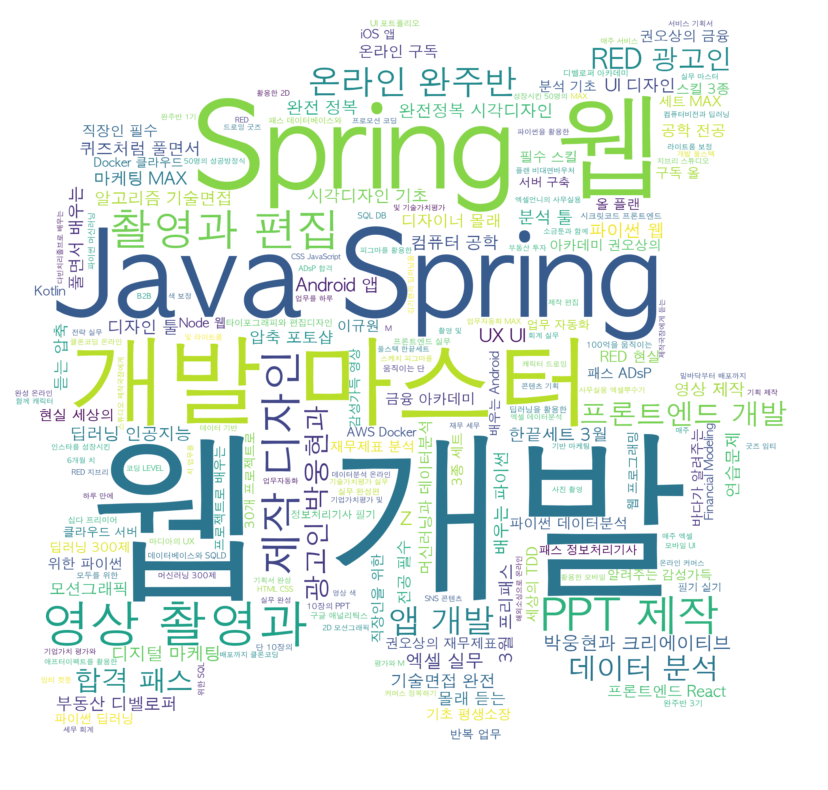

In [30]:
# 3월
text = " ".join(i for i in df.loc[mar,'course_title'])

stopwords = set(STOPWORDS)
stopwords.add("올인원")
stopwords.add("초격차")
stopwords.add("패키지")
stopwords.add("번에")
stopwords.add("한번에")
stopwords.add("끝내는")
stopwords.add("한")

img = Image.open('mar.jpeg')
img_array = np.array(img)

wordcloud = WordCloud(font_path='AppleGothic',
                      background_color="white",
                      width=400, 
                      height=400, 
                      scale=2.0, 
                      max_font_size=250, 
                      mask=img_array,
                      stopwords=stopwords).generate(text)

plt.figure( figsize=(15,10))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis("off")
plt.show()

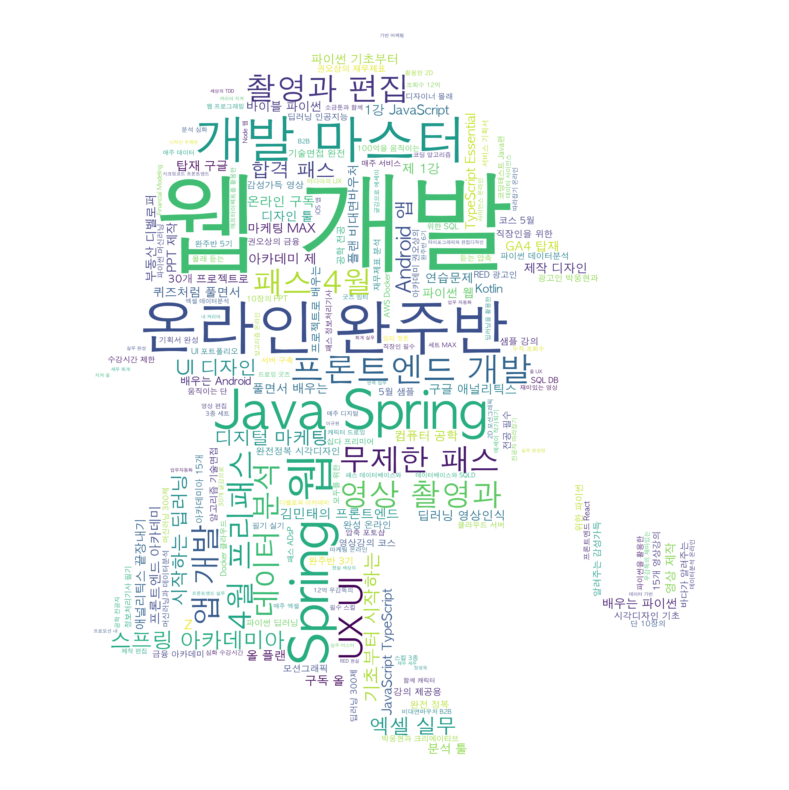

In [31]:
# 4월
text = " ".join(i for i in df.loc[apr,'course_title'])

stopwords = set(STOPWORDS)
stopwords.add("올인원")
stopwords.add("초격차")
stopwords.add("패키지")
stopwords.add("번에")
stopwords.add("한번에")
stopwords.add("끝내는")
stopwords.add("한")

img = Image.open('apr.png')
img_array = np.array(img)

wordcloud = WordCloud(font_path='AppleGothic',
                      background_color="white",
                      width=400, 
                      height=400, 
                      scale=2.0, 
                      max_font_size=250, 
                      mask=img_array,
                      stopwords=stopwords).generate(text)

plt.figure( figsize=(15,10))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis("off")
plt.show()

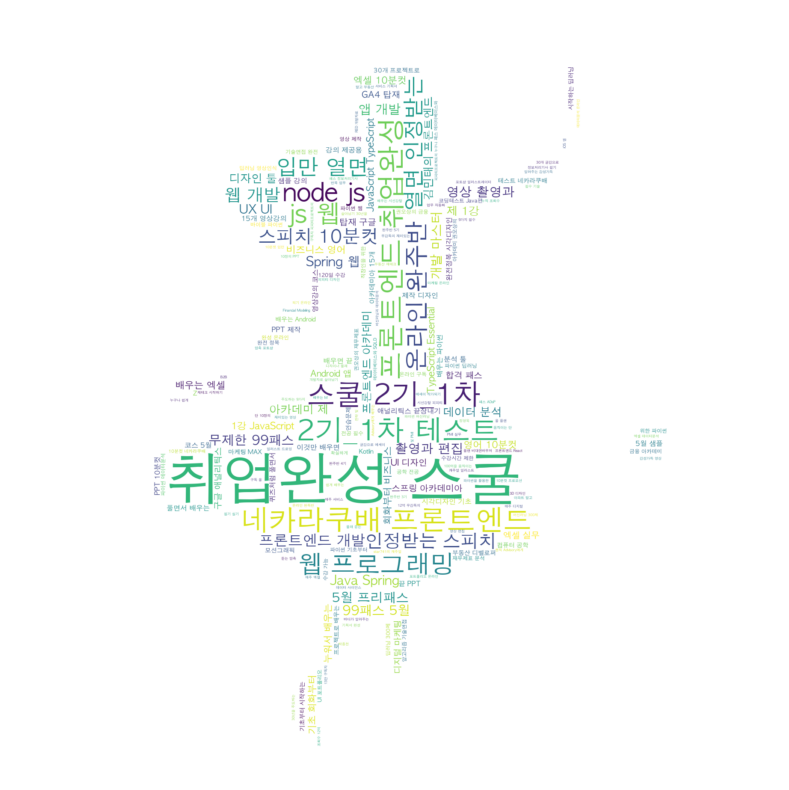

In [32]:
# 5월
text = " ".join(i for i in df.loc[may,'course_title'])

stopwords = set(STOPWORDS)
stopwords.add("올인원")
stopwords.add("초격차")
stopwords.add("패키지")
stopwords.add("번에")
stopwords.add("한번에")
stopwords.add("끝내는")
stopwords.add("한")

img = Image.open('may.png')
img_array = np.array(img)

wordcloud = WordCloud(font_path='AppleGothic',
                      background_color="white",
                      width=400, 
                      height=400, 
                      scale=2.0, 
                      max_font_size=250, 
                      mask=img_array,
                      stopwords=stopwords).generate(text)

plt.figure( figsize=(15,10))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis("off")
plt.show()

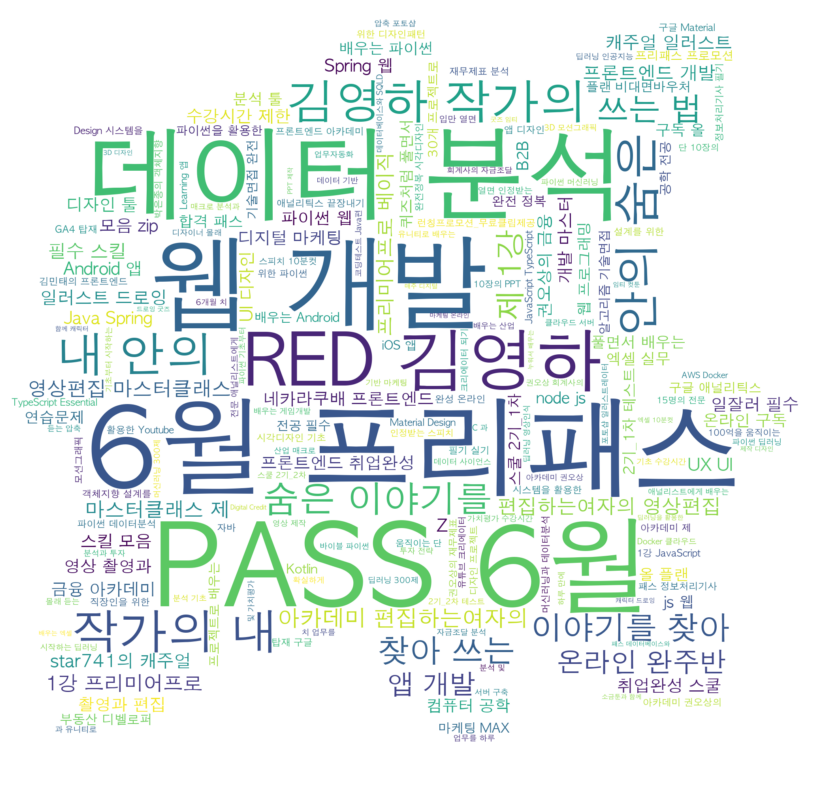

In [33]:
# 6월
text = " ".join(i for i in df.loc[jun,'course_title'])

stopwords = set(STOPWORDS)
stopwords.add("올인원")
stopwords.add("초격차")
stopwords.add("패키지")
stopwords.add("번에")
stopwords.add("한번에")
stopwords.add("끝내는")
stopwords.add("한")

img = Image.open('mar.jpeg')
img_array = np.array(img)

wordcloud = WordCloud(font_path='AppleGothic',
                      background_color="white",
                      width=400, 
                      height=400, 
                      scale=2.0, 
                      max_font_size=250, 
                      mask=img_array,
                      stopwords=stopwords).generate(text)

plt.figure( figsize=(15,10))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis("off")
plt.show()

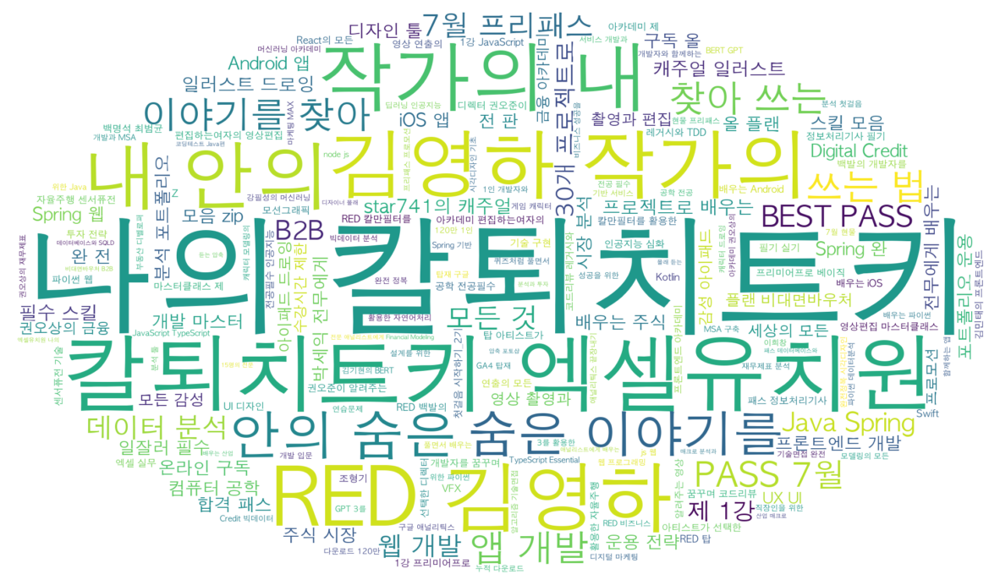

In [34]:
# 7월
text = " ".join(i for i in df.loc[jul,'course_title'])

stopwords = set(STOPWORDS)
stopwords.add("올인원")
stopwords.add("초격차")
stopwords.add("패키지")
stopwords.add("번에")
stopwords.add("한번에")
stopwords.add("끝내는")
stopwords.add("한")

img = Image.open('jul.png')
img_array = np.array(img)

wordcloud = WordCloud(font_path='AppleGothic',
                      background_color="white",
                      width=400, 
                      height=400, 
                      scale=2.0, 
                      max_font_size=250, 
                      mask=img_array,
                      stopwords=stopwords).generate(text)

plt.figure( figsize=(15,10))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis("off")
plt.show()

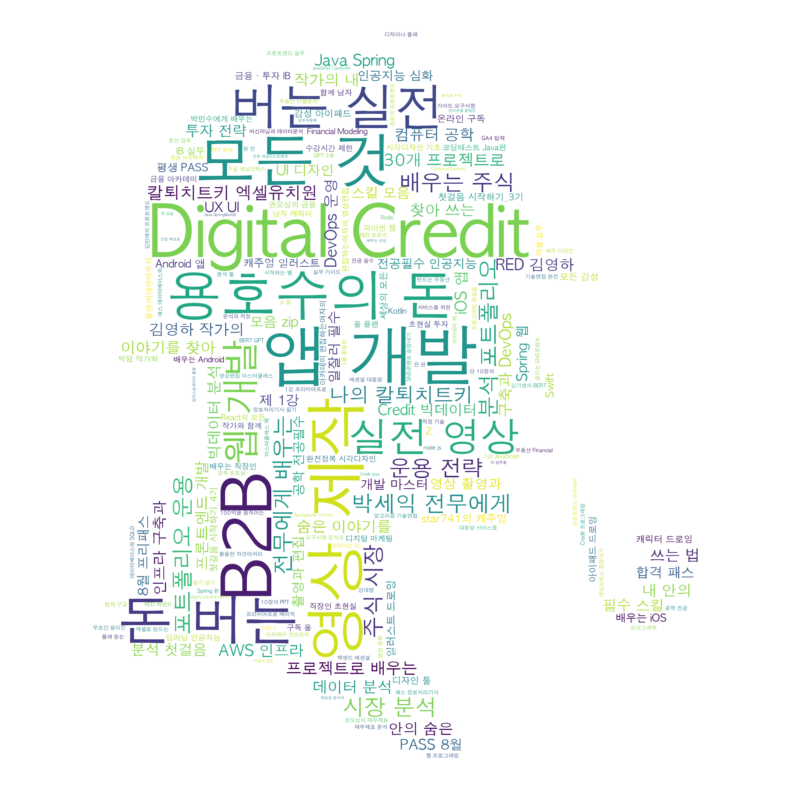

In [35]:
# 8월
text = " ".join(i for i in df.loc[aug,'course_title'])

stopwords = set(STOPWORDS)
stopwords.add("올인원")
stopwords.add("초격차")
stopwords.add("패키지")
stopwords.add("번에")
stopwords.add("한번에")
stopwords.add("끝내는")
stopwords.add("한")

img = Image.open('apr.png')
img_array = np.array(img)

wordcloud = WordCloud(font_path='AppleGothic',
                      background_color="white",
                      width=400, 
                      height=400, 
                      scale=2.0, 
                      max_font_size=250, 
                      mask=img_array,
                      stopwords=stopwords).generate(text)

plt.figure( figsize=(15,10))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis("off")
plt.show()

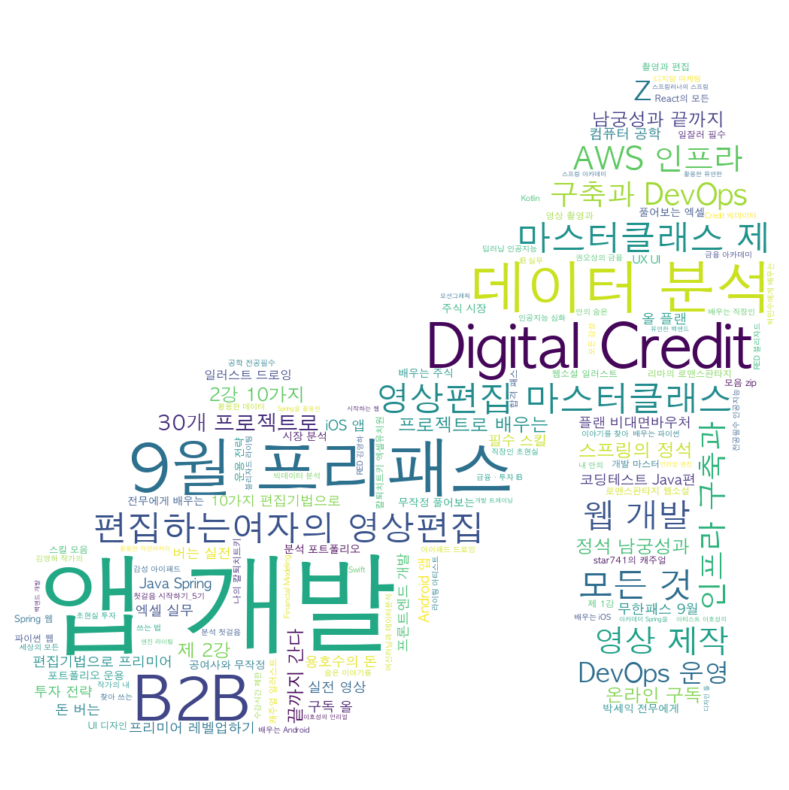

In [36]:
# 9월
text = " ".join(i for i in df.loc[sep,'course_title'])

stopwords = set(STOPWORDS)
stopwords.add("올인원")
stopwords.add("초격차")
stopwords.add("패키지")
stopwords.add("번에")
stopwords.add("한번에")
stopwords.add("끝내는")
stopwords.add("한")

img = Image.open('sep.png')
img_array = np.array(img)

wordcloud = WordCloud(font_path='AppleGothic',
                      background_color="white",
                      width=1000, 
                      height=1000, 
                      scale=2.0, 
                      max_font_size=200,
                      mask=img_array,
                      stopwords=stopwords).generate(text)

plt.figure( figsize=(15,10))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis("off")
plt.show()

### Refund

#### 월별 환불 건수

In [37]:
# data
df_m_rf = df.groupby('month').agg({"is_refund" : "sum"}).reset_index()
df_m_rf['month_text'] = df_m_rf['month'].apply(lambda x: calendar.month_abbr[x])
df_m_rf['text'] = df_m_rf['month_text'] + ' - ' + df_m_rf['is_refund'].astype(str) 

df_w_rf = df.groupby('week').agg({"is_refund" : "sum"}).reset_index()
df_q_rf = df.groupby('quarter').agg({"is_refund" : "sum"}).reset_index()
# chart color
color_set = ["#edf5ff", "#d0e2ff"]

df_m_rf['color'] = '#d0e2ff'
df_m_rf['color'][:-1] = '#edf5ff'
df_m_rf['color'][:-1:2] = '#d0e2ff'
df_w_rf['color'] = '#edf5ff'


# chart
fig = make_subplots(rows=2, cols=2, vertical_spacing=0.08,
                    row_heights=[0.7, 0.3], 
                    specs=[[{"type": "bar"}, {"type": "pie"}],
                           [{"colspan": 2}, None]],
                    column_widths=[0.7, 0.3],
                    subplot_titles=("Month wise Number of Refund Analysis", "Quarter wise Number of Refund Analysis", 
                                    "Week wise Number of Refund Analysis"))

fig.add_trace(go.Bar(x=df_m_rf['is_refund'], 
                     y=df_m_rf['month'], 
                     marker=dict(color= df_m_rf['color']),
                     text=df_m_rf['text'],
                     textposition='auto',
                     name='Month', 
                     orientation='h'
                    ), 
              row=1, col=1
             )

fig.add_trace(go.Pie(values=df_q_rf['is_refund'], 
                     labels=df_q_rf['quarter'], 
                     name='Quarter',
                     marker=dict(colors=['#edf5ff','#a6c8ff','#4589ff','#0043ce','#001d6c']), 
                     hole=0.7,
                     hoverinfo='label+percent+value', 
                     textinfo='label+percent'
                    ), 
              row=1, col=2
             )

fig.add_trace(go.Scatter(x=df_w_rf['week'], 
                         y=df_w_rf['is_refund'], 
                         mode='lines+markers', 
                         fill='tozeroy', 
                         fillcolor='#edf5ff',
                         marker=dict(color= '#78a9ff'), 
                         name='Week'
                        ), 
              row=2, col=1
             )

# styling
fig.update_yaxes(visible=False, row=1, col=1)
fig.update_xaxes(visible=False, row=1, col=1)
fig.update_xaxes(tickmode = 'array', tickvals=df_w_rf.week, ticktext=[i for i in range(1,53)], 
                 row=2, col=1)
fig.update_yaxes(visible=False, row=2, col=1)
fig.update_layout(height=750, bargap=0.15,
                  margin=dict(b=0,r=20,l=20), 
                  title_text="Number of Refund Analysis",
                  template="plotly_white",
                  title_font=dict(size=25, color='#8a8d93', family="Lato, sans-serif"),
                  font=dict(color='#8a8d93'),
                  hoverlabel=dict(bgcolor="#f2f2f2", font_size=13, font_family="Lato, sans-serif"),
                  showlegend=False)
fig.show()

/var/folders/1s/mrvvgvcn7yd0tr741bvy1z_r0000gn/T/ipykernel_1836/3545505822.py:12: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/var/folders/1s/mrvvgvcn7yd0tr741bvy1z_r0000gn/T/ipykernel_1836/3545505822.py:13: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



#### 월별 환불 금액

In [38]:
df[refund].groupby('month').agg({"transaction_amount" : "sum"}).abs().reset_index()

,month,transaction_amount
0,3,14512846
1,4,118581045
2,5,97439978
3,6,84373525
4,7,100181361
5,8,114706202
6,9,99928998


In [39]:
# data
df_m_pm_tr = df[refund].groupby('month').agg({"transaction_amount" : "sum"}).abs().reset_index()
df_m_pm_tr['month_text'] = df_m_pm_tr['month'].apply(lambda x: calendar.month_abbr[x])
df_m_pm_tr['text'] = df_m_pm_tr['month_text'] + ' - ' + df_m_pm_tr['transaction_amount'].astype(str) 

# Use the hovertext kw argument for hover text
fig = go.Figure(data=[go.Bar(x=df_m_pm_tr['month_text'], 
                             y=df_m_pm_tr['transaction_amount'],
                             text=df_m_pm_tr['text']
                             )])

# Customize aspect
fig.update_traces(marker_color='rgb(158,202,225)', 
                  marker_line_color='rgb(8,48,107)',
                  marker_line_width=1.5, opacity=0.6)

fig.update_layout(title_text='2021, Monthly refund amount')
fig.show()

#### 월별 카테고리

In [40]:
df_m_rf_ct_p = df[refund].groupby('month').agg({"is_programming" : "sum"}).reset_index()
df_m_rf_ct_p['month_text'] = df_m_rf_ct_p['month'].apply(lambda x: calendar.month_abbr[x])

df_m_rf_ct_d = df[refund].groupby('month').agg({"is_design" : "sum"}).reset_index()
df_m_rf_ct_d['month_text'] = df_m_rf_ct_d['month'].apply(lambda x: calendar.month_abbr[x])

df_m_rf_ct_b = df[refund].groupby('month').agg({"is_business" : "sum"}).reset_index()
df_m_rf_ct_b['month_text'] = df_m_rf_ct_b['month'].apply(lambda x: calendar.month_abbr[x])

df_m_rf_ct_f = df[refund].groupby('month').agg({"is_finance" : "sum"}).reset_index()
df_m_rf_ct_f['month_text'] = df_m_rf_ct_f['month'].apply(lambda x: calendar.month_abbr[x])

data1 = go.Bar(x=df_m_rf_ct_p['month_text'], 
               y=df_m_rf_ct_p['is_programming'], 
               name='programming', 
               text=df_m_rf_ct_p["is_programming"])

data2 = go.Bar(x=df_m_rf_ct_d['month_text'], 
               y=df_m_rf_ct_d['is_design'], 
               name='design',
               text=df_m_rf_ct_d["is_design"])

data3 = go.Bar(x=df_m_rf_ct_b['month_text'], 
               y=df_m_rf_ct_b['is_business'], 
               name='business',
               text=df_m_rf_ct_b["is_business"])

data4 = go.Bar(x=df_m_rf_ct_f['month_text'], 
               y=df_m_rf_ct_f['is_finance'], 
               name='finance',
               text=df_m_rf_ct_f["is_finance"])

layout = go.Layout(title='Population', barmode='stack') # Title 설정 & Stack으로 그리기
 
# 생성된 Bar 클래스를 리스트로 만들어 data 인자로 설정
fig = go.Figure(data=[data1, data2, data3, data4], layout=layout)

fig.update_layout(title_text='2021 Refund, Monthly Category Report')
fig.show()

## 요일별

### 결제

In [41]:
# data
df_dw_pm = df.groupby('day_of_week').agg({"is_payment" : "sum"}).reset_index()

# chart
fig = px.bar(df_dw_pm, y='day_of_week', x='is_payment', 
             title='Number of Payment vs Day of Week',
             color="day_of_week",
             orientation="h", 
             color_discrete_sequence=['#e8daff','#f6f2ff'], text='is_payment',
             category_orders=dict(day_of_week=["Monday","Tuesday","Wednesday","Thursday", "Friday","Saturday","Sunday"]))
fig.update_yaxes(showgrid=False, ticksuffix=' ', showline=False)
fig.update_xaxes(visible=False)
fig.update_layout(margin=dict(t=60, b=0, l=0, r=0), height=350,
                  hovermode="y unified", 
                  yaxis_title=" ", template='plotly_white',
                  title_font=dict(size=25, color='#8a8d93', family="Lato, sans-serif"),
                  font=dict(color='#8a8d93'),
                  hoverlabel=dict(bgcolor="#c6ccd8", font_size=13, font_family="Lato, sans-serif"))

### 환불

In [42]:
# data
df_dw_rf = df.groupby('day_of_week').agg({"is_refund" : "sum"}).reset_index()

# chart
fig = px.bar(df_dw_rf, 
             y='day_of_week', 
             x='is_refund',
             title='Number of Refund vs Day of Week',
             color="day_of_week",
             orientation="h",
             color_discrete_sequence=['#d0e2ff','#edf5ff'],
             text='is_refund',
             category_orders=dict(day_of_week=["Monday","Tuesday","Wednesday","Thursday", "Friday","Saturday","Sunday"])
            )

fig.update_yaxes(showgrid=False, ticksuffix=' ', showline=False)
fig.update_xaxes(visible=False)
fig.update_layout(margin=dict(t=60, b=0, l=0, r=0), height=350,
                  hovermode="y unified", 
                  yaxis_title=" ", template='plotly_white',
                  title_font=dict(size=25, color='#8a8d93', family="Lato, sans-serif"),
                  font=dict(color='#8a8d93'),
                  hoverlabel=dict(bgcolor="#c6ccd8", font_size=13, font_family="Lato, sans-serif"))

## 시간대별

In [43]:
df3 = df[payment].groupby('hour').size().to_frame().reset_index()
df3.columns = ['hour', 'total']
df3.hour = df3.hour.astype(str)
df4 = df[refund].groupby('hour').size().to_frame().reset_index()
df4.columns = ['hour', 'total']
df4.hour = df4.hour.astype(str)

In [44]:

fig = go.Figure()

fig.add_trace(go.Bar(x=df3.hour, 
                     y=df3.total,
                     name='Payment',
                    text=df3.total))

fig.add_trace(go.Bar(x=df4.hour, 
                     y=df4.total,
                     name='Refund',
                     text=df4.total
                ))
fig.update_layout(title_text='2021 시간대별 결제 & 환불')
fig.show()

# 고객군별 매출 분석

## 전체 통계

### 고객군 구분 기준
- `format` column (온라인 강의의 기획 종류) 관련 데이터 살펴보기

In [45]:
# 0. df 복사
df1 = df.copy()

# 'format' column의 unique value들을 count
print(df1['format'].value_counts())
print("-"*30)
print(f"→ 'format' column에는 총 {len(df1['format'].unique())}개의 고유값이 존재함을 확인")

올인원        46542
RED         3383
온라인 완주반     1671
하루10분컷      1371
스쿨          1036
B2B 온라인      984
스쿨 온라인       643
B2B          485
B2G          434
이벤트           89
아카이브          35
캠프            25
MBA           23
Name: format, dtype: int64
------------------------------
→ 'format' column에는 총 13개의 고유값이 존재함을 확인


### 고객군 분류
- 'format' column의 값을 기준으로 고객군 분류
- 해당 column 값 각각의 의미를 모두 파악할 수 없는 상황이기 때문에, 통상적으로 사용하는 비즈니스 모델을 기준으로 B2B, B2G, B2C로 분류

In [46]:
def classify(x):
    if 'B2B' in x :
        return "B2B"
    elif 'B2G' in x :
        return "B2G"
    else:
        return "B2C"

df1['고객군'] = df1['format'].map(classify)
df1.head()

,index,id,customer_id,course_id,type,state,course_title,category_title,format,completed_at,...,is_programming,is_business,date,year,month,week,quarter,day_of_week,hour,고객군
0,2,970657,72297,204246,PAYMENT,COMPLETED,시크릿코드 : 프론트엔드 실무 완성편,프로그래밍,스쿨 온라인,2021-03-28 15:21:43,...,1,0,2021-03-28 15:21:43,2021,3,12,1,Sunday,15,B2C
1,4,970658,478028,201797,PAYMENT,COMPLETED,올인원 패키지 : 직장인 필수 스킬 3종 세트 MAX,업무 생산성,올인원,2021-03-28 15:21:54,...,0,1,2021-03-28 15:21:54,2021,3,12,1,Sunday,15,B2C
2,8,970669,478033,203178,PAYMENT,COMPLETED,초격차 패키지 : 한번에 끝내는 영상 촬영과 편집,영상/3D,올인원,2021-03-28 15:26:47,...,0,0,2021-03-28 15:26:47,2021,3,12,1,Sunday,15,B2C
3,10,970671,469860,203644,PAYMENT,COMPLETED,올인원 패키지 : 권오상의 금융 아카데미 - 권오상의 재무제표 분석 기초(평생소장),부동산/금융,올인원,2021-03-28 15:27:17,...,0,0,2021-03-28 15:27:17,2021,3,12,1,Sunday,15,B2C
4,14,970676,478035,203720,PAYMENT,COMPLETED,초격차 패키지 : 한 번에 끝내는 프론트엔드 개발,프로그래밍,올인원,2021-03-28 15:31:01,...,1,0,2021-03-28 15:31:01,2021,3,12,1,Sunday,15,B2C


In [47]:
df1.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 56721 entries, 0 to 56722
Data columns (total 34 columns):
 #   Column                  Non-Null Count  Dtype         
---  ------                  --------------  -----         
 0   index                   56721 non-null  int64         
 1   id                      56721 non-null  int64         
 2   customer_id             56721 non-null  int64         
 3   course_id               56721 non-null  int64         
 4   type                    56721 non-null  object        
 5   state                   56721 non-null  object        
 6   course_title            56721 non-null  object        
 7   category_title          56721 non-null  object        
 8   format                  56721 non-null  object        
 9   completed_at            56721 non-null  datetime64[ns]
 10  transaction_amount      56721 non-null  int64         
 11  coupon_title            23761 non-null  object        
 12  coupon_discount_amount  23761 non-null  float6

### 전체 결제/환불 내역

In [48]:
df_t = pd.pivot_table(data=df1, index=["type"], values=["transaction_amount"], aggfunc=["count", "sum"])
df_t.columns = ['결제 건수', '결제 총액']
df_t.index.names = ['결제 구분']
df_t = df_t.abs()
df_t

,결제 건수,결제 총액
결제 구분,,
PAYMENT,52900,8631806412
REFUND,3821,629723955


In [49]:
df_ti = df_t.index
df_tvc = df_t['결제 건수'].values.reshape(1,-1)[0]
df_tvs = df_t['결제 총액'].values.reshape(1,-1)[0]

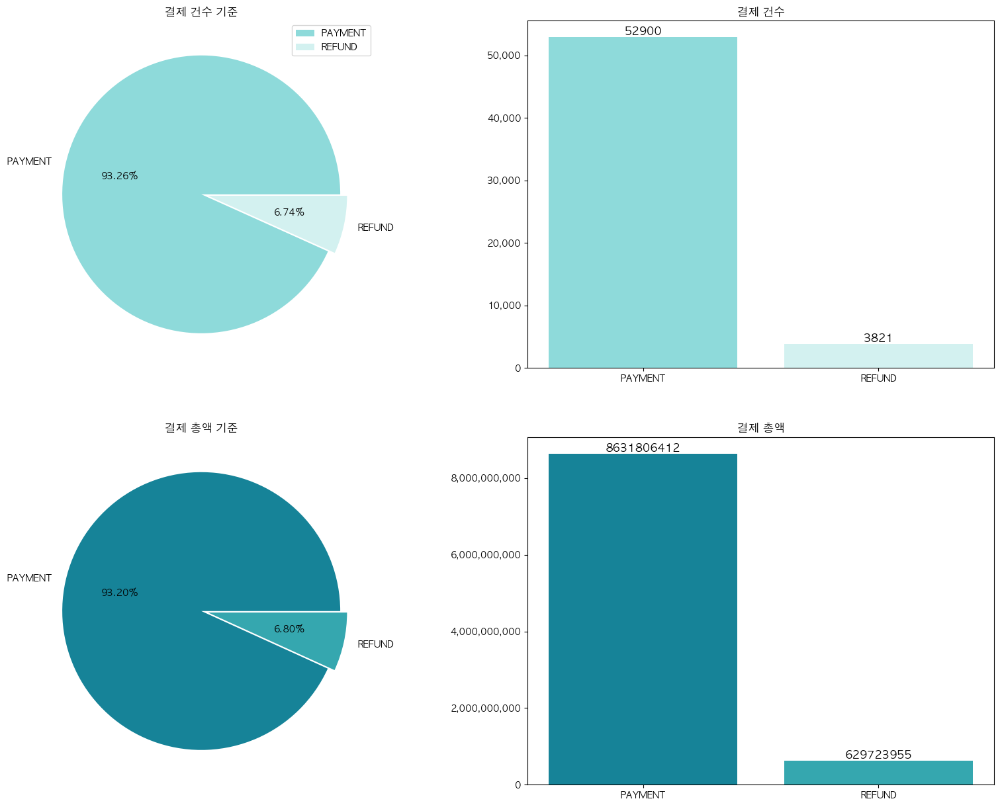

In [50]:
fig = plt.figure(figsize=(20,15))

graph1 = fig.add_subplot(2,2,1)
df_t['결제 건수'].plot.pie(explode=[0,0.05],autopct='%1.2f%%',ax=graph1, colors =  ['#8EDADA','#D3F1F0'])
graph1.set_title('결제 건수 기준')
graph1.set_ylabel('')
plt.legend(df_ti, loc = 'best')

graph2 = fig.add_subplot(2,2,2)
bar2 = plt.bar(df_ti, df_tvc, color =  ['#8EDADA','#D3F1F0'])
graph2.set_title('결제 건수')

for rect in bar2:
    height = rect.get_height()
    plt.text(rect.get_x() + rect.get_width()/2.0, height, '%.0f' % height, ha='center', va='bottom', size = 12)

graph2.get_yaxis().set_major_formatter(
    tkr.FuncFormatter(lambda x, p: format(int(x), ',')))


graph3 = fig.add_subplot(2,2,3)
df_t['결제 총액'].plot.pie(explode=[0,0.05],autopct='%1.2f%%',ax=graph3, colors =  ['#168398','#35A7AF'])
graph3.set_title('결제 총액 기준')
graph3.set_ylabel('')

graph4 = fig.add_subplot(2,2,4)
bar4 = plt.bar(df_ti, df_tvs, color =  ['#168398','#35A7AF'])
graph4.set_title('결제 총액')

for rect in bar4:
    height = rect.get_height()
    plt.text(rect.get_x() + rect.get_width()/2.0, height, '%.0f' % height, ha='center', va='bottom', size = 12)

graph4.get_yaxis().set_major_formatter(
    tkr.FuncFormatter(lambda x, p: format(int(x), ',')))


plt.show(fig)

In [51]:
all_payment = len(df1['type'])
payment_completed = len(df1[df1['type'] == 'PAYMENT'])
refund_completed = len(df1[df1['type'] == 'REFUND'])

print(f"전체 결제 건수는 {all_payment}건 입니다.")
print(f"전체 결제 완료 건수는 {payment_completed}건이며, 약 {round(payment_completed/all_payment * 100,2)}% 입니다.")
print(f"전체 환불 완료 건수는 {refund_completed}건이며, 약 {round(refund_completed/all_payment * 100,2)}% 입니다.")

전체 결제 건수는 56721건 입니다.
전체 결제 완료 건수는 52900건이며, 약 93.26% 입니다.
전체 환불 완료 건수는 3821건이며, 약 6.74% 입니다.


### 고객군별 결제/환불 내역
- 정상 결제 완료 건에 대한 데이터 확인을 위한 처리

In [52]:
# 각 고객사별 결제 건수, 합계액, 평균 결제액 확인
df_bp = pd.pivot_table(data=df1[df1['type'] == 'PAYMENT'], index=['고객군'], values=['transaction_amount'], aggfunc=['count', 'sum', 'mean'])
df_bp.columns = ['건수', '합계액', '평균']
df_bp

,건수,합계액,평균
고객군,,,
B2B,1373,1988581099,1448347.49
B2C,51178,6611379013,129184.01
B2G,349,31846300,91250.14


In [53]:
# 각 고객사별 환불 건수, 합계액, 평균 환불액 확인
df_br = pd.pivot_table(data=df1[df1['type'] == 'REFUND'], index=['고객군'], values=['transaction_amount'], aggfunc=['count', 'sum', 'mean'])
df_br= df_br.abs()
df_br.columns = ['건수', '합계액', '평균']
df_br

,건수,합계액,평균
고객군,,,
B2B,96,7084990,73801.98
B2C,3640,619713965,170251.09
B2G,85,2925000,34411.76


In [54]:
### 전체 순매출 내역

In [55]:
# 각 고객사별 순매출 건수, 합계액, 평균 매출액 확인
df_b = df_bp.loc[:,['건수','합계액']] - df_br.loc[:,['건수','합계액']]
df_b['평균'] = df_b['합계액'] / df_b['건수']
df_b.columns = ['건수', '합계액', '평균']
df_b

,건수,합계액,평균
고객군,,,
B2B,1277,1981496109,1551680.59
B2C,47538,5991665048,126039.49
B2G,264,28921300,109550.38


In [56]:
BMI = df_b.index
BMCV = df_b['건수'].values.reshape(1,-1)[0]
BMSV = df_b['합계액'].values.reshape(1,-1)[0].round(2)
BMMV = df_b['평균'].values.reshape(1,-1)[0].round(2)

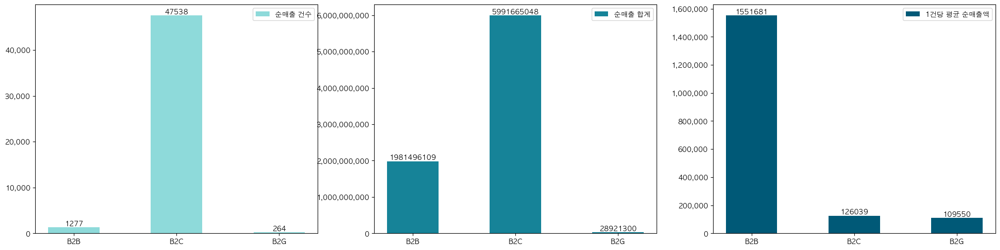

In [57]:
fig1 = plt.figure(figsize=(25,6))

spec = grs.GridSpec(ncols=3, nrows=1, width_ratios=[1, 1, 1])

# 1번째 barplot
ax1 = fig1.add_subplot(spec[0])
bar1 = plt.bar(BMI, BMCV, width = 0.5, color = '#8EDADA')
plt.legend(labels =['순매출 건수'], loc='best')
# plt.ylabel("판매량")
## 그래프에 숫자 삽입
for rect in bar1:
    height = rect.get_height()
    plt.text(rect.get_x() + rect.get_width()/2.0, height, '%.0f' % height, ha='center', va='bottom', size = 10)

ax1.get_yaxis().set_major_formatter(
    tkr.FuncFormatter(lambda x, p: format(int(x), ',')))

# 2번째 barplot
ax2 = fig1.add_subplot(spec[1])
bar2 = plt.bar(BMI, BMSV, width = 0.5, color = '#168398')
plt.legend(labels =['순매출 합계'], loc='best')
# plt.ylabel("판매 총액")
## 그래프에 숫자 삽입
for rect in bar2:
    height = rect.get_height()
    plt.text(rect.get_x() + rect.get_width()/2.0, height, '%.0f' % height, ha='center', va='bottom', size = 10)

ax2.get_yaxis().set_major_formatter(
    tkr.FuncFormatter(lambda x, p: format(int(x), ',')))


# 3번째 barplot
ax3 = fig1.add_subplot(spec[2])
bar3 = plt.bar(BMI, BMMV, width = 0.5, color = '#005977')
plt.legend(labels =['1건당 평균 순매출액'], loc='best')
# plt.ylabel("1건당 평균 판매액")
## 그래프에 숫자 삽입
for rect in bar3:
    height = rect.get_height()
    plt.text(rect.get_x() + rect.get_width()/2.0, height, '%.0f' % height, ha='center', va='bottom', size = 10)

ax3.get_yaxis().set_major_formatter(
    tkr.FuncFormatter(lambda x, p: format(int(x), ',')))

plt.show()

# Matplotlib : 축의 숫자를 천 단위로 표시 --> https://codesample-factory.tistory.com/1231   ,    https://zephyrus1111.tistory.com/178
# Matplotlib : plt 선, 바 그래프 위에 숫자, 값 표시하기 --> https://jimmy-ai.tistory.com/24

- `판매건`으로 보았을 때에는 <u>B2C > B2B > B2G</u> 순서 였으나, `1건당 판매액`을 기준으로는 <u>B2B > B2C > B2G</u> 순서임을 확인
- `판매건수` 혹은 `판매액`을 기준으로는 <u>B2G로의 판매가 상당히 저조</u>해 보이지만, `1건당 판매액`을 기준으로 보았을 때, <u>B2C에 비해 70%정도 되는 것</u>으로 파악됨.  
→ 추가적인 데이터를 살펴 <u>해당 채널을 통한 판매에 대한 마케팅의 증대 여부를 결정</u>해야 할 것으로 판단됨.  
   - ex) 마케팅에 소모되는 비용, 시간 등

## 월별 매출
- `completed_at` column : 온라인 강의의 기획 종류

In [58]:
# 결제 완료 시점 데이터 기준으로 년월(yyyy-mm)을 추출하여 별도 column으로 구분
df1['sale_time'] = df1['completed_at'].apply(lambda x : str(x)[2:7])
df1.head()

,index,id,customer_id,course_id,type,state,course_title,category_title,format,completed_at,...,is_business,date,year,month,week,quarter,day_of_week,hour,고객군,sale_time
0,2,970657,72297,204246,PAYMENT,COMPLETED,시크릿코드 : 프론트엔드 실무 완성편,프로그래밍,스쿨 온라인,2021-03-28 15:21:43,...,0,2021-03-28 15:21:43,2021,3,12,1,Sunday,15,B2C,21-03
1,4,970658,478028,201797,PAYMENT,COMPLETED,올인원 패키지 : 직장인 필수 스킬 3종 세트 MAX,업무 생산성,올인원,2021-03-28 15:21:54,...,1,2021-03-28 15:21:54,2021,3,12,1,Sunday,15,B2C,21-03
2,8,970669,478033,203178,PAYMENT,COMPLETED,초격차 패키지 : 한번에 끝내는 영상 촬영과 편집,영상/3D,올인원,2021-03-28 15:26:47,...,0,2021-03-28 15:26:47,2021,3,12,1,Sunday,15,B2C,21-03
3,10,970671,469860,203644,PAYMENT,COMPLETED,올인원 패키지 : 권오상의 금융 아카데미 - 권오상의 재무제표 분석 기초(평생소장),부동산/금융,올인원,2021-03-28 15:27:17,...,0,2021-03-28 15:27:17,2021,3,12,1,Sunday,15,B2C,21-03
4,14,970676,478035,203720,PAYMENT,COMPLETED,초격차 패키지 : 한 번에 끝내는 프론트엔드 개발,프로그래밍,올인원,2021-03-28 15:31:01,...,0,2021-03-28 15:31:01,2021,3,12,1,Sunday,15,B2C,21-03


In [59]:
# 월별 매출 집계

how = {
    'transaction_amount':np.sum
}

df_S = df1.groupby(['sale_time']).agg(how)
df_S = df_S.rename(columns={ 'transaction_amount':'매출 합계액'})
df_S.index.names = ['판매 시기']
df_S

,매출 합계액
판매 시기,
21-03,221407144
21-04,1269062551
21-05,1129277933
21-06,1327552170
21-07,1549957390
21-08,1468471087
21-09,1036354182


In [60]:
ST = df_S.index
SV= df_S.values.reshape(1,-1)[0]

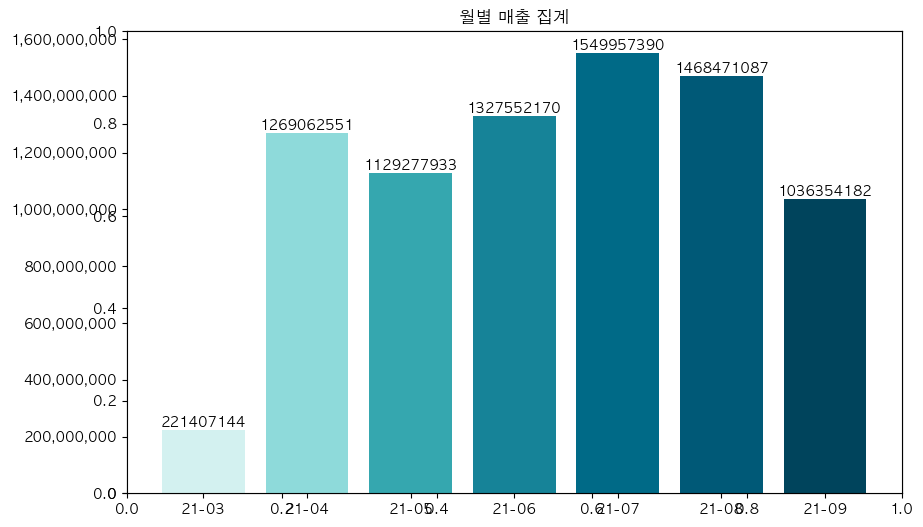

In [61]:
fig2 = plt.figure(figsize=(10,6))
plt.title('월별 매출 집계')
ax4 = fig2.add_subplot(1, 1, 1)
bar4= plt.bar(ST, SV, color = ['#D3F1F0', '#8EDADA', '#35A7AF', '#168398', '#006A87', '#005977', '#00445C'])

for rect in bar4:
    height = rect.get_height()
    plt.text(rect.get_x() + rect.get_width()/2.0, height, '%.0f' % height, ha='center', va='bottom', size = 10)

ax4.get_yaxis().set_major_formatter(
    tkr.FuncFormatter(lambda x, p: format(int(x), ',')))

plt.show()

### 고객군별 월별 매출

In [62]:
# 고객군별 월별 매출 집계


how = {
    'transaction_amount':np.sum
}

df_BM_S = df1.groupby(['고객군', 'sale_time']).agg(how)
df_BM_S = df_BM_S.rename(columns={'transaction_amount':'매출 합계액'})
df_BM_S

매출 합계액
고객군 sale_time            
B2B 21-03        28926150
    21-04       399116216
    21-05       231239729
    21-06       351726650
    21-07       422510829
    21-08       291946505
    21-09       256030030
B2C 21-03       192480994
    21-04       869946335
    21-05       898038204
    21-06       975825520
    21-07      1126587271
    21-08      1151990772
    21-09       776795952
B2G 21-07          859290
    21-08        24533810
    21-09         3528200

In [63]:
BMC = df_BM_S.index.get_level_values(0).drop_duplicates()
BMT = df_BM_S.index.get_level_values(1).drop_duplicates()
B2B_V= df_BM_S.loc['B2B'].values.reshape(1,-1)[0]
B2C_V= df_BM_S.loc['B2C'].values.reshape(1,-1)[0]
B2G_V= np.append(np.array([0,0,0,0]), df_BM_S.loc['B2G'].values.reshape(1,-1)[0])

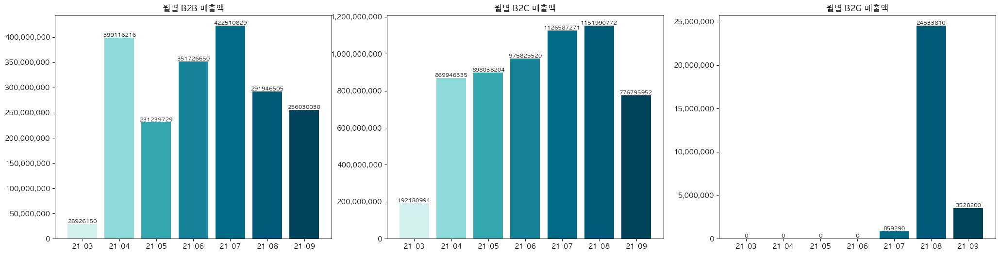

In [64]:
fig3 = plt.figure(figsize=(25,6))

ax5 = plt.subplot(1, 3, 1)
plt.title("월별 B2B 매출액")
bar5 = plt.bar(BMT, B2B_V, color = ['#D3F1F0', '#8EDADA', '#35A7AF', '#168398', '#006A87', '#005977', '#00445C'])

for rect in bar5:
    height = rect.get_height()
    plt.text(rect.get_x() + rect.get_width()/2.0, height, '%.0f' % height, ha='center', va='bottom', size = 8)

ax5.get_yaxis().set_major_formatter(
    tkr.FuncFormatter(lambda x, p: format(int(x), ',')))

ax6 = plt.subplot(1, 3, 2)
plt.title("월별 B2C 매출액")
bar6 = plt.bar(BMT, B2C_V, color = ['#D3F1F0', '#8EDADA', '#35A7AF', '#168398', '#006A87', '#005977', '#00445C'])

for rect in bar6:
    height = rect.get_height()
    plt.text(rect.get_x() + rect.get_width()/2.0, height, '%.0f' % height, ha='center', va='bottom', size = 8)

ax6.get_yaxis().set_major_formatter(
    tkr.FuncFormatter(lambda x, p: format(int(x), ',')))

ax7 = plt.subplot(1, 3, 3)
plt.title("월별 B2G 매출액")
bar7 = plt.bar(BMT, B2G_V, color = ['#D3F1F0', '#8EDADA', '#35A7AF', '#168398', '#006A87', '#005977', '#00445C'])

for rect in bar7:
    height = rect.get_height()
    plt.text(rect.get_x() + rect.get_width()/2.0, height, '%.0f' % height, ha='center', va='bottom', size = 8)

ax7.get_yaxis().set_major_formatter(
    tkr.FuncFormatter(lambda x, p: format(int(x), ',')))

plt.show()

### 카테고리별 매출
- `category_title` column : 대분류

In [65]:
df1['category_title'].value_counts()

프로그래밍      19063
데이터사이언스     7359
업무 생산성      6968
디자인         6174
영상/3D       5519
마케팅         5077
부동산/금융      3012
투자/재테크      1597
크리에이티브       954
교육           932
비즈니스          24
지식콘텐츠         23
파이낸스          19
Name: category_title, dtype: int64

In [66]:
# 카테고리별 매출 집계

df_C = df1.groupby(['category_title']).agg(how)
df_C = df_C.rename(columns={ 'transaction_amount':'매출 합계액'})
df_C.index.names = ['강의 대분류']
df_C

,매출 합계액
강의 대분류,
교육,1160325545
데이터사이언스,1522882099
디자인,663198168
마케팅,734605824
부동산/금융,475644434
비즈니스,5389865
업무 생산성,595029425
영상/3D,544706205
지식콘텐츠,4970000


In [67]:
CT = df_C.index
CV = df_C.values.reshape(1,-1)[0]

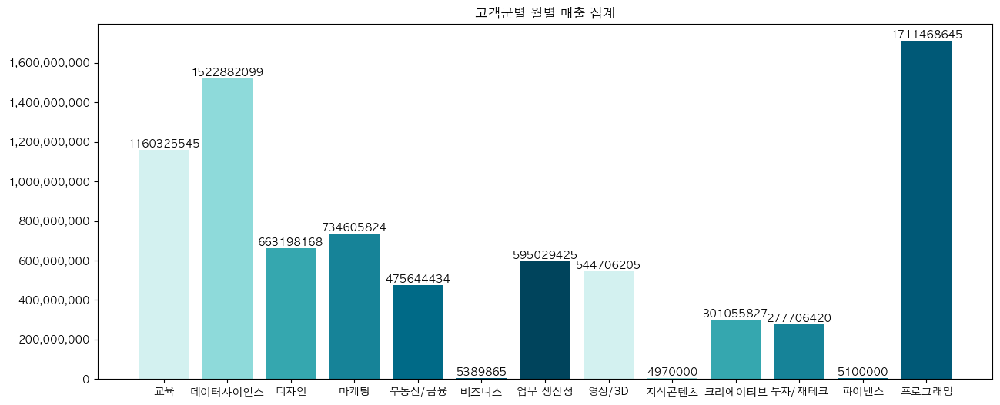

In [68]:
fig4 = plt.figure(figsize=(15,6))

ax8 = fig4.add_subplot(1, 1, 1)
plt.title('고객군별 월별 매출 집계')
bar8 = plt.bar(CT, CV, color = ['#D3F1F0', '#8EDADA', '#35A7AF', '#168398', '#006A87', '#005977', '#00445C'])

ax8.get_yaxis().set_major_formatter(
    tkr.FuncFormatter(lambda x, p: format(int(x), ',')))

for rect in bar8:
    height = rect.get_height()
    plt.text(rect.get_x() + rect.get_width()/2.0, height, '%.0f' % height, ha='center', va='bottom', size = 10)

plt.show()

### 고객군별 카테고리별 매출

In [69]:
# 고객군별 카테고리별 매출 집계

df_BM_C = df1.groupby(['고객군', 'category_title']).agg(how)
df_BM_C.index.names = ['고객군', '강의 대분류']
df_BM_C.columns=['매출 합계액']
df_BM_C

매출 합계액
고객군 강의 대분류             
B2B 교육       1160325545
    데이터사이언스   541879554
    마케팅       126982500
    부동산/금융      2177500
    비즈니스         360000
    업무 생산성     22505500
    크리에이티브     63073500
    파이낸스         480000
    프로그래밍      63712010
B2C 데이터사이언스   981002545
    디자인       663198168
    마케팅       587623324
    부동산/금융    473466934
    비즈니스        5029865
    업무 생산성    572523925
    영상/3D     544706205
    지식콘텐츠       4970000
    크리에이티브    237982327
    투자/재테크    277706420
    파이낸스        4620000
    프로그래밍    1638835335
B2G 마케팅        20000000
    프로그래밍       8921300

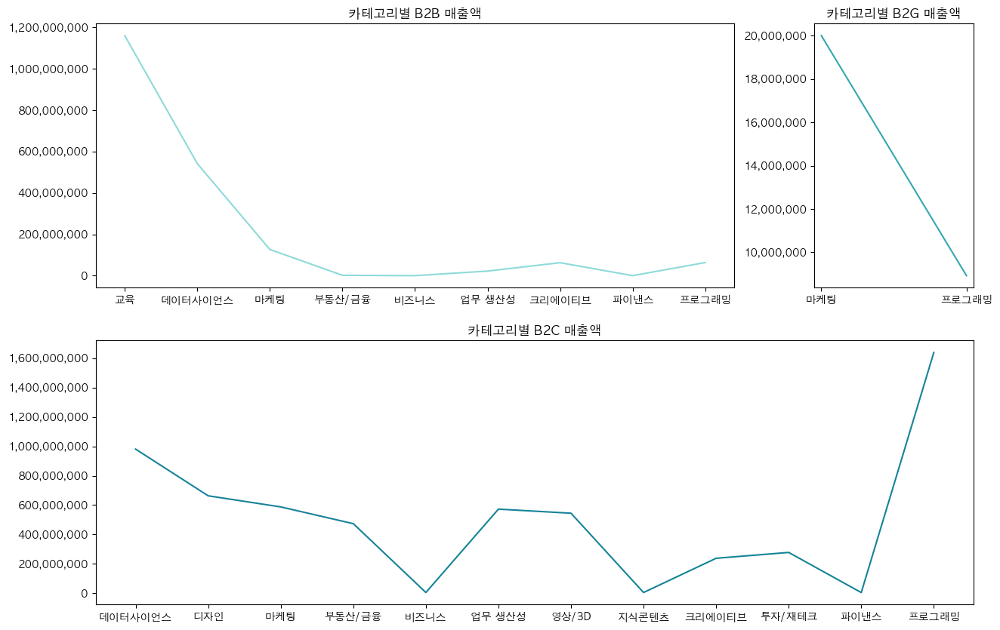

In [70]:
fig5 = plt.figure(figsize=(15,10))

spec = grs.GridSpec(ncols=2, nrows=2, width_ratios=[4, 1])

ax9 = fig5.add_subplot(spec[0])
plt.title("카테고리별 B2B 매출액")
plt.plot(df_BM_C.loc['B2B'], color = '#8EDADA')

ax9.get_yaxis().set_major_formatter(
    tkr.FuncFormatter(lambda x, p: format(int(x), ',')))

ax10 = fig5.add_subplot(spec[2:4])
plt.title("카테고리별 B2C 매출액")
plt.plot(df_BM_C.loc['B2C'], color = '#168398')

ax10.get_yaxis().set_major_formatter(
    tkr.FuncFormatter(lambda x, p: format(int(x), ',')))

ax11 = fig5.add_subplot(spec[1])
plt.title("카테고리별 B2G 매출액")
plt.plot(df_BM_C.loc['B2G'], color = '#35A7AF')

ax11.get_yaxis().set_major_formatter(
    tkr.FuncFormatter(lambda x, p: format(int(x), ',')))

plt.show()

In [71]:
BMC = df_BM_C.index.get_level_values(0).drop_duplicates()
BMT = df_BM_C.index.get_level_values(1).drop_duplicates()

B2B_I = df_BM_C.loc['B2B'].index
B2B_V= df_BM_C.loc['B2B'].values.reshape(1,-1)[0]
B2C_I = df_BM_C.loc['B2C'].index
B2C_V= df_BM_C.loc['B2C'].values.reshape(1,-1)[0]
B2G_I = df_BM_C.loc['B2G'].index
B2G_V= df_BM_C.loc['B2G'].values.reshape(1,-1)[0]

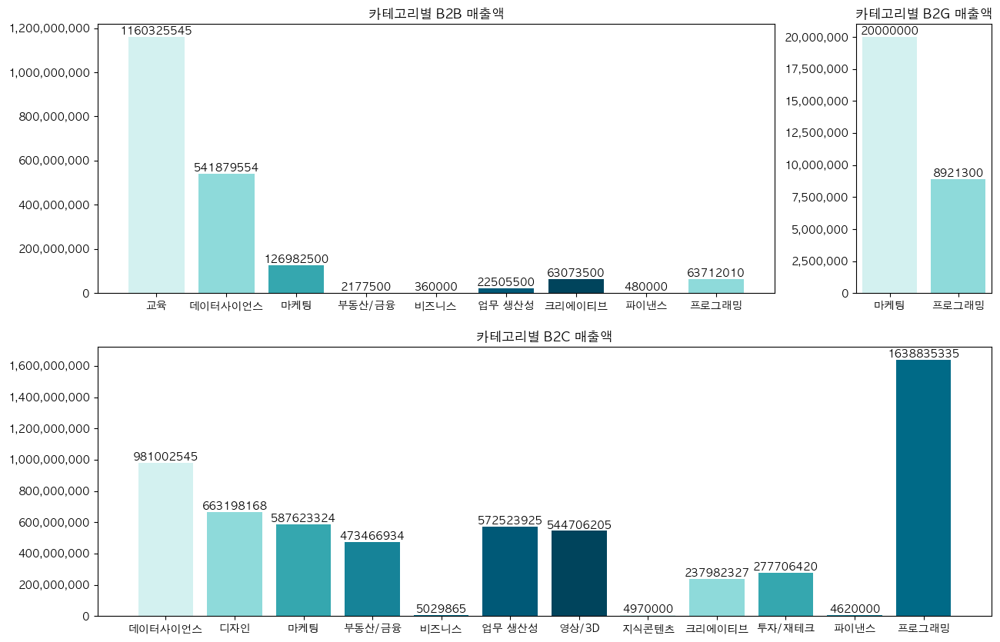

In [72]:
fig5 = plt.figure(figsize=(15,10))

spec = grs.GridSpec(ncols=2, nrows=2, width_ratios=[5, 1])

ax9 = fig5.add_subplot(spec[0])
plt.title("카테고리별 B2B 매출액")
bar9 = plt.bar(B2B_I, B2B_V, color = ['#D3F1F0', '#8EDADA', '#35A7AF', '#168398', '#006A87', '#005977', '#00445C'])

ax9.get_yaxis().set_major_formatter(
    tkr.FuncFormatter(lambda x, p: format(int(x), ',')))

for rect in bar9:
    height = rect.get_height()
    plt.text(rect.get_x() + rect.get_width()/2.0, height, '%.0f' % height, ha='center', va='bottom', size = 10)

ax10 = fig5.add_subplot(spec[2:4])
plt.title("카테고리별 B2C 매출액")
bar10 = plt.bar(B2C_I, B2C_V, color = ['#D3F1F0', '#8EDADA', '#35A7AF', '#168398', '#006A87', '#005977', '#00445C'])

ax10.get_yaxis().set_major_formatter(
    tkr.FuncFormatter(lambda x, p: format(int(x), ',')))

for rect in bar10:
    height = rect.get_height()
    plt.text(rect.get_x() + rect.get_width()/2.0, height, '%.0f' % height, ha='center', va='bottom', size = 10)

ax11 = fig5.add_subplot(spec[1])
plt.title("카테고리별 B2G 매출액")
bar11 = plt.bar(B2G_I, B2G_V, color = ['#D3F1F0', '#8EDADA', '#35A7AF', '#168398', '#006A87', '#005977', '#00445C'])

ax11.get_yaxis().set_major_formatter(
    tkr.FuncFormatter(lambda x, p: format(int(x), ',')))

for rect in bar11:
    height = rect.get_height()
    plt.text(rect.get_x() + rect.get_width()/2.0, height, '%.0f' % height, ha='center', va='bottom', size = 10)

plt.show()

### 월별 카테고리별 매출

In [73]:
# 월별 카테고리별 매출 집계 (1)

df_BM_SC = df1.groupby(['sale_time', 'category_title']).agg(how)
df_BM_SC.index.names = ['판매 시기', '강의 대분류']
df_BM_SC.columns=['매출 합계액']
df_BM_SC

매출 합계액
판매 시기 강의 대분류            
21-03 교육        27606150
      데이터사이언스   32636500
      디자인       21436835
      마케팅       15819867
      부동산/금융    19622100
...                  ...
21-09 지식콘텐츠       239000
      크리에이티브    31120000
      투자/재테크    40731367
      파이낸스       2310000
      프로그래밍    213608729

[80 rows x 1 columns]

In [74]:
df_BM_SC_I03 = df_BM_SC.loc['21-03'].index
df_BM_SC_I04 = df_BM_SC.loc['21-04'].index
df_BM_SC_I05 = df_BM_SC.loc['21-05'].index
df_BM_SC_I06 = df_BM_SC.loc['21-06'].index
df_BM_SC_I07 = df_BM_SC.loc['21-07'].index
df_BM_SC_I08 = df_BM_SC.loc['21-08'].index
df_BM_SC_I09 = df_BM_SC.loc['21-09'].index
df_BM_SC_v03 = df_BM_SC.loc['21-03'].values.reshape(1,-1)[0]
df_BM_SC_v04 = df_BM_SC.loc['21-04'].values.reshape(1,-1)[0]
df_BM_SC_v05 = df_BM_SC.loc['21-05'].values.reshape(1,-1)[0]
df_BM_SC_v06 = df_BM_SC.loc['21-06'].values.reshape(1,-1)[0]
df_BM_SC_v07 = df_BM_SC.loc['21-07'].values.reshape(1,-1)[0]
df_BM_SC_v08 = df_BM_SC.loc['21-08'].values.reshape(1,-1)[0]
df_BM_SC_v09 = df_BM_SC.loc['21-09'].values.reshape(1,-1)[0]

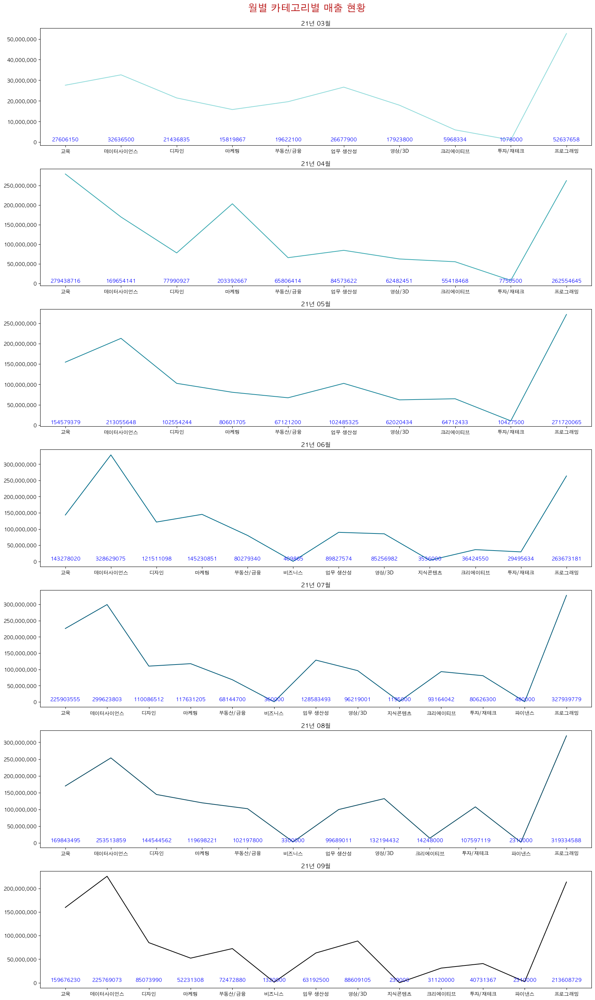

In [75]:
fig6  = plt.figure(figsize=(20,35))

ax12 = fig6.add_subplot(7, 1, 1)
plt.title("21년 03월")
bar12 = plt.plot(df_BM_SC.loc['21-03'], color="#8EDADA")

ax12.get_yaxis().set_major_formatter(
    tkr.FuncFormatter(lambda x, p: format(int(x), ',')))

for i in range(len(df_BM_SC_I03)):
    height = df_BM_SC_v03[i]
    plt.text(df_BM_SC_I03[i], 0.05, '%.0f' %height, ha='center', va='bottom', size = 10, color = '#0000ff' )

ax13 = fig6.add_subplot(7, 1, 2)
plt.title("21년 04월")
bar13 = plt.plot(df_BM_SC.loc['21-04'], color="#35A7AF")

ax13.get_yaxis().set_major_formatter(
    tkr.FuncFormatter(lambda x, p: format(int(x), ',')))

for i in range(len(df_BM_SC_I04)):
    height = df_BM_SC_v04[i]
    plt.text(df_BM_SC_I04[i], 0.05, '%.0f' %height, ha='center', va='bottom', size = 10, color = '#0000ff' )

ax14 = fig6.add_subplot(7, 1, 3)
plt.title("21년 05월")
bar14 = plt.plot(df_BM_SC.loc['21-05'], color="#168398")

ax14.get_yaxis().set_major_formatter(
    tkr.FuncFormatter(lambda x, p: format(int(x), ',')))

for i in range(len(df_BM_SC_I05)):
    height = df_BM_SC_v05[i]
    plt.text(df_BM_SC_I05[i], 0.05, '%.0f' %height, ha='center', va='bottom', size = 10, color = '#0000ff' )

ax15 = fig6.add_subplot(7, 1, 4)
plt.title("21년 06월")
bar15 = plt.plot(df_BM_SC.loc['21-06'], color="#006A87")

ax15.get_yaxis().set_major_formatter(
    tkr.FuncFormatter(lambda x, p: format(int(x), ',')))

for i in range(len(df_BM_SC_I06)):
    height = df_BM_SC_v06[i]
    plt.text(df_BM_SC_I06[i], 0.05, '%.0f' %height, ha='center', va='bottom', size = 10, color = '#0000ff' )

ax16 = fig6.add_subplot(7, 1, 5)
plt.title("21년 07월")
bar16 = plt.plot(df_BM_SC.loc['21-07'], color="#005977")

ax16.get_yaxis().set_major_formatter(
    tkr.FuncFormatter(lambda x, p: format(int(x), ',')))

for i in range(len(df_BM_SC_I07)):
    height = df_BM_SC_v07[i]
    plt.text(df_BM_SC_I07[i], 0.05, '%.0f' %height, ha='center', va='bottom', size = 10, color = '#0000ff' )

ax17 = fig6.add_subplot(7, 1, 6)
plt.title("21년 08월")
bar17 = plt.plot(df_BM_SC.loc['21-08'], color="#00445C")

ax17.get_yaxis().set_major_formatter(
    tkr.FuncFormatter(lambda x, p: format(int(x), ',')))

for i in range(len(df_BM_SC_I08)):
    height = df_BM_SC_v08[i]
    plt.text(df_BM_SC_I08[i], 0.05, '%.0f' %height, ha='center', va='bottom', size = 10, color = '#0000ff' )

ax18 = fig6.add_subplot(7, 1, 7)
plt.title("21년 09월")
bar18 = plt.plot(df_BM_SC.loc['21-09'], color="BLACK")

ax18.get_yaxis().set_major_formatter(
    tkr.FuncFormatter(lambda x, p: format(int(x), ',')))

for i in range(len(df_BM_SC_I09)):
    height = df_BM_SC_v09[i]
    plt.text(df_BM_SC_I09[i], 0.05, '%.0f' %height, ha='center', va='bottom', size = 10, color = '#0000ff' )


fig6.suptitle('월별 카테고리별 매출 현황',position=(0.5, 0.9), fontsize=20, color='#B40404')
plt.show()

In [76]:
# 월별 카테고리별 매출 집계 (2)

SMC = pd.pivot_table(data=df1, index=["sale_time"], values=["transaction_amount"], columns=["category_title"], aggfunc=np.sum)
SMC

transaction_amount                                         \
category_title                 교육      데이터사이언스          디자인          마케팅   
sale_time                                                                  
21-03                 27606150.00  32636500.00  21436835.00  15819867.00   
21-04                279438716.00 169654141.00  77990927.00 203392667.00   
21-05                154579379.00 213055648.00 102554244.00  80601705.00   
21-06                143278020.00 328629075.00 121511098.00 145230851.00   
21-07                225903555.00 299623803.00 110086512.00 117631205.00   
21-08                169843495.00 253513859.00 144544562.00 119698221.00   
21-09                159676230.00 225769073.00  85073990.00  52231308.00   

                                                                             \
category_title       부동산/금융       비즈니스       업무 생산성        영상/3D      지식콘텐츠   
sale_time                                                                     
21-03           19622100.00        NaN  26677900.00  17923800.00        NaN   
21-04           65806414.00        NaN  84573622.00  62482451.00        NaN   
21-05           67121200.00        NaN 102485325.00  62020434.00        NaN   
21-06           80279340.00  409865.00  89827574.00  85256982.00 3536000.00   
21-07           68144700.00  360000.00 128583493.00  96219001.00 1195000.00   
21-08          102197800.00 3300000.00  99689011.00 132194432.00        NaN   
21-09           72472880.00 1320000.00  63192500.00  88609105.00  239000.00   

                                                                 
category_title      크리에이티브       투자/재테크       파이낸스        프로그래밍  
sale_time                                                        
21-03           5968334.00   1078000.00        NaN  52637658.00  
21-04          55418468.00   7750500.00        NaN 262554645.00  
21-05          64712433.00  10427500.00        NaN 271720065.00  
21-06          36424550.00  29495634.00        NaN 263673181.00  
21-07          93164042.00  80626300.00  480000.00 327939779.00  
21-08          14248000.00 107597119.00 2310000.00 319334588.00  
21-09          31120000.00  40731367.00 2310000.00 213608729.00

In [77]:
SMC.columns.names = ['합계액', '강의 대분류']
SMC.index.names = ['판매 시기']
SMC

합계액    transaction_amount                                                      \
강의 대분류                 교육      데이터사이언스          디자인          마케팅       부동산/금융   
판매 시기                                                                           
21-03         27606150.00  32636500.00  21436835.00  15819867.00  19622100.00   
21-04        279438716.00 169654141.00  77990927.00 203392667.00  65806414.00   
21-05        154579379.00 213055648.00 102554244.00  80601705.00  67121200.00   
21-06        143278020.00 328629075.00 121511098.00 145230851.00  80279340.00   
21-07        225903555.00 299623803.00 110086512.00 117631205.00  68144700.00   
21-08        169843495.00 253513859.00 144544562.00 119698221.00 102197800.00   
21-09        159676230.00 225769073.00  85073990.00  52231308.00  72472880.00   

합계액                                                                 \
강의 대분류       비즈니스       업무 생산성        영상/3D      지식콘텐츠      크리에이티브   
판매 시기                                                                
21-03         NaN  26677900.00  17923800.00        NaN  5968334.00   
21-04         NaN  84573622.00  62482451.00        NaN 55418468.00   
21-05         NaN 102485325.00  62020434.00        NaN 64712433.00   
21-06   409865.00  89827574.00  85256982.00 3536000.00 36424550.00   
21-07   360000.00 128583493.00  96219001.00 1195000.00 93164042.00   
21-08  3300000.00  99689011.00 132194432.00        NaN 14248000.00   
21-09  1320000.00  63192500.00  88609105.00  239000.00 31120000.00   

합계액                                          
강의 대분류       투자/재테크       파이낸스        프로그래밍  
판매 시기                                        
21-03    1078000.00        NaN  52637658.00  
21-04    7750500.00        NaN 262554645.00  
21-05   10427500.00        NaN 271720065.00  
21-06   29495634.00        NaN 263673181.00  
21-07   80626300.00  480000.00 327939779.00  
21-08  107597119.00 2310000.00 319334588.00  
21-09   40731367.00 2310000.00 213608729.00

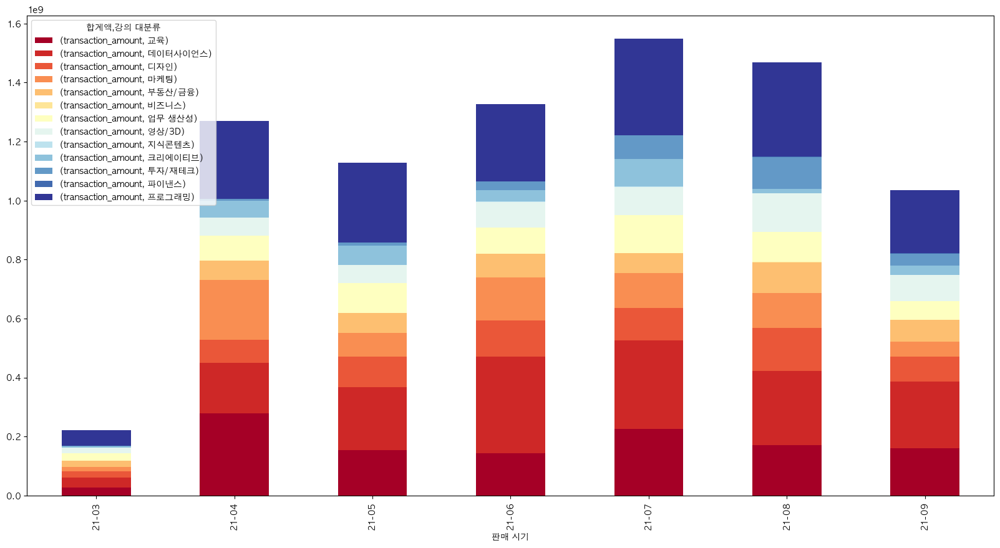

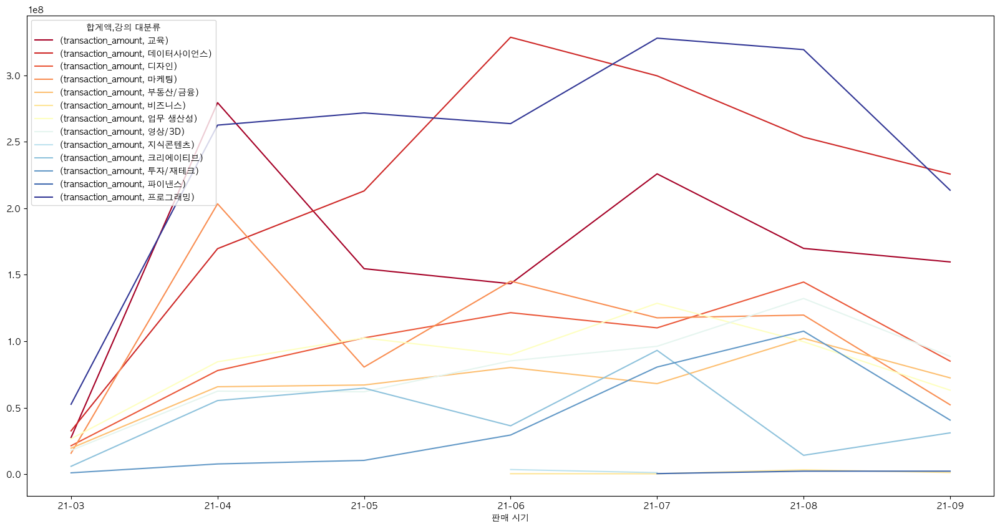

In [78]:
SMC.plot(kind = 'bar', stacked = 'True', figsize=(20,10), colormap="RdYlBu")
SMC.plot(kind = 'line', figsize=(20,10), colormap="RdYlBu")
plt.show()

## 고객군별 마케팅 지출 비용 분석

### 선정 기준
- `sale_price` column을 통해 할인액을 마케팅 비용의 일종으로 간주하여 파악

In [79]:
cond1 = df1['coupon_discount_amount'] > 0
df2 = df1[cond1]
df2.head()

,index,id,customer_id,course_id,type,state,course_title,category_title,format,completed_at,...,is_business,date,year,month,week,quarter,day_of_week,hour,고객군,sale_time
0,2,970657,72297,204246,PAYMENT,COMPLETED,시크릿코드 : 프론트엔드 실무 완성편,프로그래밍,스쿨 온라인,2021-03-28 15:21:43,...,0,2021-03-28 15:21:43,2021,3,12,1,Sunday,15,B2C,21-03
1,4,970658,478028,201797,PAYMENT,COMPLETED,올인원 패키지 : 직장인 필수 스킬 3종 세트 MAX,업무 생산성,올인원,2021-03-28 15:21:54,...,1,2021-03-28 15:21:54,2021,3,12,1,Sunday,15,B2C,21-03
2,8,970669,478033,203178,PAYMENT,COMPLETED,초격차 패키지 : 한번에 끝내는 영상 촬영과 편집,영상/3D,올인원,2021-03-28 15:26:47,...,0,2021-03-28 15:26:47,2021,3,12,1,Sunday,15,B2C,21-03
4,14,970676,478035,203720,PAYMENT,COMPLETED,초격차 패키지 : 한 번에 끝내는 프론트엔드 개발,프로그래밍,올인원,2021-03-28 15:31:01,...,0,2021-03-28 15:31:01,2021,3,12,1,Sunday,15,B2C,21-03
7,28,970704,471759,204068,PAYMENT,COMPLETED,올인원 패키지 : 마디아의 UX/UI 포트폴리오,디자인,올인원,2021-03-28 15:46:22,...,0,2021-03-28 15:46:22,2021,3,12,1,Sunday,15,B2C,21-03


In [80]:
# 판매가격에서 쿠폰가격 제외한 금액이 결제금액과 항상 일치하나?

cond_a = df1['sale_price'] - df1['coupon_discount_amount'] == df1['transaction_amount']
df1[cond_a].head()

,index,id,customer_id,course_id,type,state,course_title,category_title,format,completed_at,...,is_business,date,year,month,week,quarter,day_of_week,hour,고객군,sale_time
0,2,970657,72297,204246,PAYMENT,COMPLETED,시크릿코드 : 프론트엔드 실무 완성편,프로그래밍,스쿨 온라인,2021-03-28 15:21:43,...,0,2021-03-28 15:21:43,2021,3,12,1,Sunday,15,B2C,21-03
1,4,970658,478028,201797,PAYMENT,COMPLETED,올인원 패키지 : 직장인 필수 스킬 3종 세트 MAX,업무 생산성,올인원,2021-03-28 15:21:54,...,1,2021-03-28 15:21:54,2021,3,12,1,Sunday,15,B2C,21-03
2,8,970669,478033,203178,PAYMENT,COMPLETED,초격차 패키지 : 한번에 끝내는 영상 촬영과 편집,영상/3D,올인원,2021-03-28 15:26:47,...,0,2021-03-28 15:26:47,2021,3,12,1,Sunday,15,B2C,21-03
4,14,970676,478035,203720,PAYMENT,COMPLETED,초격차 패키지 : 한 번에 끝내는 프론트엔드 개발,프로그래밍,올인원,2021-03-28 15:31:01,...,0,2021-03-28 15:31:01,2021,3,12,1,Sunday,15,B2C,21-03
7,28,970704,471759,204068,PAYMENT,COMPLETED,올인원 패키지 : 마디아의 UX/UI 포트폴리오,디자인,올인원,2021-03-28 15:46:22,...,0,2021-03-28 15:46:22,2021,3,12,1,Sunday,15,B2C,21-03


In [81]:
# 판매가격에서 쿠폰가격 제외한 금액이 결제금액과 일치하지 않는 경우도 있겠지

cond_b = df1['sale_price'] - df1['coupon_discount_amount'] != df1['transaction_amount']
df1[cond_a & cond1].head()

,index,id,customer_id,course_id,type,state,course_title,category_title,format,completed_at,...,is_business,date,year,month,week,quarter,day_of_week,hour,고객군,sale_time
0,2,970657,72297,204246,PAYMENT,COMPLETED,시크릿코드 : 프론트엔드 실무 완성편,프로그래밍,스쿨 온라인,2021-03-28 15:21:43,...,0,2021-03-28 15:21:43,2021,3,12,1,Sunday,15,B2C,21-03
1,4,970658,478028,201797,PAYMENT,COMPLETED,올인원 패키지 : 직장인 필수 스킬 3종 세트 MAX,업무 생산성,올인원,2021-03-28 15:21:54,...,1,2021-03-28 15:21:54,2021,3,12,1,Sunday,15,B2C,21-03
2,8,970669,478033,203178,PAYMENT,COMPLETED,초격차 패키지 : 한번에 끝내는 영상 촬영과 편집,영상/3D,올인원,2021-03-28 15:26:47,...,0,2021-03-28 15:26:47,2021,3,12,1,Sunday,15,B2C,21-03
4,14,970676,478035,203720,PAYMENT,COMPLETED,초격차 패키지 : 한 번에 끝내는 프론트엔드 개발,프로그래밍,올인원,2021-03-28 15:31:01,...,0,2021-03-28 15:31:01,2021,3,12,1,Sunday,15,B2C,21-03
7,28,970704,471759,204068,PAYMENT,COMPLETED,올인원 패키지 : 마디아의 UX/UI 포트폴리오,디자인,올인원,2021-03-28 15:46:22,...,0,2021-03-28 15:46:22,2021,3,12,1,Sunday,15,B2C,21-03


In [82]:
# 어째서 일치하지 않는 경우가 발생하는 것인지 한 번 실례를 찾아서 생각해보자

df1[df1['customer_id']==569863]

,index,id,customer_id,course_id,type,state,course_title,category_title,format,completed_at,...,is_business,date,year,month,week,quarter,day_of_week,hour,고객군,sale_time
30588,64903,1178860,569863,205707,PAYMENT,COMPLETED,올인원 패키지 : 15명의 전문 애널리스트에게 배우는 산업&매크로 분석과 투자 전략,투자/재테크,올인원,2021-06-30 14:06:39,...,0,2021-06-30 14:06:39,2021,6,26,2,Wednesday,14,B2C,21-06
51376,98199,1329552,569863,205648,PAYMENT,COMPLETED,초격차 패키지 : 한번에 끝내는 금융ㆍ투자(IB) 실무,부동산/금융,올인원,2021-09-06 00:36:51,...,0,2021-09-06 00:36:51,2021,9,36,3,Monday,0,B2C,21-09


In [83]:
df2.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 23761 entries, 0 to 56722
Data columns (total 35 columns):
 #   Column                  Non-Null Count  Dtype         
---  ------                  --------------  -----         
 0   index                   23761 non-null  int64         
 1   id                      23761 non-null  int64         
 2   customer_id             23761 non-null  int64         
 3   course_id               23761 non-null  int64         
 4   type                    23761 non-null  object        
 5   state                   23761 non-null  object        
 6   course_title            23761 non-null  object        
 7   category_title          23761 non-null  object        
 8   format                  23761 non-null  object        
 9   completed_at            23761 non-null  datetime64[ns]
 10  transaction_amount      23761 non-null  int64         
 11  coupon_title            23761 non-null  object        
 12  coupon_discount_amount  23761 non-null  float6

### 고객군별 할인

In [84]:
# 고객군별 할인

df_c = pd.pivot_table(data=df2, index=["고객군"], values=["coupon_discount_amount"], aggfunc=["count", "sum", "mean"])
df_c.columns = ['할인 건수', '할인 총액', '평균']
df_c

,할인 건수,할인 총액,평균
고객군,,,
B2C,23723,1295238465.00,54598.43
B2G,38,11100000.00,292105.26


### 월별 할인

In [85]:
# 월별 할인

how1 = {
    'coupon_discount_amount':np.sum
}

df_S = df2.groupby(['sale_time']).agg(how1)
df_S = df_S.rename(columns={ 'coupon_discount_amount':'할인 합계액'})
df_S.index.names = ['판매 시기']
df_S

,할인 합계액
판매 시기,
21-03,94574960.00
21-04,294215660.00
21-05,130541440.00
21-06,160300555.00
21-07,99207500.00
21-08,267419000.00
21-09,260079350.00


In [86]:
ST = df_S.index
SV= df_S.values.reshape(1,-1)[0]

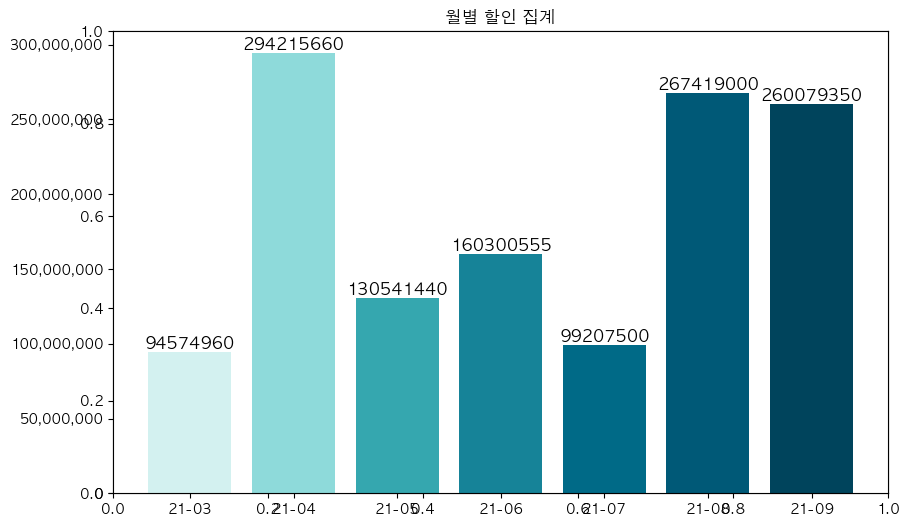

In [87]:
fig1 = plt.figure(figsize=(10,6))

plt.title('월별 할인 집계')
ax1 = fig1.add_subplot(1, 1, 1)
bar1= plt.bar(ST, SV, color = ['#D3F1F0', '#8EDADA', '#35A7AF', '#168398', '#006A87', '#005977', '#00445C'])

for rect in bar1:
    height = rect.get_height()
    plt.text(rect.get_x() + rect.get_width()/2.0, height, '%.0f' % height, ha='center', va='bottom', size = 12)

ax1.get_yaxis().set_major_formatter(
    tkr.FuncFormatter(lambda x, p: format(int(x), ',')))

plt.show()

### 고객군별 월별 할인

In [88]:
# 고객군별 월별 할인

df_BM_S = df2.groupby(['고객군', 'sale_time']).agg(how1)
df_BM_S = df_BM_S.rename(columns={'coupon_discount_amount':'할인 합계액'})
df_BM_S

할인 합계액
고객군 sale_time             
B2C 21-03      94574960.00
    21-04     294215660.00
    21-05     130541440.00
    21-06     160300555.00
    21-07      99207500.00
    21-08     259319000.00
    21-09     257079350.00
B2G 21-08       8100000.00
    21-09       3000000.00

In [89]:
BMC = df_BM_S.index.get_level_values(0).drop_duplicates()
BMT = df_BM_S.index.get_level_values(1).drop_duplicates()
B2C_V= df_BM_S.loc['B2C'].values.reshape(1,-1)[0]
B2G_V= df_BM_S.loc['B2G'].values.reshape(1,-1)[0]
# B2G_V= np.append(np.array([0,0,0,0,0]), df_BM_S.loc['B2G'].values.reshape(1,-1)[0])

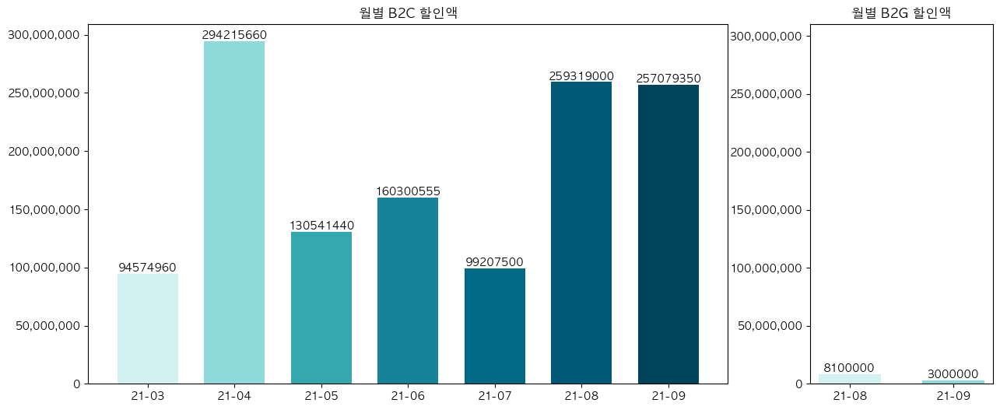

In [90]:
fig3 = plt.figure(figsize=(15,6))

spec = grs.GridSpec(ncols=2, nrows=1,width_ratios=[7, 2])

ax6 = plt.subplot(spec[0])
plt.title("월별 B2C 할인액")
bar6 = plt.bar(BMT, B2C_V, width = 0.7, color = ['#D3F1F0', '#8EDADA', '#35A7AF', '#168398', '#006A87', '#005977', '#00445C'])

for rect in bar6:
    height = rect.get_height()
    plt.text(rect.get_x() + rect.get_width()/2.0, height, '%.0f' % height, ha='center', va='bottom', size = 10)

ax6.get_yaxis().set_major_formatter(
    tkr.FuncFormatter(lambda x, p: format(int(x), ',')))

ax7 = plt.subplot(spec[1])
plt.title("월별 B2G 할인액")
bar7 = plt.bar(BMT[5:7], B2G_V, width = 0.6, color = ['#D3F1F0', '#8EDADA', '#35A7AF', '#168398', '#006A87', '#005977', '#00445C'])
plt.ylim(0,310000000)

for rect in bar7:
    height = rect.get_height()
    plt.text(rect.get_x() + rect.get_width()/2.0, height, '%.0f' % height, ha='center', va='bottom', size = 10)

ax7.get_yaxis().set_major_formatter(
    tkr.FuncFormatter(lambda x, p: format(int(x), ',')))

plt.show()


## Matplotlib 에서 다른 서브 플롯 크기를 만드는 방법 --> https://www.delftstack.com/ko/howto/matplotlib/how-to-make-different-subplot-sizes-in-matplotlib/

### 카테고리별 할인

In [91]:
# 카테고리별 할인

df_C = df2.groupby(['category_title']).agg(how1)
df_C = df_C.rename(columns={'coupon_discount_amount':'할인 합계액'})
df_C.index.names = ['강의 대분류']
df_C

,할인 합계액
강의 대분류,
데이터사이언스,188960700.00
디자인,158532080.00
마케팅,96428760.00
부동산/금융,83458175.00
비즈니스,3735.00
업무 생산성,110213550.00
영상/3D,134878300.00
지식콘텐츠,229000.00
크리에이티브,9773200.00


In [92]:
CT = df_C.index
CV = df_C.values.reshape(1,-1)[0]

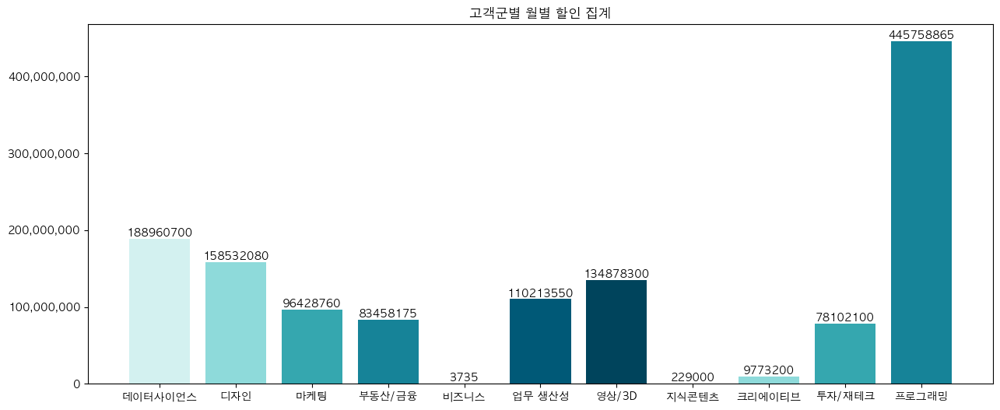

In [93]:
fig4 = plt.figure(figsize=(15,6))

ax8 = fig4.add_subplot(1, 1, 1)
plt.title('고객군별 월별 할인 집계')
bar8 = plt.bar(CT, CV, color = ['#D3F1F0', '#8EDADA', '#35A7AF', '#168398', '#006A87', '#005977', '#00445C'])

ax8.get_yaxis().set_major_formatter(
    tkr.FuncFormatter(lambda x, p: format(int(x), ',')))

for rect in bar8:
    height = rect.get_height()
    plt.text(rect.get_x() + rect.get_width()/2.0, height, '%.0f' % height, ha='center', va='bottom', size = 10)

plt.show()

### 고객군별 카테고리별 할인

In [94]:
# 고객군별 카테고리별 할인

df_BM_C = df2.groupby(['고객군', 'category_title']).agg(how1)
df_BM_C.index.names = ['고객군', '강의 대분류']
df_BM_C.columns=['매출 합계액']
df_BM_C

매출 합계액
고객군 강의 대분류              
B2C 데이터사이언스 188960700.00
    디자인     158532080.00
    마케팅      96428760.00
    부동산/금융   83458175.00
    비즈니스         3735.00
    업무 생산성  110213550.00
    영상/3D   134878300.00
    지식콘텐츠      229000.00
    크리에이티브    9773200.00
    투자/재테크   78102100.00
    프로그래밍   434658865.00
B2G 프로그래밍    11100000.00

In [95]:
BMC = df_BM_C.index.get_level_values(0).drop_duplicates()
BMT = df_BM_C.index.get_level_values(1).drop_duplicates()
B2C_V= df_BM_C.loc['B2C'].values.reshape(1,-1)[0]
B2G_V= df_BM_C.loc['B2G'].values.reshape(1,-1)[0]
# B2G_V= np.append(np.array([0] * 10, df_BM_C.loc['B2G'].values.reshape(1,-1)[0])

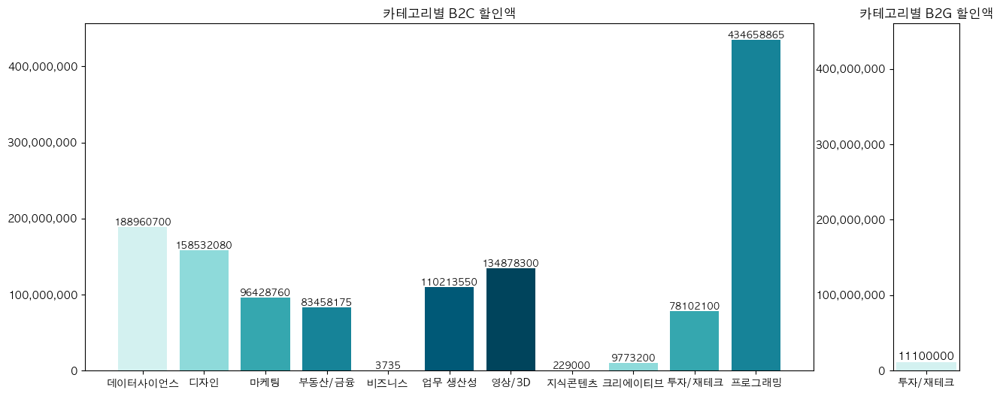

In [96]:
fig5 = plt.figure(figsize=(15,6))

spec = grs.GridSpec(ncols=2, nrows=1,width_ratios=[11, 1])

ax10 = fig5.add_subplot(spec[0])
plt.title("카테고리별 B2C 할인액")
# plt.plot(df_BM_C.loc['B2C'], color = '#168398')
bar10 = plt.bar(BMT, B2C_V,  color = ['#D3F1F0', '#8EDADA', '#35A7AF', '#168398', '#006A87', '#005977', '#00445C'])

for rect in bar10:
    height = rect.get_height()
    plt.text(rect.get_x() + rect.get_width()/2.0, height, '%.0f' % height, ha='center', va='bottom', size = 9)

ax10.get_yaxis().set_major_formatter(
    tkr.FuncFormatter(lambda x, p: format(int(x), ',')))

ax11 = fig5.add_subplot(spec[1])
plt.title("카테고리별 B2G 할인액")
bar11 = plt.bar(BMT[9], B2G_V, color = ['#D3F1F0', '#8EDADA', '#35A7AF', '#168398', '#006A87', '#005977', '#00445C'])
plt.ylim(0,460000000,100000000)

for rect in bar11:
    height = rect.get_height()
    plt.text(rect.get_x() + rect.get_width()/2.0, height, '%.0f' % height, ha='center', va='bottom', size = 10)

ax11.get_yaxis().set_major_formatter(
    tkr.FuncFormatter(lambda x, p: format(int(x), ',')))

plt.show()

# B2C - VIP 고객별 분석

## 전처리

In [97]:
# 8. 3월 자유이용권 구매했는데 5월 26일에 refund -> data set은 3월 29일부터 자료
df.drop([41878], axis=0, inplace=True)

# 5. id 1078156 제거 -> course_title '관리'
df.drop(index = 32620 , axis = 0, inplace=True)

In [98]:
# 모든 결측치 제거 완료
print(df.isnull().sum())
#df1[df1.category_title.isnull()]

index                         0
id                            0
customer_id                   0
course_id                     0
type                          0
state                         0
course_title                  0
category_title                0
format                        0
completed_at                  0
transaction_amount            0
coupon_title              32959
coupon_discount_amount    32959
sale_price                 1079
tax_free_amount            1079
pg                        10349
method                        0
subcategory_title         10301
marketing_start_at        10049
big_category_title            0
is_payment                    0
is_refund                     0
is_finance                    0
is_design                     0
is_programming                0
is_business                   0
date                          0
year                          0
month                         0
week                          0
quarter                       0
day_of_w

## 시각화 setting

In [99]:
# jupyter notebook 내 그래프를 바로 그리기 위한 설정
%matplotlib inline

# unicode minus를 사용하지 않기 위한 설정 (minus 깨짐현상 방지)
plt.rcParams['axes.unicode_minus'] = False

# font 크기 조절
plt.rcParams['font.size'] = 23

# figsize 를 전역으로 설정
plt.rcParams['figure.figsize'] = (20, 10)


# 한글 폰트 다운
plt.rcParams['font.family'] = 'AppleGothic'

## 고객별 데이터 분석

In [100]:
# feature selection
df1 = df[['customer_id','category_title','course_title','type','state','transaction_amount','completed_at']]
df1

,customer_id,category_title,course_title,type,state,transaction_amount,completed_at
0,72297,프로그래밍,시크릿코드 : 프론트엔드 실무 완성편,PAYMENT,COMPLETED,171810,2021-03-28 15:21:43
1,478028,업무 생산성,올인원 패키지 : 직장인 필수 스킬 3종 세트 MAX,PAYMENT,COMPLETED,97500,2021-03-28 15:21:54
2,478033,영상/3D,초격차 패키지 : 한번에 끝내는 영상 촬영과 편집,PAYMENT,COMPLETED,96000,2021-03-28 15:26:47
3,469860,부동산/금융,올인원 패키지 : 권오상의 금융 아카데미 - 권오상의 재무제표 분석 기초(평생소장),PAYMENT,COMPLETED,263000,2021-03-28 15:27:17
4,478035,프로그래밍,초격차 패키지 : 한 번에 끝내는 프론트엔드 개발,PAYMENT,COMPLETED,91000,2021-03-28 15:31:01
...,...,...,...,...,...,...,...
56718,669238,디자인,초격차 패키지 : 한번에 끝내는 3D 디자인 툴,PAYMENT,COMPLETED,212000,2021-09-25 13:39:26
56719,384003,영상/3D,초격차 패키지 : 한번에 끝내는 영상 촬영과 편집,PAYMENT,COMPLETED,149000,2021-09-25 13:46:29
56720,670891,프로그래밍,초격차 패키지 : 한 번에 끝내는 파이썬 웹 개발,PAYMENT,COMPLETED,159000,2021-09-25 14:01:26
56721,640697,영상/3D,초격차 패키지 : 한 번에 끝내는 유튜브 크리에이터 되기,PAYMENT,COMPLETED,96000,2021-09-25 14:17:41


### 중복값이 많은 customer_id top20

In [101]:
a = df1['customer_id'].value_counts().head(20).to_frame()
a

,customer_id
98685,53
427973,47
158374,42
50769,41
3189,40
1189,37
40783,34
276705,33
106662,29
20784,28


### transaction_amount가 많은 고객 list
- 대부분 B2B

In [102]:
# customer_id로 groupby해서 transaction amount를 sum()
# Transaction_amount를 보았을 때 top40까지 뽑아도 전부 B2B다.
# B2B 없애고 B2C로 다시 분석한다.

df1.groupby(['customer_id','category_title','course_title'])['transaction_amount'].sum().to_frame().sort_values(by='transaction_amount' ,ascending=False).head(40)

,,,transaction_amount
customer_id,category_title,course_title,
512983,마케팅,(B2B) 서울형 청년인턴 디지털 마케팅 및 영업 과정 (국내),113400000
548381,데이터사이언스,(B2B) 교보생명 교보 데이터 분석 전문과정 2기,81040000
589392,데이터사이언스,(B2B) LG전자 2021 빅데이터 직무전환자 과정 2차수,58100000
567160,데이터사이언스,(B2B) 현대모비스 2021 데이터 분석 준전문가 양성과정,50665980
594969,데이터사이언스,(B2B) 한라인재개발원 2021 Work Smart 프로그램 - 데이터 사이언스,47500000
116416,크리에이티브,(B2B) 하나금융티아이 DT University(2021),44600000
600889,데이터사이언스,(B2B) 현대오토에버 온라인 싱글 플랜 - 직장인파이썬분석 포팅건,32314524
535365,데이터사이언스,(B2B) 이마트 데이터 아카데미,27040000
594969,데이터사이언스,(B2B) 한라인재개발원 2021 Work Smart 프로그램 - 데이터 자동화 및 시각화,24800000


### B2C 강의만 뽑은 DataFrame

In [103]:
df1 = df1[df1['course_title'].str.contains('B2B') == False]
df1

,customer_id,category_title,course_title,type,state,transaction_amount,completed_at
0,72297,프로그래밍,시크릿코드 : 프론트엔드 실무 완성편,PAYMENT,COMPLETED,171810,2021-03-28 15:21:43
1,478028,업무 생산성,올인원 패키지 : 직장인 필수 스킬 3종 세트 MAX,PAYMENT,COMPLETED,97500,2021-03-28 15:21:54
2,478033,영상/3D,초격차 패키지 : 한번에 끝내는 영상 촬영과 편집,PAYMENT,COMPLETED,96000,2021-03-28 15:26:47
3,469860,부동산/금융,올인원 패키지 : 권오상의 금융 아카데미 - 권오상의 재무제표 분석 기초(평생소장),PAYMENT,COMPLETED,263000,2021-03-28 15:27:17
4,478035,프로그래밍,초격차 패키지 : 한 번에 끝내는 프론트엔드 개발,PAYMENT,COMPLETED,91000,2021-03-28 15:31:01
...,...,...,...,...,...,...,...
56718,669238,디자인,초격차 패키지 : 한번에 끝내는 3D 디자인 툴,PAYMENT,COMPLETED,212000,2021-09-25 13:39:26
56719,384003,영상/3D,초격차 패키지 : 한번에 끝내는 영상 촬영과 편집,PAYMENT,COMPLETED,149000,2021-09-25 13:46:29
56720,670891,프로그래밍,초격차 패키지 : 한 번에 끝내는 파이썬 웹 개발,PAYMENT,COMPLETED,159000,2021-09-25 14:01:26
56721,640697,영상/3D,초격차 패키지 : 한 번에 끝내는 유튜브 크리에이터 되기,PAYMENT,COMPLETED,96000,2021-09-25 14:17:41


## Top 10: B2C Loyal customer 

In [104]:
df2 = df1.groupby(['customer_id'])['transaction_amount'].sum().to_frame()
df2 = df.sort_values('transaction_amount', ascending = False).head(10)
df2


,index,id,customer_id,course_id,type,state,course_title,category_title,format,completed_at,...,is_design,is_programming,is_business,date,year,month,week,quarter,day_of_week,hour
10594,22694,1039468,512983,204638,PAYMENT,COMPLETED,(B2B) 서울형 청년인턴 디지털 마케팅 및 영업 과정 (국내),마케팅,B2B,2021-04-29 15:51:40,...,1,0,0,2021-04-29 15:51:40,2021,4,17,2,Thursday,15
22092,46635,1114604,548381,203947,PAYMENT,COMPLETED,(B2B) 교보생명 교보 데이터 분석 전문과정 2기,데이터사이언스,B2B,2021-06-01 04:00:15,...,0,1,0,2021-06-01 04:00:15,2021,6,22,2,Tuesday,4
42306,85783,1273684,589392,204188,PAYMENT,COMPLETED,(B2B) LG전자 2021 빅데이터 직무전환자 과정 2차수,데이터사이언스,B2B,2021-08-09 14:17:50,...,0,1,0,2021-08-09 14:17:50,2021,8,32,3,Monday,14
27559,58102,1154775,567160,204305,PAYMENT,COMPLETED,(B2B) 현대모비스 2021 데이터 분석 준전문가 양성과정,데이터사이언스,B2B,2021-06-21 09:34:16,...,0,1,0,2021-06-21 09:34:16,2021,6,25,2,Monday,9
54757,102643,1347315,594969,204213,PAYMENT,COMPLETED,(B2B) 한라인재개발원 2021 Work Smart 프로그램 - 데이터 사이언스,데이터사이언스,B2B,2021-09-15 10:29:04,...,0,1,0,2021-09-15 10:29:04,2021,9,37,3,Wednesday,10
39468,81788,1252478,116416,203992,PAYMENT,COMPLETED,(B2B) 하나금융티아이 DT University(2021),크리에이티브,B2B,2021-07-30 15:10:39,...,1,0,0,2021-07-30 15:10:39,2021,7,30,3,Friday,15
35261,75463,1229628,600889,205311,PAYMENT,COMPLETED,(B2B) 현대오토에버 온라인 싱글 플랜 - 직장인파이썬분석 포팅건,데이터사이언스,B2B 온라인,2021-07-19 09:34:00,...,0,1,0,2021-07-19 09:34:00,2021,7,29,3,Monday,9
17939,37946,1084684,535365,203999,PAYMENT,COMPLETED,(B2B) 이마트 데이터 아카데미,데이터사이언스,B2B,2021-05-20 14:35:26,...,0,1,0,2021-05-20 14:35:26,2021,5,20,2,Thursday,14
34488,73660,1217799,594969,204212,PAYMENT,COMPLETED,(B2B) 한라인재개발원 2021 Work Smart 프로그램 - 데이터 자동화 및...,데이터사이언스,B2B,2021-07-15 09:42:48,...,0,1,0,2021-07-15 09:42:48,2021,7,28,3,Thursday,9
44149,88200,1284700,572231,205574,PAYMENT,COMPLETED,(B2B) 임팩트캠퍼스 디지털 마케팅 프로젝트십,마케팅,B2G,2021-08-13 17:10:07,...,1,0,0,2021-08-13 17:10:07,2021,8,32,3,Friday,17


### 1. 다재다능 98685
* completed_at에 따른 category_title 변화를 알아보자 -> 개인의 관심사 변화를 알 수 있음  
* 개인별 관심 카테고리  

In [105]:
loyal_1 = df1[(df1['customer_id'] == 98685)]
loyal_1.iloc[:,[1,2,-2,-1]].value_counts().to_frame()

0
category_title course_title                                       transaction_amount completed_at          
데이터사이언스        The RED : Hadoop & Spark 아키텍처 딥다이브                 223200             2021-09-15 00:42:33  1
업무 생산성         이것만 배우면 끝 PPT 10분컷                                 19900              2021-05-06 09:33:53  1
               초격차 패키지 : 일잘러 필수 스킬 모음.zip                         0                  2021-08-11 10:36:04  1
영상/3D          올인원 패키지 : 다빈치리졸브로 배우는 영상 색 보정 A to Z               114500             2021-08-31 00:54:19  1
               초격차 패키지 : 게임 캐릭터 모델링의 모든 것                         158400             2021-07-20 11:29:37  1
               초격차 패키지 : 한 번에 끝내는 게임 배경의 모든 것                     139200             2021-08-25 00:02:43  1
               초격차 패키지 : 한 번에 끝내는 유튜브 크리에이터 되기                    87200              2021-06-17 17:37:55  1
투자/재테크         올인원 패키지 : 15명의 전문 애널리스트에게 배우는 산업&매크로 분석과 투자 전략     329000             2021-08-28 20:06:09  1
               올인원 패키지 : 2021 취업/이직/투자를 위한 기업분석                   145000             2021-09-09 23:15:55  1
               초격차 패키지 : 한 번에 끝내는 부동산 경매/공매                       129000             2021-08-25 00:23:45  1
프로그래밍          The RED : 고객 경험을 개선하는 A/B테스트 기반 모바일 앱 개발 by 이승민    125300             2021-08-30 23:14:44  1
               The RED : 조은의 프론트엔드 실무 가이드 : 요구사항 분석과 적정 기술        111300             2021-08-11 10:27:55  1
               [런칭프로모션_무료클립제공] 올인원 패키지 : 박은종의 객체지향 설계를 위한 디자인패... 89000              2021-06-24 23:00:33  1
               [런칭프로모션_무료클립제공]초격차 패키지 : 한 번에 끝내는 React의 모든 것      145400             2021-07-09 19:05:23  1
               올인원 패키지 : AWS/Docker 클라우드 서버 구축                    32500              2021-06-08 11:12:38  1
               올인원 패키지 : C#으로 하는 인공지능 게임 제작 : 강화학습 에이전트를 사용한 보... 129000             2021-06-24 22:59:41  1
               올인원 패키지 : iOS 앱 개발                                 24800              2021-04-01 10:19:28  1
               올인원 패키지 : 누적 다운로드 120만+ 1인 개발자와 함께하는 앱 개발 입문       139000             2021-07-09 19:06:56  1
               올인원 패키지 : 생존을 위한 IT 필수지식                           130000             2021-08-31 23:58:25  1
               올인원 패키지 : 스프링러너의 스프링 아카데미 : Spring을 활용한 유연한 백엔드... 149000             2021-07-31 23:10:33  1
               올인원 패키지 : 스프링의 정석 : 남궁성과 끝까지 간다                    199000             2021-09-22 16:04:46  1
               초격차 패키지 : 게임 개발자 취업의 모든 것                          259000             2021-08-28 20:07:18  1
               초격차 패키지 : 한 번에 끝내는 AWS 인프라 구축과 DevOps 운영           158000             2021-08-28 20:06:44  1
               초격차 패키지 : 한 번에 끝내는 node.js 웹 프로그래밍                 69000              2021-05-13 23:03:57  1
               초격차 패키지 : 한 번에 끝내는 컴퓨터 공학 전공필수 & 인공지능 심화           199000             2021-07-20 11:28:54  1
업무 생산성         입만 열면 인정받는 스피치 10분컷                                19500              2021-04-30 09:21:48  1
               올인원 패키지 : 리더를 위한 HR/인재경영                           113000             2021-08-11 10:37:01  1
데이터사이언스        The RED : 검색엔진 구축을 위한 Elasticsearch 마스터 클래스 by 정호욱 399000             2021-09-09 23:14:40  1
업무 생산성         올인원 패키지 : 리더를 위한 HR/인재경영                           0                  2021-04-28 21:10:57  1
데이터사이언스        올인원 패키지 : 강필성의 머신러닝 아카데미                           130050             2021-09-16 23:38:32  1
               올인원 패키지 : 김기현의 BERT, GPT-3를 활용한 자연어처리              142400             2021-07-31 23:06:56  1
               올인원 패키지 : 처음부터 시작하는 딥러닝 유치원                        108500             2021-07-09 19:03:25  1
               올인원 패키지 : 클라우드를 활용한 데이터 파이프라인 구축                   399000             2021-09-22 16:05:25  1
               초격차 패키지 : 한 번에 끝내는 데이터 분석                          71200              2021-06-20 16:45:20  1
               초격차 패키지 : 한 번에 끝내는 딥러닝/인공지능                        205000             2021-08-31 23:56:05  1
디자인            올인원 패키지 : 디자인 기초 체력 다지기, 시각디자인 요소 활용               55600              2021-09-14 14:57:46  1
  

In [106]:
print(loyal_1['category_title'].value_counts().sum(),'개 수강')
loyal_1['category_title'].value_counts().to_frame()

53 개 수강


,category_title
프로그래밍,16
업무 생산성,8
데이터사이언스,8
마케팅,7
부동산/금융,5
영상/3D,4
투자/재테크,3
디자인,2


<AxesSubplot:xlabel='category_title', ylabel='count'>

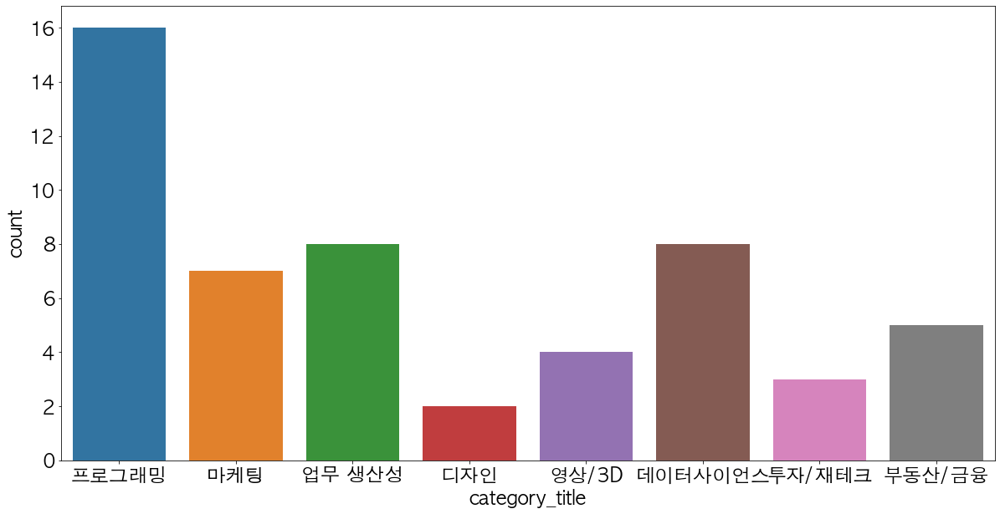

In [107]:
plt.figure(figsize=(20, 10))
sns.countplot(data=loyal_1, x='category_title')

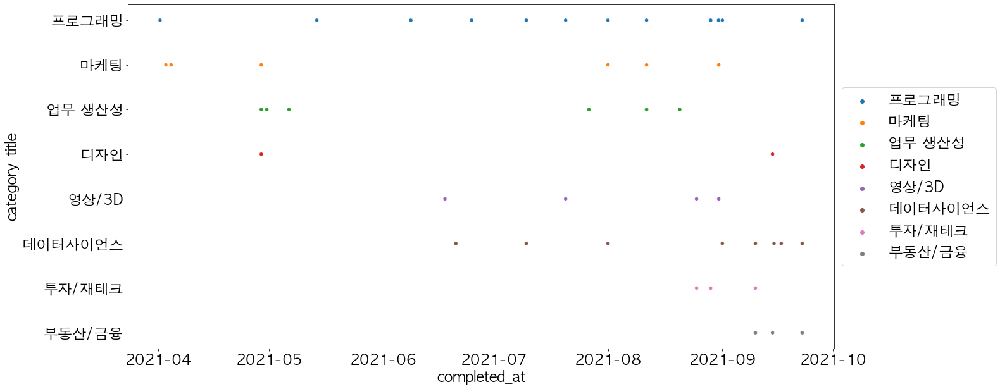

In [108]:
sns.scatterplot(data=loyal_1, x="completed_at", y = "category_title", hue="category_title")
plt.legend(loc='center left', bbox_to_anchor=(1, 0.5))

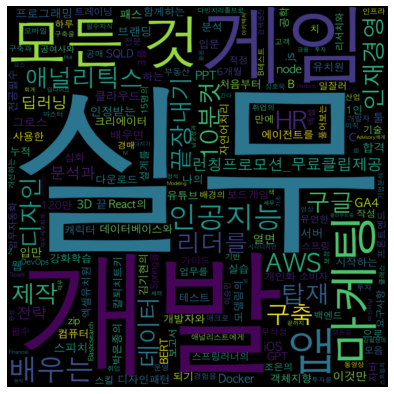

In [109]:
text = " ".join(i for i in loyal_1['course_title'])
stopwords = set(STOPWORDS)
stopwords.add('올인원')
stopwords.add('초격차')
stopwords.add('패키지')
stopwords.add('번에')
stopwords.add('한번에')
stopwords.add('끝내는')
stopwords.add('한')
stopwords.add('RED')
stopwords.add('권오상의 금융 아카데미')
stopwords.add('아카데미')
stopwords.add('활용한')
stopwords.add('위한')
# img = Image.open(‘책_검은배경.jpeg’)
# img_array = np.array(img)
wordcloud = WordCloud(font_path='AppleGothic',
                      width=400,
                      height=400,
                      scale=2.0,
                      max_font_size=250,
#                       mask=img_array,
                      stopwords=stopwords).generate(text)
plt.figure( figsize=(10,7))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
plt.show()

#### TOP 1. 다재다능 98685
* Favorite category: 프로그래밍  
프로그래밍(16) > 업무생산성 = 데이터 사이언스(8) > 마케팅(7) > 금융(5) > 영상/3D(4) > 디자인(2)
* 프로그래밍, 마케팅 강의를 지속적으로 구매한 것으로 보아 분야에 종사하는 사람이라고 유추 가능.
* 다수의 강의 추가로 결제한 것으로 보아 패캠 강의 만족도 높다고 추정  
* 점차 영상, 데이터사이언스, 투자, 금융으로 관심사를 확장함.  
* 9, 10월에는 데이터 사이언스, 투자, 금융 분야에 관심이 많아짐.  

* 여러가지 카테고리에 관심을 가지는 유형. 아직 결제하지 않은 카테고리 강의의 광고를 지속적으로 노출시키기.   
e.g. 지식콘텐츠, 크리에티브, 비지니스 등

* 혹쉬,,중소기업 사장님..????
    -> 그렇다면 업무생산성 카고리의 강의들을 광고에 많이 노출시키자.
    -> 기업교육 서비스, 온라인 교육 구독 서비스 광고 노출




### 50769 
* 50769: 부동산, 개발, 분석
    -> 부동산에 관심이 많음
* 프로그래밍은 웹, 앱 개발 강의 위주로 수강
* 디자인 강의를 많이 듣고 있음
* 마케팅 강의도 다수 수강하고 있는 것으로 보아 키워드를 풀스택 개발자, 마케터 희망 추정가능

In [110]:
loyal_2 = df1[(df1['customer_id'] == 50769)]
loyal_2.iloc[:,[1,2,-2,-1]].value_counts().to_frame()

0
category_title course_title                                       transaction_amount completed_at          
데이터사이언스        The RED : 칼만필터를 활용한 자율주행 센서퓨전 기술 구현 by 조형기          209000            2021-07-08 23:36:04  1
               올인원 패키지 : 강필성의 머신러닝 아카데미                            104300            2021-07-25 21:58:57  1
투자/재테크         올인원 패키지 : 박세익 전무에게 배우는 주식 시장 분석 & 포트폴리오 운용 전략      -319000            2021-08-09 14:29:59  1
               올인원 패키지 : 아파트 말고 부동산 재테크 시작하기                       150500            2021-04-30 22:18:46  1
               초격차 패키지 : 한 번에 끝내는 부동산 경매/공매                        129000            2021-08-31 23:51:37  1
프로그래밍          The RED : 고객 경험을 개선하는 A/B테스트 기반 모바일 앱 개발 by 이승민     125300            2021-09-04 09:41:23  1
               The RED : 백엔드 에센셜 : 대용량 서비스를 위한 아키텍처 with Redis...  219000            2021-08-31 23:58:25  1
               The RED : 조은의 프론트엔드 실무 가이드 : 요구사항 분석과 적정 기술         159000            2021-08-15 23:17:44  1
               [런칭프로모션_무료클립제공] 올인원 패키지 : 박은종의 객체지향 설계를 위한 디자인패...  89000             2021-06-30 06:36:08  1
               시크릿코드 : 프론트엔드 실무 완성편                                173160            2021-06-04 14:34:35  1
               올인원 패키지 : 김민태의 프론트엔드 아카데미 : 제 1강 JavaScript & T...  89000             2021-04-30 21:26:24  1
               올인원 패키지 : 누적 다운로드 120만+ 1인 개발자와 함께하는 앱 개발 입문       -139000            2021-08-09 14:30:45  1
               올인원 패키지 : 파이썬 웹 개발                                  0                 2021-04-30 22:51:32  1
               초격차 패키지 : 30개 프로젝트로 배우는 iOS 앱 개발 with Swift         169000            2021-07-25 22:16:23  1
               초격차 패키지 : 한 번에 끝내는 AWS 인프라 구축과 DevOps 운영            158000            2021-08-16 12:47:42  1
               초격차 패키지 : 한 번에 끝내는 React의 모든 것                      189000            2021-07-25 23:40:34  1
               초격차 패키지 : 한 번에 끝내는 node.js 웹 프로그래밍                  79000             2021-05-23 23:46:23  1
               초격차 패키지 : 한 번에 끝내는 컴퓨터 공학 전공필수 & 인공지능 심화            32000             2021-08-11 13:52:44  1
                                                                   149000            2021-07-25 20:02:15  1
지식콘텐츠          경영의 신: core MBA                                     239000            2021-06-22 20:44:27  1
영상/3D          편집하는여자의 영상편집 마스터클래스 - 제 2강 10가지 편집기법으로 프리미어 레벨업하기!  37000             2021-09-10 20:47:41  1
               올인원 패키지 : 아카데미 : 편집하는여자의 영상편집 마스터클래스 - 제 1강 프리미...  78400             2021-06-13 23:20:09  1
마케팅            초격차 패키지 : 무조건 팔리는 SNS콘텐츠 끝장내기                       130500            2021-07-31 23:12:51  1
데이터사이언스        올인원 패키지 : 김기현의 BERT, GPT-3를 활용한 자연어처리               9000              2021-08-11 13:42:20  1
               올인원 패키지 : 클라우드를 활용한 데이터 파이프라인 구축                    339150            2021-09-22 23:33:18  1
디자인            초격차 패키지 : 한 번에 끝내는 포토샵 활용                           119200            2021-06-30 06:56:55  1
               초격차 패키지 : 한번에 끝내는 UX/UI 디자인                         56000             2021-04-30 21:57:18  1
마케팅            REC.ON : 틱톡(TikTok)                                 3000              2021-06-07 12:37:44  1
               The RED : 김영하 작가의 내 안의 숨은 이야기를 찾아 쓰는 법              119000            2021-06-30 06:22:14  1
               올인원 패키지 : 데이터 기반 마케팅 21                             57400             2021-04-01 17:55:43  1
               초격차 패키지 : 한 번에 끝내는 디지털 마케팅                          0                 2021-09-10 22:13:58  1
영상/3D          The RED : 탑 아티스트가 선택한 디렉터 : 권오준이 알려주는 영상 연출의 모든 것   135200            2021-07-25 21:37:30  1
부동산/금융         부동산 디벨로퍼 아카데미 : 상업용/숙박용 부동산 개발 The Real             279000            2021-09-22 23:31:54  1
               올인원 패키지 : 권오상의 금융 아카데미 - 권오상 회계사의 자금조달 분석 및 가치평...  249000            2021-06-08 23:08:27  1
               올인원 패키지 : 권오상의 금융 아카데미 - 권오상의 재무제표 분석 기초 (수강시간 제한)  225000            2021-04-30 21:46:58  1
               올인원 패키지 : 권오상의 금융 아카데미 - 권오상의 재무제표 분석 심화 (수강시간 제한)  249900            2021-04-30 21:41:37  1
  

In [111]:
print(loyal_2['category_title'].value_counts().sum(),'개 수강')
loyal_2['category_title'].value_counts().to_frame()

40 개 수강


,category_title
프로그래밍,15
마케팅,5
부동산/금융,5
데이터사이언스,4
투자/재테크,3
영상/3D,3
디자인,2
업무 생산성,2
지식콘텐츠,1


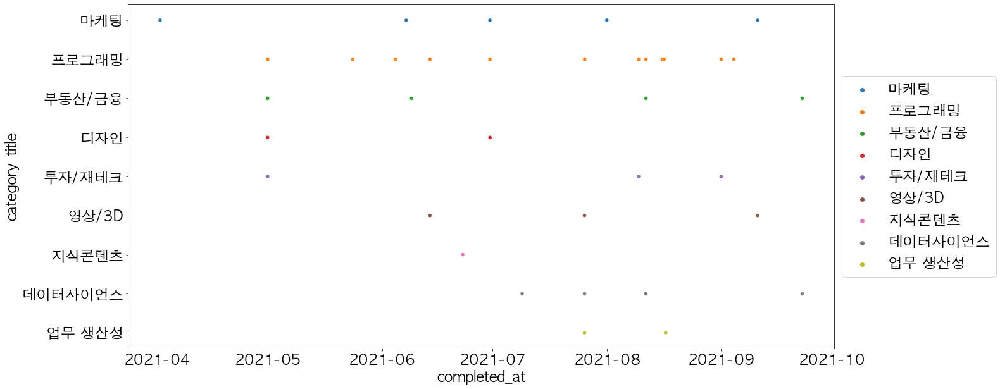

In [112]:
sns.scatterplot(data=loyal_2, x="completed_at", y = "category_title", hue="category_title")
plt.legend(loc='center left', bbox_to_anchor=(1, 0.5))

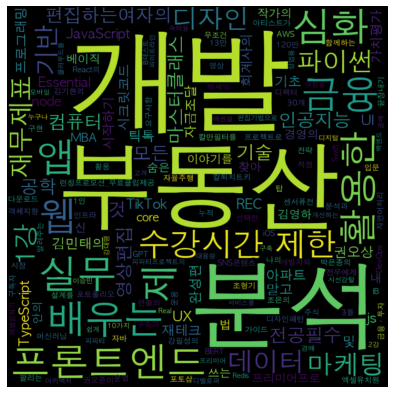

In [113]:
text = " ".join(i for i in loyal_2['course_title'])

stopwords = set(STOPWORDS)
stopwords.add('올인원')
stopwords.add('초격차')
stopwords.add('패키지')
stopwords.add('번에')
stopwords.add('한번에')
stopwords.add('끝내는')
stopwords.add('한')
stopwords.add('RED')
stopwords.add('권오상의')
stopwords.add('아카데미')
stopwords.add('위한')

wordcloud = WordCloud(font_path='AppleGothic',
                      width=400,
                      height=400,
                      scale=2.0,
                      max_font_size=120,
                      stopwords=stopwords).generate(text)

plt.figure( figsize=(10,7))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
plt.show()

#### 40783
* 전략, 개발, 웹

In [114]:
loyal_3 = df1[(df1['customer_id'] == 40783)]
loyal_3.iloc[:,[1,2,-2,-1]].value_counts().to_frame()

0
category_title course_title                                       transaction_amount completed_at          
데이터사이언스        프로모션 : 기초부터 시작하는 데이터분석 무제한 패스 (4월 프리패스)            299000             2021-04-18 19:24:33  1
업무 생산성         초격차 패키지 : 일잘러 필수 스킬 모음.zip                         119000             2021-07-24 18:20:09  1
프로그래밍          초격차 패키지 : 한 번에 끝내는 node.js 웹 프로그래밍                 74500              2021-07-05 22:00:26  1
               초격차 패키지 : 30개 프로젝트로 배우는 Android 앱 개발 with Kotlin   112000             2021-06-19 22:37:47  1
               올인원 패키지 : 파이썬 웹 개발                                 126000             2021-04-29 10:57:37  1
               올인원 패키지 : Android 앱 개발                             9500               2021-06-07 19:27:00  1
               [런칭프로모션_무료클립제공]초격차 패키지 : 한 번에 끝내는 React의 모든 것      133000             2021-07-05 21:58:35  1
               The RED : 김민태                                      177500             2021-07-30 19:08:09  1
               The RED : 견고한 UI 설계를 위한 마크업 가이드 by 정찬명             169000             2021-07-30 19:07:02  1
투자/재테크         올인원 패키지 : 박민수에게 배우는 직장인 초현실 투자 전략                  219000             2021-07-31 10:16:16  1
               올인원 패키지 : 15명의 전문 애널리스트에게 배우는 산업&매크로 분석과 투자 전략     299000             2021-06-29 22:26:49  1
크리에이티브         프로모션 : 콘텐츠 디자이너를 위한 커리어 백과사전 무제한 패스 (4월 프리패스)      640000             2021-04-18 19:15:01  1
영상/3D          초격차 패키지 : 한번에 끝내는 모션그래픽                            144000             2021-04-25 14:34:53  1
               용호수의 돈 버는 실전 영상 제작                                 118300             2021-09-07 23:28:05  1
               The RED : 탑 아티스트가 선택한 디렉터 : 권오준이 알려주는 영상 연출의 모든 것  159000             2021-07-18 20:18:48  1
업무 생산성         초격차 패키지 : 한번에 끝내는 PPT 제작/디자인                       70700              2021-05-06 21:23:01  1
               올인원 패키지 : 통계와 엑셀을 활용한 데이터 분석                       0                  2021-08-09 21:38:48  1
디자인            올인원 패키지 : 마디아의 UX/UI 포트폴리오                         102000             2021-06-19 22:43:07  1
업무 생산성         올인원 패키지 : 연봉도 배우면 바뀐다! 협상왕의 12가지 시스템 불패 전략         13300              2021-04-25 14:50:48  1
               올인원 패키지 : 1억 8천만명을 움직이는 실리콘밸리 슈퍼우먼이 알려주는 대체 불가 ... 159000             2021-07-30 19:05:50  1
               올인원 패키지 : 100억을 움직이는 단 10장의 PPT                    120000             2021-04-25 14:43:31  1
마케팅            초격차 패키지 : 무조건 팔리는 SNS콘텐츠 끝장내기                      130500             2021-07-30 19:04:24  1
               올인원 패키지 : 소비자 리서치와 보고서 작성                          0                  2021-06-07 21:51:43  1
               올인원 패키지 : 브랜딩 2020                                 153995             2021-04-25 01:22:31  1
               올인원 패키지 : 데이터 기반 마케팅 21                            136900             2021-04-25 01:17:06  1
               올인원 패키지 : 그로스 마케팅                                  123000             2021-04-25 01:11:34  1
               올인원 패키지 : 검색 최적화(SEO) 운영/전략                        105000             2021-04-25 01:09:06  1
               The RED : 지브리 스튜디오 제작국장에게 듣는 스토리텔링 기획법             128500             2021-06-19 22:31:05  1
디자인            초격차 패키지 : 한 번에 끝내는 포토샵 활용                          149000             2021-06-29 22:24:00  1
               초격차 패키지 : 세상의 모든 감성 아이패드 드로잉                       154000             2021-06-29 22:22:32  1
               올인원 패키지 : 소금툰과 함께 캐릭터 드로잉/굿즈/임티/컷툰                 18700              2021-06-07 19:29:22  1
               올인원 패키지 : 성공적인 UX를 위한 유저 리서치 by 카카오페이 리서처          0                  2021-06-07 19:17:42  1
프로그래밍          초격차 패키지 : 한번에 끝내는 Java/Spring 웹 개발 마스터             0                  2021-04-25 14:29:19  1

In [115]:
print(loyal_3['category_title'].value_counts().sum(),'개 수강')
loyal_3['category_title'].value_counts().to_frame()

33 개 수강


,category_title
프로그래밍,8
마케팅,7
업무 생산성,6
디자인,5
영상/3D,3
투자/재테크,2
크리에이티브,1
데이터사이언스,1


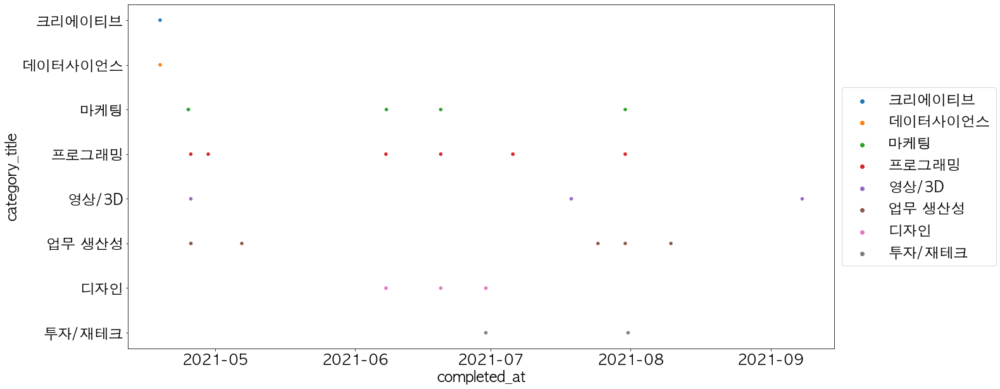

In [116]:
sns.scatterplot(data=loyal_3, x="completed_at", y = "category_title", hue="category_title")
plt.legend(loc='center left', bbox_to_anchor=(1, 0.5))

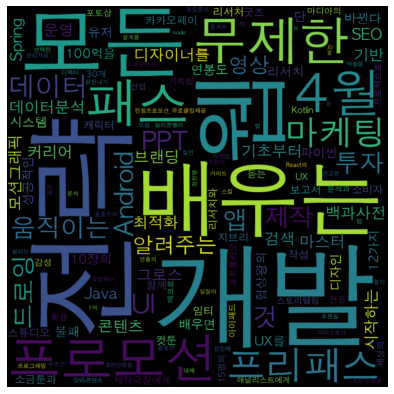

In [117]:
text = " ".join(i for i in loyal_3['course_title'])

stopwords = set(STOPWORDS)
stopwords.add('올인원')
stopwords.add('초격차')
stopwords.add('패키지')
stopwords.add('번에')
stopwords.add('한번에')
stopwords.add('끝내는')
stopwords.add('한')
stopwords.add('RED')
stopwords.add('권오상의 금융 아카데미')
stopwords.add('아카데미')
stopwords.add('위한')

wordcloud = WordCloud(font_path='AppleGothic',
                      width=400,
                      height=400,
                      scale=2.0,
                      max_font_size=120,
                      stopwords=stopwords).generate(text)

plt.figure( figsize=(10,7))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
plt.show()

### 72501
* 딥러닝, 개발, 입문

In [118]:
loyal_4 = df1[(df1['customer_id'] == 72501)]
loyal_4.iloc[:,[1,2,-2,-1]].value_counts().to_frame()

0
category_title course_title                                       transaction_amount completed_at          
데이터사이언스        The RED : Hadoop & Spark 아키텍처 딥다이브                 223200             2021-09-19 20:09:57  1
영상/3D          초격차 패키지 : 한번에 끝내는 VFX                              135200             2021-07-31 17:43:47  1
프로그래밍          초격차 패키지 : 한 번에 끝내는 AWS 인프라 구축과 DevOps 운영           158000             2021-07-31 18:59:04  1
               초격차 패키지 : 30개 프로젝트로 배우는 Android 앱 개발 with Kotlin   132000             2021-07-31 19:09:14  1
               올인원 패키지 : 유니티 포트폴리오 완성                             151500             2021-07-31 18:30:48  1
               올인원 패키지 : 누적 다운로드 120만+ 1인 개발자와 함께하는 앱 개발 입문       139000             2021-07-30 07:05:58  1
               시크릿코드 : 프론트엔드 실무 완성편                               92400              2021-04-02 16:04:35  1
               The RED : 현실 세상의 TDD by 이규원                        150000             2021-04-28 17:52:47  1
               The RED : 백엔드 에센셜 : 대용량 서비스를 위한 아키텍처 with Redis... 199000             2021-07-31 19:20:29  1
               The RED : 개발자로 살아남기 : 30년을 주도하는 9가지 필수 기술 by 박종천   110000             2021-05-21 18:06:18  1
영상/3D          올인원 패키지 : FX 아티스트 김재민의 리얼리스틱 후디니 입문                154700             2021-07-31 17:46:02  1
데이터사이언스        The RED : 칼만필터를 활용한 자율주행 센서퓨전 기술 구현 by 조형기         239000             2021-07-31 19:16:48  1
디자인            올인원 패키지 : 소금툰과 함께 캐릭터 드로잉/굿즈/임티/컷툰                 97000              2021-07-29 23:59:35  1
데이터사이언스        초격차 패키지 : 한 번에 끝내는 딥러닝/인공지능                        199000             2021-07-31 18:21:39  1
               초격차 패키지 : 한 번에 끝내는 데이터 분석                          119000             2021-07-31 18:49:52  1
               올인원 패키지 : 클라우드를 활용한 데이터 파이프라인 구축                   339150             2021-09-19 20:07:52  1
               올인원 패키지 : 김기현의 BERT, GPT-3를 활용한 자연어처리              142400             2021-07-27 18:55:10  1
               올인원 패키지 : 강필성의 머신러닝 아카데미                           149000             2021-07-31 17:55:58  1
               올인원 패키지 : Elasticsearch로 하루만에 고급 검색 엔진 만들기         279000             2021-07-30 00:02:15  1
               바이블 : 파이썬 기초부터 시작하는 딥러닝 영상인식                       119000             2021-04-13 11:43:37  1
프로그래밍          초격차 패키지 : 한번에 끝내는 Java/Spring 웹 개발 마스터             0                  2021-04-01 11:43:38  1

In [119]:
print(loyal_4['category_title'].value_counts().sum(),'개 수강')
loyal_4['category_title'].value_counts().to_frame()

21 개 수강


,category_title
프로그래밍,9
데이터사이언스,9
영상/3D,2
디자인,1


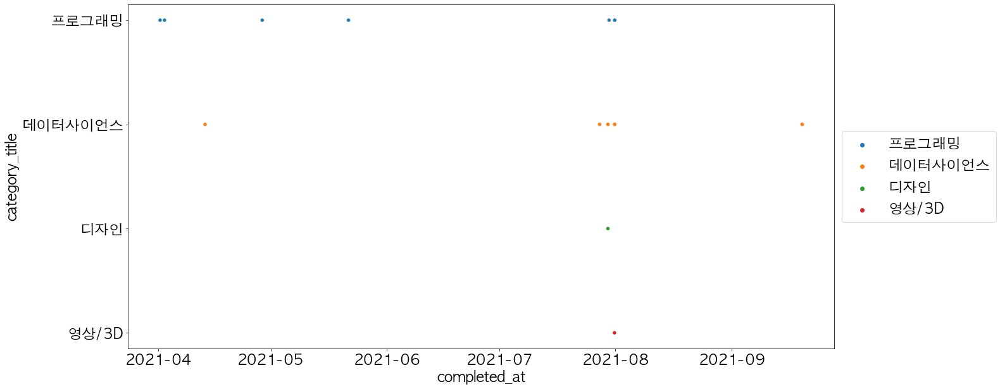

In [120]:
sns.scatterplot(data=loyal_4, x="completed_at", y = "category_title", hue="category_title")
plt.legend(loc='center left', bbox_to_anchor=(1, 0.5))

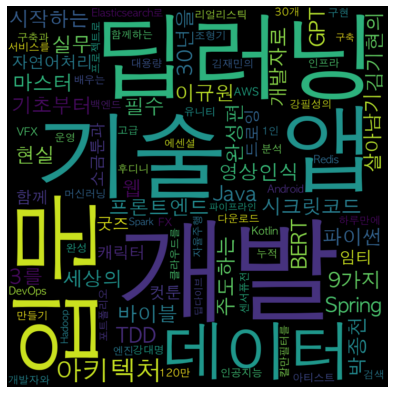

In [121]:
text = " ".join(i for i in loyal_4['course_title'])

stopwords = set(STOPWORDS)
stopwords.add('올인원')
stopwords.add('초격차')
stopwords.add('패키지')
stopwords.add('번에')
stopwords.add('한번에')
stopwords.add('끝내는')
stopwords.add('위한')
stopwords.add('한')
stopwords.add('RED')
stopwords.add('권오상의 금융 아카데미')
stopwords.add('아카데미')
stopwords.add('활용한')

wordcloud = WordCloud(font_path='AppleGothic',
                      width=400,
                      height=400,
                      scale=2.0,
                      max_font_size=120,
                      stopwords=stopwords).generate(text)

plt.figure( figsize=(10,7))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
plt.show()

### 20784
* 딥러닝, node, 웹, 프로그래밍

In [122]:
loyal_5 = df1[(df1['customer_id'] == 20784)]
loyal_5.iloc[:,[1,2,-2,-1]].value_counts().to_frame()

0
category_title course_title                                       transaction_amount completed_at          
데이터사이언스        The RED : 검색엔진 구축을 위한 Elasticsearch 마스터 클래스 by 정호욱  399000            2021-09-08 08:55:20  1
영상/3D          올인원 패키지 : 누적 조회수 12억! 우감독의 재미있는 영상 편집               109000            2021-04-24 16:04:26  1
프로그래밍          초격차 패키지 : 게임 개발자 취업의 모든 것                           207200            2021-08-31 06:55:14  1
               올인원 패키지 : 코딩 첫 걸음 프로젝트                              128500            2021-07-27 17:05:14  1
               올인원 패키지 : 최성일의 코딩 초급자를 위한 웹 모션 디자인                  104300            2021-08-23 18:59:28  1
               올인원 패키지 : TypeScript & Angular 실전                   46200             2021-04-26 22:01:16  1
               올인원 패키지 : Node 웹 프로그래밍                              0                 2021-04-26 21:53:17  1
               올인원 패키지 : HTML/CSS, JavaScript                      6000              2021-03-29 21:24:46  1
               The RED : 조은의 프론트엔드 실무 가이드 : 요구사항 분석과 적정 기술         111300            2021-08-09 21:03:45  1
               (프로모션 7/16-7/29) 초격차 패키지 : 한 번에 끝내는 Spring 완.전.판    125300            2021-07-27 17:12:23  1
투자/재테크         올인원 패키지 : 아파트 말고 부동산 재테크 시작하기                       150500            2021-04-21 16:44:21  1
지식콘텐츠          경영의 신: core MBA                                     239000            2021-07-10 08:01:19  1
영상/3D          초격차 패키지 : 한 번에 끝내는 유튜브 크리에이터 되기                     87200             2021-06-16 00:39:31  1
               올인원 패키지 : FX 아티스트 김재민의 리얼리스틱 후디니 입문                 154700            2021-07-27 17:07:39  1
데이터사이언스        The RED : 칼만필터를 활용한 자율주행 센서퓨전 기술 구현 by 조형기         -209000            2021-07-09 13:11:44  1
업무 생산성         초격차 패키지 : 한번에 끝내는 PPT 제작/디자인                       -99000             2021-05-06 13:19:02  1
마케팅            초격차 패키지 : 한 번에 끝내는 디지털 마케팅                          182400            2021-08-31 19:12:50  1
               올인원 패키지 : 데이터 기반 마케팅 21                             62200             2021-06-08 23:53:57  1
               올인원 패키지 : GA4 탑재, 구글 애널리틱스 끝장내기                     55300             2021-04-03 07:18:17  1
               올인원 패키지 : 30개 글감으로 에세이 작가되기 BY.정영욱                  99000             2021-04-21 16:49:01  1
디자인            초격차 패키지 : 확실하게 끝내는 포토샵&일러스트레이터                      113050            2021-05-05 17:35:34  1
데이터사이언스        초격차 패키지 : 한 번에 끝내는 머신러닝과 데이터분석 A-Z                  158400            2021-08-23 18:56:31  1
               초격차 패키지 : 한 번에 끝내는 딥러닝/인공지능                         199000            2021-07-27 17:00:19  1
               올인원 패키지 : 강필성의 머신러닝 아카데미                            104300            2021-07-09 13:55:29  1
               바이블 : 파이썬 기초부터 시작하는 딥러닝 영상인식                        119000            2021-04-08 06:59:28  1
               The RED : 현실 데이터를 활용한 추천시스템 구현 A to Z by 번개장터 C...  335200            2021-09-08 08:58:56  1
프로그래밍          초격차 패키지 : 한 번에 끝내는 node.js 웹 프로그래밍                  0                 2021-05-07 19:40:20  1

In [123]:
print(loyal_5['category_title'].value_counts().sum(),'개 수강')
loyal_5['category_title'].value_counts().to_frame()

27 개 수강


,category_title
프로그래밍,9
데이터사이언스,7
마케팅,4
영상/3D,3
투자/재테크,1
디자인,1
업무 생산성,1
지식콘텐츠,1


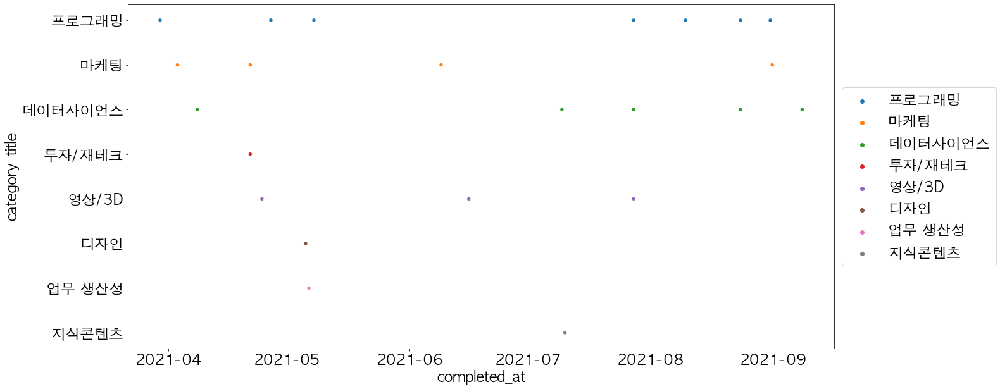

In [124]:
sns.scatterplot(data=loyal_5, x="completed_at", y = "category_title", hue="category_title")
plt.legend(loc='center left', bbox_to_anchor=(1, 0.5))

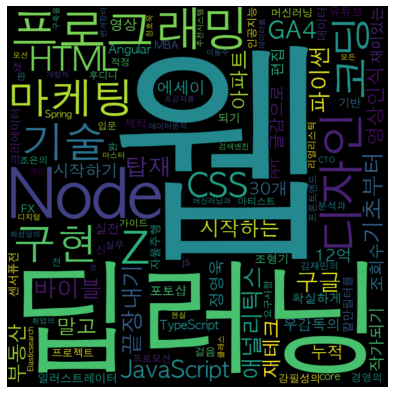

In [125]:
text = " ".join(i for i in loyal_5['course_title'])
stopwords = set(STOPWORDS)
stopwords.add('올인원')
stopwords.add('초격차')
stopwords.add('패키지')
stopwords.add('번에')
stopwords.add('한번에')
stopwords.add('끝내는')
stopwords.add('한')
stopwords.add('위한')
stopwords.add('RED')
stopwords.add('권오상의 금융 아카데미')
stopwords.add('아카데미')
stopwords.add('활용한')

wordcloud = WordCloud(font_path='AppleGothic',
                      width=400,
                      height=400,
                      scale=2.0,
                      max_font_size=250,
                      stopwords=stopwords).generate(text)

plt.figure( figsize=(10,7))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
plt.show()

### 커리어 패스를 꾀하는 538965
* 2일 만에 200만원 이상 결제한 것으로 보아 퇴사 욕구가 엄청나 보임ㅎㅅㅎ 
* 6개월 치 업무를 하루 만에 끝내는 업무자동화
* 워라밸을 완성하는 직장인 필수스킬 프리패스
 -> 효율적으로 일하고 싶은 마음이 보임,,

In [126]:
loyal_10 = df1[(df1['customer_id'] == 538965)]
loyal_10.iloc[:,[1,2,-2,-1]].value_counts().to_frame()

0
category_title course_title                                       transaction_amount completed_at          
데이터사이언스        프로모션 : 기초부터 시작하는 데이터분석 프리패스 (5월 삼성 패키지 현물 :  삼성... 990000             2021-05-24 13:28:17  1
업무 생산성         올인원 패키지 : 6개월 치 업무를 하루 만에 끝내는 업무자동화                109000             2021-05-23 17:15:12  1
               프로모션 : 워라밸을 완성하는 직장인 필수스킬 프리패스 (5월 삼성 패키지 현물 : ... 990000             2021-05-23 17:22:25  1
프로그래밍          초격차 패키지 : 한 번에 끝내는 파이썬 웹 개발                        99000              2021-06-29 18:11:09  1
               프로모션 : 개발자를 위한 코딩 만능 백과사전 PASS (6월 프리패스)           640000             2021-06-01 15:11:24  1
               합격 패스 : 정보처리기사 필기&실기                               9900               2021-06-25 01:47:20  1

In [127]:
print(loyal_10['category_title'].value_counts().sum(),'개 수강')
loyal_10['category_title'].value_counts().to_frame()

6 개 수강


,category_title
프로그래밍,3
업무 생산성,2
데이터사이언스,1


## Popular categories of Top10

In [128]:
# TOP 10에게 가장 인기가 많은 카테고리는 무엇인지

# 1. TOP 10dml data frame 따로 만들기
Top10 = df1[(df1['customer_id'] == 98685) | (df1['customer_id'] == 50769) | (df1['customer_id'] == 40783) 
    | (df1['customer_id'] == 72501) | (df1['customer_id'] == 20784) | (df1['customer_id'] == 65665)
   | (df1['customer_id'] == 631) | (df1['customer_id'] == 417924) | (df1['customer_id'] == 6526) | (df1['customer_id'] == 538965)]

Top10.groupby('customer_id').describe()

transaction_amount                                           \
                         count      mean       std        min       25%   
customer_id                                                               
631                      19.00 155684.21  44749.69   97000.00 115650.00   
6526                     22.00 130288.64  97725.93       0.00  69775.00   
20784                    27.00 110668.52 119395.43 -209000.00  58750.00   
40783                    33.00 132224.09 118464.97       0.00  74500.00   
50769                    40.00 112852.75 114312.53 -319000.00  66325.00   
65665                    27.00 109588.89  54668.45       0.00  81900.00   
72501                    21.00 158454.76  71399.83       0.00 119000.00   
98685                    53.00 132844.34  91502.89       0.00  79000.00   
417924                   19.00 153015.79 102120.58  -33000.00  94000.00   
538965                    6.00 472983.33 458104.92    9900.00 101500.00   

                                           
                  50%       75%       max  
customer_id                                
631         169000.00 178200.00 259000.00  
6526        114750.00 174412.50 339000.00  
20784       111300.00 156550.00 399000.00  
40783       126000.00 154000.00 640000.00  
50769       122250.00 170040.00 339150.00  
65665       118300.00 141250.00 199000.00  
72501       149000.00 199000.00 339150.00  
98685       129000.00 158400.00 399000.00  
417924      159000.00 190250.00 399000.00  
538965      374500.00 902500.00 990000.00

In [129]:
# groupby 참조: https://rfriend.tistory.com/383



category_title_count = Top10['category_title']#.groupby(Top10['customer_id'])
category_title_count1 = category_title_count.value_counts().to_frame().reset_index()
category_title_count1.columns=['category_title', 'total']
category_title_count1 #['category_title']

print(len(category_title_count),'개 수강')

267 개 수강


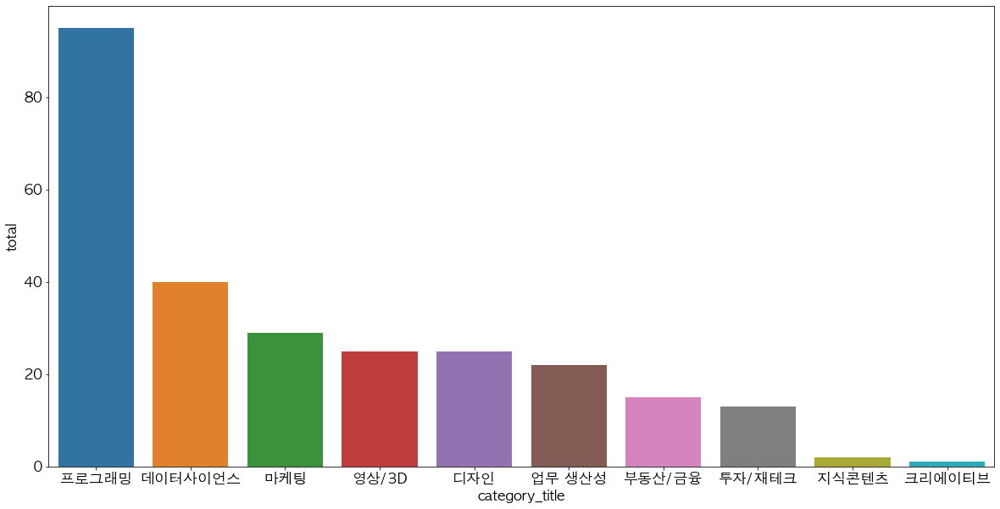

In [130]:
plt.figure(figsize=(20, 10))
plt.rcParams['font.size'] = 17
sns.barplot(data =category_title_count1, x='category_title', y = 'total')

plt.show()

**프로그래밍(95) > 데이터사이언스(40) > 마케팅(29) > 영상/3D = 디자인(25) > 업무 생산성(22) > 부동산/금융(15) > 투자/재테크(13) > 기타(3)**

## Summary. B2C Loyal customer

* 프로그래밍 강의를 눈에 띄게 많이 결제했다.  
    -> wordcloud를 보면 '개발'이라는 단어가 모두 포함되어 있음
    -> course_title을 살펴보면 앱 개발, 웹 개발 강의가 다수  
* 고객층은 개발자로의 커리어 전환을 원하거나, 자기계발을 하는 사람 
* 생각보다 충성 고객은 크리에이티브 분야 강의를 듣지 않음.  
    -> 잠시만,, 크리에이티브 카테고리가 없는데? 없어졌나봐;


210329_210926 데이터로 분석.  
2019 ~ 2022년 1월 기준 자사 데이터로 분석한 결과.  
코로나 19 이후 가장 큰 폭으로 성장한 분야는 'IT/데이터'.  
특히 프론트엔드 개발 분야의 성장세는 이번 PJT 데이터에서도 확인 가능  
해당 리포트에서 2021 패스트캠퍼스 고객 1명당 평균 강의 수는 2.71개라고 했지만 PJT데이터에서는 인당 약 1.4임. 1월에 결제 건수가 많다니까 ok.  
**근데 표준편차가 커보임!! 가능하면 계산해보기.**

In [131]:
df1['category_title'].value_counts().sum()
print(df1['category_title'].value_counts().to_frame())

# 1인당 평균 강의 수 : 1.4 개
print('인당 평균 강의 개수:', round(len(df1) / len(df1.groupby('customer_id')),2))

         category_title
프로그래밍             18187
데이터사이언스            7318
업무 생산성             6939
디자인                6146
영상/3D              5519
마케팅                5067
부동산/금융             3007
투자/재테크             1597
크리에이티브              939
비즈니스                 23
지식콘텐츠                23
파이낸스                 18
인당 평균 강의 개수: 1.4


# 카테고리별 심층 분석

## 카테고리별 거래 건수 확인 및 전처리

In [132]:
df['category_title'].value_counts()

프로그래밍      19063
데이터사이언스     7358
업무 생산성      6968
디자인         6173
영상/3D       5519
마케팅         5077
부동산/금융      3012
투자/재테크      1597
크리에이티브       954
교육           932
비즈니스          24
지식콘텐츠         23
파이낸스          19
Name: category_title, dtype: int64

In [133]:
#'category_title' column 을 기준으로 정렬
sorted_df = df.sort_values('category_title')
sorted_df #정렬된 DataFrame으로 새로 할당

,index,id,customer_id,course_id,type,state,course_title,category_title,format,completed_at,...,is_design,is_programming,is_business,date,year,month,week,quarter,day_of_week,hour
11390,24200,1050813,517734,205183,PAYMENT,COMPLETED,(B2B) 랍비투비 온라인 구독 올 플랜 - 비대면바우처,교육,B2B 온라인,2021-04-30 17:12:18,...,0,0,1,2021-04-30 17:12:18,2021,4,17,2,Friday,17
39508,81845,1253013,615773,206446,PAYMENT,COMPLETED,(B2B) 더화이트커뮤니케이션(주) 온라인 구독 올 플랜 - 2차,교육,B2B 온라인,2021-07-30 16:21:44,...,0,0,1,2021-07-30 16:21:44,2021,7,30,3,Friday,16
5748,12290,1009961,496653,204755,PAYMENT,COMPLETED,(B2B) 람스타일컴퍼니 온라인 구독 올 플랜 - 비대면바우처,교육,B2B 온라인,2021-04-12 15:49:52,...,0,0,1,2021-04-12 15:49:52,2021,4,15,2,Monday,15
5747,12288,1009958,496648,204749,PAYMENT,COMPLETED,(B2B) 아이템스카우트 온라인 구독 올 플랜 - 비대면바우처,교육,B2B 온라인,2021-04-12 15:47:16,...,0,0,1,2021-04-12 15:47:16,2021,4,15,2,Monday,15
19473,41084,1097643,541180,203426,PAYMENT,COMPLETED,(B2B) 워게이밍 유한회사 온라인 구독 올 플랜 - 패파입주사,교육,B2B 온라인,2021-05-25 15:03:22,...,0,0,1,2021-05-25 15:03:22,2021,5,21,2,Tuesday,15
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
41667,84944,1270030,625050,206847,PAYMENT,COMPLETED,(B2B) K-Digital Credit 빅데이터 분석 첫걸음 시작하기_4기,프로그래밍,B2G,2021-08-07 13:12:13,...,0,1,0,2021-08-07 13:12:13,2021,8,31,3,Saturday,13
19483,41104,1097470,65056,204722,REFUND,COMPLETED,밑바닥부터 배포까지 클론코딩 온라인 완주반 2기,프로그래밍,온라인 완주반,2021-05-25 15:32:24,...,0,1,0,2021-05-25 15:32:24,2021,5,21,2,Tuesday,15
41665,84940,1270016,618201,0,PAYMENT,COMPLETED,프로모션 : 취업까지 순식간! 개발 취준생을 위한 합격 평생 PASS (8월 프리패스),프로그래밍,올인원,2021-08-07 12:57:10,...,0,1,0,2021-08-07 12:57:10,2021,8,31,3,Saturday,12
41662,84936,1269996,625030,203942,PAYMENT,COMPLETED,초격차 패키지 : 30개 프로젝트로 배우는 Android 앱 개발 with Kotlin,프로그래밍,올인원,2021-08-07 12:34:10,...,0,1,0,2021-08-07 12:34:10,2021,8,31,3,Saturday,12


In [134]:
trimmed_df = sorted_df
trimmed_df.astype({'transaction_amount' : 'float64'}) #transaction_amount 자료형을 float로 변환

,index,id,customer_id,course_id,type,state,course_title,category_title,format,completed_at,...,is_design,is_programming,is_business,date,year,month,week,quarter,day_of_week,hour
11390,24200,1050813,517734,205183,PAYMENT,COMPLETED,(B2B) 랍비투비 온라인 구독 올 플랜 - 비대면바우처,교육,B2B 온라인,2021-04-30 17:12:18,...,0,0,1,2021-04-30 17:12:18,2021,4,17,2,Friday,17
39508,81845,1253013,615773,206446,PAYMENT,COMPLETED,(B2B) 더화이트커뮤니케이션(주) 온라인 구독 올 플랜 - 2차,교육,B2B 온라인,2021-07-30 16:21:44,...,0,0,1,2021-07-30 16:21:44,2021,7,30,3,Friday,16
5748,12290,1009961,496653,204755,PAYMENT,COMPLETED,(B2B) 람스타일컴퍼니 온라인 구독 올 플랜 - 비대면바우처,교육,B2B 온라인,2021-04-12 15:49:52,...,0,0,1,2021-04-12 15:49:52,2021,4,15,2,Monday,15
5747,12288,1009958,496648,204749,PAYMENT,COMPLETED,(B2B) 아이템스카우트 온라인 구독 올 플랜 - 비대면바우처,교육,B2B 온라인,2021-04-12 15:47:16,...,0,0,1,2021-04-12 15:47:16,2021,4,15,2,Monday,15
19473,41084,1097643,541180,203426,PAYMENT,COMPLETED,(B2B) 워게이밍 유한회사 온라인 구독 올 플랜 - 패파입주사,교육,B2B 온라인,2021-05-25 15:03:22,...,0,0,1,2021-05-25 15:03:22,2021,5,21,2,Tuesday,15
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
41667,84944,1270030,625050,206847,PAYMENT,COMPLETED,(B2B) K-Digital Credit 빅데이터 분석 첫걸음 시작하기_4기,프로그래밍,B2G,2021-08-07 13:12:13,...,0,1,0,2021-08-07 13:12:13,2021,8,31,3,Saturday,13
19483,41104,1097470,65056,204722,REFUND,COMPLETED,밑바닥부터 배포까지 클론코딩 온라인 완주반 2기,프로그래밍,온라인 완주반,2021-05-25 15:32:24,...,0,1,0,2021-05-25 15:32:24,2021,5,21,2,Tuesday,15
41665,84940,1270016,618201,0,PAYMENT,COMPLETED,프로모션 : 취업까지 순식간! 개발 취준생을 위한 합격 평생 PASS (8월 프리패스),프로그래밍,올인원,2021-08-07 12:57:10,...,0,1,0,2021-08-07 12:57:10,2021,8,31,3,Saturday,12
41662,84936,1269996,625030,203942,PAYMENT,COMPLETED,초격차 패키지 : 30개 프로젝트로 배우는 Android 앱 개발 with Kotlin,프로그래밍,올인원,2021-08-07 12:34:10,...,0,1,0,2021-08-07 12:34:10,2021,8,31,3,Saturday,12


## 카테고리별 transaction_amount 분석

**카테고리별 평균값을 구했습니다.**

In [135]:
transaction_mean = {
    "transaction_amount" : [np.mean]
}

trimmed_df.groupby('category_title').agg(transaction_mean)

,transaction_amount
,mean
category_title,
교육,1244984.49
데이터사이언스,206947.35
디자인,107421.12
마케팅,144692.89
부동산/금융,157916.48
비즈니스,224577.71
업무 생산성,85394.58
영상/3D,98696.54


Text(0, 0.5, 'transaction_amount_mean')

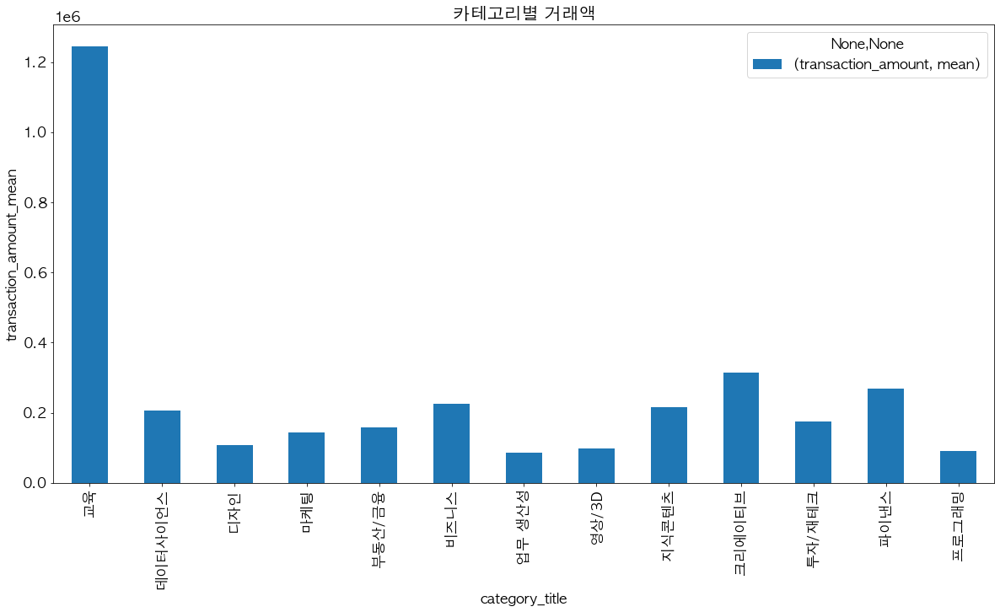

In [136]:
trimmed_ta_df = trimmed_df.groupby('category_title').agg(transaction_mean)
trimmed_ta_df.plot(kind = 'bar' ) #시각화
plt.title("카테고리별 거래액")
plt.xlabel("category_title")
plt.ylabel("transaction_amount_mean")

**카테고리별 평균 거래액 비교**

In [137]:
trimmed_ta_df['transaction_amount'].sort_values
#교육이 transaction amount 가장 높다. B2B 교육이 매출이 많다.

<bound method DataFrame.sort_values of                      mean
category_title           
교육             1244984.49
데이터사이언스         206947.35
디자인             107421.12
마케팅             144692.89
부동산/금융          157916.48
비즈니스            224577.71
업무 생산성           85394.58
영상/3D            98696.54
지식콘텐츠           216086.96
크리에이티브          315572.15
투자/재테크          173892.56
파이낸스            268421.05
프로그래밍            89779.61>

## 환불율 구하는 클래스 선언

In [138]:
class refund_data:
    def __init__(self , category):
        category_condition = trimmed_df['category_title'] == category
        self.category_df = trimmed_df[category_condition]
        category_df = self.category_df #생성자
        
    def sub_category(self, sub_title): #변수에 서브 카테고리 타이틀
        category_df = self.category_df
        sub_mask = category_df['subcategory_title'] == sub_title
        return category_df[sub_mask] #서브카테고리만 슬라이싱해서 리턴
    
    def refund(self,sub_title):
        sub_df = self.sub_category(sub_title)
        refund_check_cond = sub_df['type'] == 'REFUND' #REFUND 찾는 조건식
        return sub_df[refund_check_cond] #서브 카테고리에서 타입이 REFUND인 자료 모두 리턴 , 환불전체 건수를 알 수 있다.
    
    def refund_amount_print(self,sub_title): #환불건수 프린트하는 메소드
        refund_sub_df = self.refund(sub_title)
        print(len(refund_sub_df)) 
    
    def refund_plus(self,sub_title):
        sub_df = self.sub_category(sub_title) #서브카테고리 전체 자료
        refund_sub_df = self.refund(sub_title) #타입이 REFUND인 자료
        id_check_cond_refund = sub_df['customer_id'].isin(list(refund_sub_df['customer_id'])) #환불한 id에 속하는지 확인하는 조건, 이번기 구매도 같이 한 건수를 찾기 위함
        return sub_df[id_check_cond_refund].sort_values(by=["customer_id"], ascending=[True]) #환불을 한 번이라도 한 자료를 구했음 (이번기 환불만 or 이번기 구매+환불) #id로 정렬해서 묶었음.
    
    def refund_plus_amount_print(self, sub_title): #환불을 한 번이라도 한 건수프린트하는 메소드
        sub_df_sorted = self.refund_plus(sub_title)
        print(len(sub_df_sorted))

    def pair_refund(self, sub_title): #PAYMENT , REFUND 짝이 맞는 자료를 구하는 메소드
        sub_df_sorted = self.refund_plus(sub_title)
        return sub_df_sorted[sub_df_sorted['type'] == 'PAYMENT']

    def pair_refund_print(self, sub_title): #PAYMENT , REFUND 짝이 맞는 건수를 출력하는 메소드
        sub_df_sorted = self.refund_plus(sub_title)
        print(len(sub_df_sorted[sub_df_sorted['type'] == 'PAYMENT'])) 

    def refund_ratio(self, sub_title): #환불율을 구하는 메소드
        sub_df = self.sub_category(sub_title)
        refund_sub_df = self.refund(sub_title)
        refund_plus_df = self.refund_plus(sub_title)
        refund_pair_df = self.pair_refund(sub_title)
        only_refund = len(refund_plus_df) - 2*len(refund_pair_df) #오직 이번기간에 환불한 건수를 구했다. #한 번이라도 환불한 건수 - payment,refund 쌍을 뺌
        refund_ratio = round((len(refund_sub_df) - only_refund) / (len(sub_df) - only_refund) *100 , 2)
        #환불율을 구하면 >> 분모에는 (전체 데이터 분석 거래수 - 이번기에 구매 안 하고 환부란 한 거래 건수) ,분자에는 (전체 환불 거래수 - 이번기에 구매 안 하고 환부란 한 거래 건수)
        return refund_ratio

## 데이터사이언스 category 분석

### category 데이터사이언스의 sub_category 분석

In [139]:
condition_data_science = trimmed_df['category_title'] == '데이터사이언스'
trimmed_df[condition_data_science]['subcategory_title'].unique() #서브카테고리 value들 살펴봄

array(['딥러닝/인공지능', '데이터분석', nan, '머신러닝', '데이터엔지니어링'], dtype=object)

**Nan 값들은 그냥 '데이터사이언스'로 변경하겠습니다.**

In [140]:
datascience_df = trimmed_df[condition_data_science]
null_delete_condition_data = datascience_df['subcategory_title'].isna() #Nan값 확인하는 조건
datascience_df.loc[null_delete_condition_data , 'subcategory_title'] = '데이터사이언스' 

**Nan값을 가지는 index, subcategory_title의 값(Nan)을 모두 데이터사이언스로 변환**

In [141]:
datascience_df.groupby('subcategory_title').agg(transaction_mean) #서브카테고리별 거래액 구했다. 데이터 사이언스(기존의 Nan)의 거래액이 높다.

,transaction_amount
,mean
subcategory_title,
데이터분석,97393.50
데이터사이언스,625471.97
데이터엔지니어링,259096.84
딥러닝/인공지능,117323.10
머신러닝,97111.17


Text(0, 0.5, 'transaction_amount_mean')

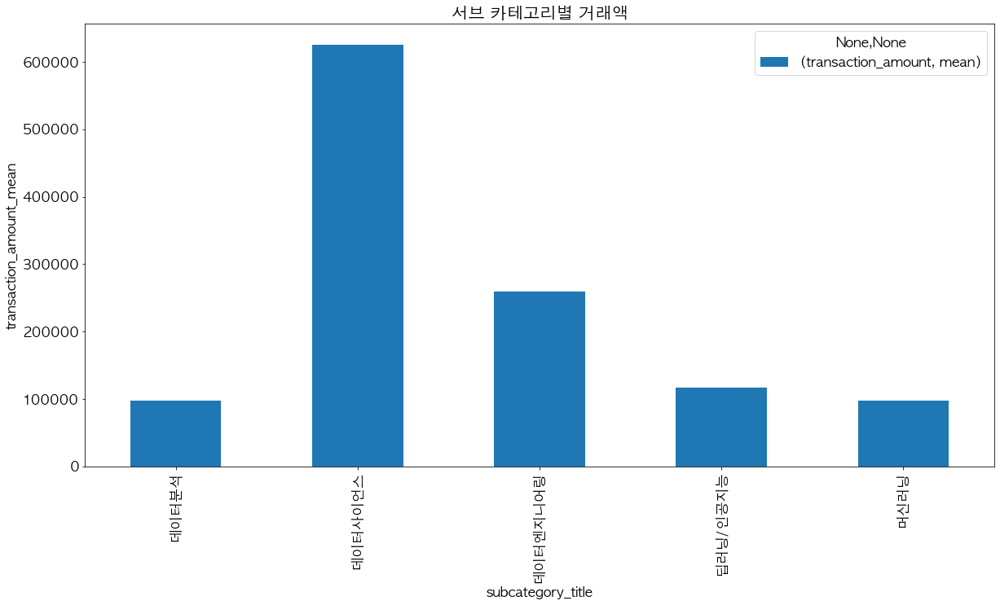

In [142]:
mean_ta_datascience_df = datascience_df.groupby('subcategory_title').agg(transaction_mean)
mean_ta_datascience_df.plot(kind = 'bar' ) #시각화
plt.title("서브 카테고리별 거래액")
plt.xlabel("subcategory_title")
plt.ylabel("transaction_amount_mean") #기존에 Nan값이었던 데이터 사이언스의 거래액이 가장 높음.

**기존의 Nan값인 '데이터사이언스' 서브카테고리의 거래액이 평균적으로 가장 많습니다.**

### 데이터사이언스의 subcategory 중  '데이터사이언스'(기존의 Nan)분석

In [143]:
not_refund_cond = datascience_df['transaction_amount'] > 0
what_cond = datascience_df['transaction_amount'] == 5

**조건을 만들었습니다.**

**거래액이 양수인 조건**

**거래액이 5인 자료를 확인하는 조건**

In [144]:
datascience_df[not_refund_cond]

,index,id,customer_id,course_id,type,state,course_title,category_title,format,completed_at,...,is_design,is_programming,is_business,date,year,month,week,quarter,day_of_week,hour
6630,14146,1012698,120686,204035,PAYMENT,COMPLETED,바이블 : 파이썬 기초부터 시작하는 딥러닝 영상인식,데이터사이언스,올인원,2021-04-16 16:05:43,...,0,1,0,2021-04-16 16:05:43,2021,4,15,2,Friday,16
47189,92435,1303051,137922,205548,PAYMENT,COMPLETED,초격차 패키지 : 한 번에 끝내는 데이터 분석,데이터사이언스,올인원,2021-08-23 17:51:23,...,0,1,0,2021-08-23 17:51:23,2021,8,34,3,Monday,17
6677,14227,1013813,498757,0,PAYMENT,COMPLETED,[한정판매] 자연어 A-Z 끝장 패키지(~4월),데이터사이언스,올인원,2021-04-16 17:45:39,...,0,1,0,2021-04-16 17:45:39,2021,4,15,2,Friday,17
6459,13812,1012326,498155,202357,PAYMENT,COMPLETED,올인원 패키지 : 직장인을 위한 파이썬 데이터분석,데이터사이언스,올인원,2021-04-15 22:52:45,...,0,1,0,2021-04-15 22:52:45,2021,4,15,2,Thursday,22
7363,15818,1018570,501602,202357,PAYMENT,COMPLETED,올인원 패키지 : 직장인을 위한 파이썬 데이터분석,데이터사이언스,올인원,2021-04-19 21:17:53,...,0,1,0,2021-04-19 21:17:53,2021,4,16,2,Monday,21
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
14070,29914,1060042,522904,0,PAYMENT,COMPLETED,프로모션 : 기초부터 시작하는 데이터분석 무제한 99패스 (5월 프리패스),데이터사이언스,올인원,2021-05-09 11:35:18,...,0,1,0,2021-05-09 11:35:18,2021,5,18,2,Sunday,11
3855,8102,993576,487783,200681,PAYMENT,COMPLETED,올인원 패키지 : 머신러닝과 데이터분석 A-Z,데이터사이언스,올인원,2021-04-05 19:08:27,...,0,1,0,2021-04-05 19:08:27,2021,4,14,2,Monday,19
31203,66296,1182742,576259,203533,PAYMENT,COMPLETED,연습문제 패키지 : 퀴즈처럼 풀면서 배우는 파이썬 머신러닝 300제+,데이터사이언스,올인원,2021-06-30 22:16:13,...,0,1,0,2021-06-30 22:16:13,2021,6,26,2,Wednesday,22
22217,46864,1115107,95042,202674,PAYMENT,COMPLETED,올인원 패키지 : 수학적으로 접근하는 딥러닝,데이터사이언스,올인원,2021-06-01 15:33:01,...,0,1,0,2021-06-01 15:33:01,2021,6,22,2,Tuesday,15


**거래액이 양수인 자료만 모았습니다. (환불X , 할인해서 무료X)**

In [145]:
datascience_df[not_refund_cond]['format'].unique() 

array(['올인원', 'RED', '온라인 완주반', '이벤트', '캠프', 'B2B', '스쿨', 'B2B 온라인'],
      dtype=object)

서브카테고리가 데이터사이언스인 자료들 (기존에 Nan)인 자료들에서 거래액이 양수인 자료들을 format별로 살펴봅니다. 

subcategory가 Nan이면 온라인 완주반, 올인원, B2B, 이벤트, 스쿨 등 패키지나 이벤트성 상품으로 구성되어있습니다.

In [146]:
transaction_static_values = {
    "transaction_amount" : [np.mean , max , min ,np.std]
}

datascience_df[not_refund_cond].groupby('format').agg(transaction_static_values)

transaction_amount                              
                      mean       max     min         std
format                                                  
B2B            19038871.20  81040000  205000 19818533.81
B2B 온라인         4393851.60  32314524  120000  8261256.70
RED              254487.71    419000  197000    69120.82
스쿨               184920.16    671420   13835   121808.68
온라인 완주반          412985.85    694000   24000   164228.35
올인원              144461.85   1800000       5   119212.42
이벤트               62562.50     66000   55000     5265.85
캠프              1388000.00   1800000  830000   250701.87

#### format이 올인원인 자료의 최소 거래액이  5로 이상치 발견

In [147]:
what_cond = datascience_df['transaction_amount'] == 5
datascience_df[what_cond] 

,index,id,customer_id,course_id,type,state,course_title,category_title,format,completed_at,...,is_design,is_programming,is_business,date,year,month,week,quarter,day_of_week,hour
13655,29003,1057508,163282,0,PAYMENT,COMPLETED,프로모션 : 기초부터 시작하는 데이터분석 무제한 99패스 (5월 프리패스),데이터사이언스,올인원,2021-05-07 14:20:29,...,0,1,0,2021-05-07 14:20:29,2021,5,18,2,Friday,14


**거래액이 5인자료를 찾아봤는데 5월 프리패스로 사실상 무료나 다름 없습니다.**

[패스트캠퍼스링크](https://fastcampus.co.kr/event_online_freepassdata_2105)

In [148]:
real_refund_cond = datascience_df['transaction_amount'] > 5

datascience_df[real_refund_cond].groupby('format').agg(transaction_static_values)

transaction_amount                              
                      mean       max     min         std
format                                                  
B2B            19038871.20  81040000  205000 19818533.81
B2B 온라인         4393851.60  32314524  120000  8261256.70
RED              254487.71    419000  197000    69120.82
스쿨               184920.16    671420   13835   121808.68
온라인 완주반          412985.85    694000   24000   164228.35
올인원              144486.85   1800000     500   119207.59
이벤트               62562.50     66000   55000     5265.85
캠프              1388000.00   1800000  830000   250701.87

#### 올인원 format의 값들을 분석
format이 올인원인 자료의 거래액이 1000인 항목 발견. 따라서 거래액이 비정상적으로 낮은 이상치가 여러개 더 있을것이라 예상

In [149]:
one_all_in_cond = datascience_df[not_refund_cond]['format'] == '올인원' #올인원 찾는 조건
datascience_df[not_refund_cond][one_all_in_cond]['transaction_amount'].unique() #값들 관찰

array([ 119000,  129000,  462500,  101500,  173500,   99000,   59000,
        121000,  198000,  326500,  152950,  330000,  228500,  105000,
         13000,  299000,  100000,  137500,  164500,   54000,  283000,
        218500,  166500,  163500,   89000,  133500,  220000,  121500,
         84000,  185000,  136800,  128800,  103500,  191000,  120000,
        196500,  193500,   61000,  199000,   49000,  640000,  158400,
        122000,    1000,   73500,  111500,  127500,  141000,  142400,
         83500,   35000,   56050,  143000,  148000,   26000,   14000,
        104000,  131500,  104300,  127000,  136500,   95000,  198500,
        230000,   78000,   72000,  149000,  144000,  134500,  169000,
        211000,  880000,  205000,   34000,  178000,  134000,  215000,
         95200,  188000,  139500,   92000,  117800,   77900,  168000,
        123500,   18000,  218000,  165500,  158000,  159000,  113050,
           500,   72500,  189000,  124000,   85000,  154000,  151000,
          9000,    4

#### 비정상적으로 거래액이 낮은 자료 확인
1500,1000,5000,5 등 만원 이하를 이상치로 간주합니다.

In [150]:
sub_ds_all_in_df = datascience_df[not_refund_cond][one_all_in_cond] ##올인원만 새로 데이터 프레임으로 변수에 할당
weird_cond = sub_ds_all_in_df['transaction_amount'] < 10000  ### 비정상적으로 거래액이 낮은 항목 찾는 조건
sub_ds_all_in_df[weird_cond]

,index,id,customer_id,course_id,type,state,course_title,category_title,format,completed_at,...,is_design,is_programming,is_business,date,year,month,week,quarter,day_of_week,hour
52109,99100,1332570,62772,202612,PAYMENT,COMPLETED,올인원 패키지 : 김기현의 딥러닝을 활용한 자연어처리 입문,데이터사이언스,올인원,2021-09-06 22:40:40,...,0,1,0,2021-09-06 22:40:40,2021,9,36,3,Monday,22
51386,98210,1329573,629828,202612,PAYMENT,COMPLETED,올인원 패키지 : 김기현의 딥러닝을 활용한 자연어처리 입문,데이터사이언스,올인원,2021-09-06 00:59:18,...,0,1,0,2021-09-06 00:59:18,2021,9,36,3,Monday,0
25274,53019,1136743,519503,203533,PAYMENT,COMPLETED,연습문제 패키지 : 퀴즈처럼 풀면서 배우는 파이썬 머신러닝 300제+,데이터사이언스,올인원,2021-06-11 21:15:44,...,0,1,0,2021-06-11 21:15:44,2021,6,23,2,Friday,21
43201,86940,1278545,50769,206419,PAYMENT,COMPLETED,"올인원 패키지 : 김기현의 BERT, GPT-3를 활용한 자연어처리",데이터사이언스,올인원,2021-08-11 13:42:20,...,0,1,0,2021-08-11 13:42:20,2021,8,32,3,Wednesday,13
51994,98957,1332001,633116,206185,PAYMENT,COMPLETED,초격차 패키지 : 한 번에 끝내는 머신러닝과 데이터분석 A-Z,데이터사이언스,올인원,2021-09-06 19:18:31,...,0,1,0,2021-09-06 19:18:31,2021,9,36,3,Monday,19
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
23558,49615,1124574,70031,203533,PAYMENT,COMPLETED,연습문제 패키지 : 퀴즈처럼 풀면서 배우는 파이썬 머신러닝 300제+,데이터사이언스,올인원,2021-06-07 10:48:00,...,0,1,0,2021-06-07 10:48:00,2021,6,23,2,Monday,10
509,1122,973569,461187,200681,PAYMENT,COMPLETED,올인원 패키지 : 머신러닝과 데이터분석 A-Z,데이터사이언스,올인원,2021-03-29 14:06:38,...,0,1,0,2021-03-29 14:06:38,2021,3,13,1,Monday,14
325,777,972700,281995,200681,PAYMENT,COMPLETED,올인원 패키지 : 머신러닝과 데이터분석 A-Z,데이터사이언스,올인원,2021-03-29 10:33:16,...,0,1,0,2021-03-29 10:33:16,2021,3,13,1,Monday,10
43892,87864,1282969,156865,202927,PAYMENT,COMPLETED,올인원 패키지 : 파이썬을 활용한 데이터 전처리 Level UP,데이터사이언스,올인원,2021-08-13 10:25:14,...,0,1,0,2021-08-13 10:25:14,2021,8,32,3,Friday,10


비정상적으로 거래액이 낮은 이상치 확인

사실상 쿠폰으로 소비자 부담액은 거의 무료입니다.

#### 진짜 유의미한 거래액만 모아서 통계치 찾기

In [151]:
meaningful_cond = datascience_df['transaction_amount'] > 10000 #거래액 10000보다 큰 유의미한 거래액 조건
datascience_df[meaningful_cond].groupby('format').agg(transaction_static_values) #통계값 찾기

transaction_amount                              
                      mean       max     min         std
format                                                  
B2B            19038871.20  81040000  205000 19818533.81
B2B 온라인         4393851.60  32314524  120000  8261256.70
RED              254487.71    419000  197000    69120.82
스쿨               184920.16    671420   13835   121808.68
온라인 완주반          412985.85    694000   24000   164228.35
올인원              147492.38   1800000   10500   118696.68
이벤트               62562.50     66000   55000     5265.85
캠프              1388000.00   1800000  830000   250701.87

 B2B 매출이 많은 것을 확인할 수 있다.

In [152]:
transaction_mean = {
    "transaction_amount" : [np.mean]
} #거래액 평균만 구하는 조건

datascience_df[meaningful_cond].groupby('format').agg(transaction_mean)  #평균 거래액 분포구하기

,transaction_amount
,mean
format,
B2B,19038871.20
B2B 온라인,4393851.60
RED,254487.71
스쿨,184920.16
온라인 완주반,412985.85
올인원,147492.38
이벤트,62562.50
캠프,1388000.00


평균 거래액 분포를 구했습니다.

B2B의 거래액이 평균적으로 높습니다.

Text(0, 0.5, 'transaction_amount_mean')

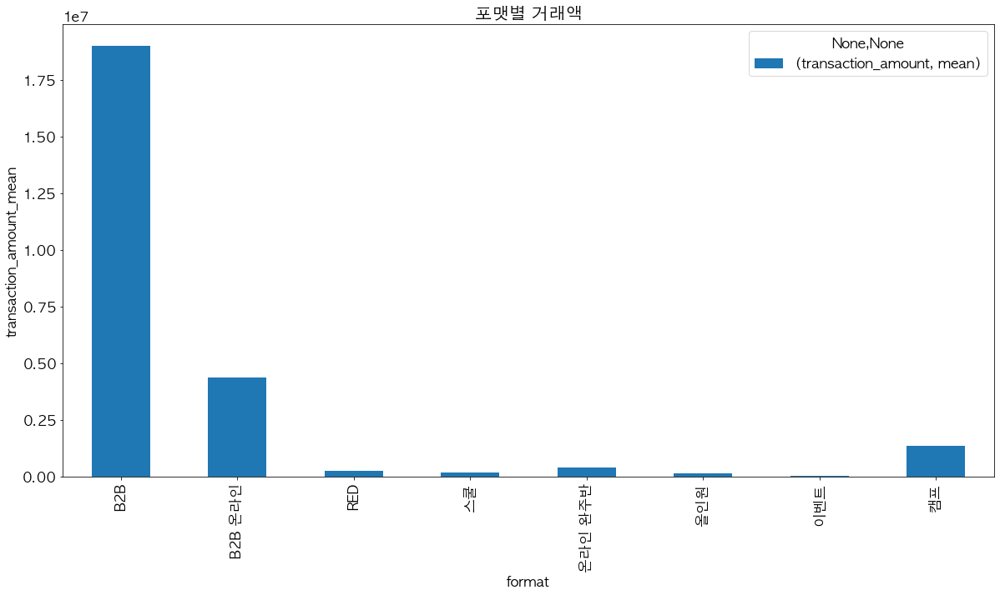

In [153]:
mean_ta_sub_ds_df = datascience_df[meaningful_cond].groupby('format').agg(transaction_mean) #이름 새로 짓고 할당했습니다. 평균_거래액_서브카테고리_데이터사이언스_DataFrame
mean_ta_sub_ds_df.plot(kind = 'bar' ) #시각화
plt.title("포맷별 거래액")
plt.xlabel("format")
plt.ylabel("transaction_amount_mean") 

평균값으로 거래액 분포를 시각화

#### B2B 거래액이 많은 이유 추론
가설: B2B 거래에서는 쿠폰을 지급하지 않아서 할인이 거의 없다.

In [154]:
format_B2B_cond = (datascience_df['format'] =='B2B')|(datascience_df['format'] == 'B2B 온라인') #B2B 인 항목을 선택하기 위한 조건
datascience_df[format_B2B_cond]

,index,id,customer_id,course_id,type,state,course_title,category_title,format,completed_at,...,is_design,is_programming,is_business,date,year,month,week,quarter,day_of_week,hour
47408,92741,1304725,642885,206226,PAYMENT,COMPLETED,(B2B) CJ제일제당 DT Advanced 교육,데이터사이언스,B2B,2021-08-24 14:49:40,...,0,1,0,2021-08-24 14:49:40,2021,8,34,3,Tuesday,14
17939,37946,1084684,535365,203999,PAYMENT,COMPLETED,(B2B) 이마트 데이터 아카데미,데이터사이언스,B2B,2021-05-20 14:35:26,...,0,1,0,2021-05-20 14:35:26,2021,5,20,2,Thursday,14
43471,87316,1280376,630176,206606,PAYMENT,COMPLETED,(B2B) 한국투자증권 신입사원 과정: 파이썬을 활용한 데이터 분석 실무 과정,데이터사이언스,B2B,2021-08-12 09:52:19,...,0,1,0,2021-08-12 09:52:19,2021,8,32,3,Thursday,9
17508,37074,1080935,533302,205054,PAYMENT,COMPLETED,(B2B) 신한은행 온라인 구독 싱글 플랜 2차,데이터사이언스,B2B 온라인,2021-05-18 17:58:00,...,0,1,0,2021-05-18 17:58:00,2021,5,20,2,Tuesday,17
21488,45246,1111251,547305,204249,PAYMENT,COMPLETED,(B2B) 동원그룹 디지털 역량 향상 교육,데이터사이언스,B2B,2021-05-31 16:52:41,...,0,1,0,2021-05-31 16:52:41,2021,5,22,2,Monday,16
21489,45247,1111250,547305,204256,PAYMENT,COMPLETED,(B2B) 동원그룹 데이터 기반 사고력 향상 과정,데이터사이언스,B2B,2021-05-31 16:52:41,...,0,1,0,2021-05-31 16:52:41,2021,5,22,2,Monday,16
13383,28429,1055667,520379,202769,PAYMENT,COMPLETED,(B2B) 현대엔지니어링 데이터 사이언스 Package PLAN,데이터사이언스,B2B 온라인,2021-05-06 13:20:08,...,0,1,0,2021-05-06 13:20:08,2021,5,18,2,Thursday,13
13396,28450,1055668,520380,205057,PAYMENT,COMPLETED,(B2B) SK네트웍스 온라인 구독 싱글 플랜,데이터사이언스,B2B 온라인,2021-05-06 13:45:40,...,0,1,0,2021-05-06 13:45:40,2021,5,18,2,Thursday,13
26385,55518,1145404,562762,205372,PAYMENT,COMPLETED,(B2B) 현대엘리베이터 온라인 구독 CUSTOM PLAN,데이터사이언스,B2B 온라인,2021-06-16 15:28:52,...,0,1,0,2021-06-16 15:28:52,2021,6,24,2,Wednesday,15
49627,95775,1319228,533237,206749,PAYMENT,COMPLETED,(B2B) 신한은행 온라인 구독 싱글 플랜 3차,데이터사이언스,B2B 온라인,2021-08-31 15:39:52,...,0,1,0,2021-08-31 15:39:52,2021,8,35,3,Tuesday,15


B2B인 자료들을 확인해본 결과 쿠폰이 없는것을 확인할 수 있습니다.

가설검증완료

In [155]:
datascience_df[format_B2B_cond]['coupon_title'].isnull() 

47408    True
17939    True
43471    True
17508    True
21488    True
21489    True
13383    True
13396    True
26385    True
49627    True
34488    True
34053    True
49503    True
42306    True
11516    True
41315    True
48241    True
34559    True
54757    True
35830    True
22683    True
27559    True
24679    True
24691    True
14498    True
39058    True
678      True
27650    True
55301    True
35863    True
32671    True
22092    True
35261    True
35816    True
13648    True
54297    True
26609    True
27711    True
32399    True
27854    True
Name: coupon_title, dtype: bool

B2B인 자료들은 모두 쿠폰타이틀이 Nan입니다. 따라서 전부 쿠폰이 없다는 것을 확인할 수 있습니다.

### B2B제외한  나머지 format 분석

#### format 스쿨 분석

In [156]:
format_school_cond = (datascience_df['format'] =='스쿨')
datascience_df[format_school_cond]

,index,id,customer_id,course_id,type,state,course_title,category_title,format,completed_at,...,is_design,is_programming,is_business,date,year,month,week,quarter,day_of_week,hour
12607,26784,1056028,425228,203870,PAYMENT,COMPLETED,데이터 사이언스 취업완성 스쿨 17기,데이터사이언스,스쿨,2021-05-03 07:06:20,...,0,1,0,2021-05-03 07:06:20,2021,5,18,2,Monday,7
12608,26785,1056015,399577,203870,PAYMENT,COMPLETED,데이터 사이언스 취업완성 스쿨 17기,데이터사이언스,스쿨,2021-05-03 07:06:20,...,0,1,0,2021-05-03 07:06:20,2021,5,18,2,Monday,7
12609,26786,1056022,45295,203870,PAYMENT,COMPLETED,데이터 사이언스 취업완성 스쿨 17기,데이터사이언스,스쿨,2021-05-03 07:12:02,...,0,1,0,2021-05-03 07:12:02,2021,5,18,2,Monday,7
12610,26787,1056020,409454,203870,PAYMENT,COMPLETED,데이터 사이언스 취업완성 스쿨 17기,데이터사이언스,스쿨,2021-05-03 07:12:02,...,0,1,0,2021-05-03 07:12:02,2021,5,18,2,Monday,7
12611,26788,1056019,284097,203870,PAYMENT,COMPLETED,데이터 사이언스 취업완성 스쿨 17기,데이터사이언스,스쿨,2021-05-03 07:12:02,...,0,1,0,2021-05-03 07:12:02,2021,5,18,2,Monday,7
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
17154,36409,1099611,419116,203870,PAYMENT,COMPLETED,데이터 사이언스 취업완성 스쿨 17기,데이터사이언스,스쿨,2021-05-17 16:27:00,...,0,1,0,2021-05-17 16:27:00,2021,5,20,2,Monday,16
17153,36408,1099614,431820,203870,PAYMENT,COMPLETED,데이터 사이언스 취업완성 스쿨 17기,데이터사이언스,스쿨,2021-05-17 16:27:00,...,0,1,0,2021-05-17 16:27:00,2021,5,20,2,Monday,16
17152,36407,1099609,416660,203870,PAYMENT,COMPLETED,데이터 사이언스 취업완성 스쿨 17기,데이터사이언스,스쿨,2021-05-17 16:27:00,...,0,1,0,2021-05-17 16:27:00,2021,5,20,2,Monday,16
17151,36406,1099604,284097,203870,PAYMENT,COMPLETED,데이터 사이언스 취업완성 스쿨 17기,데이터사이언스,스쿨,2021-05-17 16:27:00,...,0,1,0,2021-05-17 16:27:00,2021,5,20,2,Monday,16


In [157]:
datascience_df[format_school_cond].sort_values(by=["transaction_amount"], ascending=[True]) #transaction_amount 기준으로 오름차순 정렬했습니다. 

,index,id,customer_id,course_id,type,state,course_title,category_title,format,completed_at,...,is_design,is_programming,is_business,date,year,month,week,quarter,day_of_week,hour
48214,93853,1323538,376898,203870,PAYMENT,COMPLETED,데이터 사이언스 취업완성 스쿨 17기,데이터사이언스,스쿨,2021-08-27 15:17:38,...,0,1,0,2021-08-27 15:17:38,2021,8,34,3,Friday,15
48231,93870,1323537,98171,203870,PAYMENT,COMPLETED,데이터 사이언스 취업완성 스쿨 17기,데이터사이언스,스쿨,2021-08-27 15:17:38,...,0,1,0,2021-08-27 15:17:38,2021,8,34,3,Friday,15
48216,93855,1323535,284097,203870,PAYMENT,COMPLETED,데이터 사이언스 취업완성 스쿨 17기,데이터사이언스,스쿨,2021-08-27 15:17:38,...,0,1,0,2021-08-27 15:17:38,2021,8,34,3,Friday,15
48222,93861,1323543,426618,203870,PAYMENT,COMPLETED,데이터 사이언스 취업완성 스쿨 17기,데이터사이언스,스쿨,2021-08-27 15:17:38,...,0,1,0,2021-08-27 15:17:38,2021,8,34,3,Friday,15
48218,93857,1323532,132091,203870,PAYMENT,COMPLETED,데이터 사이언스 취업완성 스쿨 17기,데이터사이언스,스쿨,2021-08-27 15:17:38,...,0,1,0,2021-08-27 15:17:38,2021,8,34,3,Friday,15
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
12608,26785,1056015,399577,203870,PAYMENT,COMPLETED,데이터 사이언스 취업완성 스쿨 17기,데이터사이언스,스쿨,2021-05-03 07:06:20,...,0,1,0,2021-05-03 07:06:20,2021,5,18,2,Monday,7
12607,26784,1056028,425228,203870,PAYMENT,COMPLETED,데이터 사이언스 취업완성 스쿨 17기,데이터사이언스,스쿨,2021-05-03 07:06:20,...,0,1,0,2021-05-03 07:06:20,2021,5,18,2,Monday,7
12611,26788,1056019,284097,203870,PAYMENT,COMPLETED,데이터 사이언스 취업완성 스쿨 17기,데이터사이언스,스쿨,2021-05-03 07:12:02,...,0,1,0,2021-05-03 07:12:02,2021,5,18,2,Monday,7
12609,26786,1056022,45295,203870,PAYMENT,COMPLETED,데이터 사이언스 취업완성 스쿨 17기,데이터사이언스,스쿨,2021-05-03 07:12:02,...,0,1,0,2021-05-03 07:12:02,2021,5,18,2,Monday,7


거래액을 기준으로 오름차순한 결과 '데이터 사이언스 스쿨 17기'즉 format 스쿨의 거래액이 모두 양수임을 확인할 수 있습니다.

In [158]:
ds_check_cond = datascience_df[format_school_cond]['state'] == 'REFUND' #환불확인용 조건
datascience_df[format_school_cond][ds_check_cond]

,index,id,customer_id,course_id,type,state,course_title,category_title,format,completed_at,...,is_design,is_programming,is_business,date,year,month,week,quarter,day_of_week,hour


정말로 환불이 하나도 없는 것을 확인할 수 있습니다.

#### format 온라인완주반 분석

In [159]:
format_online_complete_cond = (datascience_df['format'] =='온라인 완주반')
datascience_df[format_online_complete_cond].sort_values(by=["transaction_amount"], ascending=[True]) #transaction_amount 기준으로 오름차순 정렬했습니다.

,index,id,customer_id,course_id,type,state,course_title,category_title,format,completed_at,...,is_design,is_programming,is_business,date,year,month,week,quarter,day_of_week,hour
19117,40418,1093840,537197,203952,REFUND,COMPLETED,매주)데이터 사이언스 온라인 완주반,데이터사이언스,온라인 완주반,2021-05-24 10:42:54,...,0,1,0,2021-05-24 10:42:54,2021,5,21,2,Monday,10
13621,28934,1057098,521096,203952,REFUND,COMPLETED,매주)데이터 사이언스 온라인 완주반,데이터사이언스,온라인 완주반,2021-05-07 11:48:27,...,0,1,0,2021-05-07 11:48:27,2021,5,18,2,Friday,11
15220,32333,1066311,374133,203952,REFUND,COMPLETED,매주)데이터 사이언스 온라인 완주반,데이터사이언스,온라인 완주반,2021-05-12 10:18:34,...,0,1,0,2021-05-12 10:18:34,2021,5,19,2,Wednesday,10
13443,28529,1055605,118216,203952,REFUND,COMPLETED,매주)데이터 사이언스 온라인 완주반,데이터사이언스,온라인 완주반,2021-05-06 15:32:34,...,0,1,0,2021-05-06 15:32:34,2021,5,18,2,Thursday,15
4345,9045,996544,30261,203952,REFUND,COMPLETED,매주)데이터 사이언스 온라인 완주반,데이터사이언스,온라인 완주반,2021-04-07 16:18:14,...,0,1,0,2021-04-07 16:18:14,2021,4,14,2,Wednesday,16
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
17879,37833,1083533,62421,203952,PAYMENT,COMPLETED,매주)데이터 사이언스 온라인 완주반,데이터사이언스,온라인 완주반,2021-05-20 10:52:24,...,0,1,0,2021-05-20 10:52:24,2021,5,20,2,Thursday,10
17924,37918,1084141,261835,203952,PAYMENT,COMPLETED,매주)데이터 사이언스 온라인 완주반,데이터사이언스,온라인 완주반,2021-05-20 13:43:59,...,0,1,0,2021-05-20 13:43:59,2021,5,20,2,Thursday,13
20088,42307,1101810,372435,203952,PAYMENT,COMPLETED,매주)데이터 사이언스 온라인 완주반,데이터사이언스,온라인 완주반,2021-05-27 16:12:26,...,0,1,0,2021-05-27 16:12:26,2021,5,21,2,Thursday,16
19333,40815,1096548,181241,203952,PAYMENT,COMPLETED,매주)데이터 사이언스 온라인 완주반,데이터사이언스,온라인 완주반,2021-05-25 00:24:59,...,0,1,0,2021-05-25 00:24:59,2021,5,21,2,Tuesday,0


오름차순으로 정렬했습니다.

##### 데이터 사이언스 카테고리의 온라인완주반의 환급율 분석.

In [160]:
sorted_format_online_complete_sub_ds_df = datascience_df[format_online_complete_cond].sort_values(by=["transaction_amount"], ascending=[True]) #새로 이름 붙여줍니다.
refund_cond = sorted_format_online_complete_sub_ds_df['transaction_amount'] < 0 #거래량이 음수인 조건
sorted_format_online_complete_sub_ds_df[refund_cond] #전부다 REFUND인것 확인가능

,index,id,customer_id,course_id,type,state,course_title,category_title,format,completed_at,...,is_design,is_programming,is_business,date,year,month,week,quarter,day_of_week,hour
19117,40418,1093840,537197,203952,REFUND,COMPLETED,매주)데이터 사이언스 온라인 완주반,데이터사이언스,온라인 완주반,2021-05-24 10:42:54,...,0,1,0,2021-05-24 10:42:54,2021,5,21,2,Monday,10
13621,28934,1057098,521096,203952,REFUND,COMPLETED,매주)데이터 사이언스 온라인 완주반,데이터사이언스,온라인 완주반,2021-05-07 11:48:27,...,0,1,0,2021-05-07 11:48:27,2021,5,18,2,Friday,11
15220,32333,1066311,374133,203952,REFUND,COMPLETED,매주)데이터 사이언스 온라인 완주반,데이터사이언스,온라인 완주반,2021-05-12 10:18:34,...,0,1,0,2021-05-12 10:18:34,2021,5,19,2,Wednesday,10
13443,28529,1055605,118216,203952,REFUND,COMPLETED,매주)데이터 사이언스 온라인 완주반,데이터사이언스,온라인 완주반,2021-05-06 15:32:34,...,0,1,0,2021-05-06 15:32:34,2021,5,18,2,Thursday,15
4345,9045,996544,30261,203952,REFUND,COMPLETED,매주)데이터 사이언스 온라인 완주반,데이터사이언스,온라인 완주반,2021-04-07 16:18:14,...,0,1,0,2021-04-07 16:18:14,2021,4,14,2,Wednesday,16
23592,49679,1124724,552904,203952,REFUND,COMPLETED,매주)데이터 사이언스 온라인 완주반,데이터사이언스,온라인 완주반,2021-06-07 11:27:09,...,0,1,0,2021-06-07 11:27:09,2021,6,23,2,Monday,11
19387,40923,1096903,540395,203952,REFUND,COMPLETED,매주)데이터 사이언스 온라인 완주반,데이터사이언스,온라인 완주반,2021-05-25 10:32:00,...,0,1,0,2021-05-25 10:32:00,2021,5,21,2,Tuesday,10
26446,55653,1145670,60320,203952,REFUND,COMPLETED,매주)데이터 사이언스 온라인 완주반,데이터사이언스,온라인 완주반,2021-06-16 18:48:17,...,0,1,0,2021-06-16 18:48:17,2021,6,24,2,Wednesday,18
13326,28315,1054967,416384,203952,REFUND,COMPLETED,매주)데이터 사이언스 온라인 완주반,데이터사이언스,온라인 완주반,2021-05-06 10:39:26,...,0,1,0,2021-05-06 10:39:26,2021,5,18,2,Thursday,10
26316,55378,1144738,561991,203952,REFUND,COMPLETED,매주)데이터 사이언스 온라인 완주반,데이터사이언스,온라인 완주반,2021-06-16 10:18:07,...,0,1,0,2021-06-16 10:18:07,2021,6,24,2,Wednesday,10


환급한 자료들만 출력했습니다. (Transaction_amount가 음수인 자료)

In [161]:
len(sorted_format_online_complete_sub_ds_df[refund_cond]) 

56

환급한 자료의 개수를 세어보니 56개입니다.

In [162]:
데이터사이언스완주반환급율 = round(len(sorted_format_online_complete_sub_ds_df[refund_cond])/len(sorted_format_online_complete_sub_ds_df) * 100 , 2) #소수점 2자리까지 구했습니다
print('데이터사이언스 완주반 환급율은 {0}%입니다.'.format(데이터사이언스완주반환급율))

데이터사이언스 완주반 환급율은 14.97%입니다.


##### 결론(insight): 완주반 환급율이 낮아서 좋은 마케팅이라고 판단할 수 있습니다.

#### format 올인원 분석

In [163]:
format_all_in_one_cond = (datascience_df['format'] =='올인원')
datascience_df[format_all_in_one_cond].sort_values(by=["transaction_amount"], ascending=[True]) #transaction_amount 기준으로 오름차순 정렬했습니다.

,index,id,customer_id,course_id,type,state,course_title,category_title,format,completed_at,...,is_design,is_programming,is_business,date,year,month,week,quarter,day_of_week,hour
56327,104863,1361162,160616,0,REFUND,COMPLETED,프로모션 : 데이터 분석 맥북 pro 패스(9월 현물 프리패스),데이터사이언스,올인원,2021-09-23 16:03:09,...,0,1,0,2021-09-23 16:03:09,2021,9,38,3,Thursday,16
56351,104891,1361378,36427,0,REFUND,COMPLETED,프로모션 : 데이터 분석 맥북 pro 패스(9월 현물 프리패스),데이터사이언스,올인원,2021-09-23 17:04:54,...,0,1,0,2021-09-23 17:04:54,2021,9,38,3,Thursday,17
56216,104723,1360462,166684,0,REFUND,COMPLETED,프로모션 : 데이터 분석 맥북 pro 패스(9월 현물 프리패스),데이터사이언스,올인원,2021-09-23 11:36:22,...,0,1,0,2021-09-23 11:36:22,2021,9,38,3,Thursday,11
19199,40548,1094512,536229,0,REFUND,COMPLETED,프로모션 : 기초부터 시작하는 데이터분석 프리패스 (5월 삼성 패키지 현물 : 삼...,데이터사이언스,올인원,2021-05-24 14:40:02,...,0,1,0,2021-05-24 14:40:02,2021,5,21,2,Monday,14
34702,74140,1220115,440893,0,REFUND,COMPLETED,프로모션 : 나를 위한 데이터사이언스 백과사전 iPad 패키지 (7월 현물 프리패스),데이터사이언스,올인원,2021-07-16 10:33:16,...,0,1,0,2021-07-16 10:33:16,2021,7,28,3,Friday,10
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
56112,104582,1359676,178770,0,PAYMENT,COMPLETED,프로모션 : 데이터 분석 맥북 pro 패스(9월 현물 프리패스),데이터사이언스,올인원,2021-09-22 22:56:20,...,0,1,0,2021-09-22 22:56:20,2021,9,38,3,Wednesday,22
56121,104596,1359762,43265,0,PAYMENT,COMPLETED,프로모션 : 데이터 분석 맥북 pro 패스(9월 현물 프리패스),데이터사이언스,올인원,2021-09-22 23:24:25,...,0,1,0,2021-09-22 23:24:25,2021,9,38,3,Wednesday,23
56512,105129,1363522,175317,0,PAYMENT,COMPLETED,프로모션 : 데이터 분석 맥북 pro 패스(9월 현물 프리패스),데이터사이언스,올인원,2021-09-24 13:19:00,...,0,1,0,2021-09-24 13:19:00,2021,9,38,3,Friday,13
55754,104020,1356164,475055,0,PAYMENT,COMPLETED,프로모션 : 데이터 분석 맥북 pro 패스(9월 현물 프리패스),데이터사이언스,올인원,2021-09-20 14:53:13,...,0,1,0,2021-09-20 14:53:13,2021,9,38,3,Monday,14


In [164]:
sorted_format_all_in_one_sub_ds_df = datascience_df[format_all_in_one_cond].sort_values(by=["transaction_amount"], ascending=[True]) #이름 새로 지어줍니다.
refund_cond_1 = sorted_format_all_in_one_sub_ds_df['transaction_amount'] < 0 #거래량이 음수인 조건
sorted_format_all_in_one_sub_ds_df[refund_cond_1] #음수인 자료만 모았다.

,index,id,customer_id,course_id,type,state,course_title,category_title,format,completed_at,...,is_design,is_programming,is_business,date,year,month,week,quarter,day_of_week,hour
56327,104863,1361162,160616,0,REFUND,COMPLETED,프로모션 : 데이터 분석 맥북 pro 패스(9월 현물 프리패스),데이터사이언스,올인원,2021-09-23 16:03:09,...,0,1,0,2021-09-23 16:03:09,2021,9,38,3,Thursday,16
56351,104891,1361378,36427,0,REFUND,COMPLETED,프로모션 : 데이터 분석 맥북 pro 패스(9월 현물 프리패스),데이터사이언스,올인원,2021-09-23 17:04:54,...,0,1,0,2021-09-23 17:04:54,2021,9,38,3,Thursday,17
56216,104723,1360462,166684,0,REFUND,COMPLETED,프로모션 : 데이터 분석 맥북 pro 패스(9월 현물 프리패스),데이터사이언스,올인원,2021-09-23 11:36:22,...,0,1,0,2021-09-23 11:36:22,2021,9,38,3,Thursday,11
19199,40548,1094512,536229,0,REFUND,COMPLETED,프로모션 : 기초부터 시작하는 데이터분석 프리패스 (5월 삼성 패키지 현물 : 삼...,데이터사이언스,올인원,2021-05-24 14:40:02,...,0,1,0,2021-05-24 14:40:02,2021,5,21,2,Monday,14
34702,74140,1220115,440893,0,REFUND,COMPLETED,프로모션 : 나를 위한 데이터사이언스 백과사전 iPad 패키지 (7월 현물 프리패스),데이터사이언스,올인원,2021-07-16 10:33:16,...,0,1,0,2021-07-16 10:33:16,2021,7,28,3,Friday,10
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
14394,30730,1062010,501531,203531,REFUND,COMPLETED,초격차 패키지 : 한 번에 끝내는 데이터 분석 툴,데이터사이언스,올인원,2021-05-10 10:09:16,...,0,1,0,2021-05-10 10:09:16,2021,5,19,2,Monday,10
9078,19641,1030860,496846,203531,REFUND,COMPLETED,초격차 패키지 : 한 번에 끝내는 데이터 분석 툴,데이터사이언스,올인원,2021-04-26 15:41:42,...,0,1,0,2021-04-26 15:41:42,2021,4,17,2,Monday,15
14451,30812,1062215,473123,202589,REFUND,COMPLETED,합격 패스 : ADsP,데이터사이언스,올인원,2021-05-10 11:37:39,...,0,1,0,2021-05-10 11:37:39,2021,5,19,2,Monday,11
14905,31711,1064594,170707,202589,REFUND,COMPLETED,합격 패스 : ADsP,데이터사이언스,올인원,2021-05-11 13:07:27,...,0,1,0,2021-05-11 13:07:27,2021,5,19,2,Tuesday,13


거래액이 음수인 자료들은 총 62개입니다.

In [165]:
refund_cond_2 = sorted_format_all_in_one_sub_ds_df['type'] == 'REFUND'
sorted_format_all_in_one_sub_ds_df[refund_cond_2] #type 이 REFUND인 자료만 모았다.

,index,id,customer_id,course_id,type,state,course_title,category_title,format,completed_at,...,is_design,is_programming,is_business,date,year,month,week,quarter,day_of_week,hour
56327,104863,1361162,160616,0,REFUND,COMPLETED,프로모션 : 데이터 분석 맥북 pro 패스(9월 현물 프리패스),데이터사이언스,올인원,2021-09-23 16:03:09,...,0,1,0,2021-09-23 16:03:09,2021,9,38,3,Thursday,16
56351,104891,1361378,36427,0,REFUND,COMPLETED,프로모션 : 데이터 분석 맥북 pro 패스(9월 현물 프리패스),데이터사이언스,올인원,2021-09-23 17:04:54,...,0,1,0,2021-09-23 17:04:54,2021,9,38,3,Thursday,17
56216,104723,1360462,166684,0,REFUND,COMPLETED,프로모션 : 데이터 분석 맥북 pro 패스(9월 현물 프리패스),데이터사이언스,올인원,2021-09-23 11:36:22,...,0,1,0,2021-09-23 11:36:22,2021,9,38,3,Thursday,11
19199,40548,1094512,536229,0,REFUND,COMPLETED,프로모션 : 기초부터 시작하는 데이터분석 프리패스 (5월 삼성 패키지 현물 : 삼...,데이터사이언스,올인원,2021-05-24 14:40:02,...,0,1,0,2021-05-24 14:40:02,2021,5,21,2,Monday,14
34702,74140,1220115,440893,0,REFUND,COMPLETED,프로모션 : 나를 위한 데이터사이언스 백과사전 iPad 패키지 (7월 현물 프리패스),데이터사이언스,올인원,2021-07-16 10:33:16,...,0,1,0,2021-07-16 10:33:16,2021,7,28,3,Friday,10
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
14394,30730,1062010,501531,203531,REFUND,COMPLETED,초격차 패키지 : 한 번에 끝내는 데이터 분석 툴,데이터사이언스,올인원,2021-05-10 10:09:16,...,0,1,0,2021-05-10 10:09:16,2021,5,19,2,Monday,10
9078,19641,1030860,496846,203531,REFUND,COMPLETED,초격차 패키지 : 한 번에 끝내는 데이터 분석 툴,데이터사이언스,올인원,2021-04-26 15:41:42,...,0,1,0,2021-04-26 15:41:42,2021,4,17,2,Monday,15
14451,30812,1062215,473123,202589,REFUND,COMPLETED,합격 패스 : ADsP,데이터사이언스,올인원,2021-05-10 11:37:39,...,0,1,0,2021-05-10 11:37:39,2021,5,19,2,Monday,11
14905,31711,1064594,170707,202589,REFUND,COMPLETED,합격 패스 : ADsP,데이터사이언스,올인원,2021-05-11 13:07:27,...,0,1,0,2021-05-11 13:07:27,2021,5,19,2,Tuesday,13


거래액이 음수면 반드시 type이 REFUND임을 확인할 수 있습니다.

In [166]:
list(sorted_format_all_in_one_sub_ds_df[refund_cond_2]['customer_id']) #리스트로 일단 만들었습니다. 환불한 개인 고객의 id를 리스트 자료구조로
id_check_cond = sorted_format_all_in_one_sub_ds_df['customer_id'].isin(list(sorted_format_all_in_one_sub_ds_df[refund_cond_2]['customer_id'])) #환불한 id에 속하는지 확인하는 조건
sorted_format_all_in_one_sub_ds_df[id_check_cond].sort_values(by=["customer_id"], ascending=[True])  #확인해봄 그리고 Customer_id 별로 확인하려고 오름차순 정렬

,index,id,customer_id,course_id,type,state,course_title,category_title,format,completed_at,...,is_design,is_programming,is_business,date,year,month,week,quarter,day_of_week,hour
50464,96894,1322793,153,206044,PAYMENT,COMPLETED,올인원 패키지 : 유전 알고리즘을 활용한 머신러닝 입력 최적화 및 대안 제안 메소드,데이터사이언스,올인원,2021-08-31 23:57:29,...,0,1,0,2021-08-31 23:57:29,2021,8,35,3,Tuesday,23
52254,99293,1333562,153,206044,REFUND,COMPLETED,올인원 패키지 : 유전 알고리즘을 활용한 머신러닝 입력 최적화 및 대안 제안 메소드,데이터사이언스,올인원,2021-09-07 10:37:22,...,0,1,0,2021-09-07 10:37:22,2021,9,36,3,Tuesday,10
54266,101935,1344225,153,203076,PAYMENT,COMPLETED,올인원 패키지 : 파이썬을 활용한 이커머스 데이터 분석,데이터사이언스,올인원,2021-09-13 11:16:52,...,0,1,0,2021-09-13 11:16:52,2021,9,37,3,Monday,11
54962,102899,1348577,153,203355,PAYMENT,COMPLETED,올인원 패키지 : 처음부터 시작하는 딥러닝 유치원,데이터사이언스,올인원,2021-09-15 22:07:47,...,0,1,0,2021-09-15 22:07:47,2021,9,37,3,Wednesday,22
49665,95822,1318766,3783,206331,PAYMENT,COMPLETED,초격차 패키지 : 한 번에 끝내는 딥러닝/인공지능,데이터사이언스,올인원,2021-08-31 16:18:10,...,0,1,0,2021-08-31 16:18:10,2021,8,35,3,Tuesday,16
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
54590,102399,1346089,662274,202614,REFUND,COMPLETED,올인원 패키지 : 컴퓨터비전과 딥러닝,데이터사이언스,올인원,2021-09-14 15:45:42,...,0,1,0,2021-09-14 15:45:42,2021,9,37,3,Tuesday,15
54586,102395,1346070,662274,206331,PAYMENT,COMPLETED,초격차 패키지 : 한 번에 끝내는 딥러닝/인공지능,데이터사이언스,올인원,2021-09-14 15:32:24,...,0,1,0,2021-09-14 15:32:24,2021,9,37,3,Tuesday,15
56215,104722,1360458,665200,206185,REFUND,COMPLETED,초격차 패키지 : 한 번에 끝내는 머신러닝과 데이터분석 A-Z,데이터사이언스,올인원,2021-09-23 11:35:35,...,0,1,0,2021-09-23 11:35:35,2021,9,38,3,Thursday,11
55676,103907,1355435,665200,206185,PAYMENT,COMPLETED,초격차 패키지 : 한 번에 끝내는 머신러닝과 데이터분석 A-Z,데이터사이언스,올인원,2021-09-19 21:45:32,...,0,1,0,2021-09-19 21:45:32,2021,9,37,3,Sunday,21


정렬해보니까 REFUND랑 PAYMENT가 쌍으로 나오는게 아닌 것을 확인할 수 있습니다. PAYMENT 숫자가 더 부족합니다.. 따라서 결론은 이 데이터 모으기 전에 결제 했던 PAYMENT를 이 기간(주어진 자료의 기간)에 환불했다고 추측할 수 있습니다.

그렇다면 이 dataset을 조사한 기간에 정확한 환불율을 구하기 위해서는 pair로 존재하는 자료만 찾아야합니다.

##### 결론:정확한 환불율을 구하기 위해서는 PAYMETN & REFUND가 pair로 존재하는 자료를 찾아서 구해야합니다.

#### format 이벤트 분석

In [167]:
format_event_one_cond = (datascience_df['format'] =='이벤트') #이벤트 찾는 조건
datascience_df[format_event_one_cond].sort_values(by=["customer_id"], ascending=[True]) #customer_id별로 정렬해본다.

,index,id,customer_id,course_id,type,state,course_title,category_title,format,completed_at,...,is_design,is_programming,is_business,date,year,month,week,quarter,day_of_week,hour
12471,26477,1049331,6204,205099,PAYMENT,COMPLETED,[120일 수강 가능] 초격차 패키지 : 한 번에 끝내는 데이터 분석 툴,데이터사이언스,이벤트,2021-05-02 20:45:01,...,0,1,0,2021-05-02 20:45:01,2021,5,17,2,Sunday,20
12380,26292,1048832,11359,205099,PAYMENT,COMPLETED,[120일 수강 가능] 초격차 패키지 : 한 번에 끝내는 데이터 분석 툴,데이터사이언스,이벤트,2021-05-02 16:13:39,...,0,1,0,2021-05-02 16:13:39,2021,5,17,2,Sunday,16
12550,26654,1049717,11922,205096,PAYMENT,COMPLETED,[120일 수강 가능] 올인원 패키지 : 모두를 위한 SQL/DB,데이터사이언스,이벤트,2021-05-02 23:05:08,...,0,1,0,2021-05-02 23:05:08,2021,5,17,2,Sunday,23
12426,26390,1049123,12123,205096,PAYMENT,COMPLETED,[120일 수강 가능] 올인원 패키지 : 모두를 위한 SQL/DB,데이터사이언스,이벤트,2021-05-02 18:37:33,...,0,1,0,2021-05-02 18:37:33,2021,5,17,2,Sunday,18
12540,26629,1049664,109639,205099,PAYMENT,COMPLETED,[120일 수강 가능] 초격차 패키지 : 한 번에 끝내는 데이터 분석 툴,데이터사이언스,이벤트,2021-05-02 22:49:02,...,0,1,0,2021-05-02 22:49:02,2021,5,17,2,Sunday,22
12662,26874,1050319,150413,205099,REFUND,COMPLETED,[120일 수강 가능] 초격차 패키지 : 한 번에 끝내는 데이터 분석 툴,데이터사이언스,이벤트,2021-05-03 11:15:23,...,0,1,0,2021-05-03 11:15:23,2021,5,18,2,Monday,11
12386,26302,1048865,413971,205096,PAYMENT,COMPLETED,[120일 수강 가능] 올인원 패키지 : 모두를 위한 SQL/DB,데이터사이언스,이벤트,2021-05-02 16:37:09,...,0,1,0,2021-05-02 16:37:09,2021,5,17,2,Sunday,16
12577,26698,1049848,431067,205097,PAYMENT,COMPLETED,[120일 수강 가능] 올인원 패키지 : 직장인을 위한 파이썬 데이터분석,데이터사이언스,이벤트,2021-05-02 23:46:49,...,0,1,0,2021-05-02 23:46:49,2021,5,17,2,Sunday,23
14496,30900,1062421,431067,205097,REFUND,COMPLETED,[120일 수강 가능] 올인원 패키지 : 직장인을 위한 파이썬 데이터분석,데이터사이언스,이벤트,2021-05-10 13:23:06,...,0,1,0,2021-05-10 13:23:06,2021,5,19,2,Monday,13
12484,26511,1049409,477637,205096,PAYMENT,COMPLETED,[120일 수강 가능] 올인원 패키지 : 모두를 위한 SQL/DB,데이터사이언스,이벤트,2021-05-02 21:14:02,...,0,1,0,2021-05-02 21:14:02,2021,5,17,2,Sunday,21


너무 자료가 적어서 생략하겠습니다. 실질적으로 pair로 존재하는 환불은 2건입니다.

##  subcategory '데이터분석'의  환불율 분석

In [168]:
Data_science = refund_data('데이터사이언스')

데이터 사이언스 인스턴스 호출

In [169]:
Data_science.sub_category('데이터분석')

,index,id,customer_id,course_id,type,state,course_title,category_title,format,completed_at,...,is_design,is_programming,is_business,date,year,month,week,quarter,day_of_week,hour
47189,92435,1303051,137922,205548,PAYMENT,COMPLETED,초격차 패키지 : 한 번에 끝내는 데이터 분석,데이터사이언스,올인원,2021-08-23 17:51:23,...,0,1,0,2021-08-23 17:51:23,2021,8,34,3,Monday,17
6459,13812,1012326,498155,202357,PAYMENT,COMPLETED,올인원 패키지 : 직장인을 위한 파이썬 데이터분석,데이터사이언스,올인원,2021-04-15 22:52:45,...,0,1,0,2021-04-15 22:52:45,2021,4,15,2,Thursday,22
12724,26989,1050695,516905,202357,PAYMENT,COMPLETED,올인원 패키지 : 직장인을 위한 파이썬 데이터분석,데이터사이언스,올인원,2021-05-03 15:22:53,...,0,1,0,2021-05-03 15:22:53,2021,5,18,2,Monday,15
7363,15818,1018570,501602,202357,PAYMENT,COMPLETED,올인원 패키지 : 직장인을 위한 파이썬 데이터분석,데이터사이언스,올인원,2021-04-19 21:17:53,...,0,1,0,2021-04-19 21:17:53,2021,4,16,2,Monday,21
40569,83386,1259466,540675,202929,PAYMENT,COMPLETED,The RED : 데이터 사이언티스트 하용호,데이터사이언스,RED,2021-08-02 10:48:58,...,0,1,0,2021-08-02 10:48:58,2021,8,31,3,Monday,10
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3851,8097,993564,17094,203076,PAYMENT,COMPLETED,올인원 패키지 : 파이썬을 활용한 이커머스 데이터 분석,데이터사이언스,올인원,2021-04-05 18:59:35,...,0,1,0,2021-04-05 18:59:35,2021,4,14,2,Monday,18
22207,46845,1115032,548639,203531,PAYMENT,COMPLETED,초격차 패키지 : 한 번에 끝내는 데이터 분석 툴,데이터사이언스,올인원,2021-06-01 15:03:59,...,0,1,0,2021-06-01 15:03:59,2021,6,22,2,Tuesday,15
36238,77452,1232342,602053,202551,PAYMENT,COMPLETED,올인원 패키지 : 프로젝트와 함께 배우는 R 데이터 분석,데이터사이언스,올인원,2021-07-21 16:08:43,...,0,1,0,2021-07-21 16:08:43,2021,7,29,3,Wednesday,16
46230,91124,1297024,465989,202929,PAYMENT,COMPLETED,The RED : 데이터 사이언티스트 하용호,데이터사이언스,RED,2021-08-19 18:45:43,...,0,1,0,2021-08-19 18:45:43,2021,8,33,3,Thursday,18


데이터 사이언스 중 서브카테고리가 데이터분석인 자료 불러오는 메소드 호출

In [170]:
Data_science.refund('데이터분석')

,index,id,customer_id,course_id,type,state,course_title,category_title,format,completed_at,...,is_design,is_programming,is_business,date,year,month,week,quarter,day_of_week,hour
40633,83472,1259867,545158,202357,REFUND,COMPLETED,올인원 패키지 : 직장인을 위한 파이썬 데이터분석,데이터사이언스,올인원,2021-08-02 13:30:28,...,0,1,0,2021-08-02 13:30:28,2021,8,31,3,Monday,13
28722,60636,1165848,440220,203076,REFUND,COMPLETED,올인원 패키지 : 파이썬을 활용한 이커머스 데이터 분석,데이터사이언스,올인원,2021-06-25 17:40:47,...,0,1,0,2021-06-25 17:40:47,2021,6,25,2,Friday,17
12703,26947,1050583,515216,203531,REFUND,COMPLETED,초격차 패키지 : 한 번에 끝내는 데이터 분석 툴,데이터사이언스,올인원,2021-05-03 13:53:26,...,0,1,0,2021-05-03 13:53:26,2021,5,18,2,Monday,13
12702,26944,1050569,510880,203531,REFUND,COMPLETED,초격차 패키지 : 한 번에 끝내는 데이터 분석 툴,데이터사이언스,올인원,2021-05-03 13:47:20,...,0,1,0,2021-05-03 13:47:20,2021,5,18,2,Monday,13
40585,83408,1259522,611953,203531,REFUND,COMPLETED,초격차 패키지 : 한 번에 끝내는 데이터 분석 툴,데이터사이언스,올인원,2021-08-02 11:13:28,...,0,1,0,2021-08-02 11:13:28,2021,8,31,3,Monday,11
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
35314,75573,1225503,81814,203531,REFUND,COMPLETED,초격차 패키지 : 한 번에 끝내는 데이터 분석 툴,데이터사이언스,올인원,2021-07-19 11:49:31,...,0,1,0,2021-07-19 11:49:31,2021,7,29,3,Monday,11
22122,46703,1114616,540168,203531,REFUND,COMPLETED,초격차 패키지 : 한 번에 끝내는 데이터 분석 툴,데이터사이언스,올인원,2021-06-01 10:46:21,...,0,1,0,2021-06-01 10:46:21,2021,6,22,2,Tuesday,10
35794,76572,1228974,570979,205548,REFUND,COMPLETED,초격차 패키지 : 한 번에 끝내는 데이터 분석,데이터사이언스,올인원,2021-07-20 13:39:04,...,0,1,0,2021-07-20 13:39:04,2021,7,29,3,Tuesday,13
46209,91093,1296776,631188,202357,REFUND,COMPLETED,올인원 패키지 : 직장인을 위한 파이썬 데이터분석,데이터사이언스,올인원,2021-08-19 17:13:33,...,0,1,0,2021-08-19 17:13:33,2021,8,33,3,Thursday,17


In [171]:
Data_science.pair_refund('데이터분석')

,index,id,customer_id,course_id,type,state,course_title,category_title,format,completed_at,...,is_design,is_programming,is_business,date,year,month,week,quarter,day_of_week,hour
14507,30925,1062483,3783,202929,PAYMENT,COMPLETED,The RED : 데이터 사이언티스트 하용호,데이터사이언스,RED,2021-05-10 13:53:29,...,0,1,0,2021-05-10 13:53:29,2021,5,19,2,Monday,13
46448,91413,1298612,16543,205548,PAYMENT,COMPLETED,초격차 패키지 : 한 번에 끝내는 데이터 분석,데이터사이언스,올인원,2021-08-20 16:14:09,...,0,1,0,2021-08-20 16:14:09,2021,8,33,3,Friday,16
1617,3466,980101,40835,203531,PAYMENT,COMPLETED,초격차 패키지 : 한 번에 끝내는 데이터 분석 툴,데이터사이언스,올인원,2021-03-31 11:53:48,...,0,1,0,2021-03-31 11:53:48,2021,3,13,1,Wednesday,11
1502,3238,979455,40835,203531,PAYMENT,COMPLETED,초격차 패키지 : 한 번에 끝내는 데이터 분석 툴,데이터사이언스,올인원,2021-03-31 09:36:32,...,0,1,0,2021-03-31 09:36:32,2021,3,13,1,Wednesday,9
10983,23504,1041535,64136,203531,PAYMENT,COMPLETED,초격차 패키지 : 한 번에 끝내는 데이터 분석 툴,데이터사이언스,올인원,2021-04-30 10:16:11,...,0,1,0,2021-04-30 10:16:11,2021,4,17,2,Friday,10
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
44630,88894,1287459,633210,202927,PAYMENT,COMPLETED,올인원 패키지 : 파이썬을 활용한 데이터 전처리 Level UP,데이터사이언스,올인원,2021-08-15 12:17:20,...,0,1,0,2021-08-15 12:17:20,2021,8,32,3,Sunday,12
44660,88932,1287647,633210,202357,PAYMENT,COMPLETED,올인원 패키지 : 직장인을 위한 파이썬 데이터분석,데이터사이언스,올인원,2021-08-15 14:05:20,...,0,1,0,2021-08-15 14:05:20,2021,8,32,3,Sunday,14
51888,98813,1331490,633210,203531,PAYMENT,COMPLETED,초격차 패키지 : 한 번에 끝내는 데이터 분석 툴,데이터사이언스,올인원,2021-09-06 16:42:54,...,0,1,0,2021-09-06 16:42:54,2021,9,36,3,Monday,16
51890,98815,1331492,633210,202927,PAYMENT,COMPLETED,올인원 패키지 : 파이썬을 활용한 데이터 전처리 Level UP,데이터사이언스,올인원,2021-09-06 16:43:52,...,0,1,0,2021-09-06 16:43:52,2021,9,36,3,Monday,16


PAYMENT & REFUND pair로 존재하는 자료 출력하는 메소드 호출

In [172]:
Data_science.refund_ratio('데이터분석')

4.03

#### 서브카테고리 데이터분석의 환불율은 4.03%입니다.
환불율 구하는 메소드 호출

### subcategory '데이터 엔지니어링'의 환불율 분석

In [173]:
Data_science.sub_category('데이터엔지니어링')

,index,id,customer_id,course_id,type,state,course_title,category_title,format,completed_at,...,is_design,is_programming,is_business,date,year,month,week,quarter,day_of_week,hour
52087,99074,1332426,16477,205877,PAYMENT,COMPLETED,올인원 패키지 : Elasticsearch로 하루만에 고급 검색 엔진 만들기,데이터사이언스,올인원,2021-09-06 21:44:03,...,0,1,0,2021-09-06 21:44:03,2021,9,36,3,Monday,21
51954,98905,1331817,24302,204824,PAYMENT,COMPLETED,The RED : 검색엔진 구축을 위한 Elasticsearch 마스터 클래스 by...,데이터사이언스,RED,2021-09-06 18:21:54,...,0,1,0,2021-09-06 18:21:54,2021,9,36,3,Monday,18
52007,98971,1332088,566115,204824,PAYMENT,COMPLETED,The RED : 검색엔진 구축을 위한 Elasticsearch 마스터 클래스 by...,데이터사이언스,RED,2021-09-06 19:43:49,...,0,1,0,2021-09-06 19:43:49,2021,9,36,3,Monday,19
51411,98242,1329685,635046,205877,PAYMENT,COMPLETED,올인원 패키지 : Elasticsearch로 하루만에 고급 검색 엔진 만들기,데이터사이언스,올인원,2021-09-06 05:07:44,...,0,1,0,2021-09-06 05:07:44,2021,9,36,3,Monday,5
36467,77741,1234189,269581,205877,PAYMENT,COMPLETED,올인원 패키지 : Elasticsearch로 하루만에 고급 검색 엔진 만들기,데이터사이언스,올인원,2021-07-22 11:25:10,...,0,1,0,2021-07-22 11:25:10,2021,7,29,3,Thursday,11
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
54139,101763,1343529,62213,204824,PAYMENT,COMPLETED,The RED : 검색엔진 구축을 위한 Elasticsearch 마스터 클래스 by...,데이터사이언스,RED,2021-09-12 22:15:51,...,0,1,0,2021-09-12 22:15:51,2021,9,36,3,Sunday,22
39503,81839,1252783,440789,205877,PAYMENT,COMPLETED,올인원 패키지 : Elasticsearch로 하루만에 고급 검색 엔진 만들기,데이터사이언스,올인원,2021-07-30 16:10:32,...,0,1,0,2021-07-30 16:10:32,2021,7,30,3,Friday,16
37639,79300,1241101,608267,205877,PAYMENT,COMPLETED,올인원 패키지 : Elasticsearch로 하루만에 고급 검색 엔진 만들기,데이터사이언스,올인원,2021-07-25 18:36:25,...,0,1,0,2021-07-25 18:36:25,2021,7,29,3,Sunday,18
53907,101411,1342167,632812,205877,PAYMENT,COMPLETED,올인원 패키지 : Elasticsearch로 하루만에 고급 검색 엔진 만들기,데이터사이언스,올인원,2021-09-11 23:48:36,...,0,1,0,2021-09-11 23:48:36,2021,9,36,3,Saturday,23


In [174]:
Data_science.refund('데이터엔지니어링')

,index,id,customer_id,course_id,type,state,course_title,category_title,format,completed_at,...,is_design,is_programming,is_business,date,year,month,week,quarter,day_of_week,hour
53064,100323,1337655,16477,205877,REFUND,COMPLETED,올인원 패키지 : Elasticsearch로 하루만에 고급 검색 엔진 만들기,데이터사이언스,올인원,2021-09-09 15:38:16,...,0,1,0,2021-09-09 15:38:16,2021,9,36,3,Thursday,15
52633,99777,1335459,23460,204824,REFUND,COMPLETED,The RED : 검색엔진 구축을 위한 Elasticsearch 마스터 클래스 by...,데이터사이언스,RED,2021-09-08 10:24:34,...,0,1,0,2021-09-08 10:24:34,2021,9,36,3,Wednesday,10
56211,104718,1360451,666108,204824,REFUND,COMPLETED,The RED : 검색엔진 구축을 위한 Elasticsearch 마스터 클래스 by...,데이터사이언스,RED,2021-09-23 11:32:17,...,0,1,0,2021-09-23 11:32:17,2021,9,38,3,Thursday,11
56304,104835,1361008,405283,206179,REFUND,COMPLETED,The RED : Hadoop & Spark 아키텍처 딥다이브,데이터사이언스,RED,2021-09-23 15:08:36,...,0,1,0,2021-09-23 15:08:36,2021,9,38,3,Thursday,15
56291,104822,1360993,58602,206179,REFUND,COMPLETED,The RED : Hadoop & Spark 아키텍처 딥다이브,데이터사이언스,RED,2021-09-23 15:03:07,...,0,1,0,2021-09-23 15:03:07,2021,9,38,3,Thursday,15
45505,90125,1292180,152846,205877,REFUND,COMPLETED,올인원 패키지 : Elasticsearch로 하루만에 고급 검색 엔진 만들기,데이터사이언스,올인원,2021-08-17 11:58:02,...,0,1,0,2021-08-17 11:58:02,2021,8,33,3,Tuesday,11
53430,100775,1339527,593524,204824,REFUND,COMPLETED,The RED : 검색엔진 구축을 위한 Elasticsearch 마스터 클래스 by...,데이터사이언스,RED,2021-09-10 14:02:20,...,0,1,0,2021-09-10 14:02:20,2021,9,36,3,Friday,14
54253,101919,1344193,660251,204824,REFUND,COMPLETED,The RED : 검색엔진 구축을 위한 Elasticsearch 마스터 클래스 by...,데이터사이언스,RED,2021-09-13 10:52:27,...,0,1,0,2021-09-13 10:52:27,2021,9,37,3,Monday,10
54255,101921,1344198,660029,205877,REFUND,COMPLETED,올인원 패키지 : Elasticsearch로 하루만에 고급 검색 엔진 만들기,데이터사이언스,올인원,2021-09-13 10:55:24,...,0,1,0,2021-09-13 10:55:24,2021,9,37,3,Monday,10
54250,101916,1344170,39345,204824,REFUND,COMPLETED,The RED : 검색엔진 구축을 위한 Elasticsearch 마스터 클래스 by...,데이터사이언스,RED,2021-09-13 10:42:34,...,0,1,0,2021-09-13 10:42:34,2021,9,37,3,Monday,10


In [175]:
Data_science.pair_refund('데이터엔지니어링')

,index,id,customer_id,course_id,type,state,course_title,category_title,format,completed_at,...,is_design,is_programming,is_business,date,year,month,week,quarter,day_of_week,hour
55463,103603,1353615,6215,205877,PAYMENT,COMPLETED,올인원 패키지 : Elasticsearch로 하루만에 고급 검색 엔진 만들기,데이터사이언스,올인원,2021-09-18 11:20:03,...,0,1,0,2021-09-18 11:20:03,2021,9,37,3,Saturday,11
52087,99074,1332426,16477,205877,PAYMENT,COMPLETED,올인원 패키지 : Elasticsearch로 하루만에 고급 검색 엔진 만들기,데이터사이언스,올인원,2021-09-06 21:44:03,...,0,1,0,2021-09-06 21:44:03,2021,9,36,3,Monday,21
54628,102454,1346328,16477,206179,PAYMENT,COMPLETED,The RED : Hadoop & Spark 아키텍처 딥다이브,데이터사이언스,RED,2021-09-14 18:02:21,...,0,1,0,2021-09-14 18:02:21,2021,9,37,3,Tuesday,18
52503,99607,1334805,23460,204824,PAYMENT,COMPLETED,The RED : 검색엔진 구축을 위한 Elasticsearch 마스터 클래스 by...,데이터사이언스,RED,2021-09-07 21:59:35,...,0,1,0,2021-09-07 21:59:35,2021,9,36,3,Tuesday,21
44699,88985,1287821,152846,205877,PAYMENT,COMPLETED,올인원 패키지 : Elasticsearch로 하루만에 고급 검색 엔진 만들기,데이터사이언스,올인원,2021-08-15 16:13:14,...,0,1,0,2021-08-15 16:13:14,2021,8,32,3,Sunday,16
52514,99625,1334905,593524,204824,PAYMENT,COMPLETED,The RED : 검색엔진 구축을 위한 Elasticsearch 마스터 클래스 by...,데이터사이언스,RED,2021-09-07 22:38:14,...,0,1,0,2021-09-07 22:38:14,2021,9,36,3,Tuesday,22
53926,101446,1342300,660251,204824,PAYMENT,COMPLETED,The RED : 검색엔진 구축을 위한 Elasticsearch 마스터 클래스 by...,데이터사이언스,RED,2021-09-12 03:03:13,...,0,1,0,2021-09-12 03:03:13,2021,9,36,3,Sunday,3


In [176]:
Data_science.refund_ratio('데이터분석')

4.03

#### 데이턴엔지니어링의 환불율 3.78%입니다.

### subcategory '딥러닝/인공지능'의 환불율 분석

In [177]:
Data_science.sub_category('딥러닝/인공지능')

,index,id,customer_id,course_id,type,state,course_title,category_title,format,completed_at,...,is_design,is_programming,is_business,date,year,month,week,quarter,day_of_week,hour
6630,14146,1012698,120686,204035,PAYMENT,COMPLETED,바이블 : 파이썬 기초부터 시작하는 딥러닝 영상인식,데이터사이언스,올인원,2021-04-16 16:05:43,...,0,1,0,2021-04-16 16:05:43,2021,4,15,2,Friday,16
28475,60100,1162300,512948,201083,PAYMENT,COMPLETED,올인원 패키지 : 딥러닝/인공지능,데이터사이언스,올인원,2021-06-24 20:41:00,...,0,1,0,2021-06-24 20:41:00,2021,6,25,2,Thursday,20
7258,15590,1017775,494505,204035,PAYMENT,COMPLETED,바이블 : 파이썬 기초부터 시작하는 딥러닝 영상인식,데이터사이언스,올인원,2021-04-19 12:43:18,...,0,1,0,2021-04-19 12:43:18,2021,4,16,2,Monday,12
6461,13815,1010680,83899,204035,PAYMENT,COMPLETED,바이블 : 파이썬 기초부터 시작하는 딥러닝 영상인식,데이터사이언스,올인원,2021-04-15 22:55:48,...,0,1,0,2021-04-15 22:55:48,2021,4,15,2,Thursday,22
51957,98908,1331825,655900,206419,PAYMENT,COMPLETED,"올인원 패키지 : 김기현의 BERT, GPT-3를 활용한 자연어처리",데이터사이언스,올인원,2021-09-06 18:23:59,...,0,1,0,2021-09-06 18:23:59,2021,9,36,3,Monday,18
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
26565,55927,1146674,90423,203532,PAYMENT,COMPLETED,연습문제 패키지 : 퀴즈처럼 풀면서 배우는 파이썬 딥러닝 300제+,데이터사이언스,올인원,2021-06-17 11:17:07,...,0,1,0,2021-06-17 11:17:07,2021,6,24,2,Thursday,11
38497,80467,1245868,387368,206419,PAYMENT,COMPLETED,"올인원 패키지 : 김기현의 BERT, GPT-3를 활용한 자연어처리",데이터사이언스,올인원,2021-07-27 21:49:29,...,0,1,0,2021-07-27 21:49:29,2021,7,30,3,Tuesday,21
44430,88592,1285967,70398,206419,PAYMENT,COMPLETED,"올인원 패키지 : 김기현의 BERT, GPT-3를 활용한 자연어처리",데이터사이언스,올인원,2021-08-14 10:13:22,...,0,1,0,2021-08-14 10:13:22,2021,8,32,3,Saturday,10
22217,46864,1115107,95042,202674,PAYMENT,COMPLETED,올인원 패키지 : 수학적으로 접근하는 딥러닝,데이터사이언스,올인원,2021-06-01 15:33:01,...,0,1,0,2021-06-01 15:33:01,2021,6,22,2,Tuesday,15


In [178]:
Data_science.refund('딥러닝/인공지능')

,index,id,customer_id,course_id,type,state,course_title,category_title,format,completed_at,...,is_design,is_programming,is_business,date,year,month,week,quarter,day_of_week,hour
7246,15562,1017701,390054,204035,REFUND,COMPLETED,바이블 : 파이썬 기초부터 시작하는 딥러닝 영상인식,데이터사이언스,올인원,2021-04-19 11:47:21,...,0,1,0,2021-04-19 11:47:21,2021,4,16,2,Monday,11
7278,15623,1017860,480903,201083,REFUND,COMPLETED,올인원 패키지 : 딥러닝/인공지능,데이터사이언스,올인원,2021-04-19 13:38:38,...,0,1,0,2021-04-19 13:38:38,2021,4,16,2,Monday,13
7309,15678,1018002,500598,201083,REFUND,COMPLETED,올인원 패키지 : 딥러닝/인공지능,데이터사이언스,올인원,2021-04-19 15:06:02,...,0,1,0,2021-04-19 15:06:02,2021,4,16,2,Monday,15
6541,13989,1013021,498337,203532,REFUND,COMPLETED,연습문제 패키지 : 퀴즈처럼 풀면서 배우는 파이썬 딥러닝 300제+,데이터사이언스,올인원,2021-04-16 13:07:20,...,0,1,0,2021-04-16 13:07:20,2021,4,15,2,Friday,13
40591,83414,1259548,613185,204649,REFUND,COMPLETED,The RED : 칼만필터를 활용한 자율주행 센서퓨전 기술 구현 by 조형기,데이터사이언스,RED,2021-08-02 11:22:49,...,0,1,0,2021-08-02 11:22:49,2021,8,31,3,Monday,11
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
56497,105109,1363371,6215,204649,REFUND,COMPLETED,The RED : 칼만필터를 활용한 자율주행 센서퓨전 기술 구현 by 조형기,데이터사이언스,RED,2021-09-24 11:48:36,...,0,1,0,2021-09-24 11:48:36,2021,9,38,3,Friday,11
43894,87866,1282978,24552,206419,REFUND,COMPLETED,"올인원 패키지 : 김기현의 BERT, GPT-3를 활용한 자연어처리",데이터사이언스,올인원,2021-08-13 10:26:47,...,0,1,0,2021-08-13 10:26:47,2021,8,32,3,Friday,10
39374,81658,1251805,614941,202711,REFUND,COMPLETED,올인원 패키지 : 김기현의 딥러닝을 활용한 자연어생성,데이터사이언스,올인원,2021-07-30 11:58:54,...,0,1,0,2021-07-30 11:58:54,2021,7,30,3,Friday,11
413,932,973070,57399,202612,REFUND,COMPLETED,올인원 패키지 : 김기현의 딥러닝을 활용한 자연어처리 입문,데이터사이언스,올인원,2021-03-29 11:31:49,...,0,1,0,2021-03-29 11:31:49,2021,3,13,1,Monday,11


In [179]:
Data_science.pair_refund('딥러닝/인공지능')

,index,id,customer_id,course_id,type,state,course_title,category_title,format,completed_at,...,is_design,is_programming,is_business,date,year,month,week,quarter,day_of_week,hour
49665,95822,1318766,3783,206331,PAYMENT,COMPLETED,초격차 패키지 : 한 번에 끝내는 딥러닝/인공지능,데이터사이언스,올인원,2021-08-31 16:18:10,...,0,1,0,2021-08-31 16:18:10,2021,8,35,3,Tuesday,16
55578,103772,1354689,6215,204035,PAYMENT,COMPLETED,바이블 : 파이썬 기초부터 시작하는 딥러닝 영상인식,데이터사이언스,올인원,2021-09-19 10:27:31,...,0,1,0,2021-09-19 10:27:31,2021,9,37,3,Sunday,10
55486,103643,1353822,6215,204649,PAYMENT,COMPLETED,The RED : 칼만필터를 활용한 자율주행 센서퓨전 기술 구현 by 조형기,데이터사이언스,RED,2021-09-18 15:08:19,...,0,1,0,2021-09-18 15:08:19,2021,9,37,3,Saturday,15
52435,99521,1334494,12272,202711,PAYMENT,COMPLETED,올인원 패키지 : 김기현의 딥러닝을 활용한 자연어생성,데이터사이언스,올인원,2021-09-07 18:53:00,...,0,1,0,2021-09-07 18:53:00,2021,9,36,3,Tuesday,18
51093,97788,1327705,12608,206331,PAYMENT,COMPLETED,초격차 패키지 : 한 번에 끝내는 딥러닝/인공지능,데이터사이언스,올인원,2021-09-04 07:48:15,...,0,1,0,2021-09-04 07:48:15,2021,9,35,3,Saturday,7
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
48984,94888,1314767,648234,206331,PAYMENT,COMPLETED,초격차 패키지 : 한 번에 끝내는 딥러닝/인공지능,데이터사이언스,올인원,2021-08-30 13:36:07,...,0,1,0,2021-08-30 13:36:07,2021,8,35,3,Monday,13
49744,95924,1317330,649475,202614,PAYMENT,COMPLETED,올인원 패키지 : 컴퓨터비전과 딥러닝,데이터사이언스,올인원,2021-08-31 17:29:09,...,0,1,0,2021-08-31 17:29:09,2021,8,35,3,Tuesday,17
50103,96406,1321053,649675,204035,PAYMENT,COMPLETED,바이블 : 파이썬 기초부터 시작하는 딥러닝 영상인식,데이터사이언스,올인원,2021-08-31 21:49:08,...,0,1,0,2021-08-31 21:49:08,2021,8,35,3,Tuesday,21
54976,102917,1348745,659934,202711,PAYMENT,COMPLETED,올인원 패키지 : 김기현의 딥러닝을 활용한 자연어생성,데이터사이언스,올인원,2021-09-15 23:43:41,...,0,1,0,2021-09-15 23:43:41,2021,9,37,3,Wednesday,23


In [180]:
Data_science.refund_ratio('딥러닝/인공지능')

4.54

#### 결과적으로 딥러닝/인공지능 환불율을 4.54%입니다.

### subcategory '머신러닝'  분석

In [181]:
Data_science.sub_category('머신러닝')

,index,id,customer_id,course_id,type,state,course_title,category_title,format,completed_at,...,is_design,is_programming,is_business,date,year,month,week,quarter,day_of_week,hour
40578,83399,1259490,600406,205816,PAYMENT,COMPLETED,올인원 패키지 : 강필성의 머신러닝 아카데미,데이터사이언스,올인원,2021-08-02 10:59:43,...,0,1,0,2021-08-02 10:59:43,2021,8,31,3,Monday,10
40617,83451,1259759,619234,200681,PAYMENT,COMPLETED,올인원 패키지 : 머신러닝과 데이터분석 A-Z,데이터사이언스,올인원,2021-08-02 13:04:19,...,0,1,0,2021-08-02 13:04:19,2021,8,31,3,Monday,13
7233,15539,1017626,498910,200681,PAYMENT,COMPLETED,올인원 패키지 : 머신러닝과 데이터분석 A-Z,데이터사이언스,올인원,2021-04-19 11:22:32,...,0,1,0,2021-04-19 11:22:32,2021,4,16,2,Monday,11
51913,98847,1331617,142253,203533,PAYMENT,COMPLETED,연습문제 패키지 : 퀴즈처럼 풀면서 배우는 파이썬 머신러닝 300제+,데이터사이언스,올인원,2021-09-06 17:24:42,...,0,1,0,2021-09-06 17:24:42,2021,9,36,3,Monday,17
30445,64580,1177920,575515,203533,PAYMENT,COMPLETED,연습문제 패키지 : 퀴즈처럼 풀면서 배우는 파이썬 머신러닝 300제+,데이터사이언스,올인원,2021-06-30 10:55:54,...,0,1,0,2021-06-30 10:55:54,2021,6,26,2,Wednesday,10
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
56443,105029,1362990,669898,202659,PAYMENT,COMPLETED,글로벌 엑스퍼트: 캐글 1위와 풀어보는 머신러닝 입문 트레이닝,데이터사이언스,올인원,2021-09-24 07:06:29,...,0,1,0,2021-09-24 07:06:29,2021,9,38,3,Friday,7
373,855,972863,464502,200681,PAYMENT,COMPLETED,올인원 패키지 : 머신러닝과 데이터분석 A-Z,데이터사이언스,올인원,2021-03-29 10:54:54,...,0,1,0,2021-03-29 10:54:54,2021,3,13,1,Monday,10
3855,8102,993576,487783,200681,PAYMENT,COMPLETED,올인원 패키지 : 머신러닝과 데이터분석 A-Z,데이터사이언스,올인원,2021-04-05 19:08:27,...,0,1,0,2021-04-05 19:08:27,2021,4,14,2,Monday,19
374,857,972872,474875,200681,REFUND,COMPLETED,올인원 패키지 : 머신러닝과 데이터분석 A-Z,데이터사이언스,올인원,2021-03-29 10:56:25,...,0,1,0,2021-03-29 10:56:25,2021,3,13,1,Monday,10


In [182]:
Data_science.refund('머신러닝')

,index,id,customer_id,course_id,type,state,course_title,category_title,format,completed_at,...,is_design,is_programming,is_business,date,year,month,week,quarter,day_of_week,hour
12718,26974,1050637,472874,200681,REFUND,COMPLETED,올인원 패키지 : 머신러닝과 데이터분석 A-Z,데이터사이언스,올인원,2021-05-03 14:28:10,...,0,1,0,2021-05-03 14:28:10,2021,5,18,2,Monday,14
7315,15694,1018061,489122,200681,REFUND,COMPLETED,올인원 패키지 : 머신러닝과 데이터분석 A-Z,데이터사이언스,올인원,2021-04-19 15:49:15,...,0,1,0,2021-04-19 15:49:15,2021,4,16,2,Monday,15
47210,92463,1303166,592489,200681,REFUND,COMPLETED,올인원 패키지 : 머신러닝과 데이터분석 A-Z,데이터사이언스,올인원,2021-08-23 18:41:16,...,0,1,0,2021-08-23 18:41:16,2021,8,34,3,Monday,18
12695,26933,1050497,80119,203533,REFUND,COMPLETED,연습문제 패키지 : 퀴즈처럼 풀면서 배우는 파이썬 머신러닝 300제+,데이터사이언스,올인원,2021-05-03 13:27:51,...,0,1,0,2021-05-03 13:27:51,2021,5,18,2,Monday,13
51753,98647,1330902,443538,206044,REFUND,COMPLETED,올인원 패키지 : 유전 알고리즘을 활용한 머신러닝 입력 최적화 및 대안 제안 메소드,데이터사이언스,올인원,2021-09-06 13:45:32,...,0,1,0,2021-09-06 13:45:32,2021,9,36,3,Monday,13
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3832,8045,993420,54109,203533,REFUND,COMPLETED,연습문제 패키지 : 퀴즈처럼 풀면서 배우는 파이썬 머신러닝 300제+,데이터사이언스,올인원,2021-04-05 17:22:28,...,0,1,0,2021-04-05 17:22:28,2021,4,14,2,Monday,17
22237,46898,1115253,547924,200681,REFUND,COMPLETED,올인원 패키지 : 머신러닝과 데이터분석 A-Z,데이터사이언스,올인원,2021-06-01 16:55:08,...,0,1,0,2021-06-01 16:55:08,2021,6,22,2,Tuesday,16
35336,75631,1225685,582459,205816,REFUND,COMPLETED,올인원 패키지 : 강필성의 머신러닝 아카데미,데이터사이언스,올인원,2021-07-19 13:06:47,...,0,1,0,2021-07-19 13:06:47,2021,7,29,3,Monday,13
39422,81727,1252210,426689,200681,REFUND,COMPLETED,올인원 패키지 : 머신러닝과 데이터분석 A-Z,데이터사이언스,올인원,2021-07-30 14:00:09,...,0,1,0,2021-07-30 14:00:09,2021,7,30,3,Friday,14


In [183]:
Data_science.pair_refund('머신러닝')

,index,id,customer_id,course_id,type,state,course_title,category_title,format,completed_at,...,is_design,is_programming,is_business,date,year,month,week,quarter,day_of_week,hour
50464,96894,1322793,153,206044,PAYMENT,COMPLETED,올인원 패키지 : 유전 알고리즘을 활용한 머신러닝 입력 최적화 및 대안 제안 메소드,데이터사이언스,올인원,2021-08-31 23:57:29,...,0,1,0,2021-08-31 23:57:29,2021,8,35,3,Tuesday,23
40011,82553,1256267,16251,206044,PAYMENT,COMPLETED,올인원 패키지 : 유전 알고리즘을 활용한 머신러닝 입력 최적화 및 대안 제안 메소드,데이터사이언스,올인원,2021-07-31 17:18:06,...,0,1,0,2021-07-31 17:18:06,2021,7,30,3,Saturday,17
54372,102090,1344793,23171,205816,PAYMENT,COMPLETED,올인원 패키지 : 강필성의 머신러닝 아카데미,데이터사이언스,올인원,2021-09-13 17:23:41,...,0,1,0,2021-09-13 17:23:41,2021,9,37,3,Monday,17
48517,94251,1312174,25745,206044,PAYMENT,COMPLETED,올인원 패키지 : 유전 알고리즘을 활용한 머신러닝 입력 최적화 및 대안 제안 메소드,데이터사이언스,올인원,2021-08-28 22:13:52,...,0,1,0,2021-08-28 22:13:52,2021,8,34,3,Saturday,22
54050,101620,1343017,65596,206185,PAYMENT,COMPLETED,초격차 패키지 : 한 번에 끝내는 머신러닝과 데이터분석 A-Z,데이터사이언스,올인원,2021-09-12 18:21:41,...,0,1,0,2021-09-12 18:21:41,2021,9,36,3,Sunday,18
10116,21775,1036515,80119,203533,PAYMENT,COMPLETED,연습문제 패키지 : 퀴즈처럼 풀면서 배우는 파이썬 머신러닝 300제+,데이터사이언스,올인원,2021-04-28 17:26:42,...,0,1,0,2021-04-28 17:26:42,2021,4,17,2,Wednesday,17
3174,6574,989357,90676,200681,PAYMENT,COMPLETED,올인원 패키지 : 머신러닝과 데이터분석 A-Z,데이터사이언스,올인원,2021-04-03 16:13:35,...,0,1,0,2021-04-03 16:13:35,2021,4,13,2,Saturday,16
7456,16024,1019284,99183,203533,PAYMENT,COMPLETED,연습문제 패키지 : 퀴즈처럼 풀면서 배우는 파이썬 머신러닝 300제+,데이터사이언스,올인원,2021-04-20 12:50:34,...,0,1,0,2021-04-20 12:50:34,2021,4,16,2,Tuesday,12
54510,102287,1345631,142288,206185,PAYMENT,COMPLETED,초격차 패키지 : 한 번에 끝내는 머신러닝과 데이터분석 A-Z,데이터사이언스,올인원,2021-09-14 10:27:42,...,0,1,0,2021-09-14 10:27:42,2021,9,37,3,Tuesday,10
69,191,971241,156194,203533,PAYMENT,COMPLETED,연습문제 패키지 : 퀴즈처럼 풀면서 배우는 파이썬 머신러닝 300제+,데이터사이언스,올인원,2021-03-28 20:30:49,...,0,1,0,2021-03-28 20:30:49,2021,3,12,1,Sunday,20


In [184]:
Data_science.refund_ratio('머신러닝')

4.07

#### 머신러닝의 환불율은 4.07%입니다.

## 디자인의 category 분석

In [185]:
cond_design = trimmed_df['category_title'] == '디자인' #디자인 카테고리 뽑는 조건
design_df = trimmed_df[cond_design]
null_delete_condition_data_design = design_df['subcategory_title'].isna() #nan값 확인하는 조건
design_df.loc[null_delete_condition_data_design , 'subcategory_title'] = '디자인' #nan값을 가지는 index, subcategory_title의 값(Nan)을 모두 디자인으로

디자인 카테고리에서 서브카테고리가 Nan인 자료들의 서브카테고리를 '디자인'으로 변경하였습니다.

Text(0, 0.5, 'transaction_amount_mean')

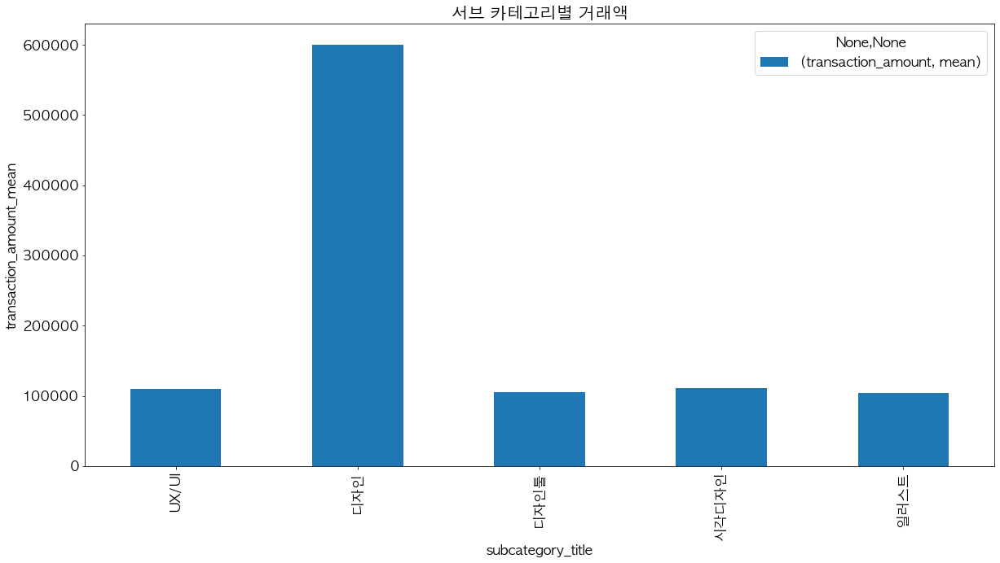

In [186]:
mean_ta_design_df = design_df.groupby('subcategory_title').agg(transaction_mean) 
mean_ta_design_df.plot(kind = 'bar' ) #시각화
plt.title("서브 카테고리별 거래액")
plt.xlabel("subcategory_title")
plt.ylabel("transaction_amount_mean") #기존에 Nan값이었던 디자인의 거래액이 가장 높음. 나머지는 비슷비슷

디자인 카테고리의 서브카테고리 별로 거래액 평균의 분포를 확인했습니다.

기존의 Nan인 디자인 서브카테고리의 평균 거래액이 높음을 확인했습니다.

###  '디자인' subcategory (기존의 Nan) 분석

In [187]:
sub_design_mask = design_df['subcategory_title'] == '디자인'
design_df[sub_design_mask]

,index,id,customer_id,course_id,type,state,course_title,category_title,format,completed_at,...,is_design,is_programming,is_business,date,year,month,week,quarter,day_of_week,hour
55964,104356,1358339,668028,0,PAYMENT,COMPLETED,프로모션 : 디자인 맥북 pro 패스(9월 현물 프리패스),디자인,올인원,2021-09-22 10:50:48,...,1,0,0,2021-09-22 10:50:48,2021,9,38,3,Wednesday,10
55778,104062,1356395,382725,0,PAYMENT,COMPLETED,프로모션 : 디자인 맥북 pro 패스(9월 현물 프리패스),디자인,올인원,2021-09-20 18:56:54,...,1,0,0,2021-09-20 18:56:54,2021,9,38,3,Monday,18
55823,104128,1356745,611620,0,PAYMENT,COMPLETED,프로모션 : 디자인 맥북 pro 패스(9월 현물 프리패스),디자인,올인원,2021-09-20 23:45:52,...,1,0,0,2021-09-20 23:45:52,2021,9,38,3,Monday,23
56477,105080,1363264,642002,0,REFUND,COMPLETED,프로모션 : 디자인 맥북 air 패스(9월 현물 프리패스),디자인,올인원,2021-09-24 10:57:42,...,1,0,0,2021-09-24 10:57:42,2021,9,38,3,Friday,10
56289,104820,1360973,55069,0,REFUND,COMPLETED,프로모션 : 디자인 맥북 air 패스(9월 현물 프리패스),디자인,올인원,2021-09-23 14:52:48,...,1,0,0,2021-09-23 14:52:48,2021,9,38,3,Thursday,14
56717,105408,1364956,545804,0,PAYMENT,COMPLETED,프로모션 : 디자인 맥북 pro 패스(9월 현물 프리패스),디자인,올인원,2021-09-25 13:25:49,...,1,0,0,2021-09-25 13:25:49,2021,9,38,3,Saturday,13
56134,104611,1359861,271988,0,PAYMENT,COMPLETED,프로모션 : 디자인 맥북 air 패스(9월 현물 프리패스),디자인,올인원,2021-09-22 23:53:03,...,1,0,0,2021-09-22 23:53:03,2021,9,38,3,Wednesday,23
56087,104549,1359501,279518,0,PAYMENT,COMPLETED,프로모션 : 게임 디자인 맥북 air 패스(9월 현물 프리패스),디자인,올인원,2021-09-22 21:54:03,...,1,0,0,2021-09-22 21:54:03,2021,9,38,3,Wednesday,21
56192,104688,1360305,611620,0,REFUND,COMPLETED,프로모션 : 디자인 맥북 pro 패스(9월 현물 프리패스),디자인,올인원,2021-09-23 10:31:01,...,1,0,0,2021-09-23 10:31:01,2021,9,38,3,Thursday,10


 #### course_title이 모두 '프로모션 9월 현물 프리패스' 이 프리패스에는 맥북 가격이 반영되있 거래액이 높다고 결론을 내릴 수 있습니다. 

### subcategory 'UX/UI' 환불율 분석

In [188]:
design = refund_data('디자인') 

디자인 카테고리 인스턴스 호출

In [189]:
design.sub_category('UX/UI') 

,index,id,customer_id,course_id,type,state,course_title,category_title,format,completed_at,...,is_design,is_programming,is_business,date,year,month,week,quarter,day_of_week,hour
27235,57366,1152500,400757,205187,PAYMENT,COMPLETED,올인원 패키지 : 구글 Material Design 시스템을 활용한 Youtube ...,디자인,올인원,2021-06-20 13:34:08,...,1,0,0,2021-06-20 13:34:08,2021,6,24,2,Sunday,13
45240,89762,1290708,608852,204068,PAYMENT,COMPLETED,올인원 패키지 : 마디아의 UX/UI 포트폴리오,디자인,올인원,2021-08-16 21:46:24,...,1,0,0,2021-08-16 21:46:24,2021,8,33,3,Monday,21
11260,23960,1042701,493121,202566,PAYMENT,COMPLETED,올인원 패키지 : 스케치&피그마를 활용한 모바일 UI 디자인,디자인,올인원,2021-04-30 14:50:58,...,1,0,0,2021-04-30 14:50:58,2021,4,17,2,Friday,14
16324,34686,1073867,523364,203523,PAYMENT,COMPLETED,초격차 패키지 : 한번에 끝내는 UX/UI 디자인,디자인,올인원,2021-05-15 20:52:01,...,1,0,0,2021-05-15 20:52:01,2021,5,19,2,Saturday,20
45206,89713,1290547,634815,203523,PAYMENT,COMPLETED,초격차 패키지 : 한번에 끝내는 UX/UI 디자인,디자인,올인원,2021-08-16 20:51:33,...,1,0,0,2021-08-16 20:51:33,2021,8,33,3,Monday,20
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
51583,98443,1330299,632890,204068,PAYMENT,COMPLETED,올인원 패키지 : 마디아의 UX/UI 포트폴리오,디자인,올인원,2021-09-06 11:03:25,...,1,0,0,2021-09-06 11:03:25,2021,9,36,3,Monday,11
8021,17331,1024093,500477,204068,REFUND,COMPLETED,올인원 패키지 : 마디아의 UX/UI 포트폴리오,디자인,올인원,2021-04-23 10:28:50,...,1,0,0,2021-04-23 10:28:50,2021,4,16,2,Friday,10
41000,83973,1263644,620803,202725,PAYMENT,COMPLETED,올인원 패키지 : Data Driven UX Design,디자인,올인원,2021-08-03 22:30:27,...,1,0,0,2021-08-03 22:30:27,2021,8,31,3,Tuesday,22
33702,71941,1210268,232997,203523,PAYMENT,COMPLETED,초격차 패키지 : 한번에 끝내는 UX/UI 디자인,디자인,올인원,2021-07-11 18:57:40,...,1,0,0,2021-07-11 18:57:40,2021,7,27,3,Sunday,18


subcategory가 UX/UI 것들만 출력하는 메소드 호출

In [190]:
design.refund('UX/UI')

,index,id,customer_id,course_id,type,state,course_title,category_title,format,completed_at,...,is_design,is_programming,is_business,date,year,month,week,quarter,day_of_week,hour
42304,85781,1273607,625954,203523,REFUND,COMPLETED,초격차 패키지 : 한번에 끝내는 UX/UI 디자인,디자인,올인원,2021-08-09 14:15:59,...,1,0,0,2021-08-09 14:15:59,2021,8,32,3,Monday,14
34386,73427,1216552,140079,204068,REFUND,COMPLETED,올인원 패키지 : 마디아의 UX/UI 포트폴리오,디자인,올인원,2021-07-14 16:48:19,...,1,0,0,2021-07-14 16:48:19,2021,7,28,3,Wednesday,16
34359,73384,1216385,91399,202725,REFUND,COMPLETED,올인원 패키지 : Data Driven UX Design,디자인,올인원,2021-07-14 15:24:20,...,1,0,0,2021-07-14 15:24:20,2021,7,28,3,Wednesday,15
10994,23531,1041600,513755,204068,REFUND,COMPLETED,올인원 패키지 : 마디아의 UX/UI 포트폴리오,디자인,올인원,2021-04-30 10:38:46,...,1,0,0,2021-04-30 10:38:46,2021,4,17,2,Friday,10
15612,33137,1068653,527610,203100,REFUND,COMPLETED,올인원 패키지 : 성공적인 UX를 위한 유저 리서치 by 카카오페이 리서처,디자인,올인원,2021-05-13 13:44:37,...,1,0,0,2021-05-13 13:44:37,2021,5,19,2,Thursday,13
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
56221,104728,1360472,661728,203523,REFUND,COMPLETED,초격차 패키지 : 한번에 끝내는 UX/UI 디자인,디자인,올인원,2021-09-23 11:40:40,...,1,0,0,2021-09-23 11:40:40,2021,9,38,3,Thursday,11
50633,97121,1324041,22802,203523,REFUND,COMPLETED,초격차 패키지 : 한번에 끝내는 UX/UI 디자인,디자인,올인원,2021-09-01 18:11:17,...,1,0,0,2021-09-01 18:11:17,2021,9,35,3,Wednesday,18
19977,42086,1101021,141467,204068,REFUND,COMPLETED,올인원 패키지 : 마디아의 UX/UI 포트폴리오,디자인,올인원,2021-05-27 10:17:06,...,1,0,0,2021-05-27 10:17:06,2021,5,21,2,Thursday,10
51778,98674,1330996,634463,203523,REFUND,COMPLETED,초격차 패키지 : 한번에 끝내는 UX/UI 디자인,디자인,올인원,2021-09-06 14:10:04,...,1,0,0,2021-09-06 14:10:04,2021,9,36,3,Monday,14


UX/UI 중에서 환불인 자료 출력하는 메소드 호출

In [191]:
design.pair_refund('UX/UI')

,index,id,customer_id,course_id,type,state,course_title,category_title,format,completed_at,...,is_design,is_programming,is_business,date,year,month,week,quarter,day_of_week,hour
11782,25026,1045473,14507,202566,PAYMENT,COMPLETED,올인원 패키지 : 스케치&피그마를 활용한 모바일 UI 디자인,디자인,올인원,2021-04-30 22:15:19,...,1,0,0,2021-04-30 22:15:19,2021,4,17,2,Friday,22
26579,55952,1146778,19870,205187,PAYMENT,COMPLETED,올인원 패키지 : 구글 Material Design 시스템을 활용한 Youtube ...,디자인,올인원,2021-06-17 12:18:57,...,1,0,0,2021-06-17 12:18:57,2021,6,24,2,Thursday,12
31423,66813,1184062,29942,202725,PAYMENT,COMPLETED,올인원 패키지 : Data Driven UX Design,디자인,올인원,2021-06-30 23:33:23,...,1,0,0,2021-06-30 23:33:23,2021,6,26,2,Wednesday,23
31429,66828,1184097,29942,203100,PAYMENT,COMPLETED,올인원 패키지 : 성공적인 UX를 위한 유저 리서치 by 카카오페이 리서처,디자인,올인원,2021-06-30 23:34:54,...,1,0,0,2021-06-30 23:34:54,2021,6,26,2,Wednesday,23
11564,24558,1044394,31353,203523,PAYMENT,COMPLETED,초격차 패키지 : 한번에 끝내는 UX/UI 디자인,디자인,올인원,2021-04-30 19:12:52,...,1,0,0,2021-04-30 19:12:52,2021,4,17,2,Friday,19
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
53472,100834,1339783,659251,205187,PAYMENT,COMPLETED,올인원 패키지 : 구글 Material Design 시스템을 활용한 Youtube ...,디자인,올인원,2021-09-10 15:31:16,...,1,0,0,2021-09-10 15:31:16,2021,9,36,3,Friday,15
53465,100826,1339720,659251,205187,PAYMENT,COMPLETED,올인원 패키지 : 구글 Material Design 시스템을 활용한 Youtube ...,디자인,올인원,2021-09-10 15:14:53,...,1,0,0,2021-09-10 15:14:53,2021,9,36,3,Friday,15
54300,101982,1344354,661218,203776,PAYMENT,COMPLETED,올인원 패키지 : UX/UI 디자인 (2020),디자인,올인원,2021-09-13 12:49:06,...,1,0,0,2021-09-13 12:49:06,2021,9,37,3,Monday,12
55191,103209,1350822,661728,203523,PAYMENT,COMPLETED,초격차 패키지 : 한번에 끝내는 UX/UI 디자인,디자인,올인원,2021-09-16 23:01:21,...,1,0,0,2021-09-16 23:01:21,2021,9,37,3,Thursday,23


PAYMENT & REFUND pair로 존재하는 자료 출력하는 메소드 호출

In [192]:
design.refund_ratio('UX/UI')

5.42

#### UX/UI의 환불율은 5.42%입니다.

### subcategory '디자인툴' 환불율 분석

In [193]:
design.sub_category('디자인툴') 

,index,id,customer_id,course_id,type,state,course_title,category_title,format,completed_at,...,is_design,is_programming,is_business,date,year,month,week,quarter,day_of_week,hour
48295,93944,1310638,478902,204207,PAYMENT,COMPLETED,초격차 패키지 : 확실하게 끝내는 포토샵&일러스트레이터,디자인,올인원,2021-08-27 18:06:26,...,1,0,0,2021-08-27 18:06:26,2021,8,34,3,Friday,18
34497,73674,1217851,46046,204286,REFUND,COMPLETED,초격차 패키지 : 한번에 끝내는 3D 디자인 툴,디자인,올인원,2021-07-15 10:33:00,...,1,0,0,2021-07-15 10:33:00,2021,7,28,3,Thursday,10
11323,24066,1042974,485326,202523,PAYMENT,COMPLETED,올인원 패키지 : 사진 촬영 및 라이트룸 보정,디자인,올인원,2021-04-30 15:53:42,...,1,0,0,2021-04-30 15:53:42,2021,4,17,2,Friday,15
11337,24096,1043058,514435,203787,PAYMENT,COMPLETED,초격차 패키지 : 한번에 끝내는 디자인 툴,디자인,올인원,2021-04-30 16:12:10,...,1,0,0,2021-04-30 16:12:10,2021,4,17,2,Friday,16
35846,76686,1229283,600648,204207,REFUND,COMPLETED,초격차 패키지 : 확실하게 끝내는 포토샵&일러스트레이터,디자인,올인원,2021-07-20 15:07:11,...,1,0,0,2021-07-20 15:07:11,2021,7,29,3,Tuesday,15
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
50768,97297,1324882,652398,203328,PAYMENT,COMPLETED,올인원 패키지 : 디자이너 몰래 듣는 압축 포토샵,디자인,올인원,2021-09-02 12:36:23,...,1,0,0,2021-09-02 12:36:23,2021,9,35,3,Thursday,12
50782,97320,1325014,652398,203328,REFUND,COMPLETED,올인원 패키지 : 디자이너 몰래 듣는 압축 포토샵,디자인,올인원,2021-09-02 13:56:17,...,1,0,0,2021-09-02 13:56:17,2021,9,35,3,Thursday,13
20206,42553,1102841,543024,203787,PAYMENT,COMPLETED,초격차 패키지 : 한번에 끝내는 디자인 툴,디자인,올인원,2021-05-28 00:56:53,...,1,0,0,2021-05-28 00:56:53,2021,5,21,2,Friday,0
56185,104680,1360263,668994,203787,PAYMENT,COMPLETED,초격차 패키지 : 한번에 끝내는 디자인 툴,디자인,올인원,2021-09-23 10:12:22,...,1,0,0,2021-09-23 10:12:22,2021,9,38,3,Thursday,10


In [194]:
design.refund('디자인툴')

,index,id,customer_id,course_id,type,state,course_title,category_title,format,completed_at,...,is_design,is_programming,is_business,date,year,month,week,quarter,day_of_week,hour
34497,73674,1217851,46046,204286,REFUND,COMPLETED,초격차 패키지 : 한번에 끝내는 3D 디자인 툴,디자인,올인원,2021-07-15 10:33:00,...,1,0,0,2021-07-15 10:33:00,2021,7,28,3,Thursday,10
35846,76686,1229283,600648,204207,REFUND,COMPLETED,초격차 패키지 : 확실하게 끝내는 포토샵&일러스트레이터,디자인,올인원,2021-07-20 15:07:11,...,1,0,0,2021-07-20 15:07:11,2021,7,29,3,Tuesday,15
48871,94742,1314266,133533,203787,REFUND,COMPLETED,초격차 패키지 : 한번에 끝내는 디자인 툴,디자인,올인원,2021-08-30 10:01:32,...,1,0,0,2021-08-30 10:01:32,2021,8,35,3,Monday,10
10551,22625,1039091,509739,204286,REFUND,COMPLETED,초격차 패키지 : 한번에 끝내는 3D 디자인 툴,디자인,올인원,2021-04-29 14:48:53,...,1,0,0,2021-04-29 14:48:53,2021,4,17,2,Thursday,14
42274,85746,1273494,121285,203787,REFUND,COMPLETED,초격차 패키지 : 한번에 끝내는 디자인 툴,디자인,올인원,2021-08-09 13:43:37,...,1,0,0,2021-08-09 13:43:37,2021,8,32,3,Monday,13
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
25199,52882,1136210,553101,203787,REFUND,COMPLETED,초격차 패키지 : 한번에 끝내는 디자인 툴,디자인,올인원,2021-06-11 18:25:24,...,1,0,0,2021-06-11 18:25:24,2021,6,23,2,Friday,18
56183,104678,1360258,665446,204207,REFUND,COMPLETED,초격차 패키지 : 확실하게 끝내는 포토샵&일러스트레이터,디자인,올인원,2021-09-23 10:09:27,...,1,0,0,2021-09-23 10:09:27,2021,9,38,3,Thursday,10
40954,83915,1263166,620319,204207,REFUND,COMPLETED,초격차 패키지 : 확실하게 끝내는 포토샵&일러스트레이터,디자인,올인원,2021-08-03 18:21:20,...,1,0,0,2021-08-03 18:21:20,2021,8,31,3,Tuesday,18
33904,72407,1211980,588586,204207,REFUND,COMPLETED,초격차 패키지 : 확실하게 끝내는 포토샵&일러스트레이터,디자인,올인원,2021-07-12 15:18:25,...,1,0,0,2021-07-12 15:18:25,2021,7,28,3,Monday,15


In [195]:
design.pair_refund('디자인툴')

,index,id,customer_id,course_id,type,state,course_title,category_title,format,completed_at,...,is_design,is_programming,is_business,date,year,month,week,quarter,day_of_week,hour
16371,34781,1074100,46957,204286,PAYMENT,COMPLETED,초격차 패키지 : 한번에 끝내는 3D 디자인 툴,디자인,올인원,2021-05-15 22:54:57,...,1,0,0,2021-05-15 22:54:57,2021,5,19,2,Saturday,22
16645,35387,1075614,54717,202523,PAYMENT,COMPLETED,올인원 패키지 : 사진 촬영 및 라이트룸 보정,디자인,올인원,2021-05-16 18:35:43,...,1,0,0,2021-05-16 18:35:43,2021,5,19,2,Sunday,18
16647,35390,1075622,54717,203328,PAYMENT,COMPLETED,올인원 패키지 : 디자이너 몰래 듣는 압축 포토샵,디자인,올인원,2021-05-16 18:40:00,...,1,0,0,2021-05-16 18:40:00,2021,5,19,2,Sunday,18
24825,52157,1133233,54717,202523,PAYMENT,COMPLETED,올인원 패키지 : 사진 촬영 및 라이트룸 보정,디자인,올인원,2021-06-10 22:45:36,...,1,0,0,2021-06-10 22:45:36,2021,6,23,2,Thursday,22
24824,52156,1133229,54717,203328,PAYMENT,COMPLETED,올인원 패키지 : 디자이너 몰래 듣는 압축 포토샵,디자인,올인원,2021-06-10 22:43:57,...,1,0,0,2021-06-10 22:43:57,2021,6,23,2,Thursday,22
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
49555,95681,1318209,649591,204286,PAYMENT,COMPLETED,초격차 패키지 : 한번에 끝내는 3D 디자인 툴,디자인,올인원,2021-08-31 13:55:48,...,1,0,0,2021-08-31 13:55:48,2021,8,35,3,Tuesday,13
50768,97297,1324882,652398,203328,PAYMENT,COMPLETED,올인원 패키지 : 디자이너 몰래 듣는 압축 포토샵,디자인,올인원,2021-09-02 12:36:23,...,1,0,0,2021-09-02 12:36:23,2021,9,35,3,Thursday,12
50843,97406,1325402,652816,205819,PAYMENT,COMPLETED,초격차 패키지 : 한 번에 끝내는 일러스트레이터 활용,디자인,올인원,2021-09-02 17:36:32,...,1,0,0,2021-09-02 17:36:32,2021,9,35,3,Thursday,17
53024,100268,1337510,658169,204286,PAYMENT,COMPLETED,초격차 패키지 : 한번에 끝내는 3D 디자인 툴,디자인,올인원,2021-09-09 14:02:14,...,1,0,0,2021-09-09 14:02:14,2021,9,36,3,Thursday,14


In [196]:
design.refund_ratio('디자인툴')

4.76

#### 디자인툴 환불율은 4.76% 입니다.

### subcategory '시각디자인' 환불율 분석 

In [197]:
design.sub_category('시각디자인')

,index,id,customer_id,course_id,type,state,course_title,category_title,format,completed_at,...,is_design,is_programming,is_business,date,year,month,week,quarter,day_of_week,hour
11344,24108,1043085,514302,204013,PAYMENT,COMPLETED,올인원 패키지 : 완전정복 시각디자인 기초,디자인,올인원,2021-04-30 16:19:12,...,1,0,0,2021-04-30 16:19:12,2021,4,17,2,Friday,16
45205,89712,1290542,81583,206023,PAYMENT,COMPLETED,올인원 패키지 : 디자인의 차이를 만드는 서체 활용법 by 산돌 서체 디자이너,디자인,올인원,2021-08-16 20:50:42,...,1,0,0,2021-08-16 20:50:42,2021,8,33,3,Monday,20
44452,88628,1286146,69746,204013,PAYMENT,COMPLETED,올인원 패키지 : 완전정복 시각디자인 기초,디자인,올인원,2021-08-14 12:41:32,...,1,0,0,2021-08-14 12:41:32,2021,8,32,3,Saturday,12
11356,24137,1043165,488413,202418,PAYMENT,COMPLETED,올인원 패키지 : 타이포그래피와 편집디자인,디자인,올인원,2021-04-30 16:34:38,...,1,0,0,2021-04-30 16:34:38,2021,4,17,2,Friday,16
45191,89694,1290484,290240,206023,PAYMENT,COMPLETED,올인원 패키지 : 디자인의 차이를 만드는 서체 활용법 by 산돌 서체 디자이너,디자인,올인원,2021-08-16 20:38:17,...,1,0,0,2021-08-16 20:38:17,2021,8,33,3,Monday,20
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8110,17534,1024830,504825,204013,PAYMENT,COMPLETED,올인원 패키지 : 완전정복 시각디자인 기초,디자인,올인원,2021-04-23 15:35:09,...,1,0,0,2021-04-23 15:35:09,2021,4,16,2,Friday,15
33914,72423,1212044,590099,204013,REFUND,COMPLETED,올인원 패키지 : 완전정복 시각디자인 기초,디자인,올인원,2021-07-12 15:56:11,...,1,0,0,2021-07-12 15:56:11,2021,7,28,3,Monday,15
50728,97248,1324744,503795,204013,PAYMENT,COMPLETED,올인원 패키지 : 완전정복 시각디자인 기초,디자인,올인원,2021-09-02 09:56:34,...,1,0,0,2021-09-02 09:56:34,2021,9,35,3,Thursday,9
743,1600,974931,464893,202418,PAYMENT,COMPLETED,올인원 패키지 : 타이포그래피와 편집디자인,디자인,올인원,2021-03-29 20:48:19,...,1,0,0,2021-03-29 20:48:19,2021,3,13,1,Monday,20


In [198]:
design.refund('시각디자인')

,index,id,customer_id,course_id,type,state,course_title,category_title,format,completed_at,...,is_design,is_programming,is_business,date,year,month,week,quarter,day_of_week,hour
42293,85769,1273575,443538,204013,REFUND,COMPLETED,올인원 패키지 : 완전정복 시각디자인 기초,디자인,올인원,2021-08-09 14:08:06,...,1,0,0,2021-08-09 14:08:06,2021,8,32,3,Monday,14
35348,75653,1225752,503364,204013,REFUND,COMPLETED,올인원 패키지 : 완전정복 시각디자인 기초,디자인,올인원,2021-07-19 13:27:20,...,1,0,0,2021-07-19 13:27:20,2021,7,29,3,Monday,13
46099,90937,1295859,104795,204013,REFUND,COMPLETED,올인원 패키지 : 완전정복 시각디자인 기초,디자인,올인원,2021-08-19 10:37:13,...,1,0,0,2021-08-19 10:37:13,2021,8,33,3,Thursday,10
12938,27436,1052132,508526,204013,REFUND,COMPLETED,올인원 패키지 : 완전정복 시각디자인 기초,디자인,올인원,2021-05-04 15:03:30,...,1,0,0,2021-05-04 15:03:30,2021,5,18,2,Tuesday,15
47078,92296,1302412,497619,206511,REFUND,COMPLETED,올인원 패키지 : 시선을 사로잡는 브랜드 디자인,디자인,올인원,2021-08-23 11:54:25,...,1,0,0,2021-08-23 11:54:25,2021,8,34,3,Monday,11
14400,30738,1062024,512393,204013,REFUND,COMPLETED,올인원 패키지 : 완전정복 시각디자인 기초,디자인,올인원,2021-05-10 10:14:47,...,1,0,0,2021-05-10 10:14:47,2021,5,19,2,Monday,10
47328,92623,1303921,641843,206511,REFUND,COMPLETED,올인원 패키지 : 시선을 사로잡는 브랜드 디자인,디자인,올인원,2021-08-24 10:05:39,...,1,0,0,2021-08-24 10:05:39,2021,8,34,3,Tuesday,10
46472,91447,1298831,639076,206511,REFUND,COMPLETED,올인원 패키지 : 시선을 사로잡는 브랜드 디자인,디자인,올인원,2021-08-20 17:32:20,...,1,0,0,2021-08-20 17:32:20,2021,8,33,3,Friday,17
43594,87466,1281030,287593,204013,REFUND,COMPLETED,올인원 패키지 : 완전정복 시각디자인 기초,디자인,올인원,2021-08-12 15:00:28,...,1,0,0,2021-08-12 15:00:28,2021,8,32,3,Thursday,15
17012,36222,1077826,530248,204013,REFUND,COMPLETED,올인원 패키지 : 완전정복 시각디자인 기초,디자인,올인원,2021-05-17 13:24:46,...,1,0,0,2021-05-17 13:24:46,2021,5,20,2,Monday,13


In [199]:
design.pair_refund('시각디자인')

,index,id,customer_id,course_id,type,state,course_title,category_title,format,completed_at,...,is_design,is_programming,is_business,date,year,month,week,quarter,day_of_week,hour
29115,61571,1168934,40104,202418,PAYMENT,COMPLETED,올인원 패키지 : 타이포그래피와 편집디자인,디자인,올인원,2021-06-27 12:36:05,...,1,0,0,2021-06-27 12:36:05,2021,6,25,2,Sunday,12
21563,45401,1111398,57108,204013,PAYMENT,COMPLETED,올인원 패키지 : 완전정복 시각디자인 기초,디자인,올인원,2021-05-31 17:54:59,...,1,0,0,2021-05-31 17:54:59,2021,5,22,2,Monday,17
45713,90404,1293359,104795,204013,PAYMENT,COMPLETED,올인원 패키지 : 완전정복 시각디자인 기초,디자인,올인원,2021-08-17 21:35:06,...,1,0,0,2021-08-17 21:35:06,2021,8,33,3,Tuesday,21
43581,87449,1280932,287593,204013,PAYMENT,COMPLETED,올인원 패키지 : 완전정복 시각디자인 기초,디자인,올인원,2021-08-12 14:33:47,...,1,0,0,2021-08-12 14:33:47,2021,8,32,3,Thursday,14
40866,83792,1262331,427728,202418,PAYMENT,COMPLETED,올인원 패키지 : 타이포그래피와 편집디자인,디자인,올인원,2021-08-03 13:05:59,...,1,0,0,2021-08-03 13:05:59,2021,8,31,3,Tuesday,13
41746,85059,1270728,443538,204013,PAYMENT,COMPLETED,올인원 패키지 : 완전정복 시각디자인 기초,디자인,올인원,2021-08-07 23:10:35,...,1,0,0,2021-08-07 23:10:35,2021,8,31,3,Saturday,23
7639,16482,1020861,445871,204013,PAYMENT,COMPLETED,올인원 패키지 : 완전정복 시각디자인 기초,디자인,올인원,2021-04-21 13:59:48,...,1,0,0,2021-04-21 13:59:48,2021,4,16,2,Wednesday,13
282,678,972447,458228,202418,PAYMENT,COMPLETED,올인원 패키지 : 타이포그래피와 편집디자인,디자인,올인원,2021-03-29 09:50:08,...,1,0,0,2021-03-29 09:50:08,2021,3,13,1,Monday,9
125,341,971579,476282,204013,PAYMENT,COMPLETED,올인원 패키지 : 완전정복 시각디자인 기초,디자인,올인원,2021-03-28 22:12:00,...,1,0,0,2021-03-28 22:12:00,2021,3,12,1,Sunday,22
3833,8046,993426,477967,204013,PAYMENT,COMPLETED,올인원 패키지 : 완전정복 시각디자인 기초,디자인,올인원,2021-04-05 17:24:46,...,1,0,0,2021-04-05 17:24:46,2021,4,14,2,Monday,17


In [200]:
design.refund_ratio('시각디자인')

3.85

#### 시각디자인툴 환불율은 3.85% 입니다.

### subcategory '일러스트' 환불율 분석 

In [201]:
design.sub_category('일러스트')

,index,id,customer_id,course_id,type,state,course_title,category_title,format,completed_at,...,is_design,is_programming,is_business,date,year,month,week,quarter,day_of_week,hour
48263,93908,1310428,150068,206111,PAYMENT,COMPLETED,올인원 패키지 : 박담 작가와 함께 남자 캐릭터 드로잉,디자인,올인원,2021-08-27 16:53:57,...,1,0,0,2021-08-27 16:53:57,2021,8,34,3,Friday,16
44457,88635,1286172,627043,205625,PAYMENT,COMPLETED,초격차 패키지 : 세상의 모든 감성 아이패드 드로잉,디자인,올인원,2021-08-14 13:02:41,...,1,0,0,2021-08-14 13:02:41,2021,8,32,3,Saturday,13
29098,61526,1168773,573859,204871,PAYMENT,COMPLETED,올인원 패키지 : star741의 캐주얼 일러스트 드로잉,디자인,올인원,2021-06-27 10:19:47,...,1,0,0,2021-06-27 10:19:47,2021,6,25,2,Sunday,10
48251,93896,1310357,645927,206111,PAYMENT,COMPLETED,올인원 패키지 : 박담 작가와 함께 남자 캐릭터 드로잉,디자인,올인원,2021-08-27 16:13:00,...,1,0,0,2021-08-27 16:13:00,2021,8,34,3,Friday,16
27232,57358,1152481,565518,204871,PAYMENT,COMPLETED,올인원 패키지 : star741의 캐주얼 일러스트 드로잉,디자인,올인원,2021-06-20 13:11:27,...,1,0,0,2021-06-20 13:11:27,2021,6,24,2,Sunday,13
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
40992,83964,1263559,620760,205625,PAYMENT,COMPLETED,초격차 패키지 : 세상의 모든 감성 아이패드 드로잉,디자인,올인원,2021-08-03 21:39:55,...,1,0,0,2021-08-03 21:39:55,2021,8,31,3,Tuesday,21
30054,63682,1175269,566314,204871,PAYMENT,COMPLETED,올인원 패키지 : star741의 캐주얼 일러스트 드로잉,디자인,올인원,2021-06-29 17:17:01,...,1,0,0,2021-06-29 17:17:01,2021,6,26,2,Tuesday,17
20219,42575,1102927,543798,204871,PAYMENT,COMPLETED,올인원 패키지 : star741의 캐주얼 일러스트 드로잉,디자인,올인원,2021-05-28 01:53:51,...,1,0,0,2021-05-28 01:53:51,2021,5,21,2,Friday,1
16006,33946,1071236,529070,203989,PAYMENT,COMPLETED,올인원 패키지 : 소금툰과 함께 캐릭터 드로잉/굿즈/임티/컷툰,디자인,올인원,2021-05-14 17:22:15,...,1,0,0,2021-05-14 17:22:15,2021,5,19,2,Friday,17


In [202]:
design.refund('일러스트')

,index,id,customer_id,course_id,type,state,course_title,category_title,format,completed_at,...,is_design,is_programming,is_business,date,year,month,week,quarter,day_of_week,hour
35850,76690,1229304,284884,204871,REFUND,COMPLETED,올인원 패키지 : star741의 캐주얼 일러스트 드로잉,디자인,올인원,2021-07-20 15:14:35,...,1,0,0,2021-07-20 15:14:35,2021,7,29,3,Tuesday,15
42343,85827,1273808,618626,205625,REFUND,COMPLETED,초격차 패키지 : 세상의 모든 감성 아이패드 드로잉,디자인,올인원,2021-08-09 15:28:00,...,1,0,0,2021-08-09 15:28:00,2021,8,32,3,Monday,15
48930,94822,1314534,159226,205625,REFUND,COMPLETED,초격차 패키지 : 세상의 모든 감성 아이패드 드로잉,디자인,올인원,2021-08-30 11:48:29,...,1,0,0,2021-08-30 11:48:29,2021,8,35,3,Monday,11
48923,94814,1314502,647072,205625,REFUND,COMPLETED,초격차 패키지 : 세상의 모든 감성 아이패드 드로잉,디자인,올인원,2021-08-30 11:38:47,...,1,0,0,2021-08-30 11:38:47,2021,8,35,3,Monday,11
42371,85866,1273948,618626,203989,REFUND,COMPLETED,올인원 패키지 : 소금툰과 함께 캐릭터 드로잉/굿즈/임티/컷툰,디자인,올인원,2021-08-09 16:14:49,...,1,0,0,2021-08-09 16:14:49,2021,8,32,3,Monday,16
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
37973,79781,1242709,49176,205625,REFUND,COMPLETED,초격차 패키지 : 세상의 모든 감성 아이패드 드로잉,디자인,올인원,2021-07-26 10:49:42,...,1,0,0,2021-07-26 10:49:42,2021,7,30,3,Monday,10
33907,72411,1212004,587757,205625,REFUND,COMPLETED,초격차 패키지 : 세상의 모든 감성 아이패드 드로잉,디자인,올인원,2021-07-12 15:31:13,...,1,0,0,2021-07-12 15:31:13,2021,7,28,3,Monday,15
30045,63656,1175183,566992,204871,REFUND,COMPLETED,올인원 패키지 : star741의 캐주얼 일러스트 드로잉,디자인,올인원,2021-06-29 16:59:43,...,1,0,0,2021-06-29 16:59:43,2021,6,26,2,Tuesday,16
8091,17486,1024621,505106,203989,REFUND,COMPLETED,올인원 패키지 : 소금툰과 함께 캐릭터 드로잉/굿즈/임티/컷툰,디자인,올인원,2021-04-23 14:25:45,...,1,0,0,2021-04-23 14:25:45,2021,4,16,2,Friday,14


In [203]:
design.pair_refund('일러스트')

,index,id,customer_id,course_id,type,state,course_title,category_title,format,completed_at,...,is_design,is_programming,is_business,date,year,month,week,quarter,day_of_week,hour
42285,85759,1273545,19324,205625,PAYMENT,COMPLETED,초격차 패키지 : 세상의 모든 감성 아이패드 드로잉,디자인,올인원,2021-08-09 14:01:24,...,1,0,0,2021-08-09 14:01:24,2021,8,32,3,Monday,14
34253,73179,1215549,21355,205625,PAYMENT,COMPLETED,초격차 패키지 : 세상의 모든 감성 아이패드 드로잉,디자인,올인원,2021-07-14 09:06:23,...,1,0,0,2021-07-14 09:06:23,2021,7,28,3,Wednesday,9
5568,11891,1005679,29024,203989,PAYMENT,COMPLETED,올인원 패키지 : 소금툰과 함께 캐릭터 드로잉/굿즈/임티/컷툰,디자인,올인원,2021-04-11 23:30:05,...,1,0,0,2021-04-11 23:30:05,2021,4,14,2,Sunday,23
35080,74993,1223552,43646,205625,PAYMENT,COMPLETED,초격차 패키지 : 세상의 모든 감성 아이패드 드로잉,디자인,올인원,2021-07-18 13:26:55,...,1,0,0,2021-07-18 13:26:55,2021,7,28,3,Sunday,13
42502,86035,1274525,48098,205625,PAYMENT,COMPLETED,초격차 패키지 : 세상의 모든 감성 아이패드 드로잉,디자인,올인원,2021-08-09 19:56:15,...,1,0,0,2021-08-09 19:56:15,2021,8,32,3,Monday,19
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
50927,97546,1326269,653303,206181,PAYMENT,COMPLETED,올인원 패키지 : 리마의 로맨스판타지 웹소설 일러스트,디자인,올인원,2021-09-03 09:50:59,...,1,0,0,2021-09-03 09:50:59,2021,9,35,3,Friday,9
51161,97882,1328095,654417,206181,PAYMENT,COMPLETED,올인원 패키지 : 리마의 로맨스판타지 웹소설 일러스트,디자인,올인원,2021-09-04 19:06:17,...,1,0,0,2021-09-04 19:06:17,2021,9,35,3,Saturday,19
55663,103890,1355348,658035,205625,PAYMENT,COMPLETED,초격차 패키지 : 세상의 모든 감성 아이패드 드로잉,디자인,올인원,2021-09-19 20:54:45,...,1,0,0,2021-09-19 20:54:45,2021,9,37,3,Sunday,20
54403,102133,1344943,661460,206111,PAYMENT,COMPLETED,올인원 패키지 : 박담 작가와 함께 남자 캐릭터 드로잉,디자인,올인원,2021-09-13 19:02:28,...,1,0,0,2021-09-13 19:02:28,2021,9,37,3,Monday,19


In [204]:
design.refund_ratio('일러스트')

5.84

#### 일러스트 환불율은 5.84 입니다.

## 마케팅 category 분석

In [205]:
marketing = refund_data('마케팅') 

마케팅 카테고리 인스턴스 호출

In [206]:
cond_marketing = trimmed_df['category_title'] == '마케팅' #마케팅 카테고리의 서브카테고리를 살펴 봅시다.
trimmed_df[cond_marketing]['subcategory_title'].unique() #서브카테고리 value들 살펴봄 

array(['글쓰기/카피라이팅', 'SNS마케팅', '데이터마케팅', nan, '디지털마케팅'], dtype=object)

Nan값들을 기타 프로모션으로 바꾸겠습니다.

### subcategory '기타프로모션' 분석

In [207]:
marketing_df = trimmed_df[cond_marketing] 
null_delete_condition_data_marketing = marketing_df['subcategory_title'].isna() #nan값 확인하는 조건
marketing_df.loc[null_delete_condition_data_marketing , 'subcategory_title'] = '기타프로모션' 

Nan값을 가지는 서브카테고리를 모두 '기타프로모션' 으로 변경하였습니다.

In [208]:
etc_marketing_cond = marketing_df['subcategory_title'] == '기타프로모션'
etc_marketing_df = marketing_df[etc_marketing_cond]
etc_marketing_df

,index,id,customer_id,course_id,type,state,course_title,category_title,format,completed_at,...,is_design,is_programming,is_business,date,year,month,week,quarter,day_of_week,hour
23005,48366,1121108,552222,0,PAYMENT,COMPLETED,프로모션 : 2+2 풀스택 마케터를 위한 마케팅 PASS (6월 프리패스),마케팅,올인원,2021-06-04 21:36:36,...,1,0,0,2021-06-04 21:36:36,2021,6,22,2,Friday,21
24538,51575,1130582,556498,0,PAYMENT,COMPLETED,프로모션 : 2+2 풀스택 마케터를 위한 마케팅 PASS (6월 프리패스),마케팅,올인원,2021-06-09 22:21:08,...,1,0,0,2021-06-09 22:21:08,2021,6,23,2,Wednesday,22
22966,48280,1120797,32227,0,PAYMENT,COMPLETED,프로모션 : 2+2 지금은 마테크가 대세! 매출을 일으키는 마케팅 PASS (6월 ...,마케팅,올인원,2021-06-04 17:32:36,...,1,0,0,2021-06-04 17:32:36,2021,6,22,2,Friday,17
22939,48234,1120528,25265,203996,PAYMENT,COMPLETED,매주)디지털 마케팅 온라인 완주반,마케팅,온라인 완주반,2021-06-04 15:16:10,...,1,0,0,2021-06-04 15:16:10,2021,6,22,2,Friday,15
23582,49661,1124677,414278,203996,REFUND,COMPLETED,매주)디지털 마케팅 온라인 완주반,마케팅,온라인 완주반,2021-06-07 11:13:51,...,1,0,0,2021-06-07 11:13:51,2021,6,23,2,Monday,11
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
34591,73870,1218731,31006,203996,REFUND,COMPLETED,매주)디지털 마케팅 온라인 완주반,마케팅,온라인 완주반,2021-07-15 18:00:59,...,1,0,0,2021-07-15 18:00:59,2021,7,28,3,Thursday,18
13473,28592,1055788,520421,0,PAYMENT,COMPLETED,프로모션 : 풀스택 마케터를 위한 마케팅 무제한 99패스 (5월 프리패스),마케팅,올인원,2021-05-06 17:14:51,...,1,0,0,2021-05-06 17:14:51,2021,5,18,2,Thursday,17
13489,28633,1055955,520372,0,PAYMENT,COMPLETED,프로모션 : 풀스택 마케터를 위한 마케팅 무제한 99패스 (5월 프리패스),마케팅,올인원,2021-05-06 18:30:35,...,1,0,0,2021-05-06 18:30:35,2021,5,18,2,Thursday,18
15895,33735,1070551,528684,204717,PAYMENT,COMPLETED,퍼포먼스 마케터 되기 온라인 완주반 3기,마케팅,온라인 완주반,2021-05-14 12:54:20,...,1,0,0,2021-05-14 12:54:20,2021,5,19,2,Friday,12


기타프로모션인 자료 데이터프레임으로 출력

#### 기타프로모션 중 온라인완주반의 환급율 분석

In [209]:
online_complete_etc_marketing_cond = etc_marketing_df['format'] == '온라인 완주반'
online_complete_etc_marketing_df = etc_marketing_df[online_complete_etc_marketing_cond]
online_complete_etc_marketing_df

,index,id,customer_id,course_id,type,state,course_title,category_title,format,completed_at,...,is_design,is_programming,is_business,date,year,month,week,quarter,day_of_week,hour
22939,48234,1120528,25265,203996,PAYMENT,COMPLETED,매주)디지털 마케팅 온라인 완주반,마케팅,온라인 완주반,2021-06-04 15:16:10,...,1,0,0,2021-06-04 15:16:10,2021,6,22,2,Friday,15
23582,49661,1124677,414278,203996,REFUND,COMPLETED,매주)디지털 마케팅 온라인 완주반,마케팅,온라인 완주반,2021-06-07 11:13:51,...,1,0,0,2021-06-07 11:13:51,2021,6,23,2,Monday,11
16549,35181,1075135,530730,203996,PAYMENT,COMPLETED,매주)디지털 마케팅 온라인 완주반,마케팅,온라인 완주반,2021-05-16 15:17:44,...,1,0,0,2021-05-16 15:17:44,2021,5,19,2,Sunday,15
23593,49680,1124726,553970,203996,PAYMENT,COMPLETED,매주)디지털 마케팅 온라인 완주반,마케팅,온라인 완주반,2021-06-07 11:27:29,...,1,0,0,2021-06-07 11:27:29,2021,6,23,2,Monday,11
26901,56621,1150038,565001,203996,REFUND,COMPLETED,매주)디지털 마케팅 온라인 완주반,마케팅,온라인 완주반,2021-06-18 18:18:14,...,1,0,0,2021-06-18 18:18:14,2021,6,24,2,Friday,18
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
26999,56842,1150857,565501,203996,PAYMENT,COMPLETED,매주)디지털 마케팅 온라인 완주반,마케팅,온라인 완주반,2021-06-19 11:22:08,...,1,0,0,2021-06-19 11:22:08,2021,6,24,2,Saturday,11
15960,33852,1070939,524221,204717,PAYMENT,COMPLETED,퍼포먼스 마케터 되기 온라인 완주반 3기,마케팅,온라인 완주반,2021-05-14 15:32:59,...,1,0,0,2021-05-14 15:32:59,2021,5,19,2,Friday,15
34591,73870,1218731,31006,203996,REFUND,COMPLETED,매주)디지털 마케팅 온라인 완주반,마케팅,온라인 완주반,2021-07-15 18:00:59,...,1,0,0,2021-07-15 18:00:59,2021,7,28,3,Thursday,18
15895,33735,1070551,528684,204717,PAYMENT,COMPLETED,퍼포먼스 마케터 되기 온라인 완주반 3기,마케팅,온라인 완주반,2021-05-14 12:54:20,...,1,0,0,2021-05-14 12:54:20,2021,5,19,2,Friday,12


In [210]:
online_complete_refund_cond = online_complete_etc_marketing_df['transaction_amount'] < 0
len(online_complete_etc_marketing_df[online_complete_refund_cond])

51

환급건수는 51건 입니다.

In [211]:
round((len(online_complete_etc_marketing_df[online_complete_refund_cond]) / len(online_complete_etc_marketing_df) * 100) , 2)

22.37

##### (insight)마케팅 온라인 완주반의 환급율은 22.37입니다.

In [212]:
marketing_df['subcategory_title'].unique()

array(['글쓰기/카피라이팅', 'SNS마케팅', '데이터마케팅', '기타프로모션', '디지털마케팅'], dtype=object)

서브카테고리의 종류 확인

In [213]:
Marketing = refund_data('마케팅') 

마케팅 인스턴스 호출

### subcategory '디지털마케팅' 환급율 분석

In [214]:
Marketing.sub_category('디지털마케팅')

,index,id,customer_id,course_id,type,state,course_title,category_title,format,completed_at,...,is_design,is_programming,is_business,date,year,month,week,quarter,day_of_week,hour
38782,80837,1247539,76229,202284,PAYMENT,COMPLETED,올인원 패키지 : 검색 최적화(SEO) 운영/전략,마케팅,올인원,2021-07-28 17:15:10,...,1,0,0,2021-07-28 17:15:10,2021,7,30,3,Wednesday,17
23599,49688,1124743,524284,202284,PAYMENT,COMPLETED,올인원 패키지 : 검색 최적화(SEO) 운영/전략,마케팅,올인원,2021-06-07 11:30:56,...,1,0,0,2021-06-07 11:30:56,2021,6,23,2,Monday,11
16310,34660,1073794,29024,202883,PAYMENT,COMPLETED,올인원 패키지 : 디지털 마케팅 MAX 2020,마케팅,올인원,2021-05-15 19:55:30,...,1,0,0,2021-05-15 19:55:30,2021,5,19,2,Saturday,19
23631,49735,1124849,524436,202284,PAYMENT,COMPLETED,올인원 패키지 : 검색 최적화(SEO) 운영/전략,마케팅,올인원,2021-06-07 11:49:23,...,1,0,0,2021-06-07 11:49:23,2021,6,23,2,Monday,11
38414,80355,1245349,71673,202883,PAYMENT,COMPLETED,올인원 패키지 : 디지털 마케팅 MAX 2020,마케팅,올인원,2021-07-27 17:08:57,...,1,0,0,2021-07-27 17:08:57,2021,7,30,3,Tuesday,17
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
46708,91765,1300201,580789,202284,PAYMENT,COMPLETED,올인원 패키지 : 검색 최적화(SEO) 운영/전략,마케팅,올인원,2021-08-21 20:34:17,...,1,0,0,2021-08-21 20:34:17,2021,8,33,3,Saturday,20
13710,29102,1057695,521498,202883,PAYMENT,COMPLETED,올인원 패키지 : 디지털 마케팅 MAX 2020,마케팅,올인원,2021-05-07 17:22:15,...,1,0,0,2021-05-07 17:22:15,2021,5,18,2,Friday,17
45119,89586,1290123,154128,202284,PAYMENT,COMPLETED,올인원 패키지 : 검색 최적화(SEO) 운영/전략,마케팅,올인원,2021-08-16 18:44:23,...,1,0,0,2021-08-16 18:44:23,2021,8,33,3,Monday,18
13718,29114,1057749,470231,202883,PAYMENT,COMPLETED,올인원 패키지 : 디지털 마케팅 MAX 2020,마케팅,올인원,2021-05-07 17:47:08,...,1,0,0,2021-05-07 17:47:08,2021,5,18,2,Friday,17


In [215]:
Marketing.refund('디지털마케팅')

,index,id,customer_id,course_id,type,state,course_title,category_title,format,completed_at,...,is_design,is_programming,is_business,date,year,month,week,quarter,day_of_week,hour
23703,49854,1125123,546776,202883,REFUND,COMPLETED,올인원 패키지 : 디지털 마케팅 MAX 2020,마케팅,올인원,2021-06-07 13:15:26,...,1,0,0,2021-06-07 13:15:26,2021,6,23,2,Monday,13
36086,77197,1231352,601242,202883,REFUND,COMPLETED,올인원 패키지 : 디지털 마케팅 MAX 2020,마케팅,올인원,2021-07-21 09:34:24,...,1,0,0,2021-07-21 09:34:24,2021,7,29,3,Wednesday,9
18148,38364,1086670,214941,202883,REFUND,COMPLETED,올인원 패키지 : 디지털 마케팅 MAX 2020,마케팅,올인원,2021-05-21 10:24:51,...,1,0,0,2021-05-21 10:24:51,2021,5,20,2,Friday,10
42750,86358,1275830,626288,202883,REFUND,COMPLETED,올인원 패키지 : 디지털 마케팅 MAX 2020,마케팅,올인원,2021-08-10 11:17:45,...,1,0,0,2021-08-10 11:17:45,2021,8,32,3,Tuesday,11
41277,84369,1266242,154974,202663,REFUND,COMPLETED,올인원 패키지 : 소비자 리서치와 보고서 작성,마케팅,올인원,2021-08-05 10:47:05,...,1,0,0,2021-08-05 10:47:05,2021,8,31,3,Thursday,10
17898,37871,1083639,531696,202883,REFUND,COMPLETED,올인원 패키지 : 디지털 마케팅 MAX 2020,마케팅,올인원,2021-05-20 11:37:07,...,1,0,0,2021-05-20 11:37:07,2021,5,20,2,Thursday,11
43144,86860,1264924,604413,202883,REFUND,COMPLETED,올인원 패키지 : 디지털 마케팅 MAX 2020,마케팅,올인원,2021-08-11 10:43:00,...,1,0,0,2021-08-11 10:43:00,2021,8,32,3,Wednesday,10
43145,86861,1264925,603715,202883,REFUND,COMPLETED,올인원 패키지 : 디지털 마케팅 MAX 2020,마케팅,올인원,2021-08-11 10:43:00,...,1,0,0,2021-08-11 10:43:00,2021,8,32,3,Wednesday,10
40713,83570,1260566,594446,202883,REFUND,COMPLETED,올인원 패키지 : 디지털 마케팅 MAX 2020,마케팅,올인원,2021-08-02 17:13:41,...,1,0,0,2021-08-02 17:13:41,2021,8,31,3,Monday,17
25963,54583,1141806,558002,202883,REFUND,COMPLETED,올인원 패키지 : 디지털 마케팅 MAX 2020,마케팅,올인원,2021-06-14 18:12:09,...,1,0,0,2021-06-14 18:12:09,2021,6,24,2,Monday,18


In [216]:
Marketing.pair_refund('디지털마케팅')

,index,id,customer_id,course_id,type,state,course_title,category_title,format,completed_at,...,is_design,is_programming,is_business,date,year,month,week,quarter,day_of_week,hour
50359,96753,1322268,116790,202284,PAYMENT,COMPLETED,올인원 패키지 : 검색 최적화(SEO) 운영/전략,마케팅,올인원,2021-08-31 23:31:45,...,1,0,0,2021-08-31 23:31:45,2021,8,35,3,Tuesday,23
51823,98730,1331157,147017,205761,PAYMENT,COMPLETED,초격차 패키지 : 한 번에 끝내는 디지털 마케팅,마케팅,올인원,2021-09-06 15:04:54,...,1,0,0,2021-09-06 15:04:54,2021,9,36,3,Monday,15
35066,74954,1223417,154974,202663,PAYMENT,COMPLETED,올인원 패키지 : 소비자 리서치와 보고서 작성,마케팅,올인원,2021-07-18 11:16:37,...,1,0,0,2021-07-18 11:16:37,2021,7,28,3,Sunday,11
45610,90259,1292771,157921,205761,PAYMENT,COMPLETED,초격차 패키지 : 한 번에 끝내는 디지털 마케팅,마케팅,올인원,2021-08-17 17:13:45,...,1,0,0,2021-08-17 17:13:45,2021,8,33,3,Tuesday,17
28157,59420,1159301,160801,202883,PAYMENT,COMPLETED,올인원 패키지 : 디지털 마케팅 MAX 2020,마케팅,올인원,2021-06-23 15:33:41,...,1,0,0,2021-06-23 15:33:41,2021,6,25,2,Wednesday,15
17263,36600,1079062,174529,202284,PAYMENT,COMPLETED,올인원 패키지 : 검색 최적화(SEO) 운영/전략,마케팅,올인원,2021-05-17 21:43:38,...,1,0,0,2021-05-17 21:43:38,2021,5,20,2,Monday,21
21917,46241,1113448,174671,202883,PAYMENT,COMPLETED,올인원 패키지 : 디지털 마케팅 MAX 2020,마케팅,올인원,2021-05-31 22:57:02,...,1,0,0,2021-05-31 22:57:02,2021,5,22,2,Monday,22
18107,38276,1086231,214941,202883,PAYMENT,COMPLETED,올인원 패키지 : 디지털 마케팅 MAX 2020,마케팅,올인원,2021-05-21 01:15:36,...,1,0,0,2021-05-21 01:15:36,2021,5,20,2,Friday,1
9282,20037,1031873,279483,202883,PAYMENT,COMPLETED,올인원 패키지 : 디지털 마케팅 MAX 2020,마케팅,올인원,2021-04-26 21:57:43,...,1,0,0,2021-04-26 21:57:43,2021,4,17,2,Monday,21
52113,99106,1332587,413459,205761,PAYMENT,COMPLETED,초격차 패키지 : 한 번에 끝내는 디지털 마케팅,마케팅,올인원,2021-09-06 22:45:35,...,1,0,0,2021-09-06 22:45:35,2021,9,36,3,Monday,22


In [217]:
Marketing.refund_ratio('디지털마케팅')

3.85

#### 디지털마케팅의 환급율은 3.85%입니다.

### subcategory '글쓰기/카피라이팅' 환급율 분석

In [218]:
Marketing.sub_category('글쓰기/카피라이팅')

,index,id,customer_id,course_id,type,state,course_title,category_title,format,completed_at,...,is_design,is_programming,is_business,date,year,month,week,quarter,day_of_week,hour
38060,79890,1243168,598525,204670,REFUND,COMPLETED,The RED : 김영하 작가의 내 안의 숨은 이야기를 찾아 쓰는 법,마케팅,RED,2021-07-26 15:07:37,...,1,0,0,2021-07-26 15:07:37,2021,7,30,3,Monday,15
44260,88343,1284951,631838,204366,PAYMENT,COMPLETED,올인원 패키지 : 30개 글감으로 에세이 작가되기 BY.정영욱,마케팅,올인원,2021-08-13 20:15:05,...,1,0,0,2021-08-13 20:15:05,2021,8,32,3,Friday,20
38790,80851,1247635,612483,204670,PAYMENT,COMPLETED,The RED : 김영하 작가의 내 안의 숨은 이야기를 찾아 쓰는 법,마케팅,RED,2021-07-28 17:46:31,...,1,0,0,2021-07-28 17:46:31,2021,7,30,3,Wednesday,17
26723,56253,1148025,538621,204366,PAYMENT,COMPLETED,올인원 패키지 : 30개 글감으로 에세이 작가되기 BY.정영욱,마케팅,올인원,2021-06-17 22:17:59,...,1,0,0,2021-06-17 22:17:59,2021,6,24,2,Thursday,22
38097,79939,1243320,609442,204670,PAYMENT,COMPLETED,The RED : 김영하 작가의 내 안의 숨은 이야기를 찾아 쓰는 법,마케팅,RED,2021-07-26 16:20:27,...,1,0,0,2021-07-26 16:20:27,2021,7,30,3,Monday,16
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
35137,75146,1224059,598311,204670,PAYMENT,COMPLETED,The RED : 김영하 작가의 내 안의 숨은 이야기를 찾아 쓰는 법,마케팅,RED,2021-07-18 19:06:05,...,1,0,0,2021-07-18 19:06:05,2021,7,28,3,Sunday,19
15470,32827,1067755,526383,204752,PAYMENT,COMPLETED,올인원 패키지 : 30개 글감으로 에세이 작가되기 BY.정영욱 플러스,마케팅,올인원,2021-05-12 23:06:39,...,1,0,0,2021-05-12 23:06:39,2021,5,19,2,Wednesday,23
28941,61159,1167625,573261,204670,PAYMENT,COMPLETED,The RED : 김영하 작가의 내 안의 숨은 이야기를 찾아 쓰는 법,마케팅,RED,2021-06-26 17:47:36,...,1,0,0,2021-06-26 17:47:36,2021,6,25,2,Saturday,17
28238,59590,1159682,134768,204670,PAYMENT,COMPLETED,The RED : 김영하 작가의 내 안의 숨은 이야기를 찾아 쓰는 법,마케팅,RED,2021-06-23 21:51:55,...,1,0,0,2021-06-23 21:51:55,2021,6,25,2,Wednesday,21


In [219]:
Marketing.pair_refund('글쓰기/카피라이팅')

,index,id,customer_id,course_id,type,state,course_title,category_title,format,completed_at,...,is_design,is_programming,is_business,date,year,month,week,quarter,day_of_week,hour
27062,56980,1151231,32092,204670,PAYMENT,COMPLETED,The RED : 김영하 작가의 내 안의 숨은 이야기를 찾아 쓰는 법,마케팅,RED,2021-06-19 15:51:39,...,1,0,0,2021-06-19 15:51:39,2021,6,24,2,Saturday,15
2345,4920,984040,83335,204325,PAYMENT,COMPLETED,THE RED : 광고인 박웅현과 크리에이티브,마케팅,RED,2021-03-31 23:53:43,...,1,0,0,2021-03-31 23:53:43,2021,3,13,1,Wednesday,23
34027,72667,1213102,121409,204670,PAYMENT,COMPLETED,The RED : 김영하 작가의 내 안의 숨은 이야기를 찾아 쓰는 법,마케팅,RED,2021-07-13 02:09:06,...,1,0,0,2021-07-13 02:09:06,2021,7,28,3,Tuesday,2
50630,97118,1324013,138095,204670,PAYMENT,COMPLETED,The RED : 김영하 작가의 내 안의 숨은 이야기를 찾아 쓰는 법,마케팅,RED,2021-09-01 17:56:29,...,1,0,0,2021-09-01 17:56:29,2021,9,35,3,Wednesday,17
7843,16934,1022452,148190,204366,PAYMENT,COMPLETED,올인원 패키지 : 30개 글감으로 에세이 작가되기 BY.정영욱,마케팅,올인원,2021-04-22 11:48:39,...,1,0,0,2021-04-22 11:48:39,2021,4,16,2,Thursday,11
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
48204,93839,1310120,645836,204670,PAYMENT,COMPLETED,The RED : 김영하 작가의 내 안의 숨은 이야기를 찾아 쓰는 법,마케팅,RED,2021-08-27 14:55:01,...,1,0,0,2021-08-27 14:55:01,2021,8,34,3,Friday,14
48326,93993,1310943,646211,204670,PAYMENT,COMPLETED,The RED : 김영하 작가의 내 안의 숨은 이야기를 찾아 쓰는 법,마케팅,RED,2021-08-27 22:07:04,...,1,0,0,2021-08-27 22:07:04,2021,8,34,3,Friday,22
48423,94127,1311564,646516,204670,PAYMENT,COMPLETED,The RED : 김영하 작가의 내 안의 숨은 이야기를 찾아 쓰는 법,마케팅,RED,2021-08-28 13:48:02,...,1,0,0,2021-08-28 13:48:02,2021,8,34,3,Saturday,13
55077,103055,1349578,664074,204366,PAYMENT,COMPLETED,올인원 패키지 : 30개 글감으로 에세이 작가되기 BY.정영욱,마케팅,올인원,2021-09-16 13:58:48,...,1,0,0,2021-09-16 13:58:48,2021,9,37,3,Thursday,13


In [220]:
Marketing.refund_ratio('글쓰기/카피라이팅')

3.73

#### 글쓰기/카피라이팅의 환급율은 3.73%입니다.

### subcategory 'SNS마케팅' 환급율 분석

In [221]:
Marketing.sub_category('SNS마케팅')

,index,id,customer_id,course_id,type,state,course_title,category_title,format,completed_at,...,is_design,is_programming,is_business,date,year,month,week,quarter,day_of_week,hour
23576,49648,1124643,524226,203015,PAYMENT,COMPLETED,올인원 패키지 : SNS 콘텐츠 기획/제작 MAX 2020,마케팅,올인원,2021-06-07 11:06:14,...,1,0,0,2021-06-07 11:06:14,2021,6,23,2,Monday,11
23638,49748,1124874,524461,203015,PAYMENT,COMPLETED,올인원 패키지 : SNS 콘텐츠 기획/제작 MAX 2020,마케팅,올인원,2021-06-07 11:53:09,...,1,0,0,2021-06-07 11:53:09,2021,6,23,2,Monday,11
24302,51087,1128777,119102,203015,PAYMENT,COMPLETED,올인원 패키지 : SNS 콘텐츠 기획/제작 MAX 2020,마케팅,올인원,2021-06-08 23:02:59,...,1,0,0,2021-06-08 23:02:59,2021,6,23,2,Tuesday,23
23616,49714,1124811,524422,203015,PAYMENT,COMPLETED,올인원 패키지 : SNS 콘텐츠 기획/제작 MAX 2020,마케팅,올인원,2021-06-07 11:44:36,...,1,0,0,2021-06-07 11:44:36,2021,6,23,2,Monday,11
23612,49708,1124802,524413,203015,PAYMENT,COMPLETED,올인원 패키지 : SNS 콘텐츠 기획/제작 MAX 2020,마케팅,올인원,2021-06-07 11:42:41,...,1,0,0,2021-06-07 11:42:41,2021,6,23,2,Monday,11
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
34509,73700,1217947,223369,203015,PAYMENT,COMPLETED,올인원 패키지 : SNS 콘텐츠 기획/제작 MAX 2020,마케팅,올인원,2021-07-15 11:26:15,...,1,0,0,2021-07-15 11:26:15,2021,7,28,3,Thursday,11
28135,59384,1159191,3104,202785,PAYMENT,COMPLETED,올인원 패키지 : 인스타를 성장시킨 50명의 성공방정식,마케팅,올인원,2021-06-23 14:46:54,...,1,0,0,2021-06-23 14:46:54,2021,6,25,2,Wednesday,14
27186,57258,1152199,26752,203015,PAYMENT,COMPLETED,올인원 패키지 : SNS 콘텐츠 기획/제작 MAX 2020,마케팅,올인원,2021-06-20 08:58:28,...,1,0,0,2021-06-20 08:58:28,2021,6,24,2,Sunday,8
44787,89120,1288332,620105,205570,PAYMENT,COMPLETED,초격차 패키지 : 무조건 팔리는 SNS콘텐츠 끝장내기,마케팅,올인원,2021-08-15 21:40:59,...,1,0,0,2021-08-15 21:40:59,2021,8,32,3,Sunday,21


In [222]:
Marketing.pair_refund('SNS마케팅')

,index,id,customer_id,course_id,type,state,course_title,category_title,format,completed_at,...,is_design,is_programming,is_business,date,year,month,week,quarter,day_of_week,hour
5473,11665,1005081,116435,202785,PAYMENT,COMPLETED,올인원 패키지 : 인스타를 성장시킨 50명의 성공방정식,마케팅,올인원,2021-04-11 21:48:41,...,1,0,0,2021-04-11 21:48:41,2021,4,14,2,Sunday,21
53763,101199,1341222,123041,205570,PAYMENT,COMPLETED,초격차 패키지 : 무조건 팔리는 SNS콘텐츠 끝장내기,마케팅,올인원,2021-09-10 23:59:51,...,1,0,0,2021-09-10 23:59:51,2021,9,36,3,Friday,23
24611,51726,1131119,123041,201798,PAYMENT,COMPLETED,올인원 패키지 : 브랜딩 2020,마케팅,올인원,2021-06-10 09:18:00,...,1,0,0,2021-06-10 09:18:00,2021,6,23,2,Thursday,9
36182,77382,1232109,136955,202785,PAYMENT,COMPLETED,올인원 패키지 : 인스타를 성장시킨 50명의 성공방정식,마케팅,올인원,2021-07-21 14:16:13,...,1,0,0,2021-07-21 14:16:13,2021,7,29,3,Wednesday,14
26934,56684,1150275,237870,201798,PAYMENT,COMPLETED,올인원 패키지 : 브랜딩 2020,마케팅,올인원,2021-06-18 21:29:02,...,1,0,0,2021-06-18 21:29:02,2021,6,24,2,Friday,21
50393,96804,1322428,414187,202785,PAYMENT,COMPLETED,올인원 패키지 : 인스타를 성장시킨 50명의 성공방정식,마케팅,올인원,2021-08-31 23:42:30,...,1,0,0,2021-08-31 23:42:30,2021,8,35,3,Tuesday,23
4291,8967,996397,428521,203015,PAYMENT,COMPLETED,올인원 패키지 : SNS 콘텐츠 기획/제작 MAX 2020,마케팅,올인원,2021-04-07 14:41:52,...,1,0,0,2021-04-07 14:41:52,2021,4,14,2,Wednesday,14
4808,10044,1000332,428521,203015,PAYMENT,COMPLETED,올인원 패키지 : SNS 콘텐츠 기획/제작 MAX 2020,마케팅,올인원,2021-04-09 10:11:12,...,1,0,0,2021-04-09 10:11:12,2021,4,14,2,Friday,10
45232,89752,1290681,434293,205570,PAYMENT,COMPLETED,초격차 패키지 : 무조건 팔리는 SNS콘텐츠 끝장내기,마케팅,올인원,2021-08-16 21:39:27,...,1,0,0,2021-08-16 21:39:27,2021,8,33,3,Monday,21
11581,24593,1044487,499894,203015,PAYMENT,COMPLETED,올인원 패키지 : SNS 콘텐츠 기획/제작 MAX 2020,마케팅,올인원,2021-04-30 19:31:28,...,1,0,0,2021-04-30 19:31:28,2021,4,17,2,Friday,19


In [223]:
Marketing.refund_ratio('SNS마케팅')

4.11

### SNS마케팅의 환급율은 4.11%입니다.

## subcategory '데이터마케팅' 환급율 분석

In [224]:
Marketing.sub_category('데이터마케팅')

,index,id,customer_id,course_id,type,state,course_title,category_title,format,completed_at,...,is_design,is_programming,is_business,date,year,month,week,quarter,day_of_week,hour
24110,50692,1127593,504646,201547,PAYMENT,COMPLETED,올인원 패키지 : 구글 애널리틱스,마케팅,올인원,2021-06-08 13:24:19,...,1,0,0,2021-06-08 13:24:19,2021,6,23,2,Tuesday,13
36068,77166,1231195,601690,204342,PAYMENT,COMPLETED,"올인원 패키지 : GA4 탑재, 구글 애널리틱스 끝장내기",마케팅,올인원,2021-07-21 08:21:16,...,1,0,0,2021-07-21 08:21:16,2021,7,29,3,Wednesday,8
24304,51090,1128790,534445,204342,PAYMENT,COMPLETED,"올인원 패키지 : GA4 탑재, 구글 애널리틱스 끝장내기",마케팅,올인원,2021-06-08 23:06:06,...,1,0,0,2021-06-08 23:06:06,2021,6,23,2,Tuesday,23
22941,48237,1120539,546406,204342,PAYMENT,COMPLETED,"올인원 패키지 : GA4 탑재, 구글 애널리틱스 끝장내기",마케팅,올인원,2021-06-04 15:22:27,...,1,0,0,2021-06-04 15:22:27,2021,6,22,2,Friday,15
23650,49763,1124908,535202,204342,PAYMENT,COMPLETED,"올인원 패키지 : GA4 탑재, 구글 애널리틱스 끝장내기",마케팅,올인원,2021-06-07 11:58:29,...,1,0,0,2021-06-07 11:58:29,2021,6,23,2,Monday,11
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
44777,89100,1288259,289187,203940,PAYMENT,COMPLETED,올인원 패키지 : 데이터 기반 마케팅 21,마케팅,올인원,2021-08-15 21:06:39,...,1,0,0,2021-08-15 21:06:39,2021,8,32,3,Sunday,21
13438,28523,1055586,486487,204342,PAYMENT,COMPLETED,"올인원 패키지 : GA4 탑재, 구글 애널리틱스 끝장내기",마케팅,올인원,2021-05-06 15:24:44,...,1,0,0,2021-05-06 15:24:44,2021,5,18,2,Thursday,15
44791,89124,1288347,633629,204342,PAYMENT,COMPLETED,"올인원 패키지 : GA4 탑재, 구글 애널리틱스 끝장내기",마케팅,올인원,2021-08-15 21:51:28,...,1,0,0,2021-08-15 21:51:28,2021,8,32,3,Sunday,21
13248,28134,1054357,32915,204342,PAYMENT,COMPLETED,"올인원 패키지 : GA4 탑재, 구글 애널리틱스 끝장내기",마케팅,올인원,2021-05-05 22:50:46,...,1,0,0,2021-05-05 22:50:46,2021,5,18,2,Wednesday,22


In [225]:
Marketing.pair_refund('데이터마케팅')

,index,id,customer_id,course_id,type,state,course_title,category_title,format,completed_at,...,is_design,is_programming,is_business,date,year,month,week,quarter,day_of_week,hour
31353,66631,1183586,23262,204342,PAYMENT,COMPLETED,"올인원 패키지 : GA4 탑재, 구글 애널리틱스 끝장내기",마케팅,올인원,2021-06-30 23:10:34,...,1,0,0,2021-06-30 23:10:34,2021,6,26,2,Wednesday,23
44029,88035,1283741,55766,203940,PAYMENT,COMPLETED,올인원 패키지 : 데이터 기반 마케팅 21,마케팅,올인원,2021-08-13 14:06:08,...,1,0,0,2021-08-13 14:06:08,2021,8,32,3,Friday,14
5917,12677,1008284,96615,204342,PAYMENT,COMPLETED,"올인원 패키지 : GA4 탑재, 구글 애널리틱스 끝장내기",마케팅,올인원,2021-04-13 13:44:04,...,1,0,0,2021-04-13 13:44:04,2021,4,15,2,Tuesday,13
22849,48055,1119748,99990,204342,PAYMENT,COMPLETED,"올인원 패키지 : GA4 탑재, 구글 애널리틱스 끝장내기",마케팅,올인원,2021-06-04 07:00:30,...,1,0,0,2021-06-04 07:00:30,2021,6,22,2,Friday,7
5039,10566,1002033,99990,204342,PAYMENT,COMPLETED,"올인원 패키지 : GA4 탑재, 구글 애널리틱스 끝장내기",마케팅,올인원,2021-04-10 04:12:15,...,1,0,0,2021-04-10 04:12:15,2021,4,14,2,Saturday,4
31064,65968,1181837,163230,201849,PAYMENT,COMPLETED,올인원 패키지 : 그로스 마케팅,마케팅,올인원,2021-06-30 21:04:06,...,1,0,0,2021-06-30 21:04:06,2021,6,26,2,Wednesday,21
51352,98166,1329417,170327,201547,PAYMENT,COMPLETED,올인원 패키지 : 구글 애널리틱스,마케팅,올인원,2021-09-05 23:25:32,...,1,0,0,2021-09-05 23:25:32,2021,9,35,3,Sunday,23
32665,69613,1197782,288662,203940,PAYMENT,COMPLETED,올인원 패키지 : 데이터 기반 마케팅 21,마케팅,올인원,2021-07-06 16:32:46,...,1,0,0,2021-07-06 16:32:46,2021,7,27,3,Tuesday,16
47886,93412,1307694,386549,204342,PAYMENT,COMPLETED,"올인원 패키지 : GA4 탑재, 구글 애널리틱스 끝장내기",마케팅,올인원,2021-08-26 11:58:10,...,1,0,0,2021-08-26 11:58:10,2021,8,34,3,Thursday,11
41558,84768,1268893,386549,204342,PAYMENT,COMPLETED,"올인원 패키지 : GA4 탑재, 구글 애널리틱스 끝장내기",마케팅,올인원,2021-08-06 16:36:27,...,1,0,0,2021-08-06 16:36:27,2021,8,31,3,Friday,16


In [226]:
Marketing.refund_ratio('데이터마케팅')

3.45

#### 데이터마케팅의 환급율은 3.45%입니다.

## 프로그래밍 category 분석

In [227]:
cond_programming = trimmed_df['category_title'] == '프로그래밍' #프로그래밍 카테고리의 서브카테고리를 살펴 봅시다.
trimmed_df[cond_programming]['subcategory_title'].unique() #서브카테고리 value들 살펴봄 

array(['개발자 커리어', nan, '프론트엔드 개발', '게임', '백엔드 개발', 'DevOps', '모바일앱',
       '코딩 입문'], dtype=object)

카테고리 프로그래밍의 서브 카테고리를 확인했습니다.

In [228]:
programming_df = trimmed_df[cond_programming] 
null_delete_condition_data_programming = programming_df['subcategory_title'].isna() #nan값 확인하는 조건
programming_df[null_delete_condition_data_programming]

,index,id,customer_id,course_id,type,state,course_title,category_title,format,completed_at,...,is_design,is_programming,is_business,date,year,month,week,quarter,day_of_week,hour
8940,19382,1030204,4804,200543,PAYMENT,COMPLETED,올인원 패키지 : 프론트엔드 (React),프로그래밍,올인원,2021-04-26 12:26:35,...,0,1,0,2021-04-26 12:26:35,2021,4,17,2,Monday,12
9728,20913,1034132,152445,205142,PAYMENT,COMPLETED,스프링 아카데미아 15개 영상강의 코스(5월) - 샘플 강의 제공용,프로그래밍,스쿨 온라인,2021-04-27 19:54:19,...,0,1,0,2021-04-27 19:54:19,2021,4,17,2,Tuesday,19
9729,20914,1034133,2738,205142,PAYMENT,COMPLETED,스프링 아카데미아 15개 영상강의 코스(5월) - 샘플 강의 제공용,프로그래밍,스쿨 온라인,2021-04-27 19:54:34,...,0,1,0,2021-04-27 19:54:34,2021,4,17,2,Tuesday,19
10251,22034,1037347,26799,204245,PAYMENT,COMPLETED,스프링 아카데미아,프로그래밍,스쿨 온라인,2021-04-28 21:43:52,...,0,1,0,2021-04-28 21:43:52,2021,4,17,2,Wednesday,21
49324,95355,1316850,72834,207048,PAYMENT,COMPLETED,(B2B) K-Digital Credit 머신러닝 & AI 첫걸음 시작하기_5기,프로그래밍,B2G,2021-08-31 00:53:03,...,0,1,0,2021-08-31 00:53:03,2021,8,35,3,Tuesday,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
41674,84956,1270087,625075,0,PAYMENT,COMPLETED,프로모션 : 취업까지 순식간! 개발 취준생을 위한 합격 평생 PASS (8월 프리패스),프로그래밍,올인원,2021-08-07 13:48:38,...,0,1,0,2021-08-07 13:48:38,2021,8,31,3,Saturday,13
41667,84944,1270030,625050,206847,PAYMENT,COMPLETED,(B2B) K-Digital Credit 빅데이터 분석 첫걸음 시작하기_4기,프로그래밍,B2G,2021-08-07 13:12:13,...,0,1,0,2021-08-07 13:12:13,2021,8,31,3,Saturday,13
19483,41104,1097470,65056,204722,REFUND,COMPLETED,밑바닥부터 배포까지 클론코딩 온라인 완주반 2기,프로그래밍,온라인 완주반,2021-05-25 15:32:24,...,0,1,0,2021-05-25 15:32:24,2021,5,21,2,Tuesday,15
41665,84940,1270016,618201,0,PAYMENT,COMPLETED,프로모션 : 취업까지 순식간! 개발 취준생을 위한 합격 평생 PASS (8월 프리패스),프로그래밍,올인원,2021-08-07 12:57:10,...,0,1,0,2021-08-07 12:57:10,2021,8,31,3,Saturday,12


서브 카테고리가 Nan인 자료들의 course_title을 살펴본 결과

B2B , 취업완성 스쿨 등 다양합니다. 따라서 기타프로모션으로 분류하겠습니다.

### subcategory '기타프로모션' 분석

In [229]:
programming_df.loc[null_delete_condition_data_programming , 'subcategory_title'] = '기타프로모션'
etc_programming_cond = programming_df['subcategory_title'] == '기타프로모션'
etc_programming_df = programming_df[etc_programming_cond]
etc_programming_df

,index,id,customer_id,course_id,type,state,course_title,category_title,format,completed_at,...,is_design,is_programming,is_business,date,year,month,week,quarter,day_of_week,hour
8940,19382,1030204,4804,200543,PAYMENT,COMPLETED,올인원 패키지 : 프론트엔드 (React),프로그래밍,올인원,2021-04-26 12:26:35,...,0,1,0,2021-04-26 12:26:35,2021,4,17,2,Monday,12
9728,20913,1034132,152445,205142,PAYMENT,COMPLETED,스프링 아카데미아 15개 영상강의 코스(5월) - 샘플 강의 제공용,프로그래밍,스쿨 온라인,2021-04-27 19:54:19,...,0,1,0,2021-04-27 19:54:19,2021,4,17,2,Tuesday,19
9729,20914,1034133,2738,205142,PAYMENT,COMPLETED,스프링 아카데미아 15개 영상강의 코스(5월) - 샘플 강의 제공용,프로그래밍,스쿨 온라인,2021-04-27 19:54:34,...,0,1,0,2021-04-27 19:54:34,2021,4,17,2,Tuesday,19
10251,22034,1037347,26799,204245,PAYMENT,COMPLETED,스프링 아카데미아,프로그래밍,스쿨 온라인,2021-04-28 21:43:52,...,0,1,0,2021-04-28 21:43:52,2021,4,17,2,Wednesday,21
49324,95355,1316850,72834,207048,PAYMENT,COMPLETED,(B2B) K-Digital Credit 머신러닝 & AI 첫걸음 시작하기_5기,프로그래밍,B2G,2021-08-31 00:53:03,...,0,1,0,2021-08-31 00:53:03,2021,8,35,3,Tuesday,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
41674,84956,1270087,625075,0,PAYMENT,COMPLETED,프로모션 : 취업까지 순식간! 개발 취준생을 위한 합격 평생 PASS (8월 프리패스),프로그래밍,올인원,2021-08-07 13:48:38,...,0,1,0,2021-08-07 13:48:38,2021,8,31,3,Saturday,13
41667,84944,1270030,625050,206847,PAYMENT,COMPLETED,(B2B) K-Digital Credit 빅데이터 분석 첫걸음 시작하기_4기,프로그래밍,B2G,2021-08-07 13:12:13,...,0,1,0,2021-08-07 13:12:13,2021,8,31,3,Saturday,13
19483,41104,1097470,65056,204722,REFUND,COMPLETED,밑바닥부터 배포까지 클론코딩 온라인 완주반 2기,프로그래밍,온라인 완주반,2021-05-25 15:32:24,...,0,1,0,2021-05-25 15:32:24,2021,5,21,2,Tuesday,15
41665,84940,1270016,618201,0,PAYMENT,COMPLETED,프로모션 : 취업까지 순식간! 개발 취준생을 위한 합격 평생 PASS (8월 프리패스),프로그래밍,올인원,2021-08-07 12:57:10,...,0,1,0,2021-08-07 12:57:10,2021,8,31,3,Saturday,12


3### 기타프로모션 중 온라인완주반의 환급율 분석

In [230]:
online_complete_etc_programming_cond = etc_programming_df['format'] == '온라인 완주반'
online_complete_etc_programming_df = etc_programming_df[online_complete_etc_programming_cond]
online_complete_etc_programming_df

,index,id,customer_id,course_id,type,state,course_title,category_title,format,completed_at,...,is_design,is_programming,is_business,date,year,month,week,quarter,day_of_week,hour
9921,21328,1035248,420389,204722,PAYMENT,COMPLETED,밑바닥부터 배포까지 클론코딩 온라인 완주반 2기,프로그래밍,온라인 완주반,2021-04-28 10:17:10,...,0,1,0,2021-04-28 10:17:10,2021,4,17,2,Wednesday,10
10266,22065,1037428,511968,205090,PAYMENT,COMPLETED,매주) 컴퓨터 공학 전공자 따라잡기 온라인 완주반,프로그래밍,온라인 완주반,2021-04-28 22:04:02,...,0,1,0,2021-04-28 22:04:02,2021,4,17,2,Wednesday,22
9298,20073,1031968,509563,205090,PAYMENT,COMPLETED,매주) 컴퓨터 공학 전공자 따라잡기 온라인 완주반,프로그래밍,온라인 완주반,2021-04-26 22:27:32,...,0,1,0,2021-04-26 22:27:32,2021,4,17,2,Monday,22
9657,20797,1033785,497879,205090,PAYMENT,COMPLETED,매주) 컴퓨터 공학 전공자 따라잡기 온라인 완주반,프로그래밍,온라인 완주반,2021-04-27 17:04:51,...,0,1,0,2021-04-27 17:04:51,2021,4,17,2,Tuesday,17
9617,20733,1033602,510184,204722,PAYMENT,COMPLETED,밑바닥부터 배포까지 클론코딩 온라인 완주반 2기,프로그래밍,온라인 완주반,2021-04-27 15:44:12,...,0,1,0,2021-04-27 15:44:12,2021,4,17,2,Tuesday,15
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
19271,40678,1095181,162073,204870,REFUND,COMPLETED,Java 웹 개발자 취업 온라인 완주반 3기,프로그래밍,온라인 완주반,2021-05-24 18:58:46,...,0,1,0,2021-05-24 18:58:46,2021,5,21,2,Monday,18
19616,41342,1098355,138597,205361,PAYMENT,COMPLETED,코딩+알고리즘 온라인 완주반 7기,프로그래밍,온라인 완주반,2021-05-25 23:13:31,...,0,1,0,2021-05-25 23:13:31,2021,5,21,2,Tuesday,23
19581,41274,1098106,420805,204870,PAYMENT,COMPLETED,Java 웹 개발자 취업 온라인 완주반 3기,프로그래밍,온라인 완주반,2021-05-25 20:46:41,...,0,1,0,2021-05-25 20:46:41,2021,5,21,2,Tuesday,20
19427,40994,1097078,418132,205090,PAYMENT,COMPLETED,매주) 컴퓨터 공학 전공자 따라잡기 온라인 완주반,프로그래밍,온라인 완주반,2021-05-25 12:31:13,...,0,1,0,2021-05-25 12:31:13,2021,5,21,2,Tuesday,12


format이 온라인 완주반인 자료를 출력

In [231]:
online_complete_refund_cond = online_complete_etc_programming_df['transaction_amount'] < 0
len(online_complete_etc_programming_df[online_complete_refund_cond])

106

온라인 완주반의 환급 건수는 106건 입니다.

In [232]:
round((len(online_complete_etc_programming_df[online_complete_refund_cond]) / len(online_complete_etc_programming_df) * 100), 2)

19.49

##### (insight) 온라인 완주반의 환급율은 19.49%입니다.

In [233]:
Programming = refund_data('프로그래밍') 

### subcategory '개발자 커리어' 환불율 분석

In [234]:
Programming.sub_category('개발자 커리어')

,index,id,customer_id,course_id,type,state,course_title,category_title,format,completed_at,...,is_design,is_programming,is_business,date,year,month,week,quarter,day_of_week,hour
10221,21975,1037139,107965,201435,PAYMENT,COMPLETED,올인원 패키지 : 알고리즘 기술면접 완전 정복,프로그래밍,올인원,2021-04-28 20:28:24,...,0,1,0,2021-04-28 20:28:24,2021,4,17,2,Wednesday,20
50143,96467,1321280,55607,203934,PAYMENT,COMPLETED,초격차 패키지 : 한 번에 끝내는 코딩테스트 369 Java편,프로그래밍,올인원,2021-08-31 22:11:50,...,0,1,0,2021-08-31 22:11:50,2021,8,35,3,Tuesday,22
49108,95054,1315459,648651,203934,PAYMENT,COMPLETED,초격차 패키지 : 한 번에 끝내는 코딩테스트 369 Java편,프로그래밍,올인원,2021-08-30 17:13:53,...,0,1,0,2021-08-30 17:13:53,2021,8,35,3,Monday,17
49525,95641,1317989,641292,201518,PAYMENT,COMPLETED,합격 패스 : 정보처리기사 필기&실기,프로그래밍,올인원,2021-08-31 12:59:56,...,0,1,0,2021-08-31 12:59:56,2021,8,35,3,Tuesday,12
49109,95055,1315481,648100,206060,PAYMENT,COMPLETED,초격차 패키지 : 한 번에 끝내는 컴퓨터 공학 전공필수 & 인공지능 심화,프로그래밍,올인원,2021-08-30 17:18:38,...,0,1,0,2021-08-30 17:18:38,2021,8,35,3,Monday,17
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
19459,41056,1097308,540759,203934,PAYMENT,COMPLETED,초격차 패키지 : 한 번에 끝내는 코딩테스트 369 Java편,프로그래밍,올인원,2021-05-25 14:16:41,...,0,1,0,2021-05-25 14:16:41,2021,5,21,2,Tuesday,14
41683,84969,1270210,599955,201582,PAYMENT,COMPLETED,올인원 패키지 : 컴퓨터 공학 전공 필수,프로그래밍,올인원,2021-08-07 16:05:12,...,0,1,0,2021-08-07 16:05:12,2021,8,31,3,Saturday,16
41680,84963,1270164,625141,203934,PAYMENT,COMPLETED,초격차 패키지 : 한 번에 끝내는 코딩테스트 369 Java편,프로그래밍,올인원,2021-08-07 15:20:41,...,0,1,0,2021-08-07 15:20:41,2021,8,31,3,Saturday,15
41679,84962,1270148,625141,201435,PAYMENT,COMPLETED,올인원 패키지 : 알고리즘 기술면접 완전 정복,프로그래밍,올인원,2021-08-07 15:08:45,...,0,1,0,2021-08-07 15:08:45,2021,8,31,3,Saturday,15


In [235]:
Programming.pair_refund('개발자 커리어')

,index,id,customer_id,course_id,type,state,course_title,category_title,format,completed_at,...,is_design,is_programming,is_business,date,year,month,week,quarter,day_of_week,hour
33989,72571,1212572,3889,203657,PAYMENT,COMPLETED,The RED : 개발자로 살아남기 : 30년을 주도하는 9가지 필수 기술 by 박종천,프로그래밍,RED,2021-07-12 20:17:05,...,0,1,0,2021-07-12 20:17:05,2021,7,28,3,Monday,20
17564,37175,1081164,5176,203657,PAYMENT,COMPLETED,The RED : 개발자로 살아남기 : 30년을 주도하는 9가지 필수 기술 by 박종천,프로그래밍,RED,2021-05-18 20:51:06,...,0,1,0,2021-05-18 20:51:06,2021,5,20,2,Tuesday,20
23500,49516,1124371,14509,202613,PAYMENT,COMPLETED,올인원 패키지 : 네트워크와 보안 핵심 요약,프로그래밍,올인원,2021-06-07 10:19:40,...,0,1,0,2021-06-07 10:19:40,2021,6,23,2,Monday,10
43206,86946,1278556,15675,204897,PAYMENT,COMPLETED,"The RED : 백발의 개발자를 꿈꾸며 : 코드리뷰, 레거시와 TDD by 백명석...",프로그래밍,RED,2021-08-11 13:45:57,...,0,1,0,2021-08-11 13:45:57,2021,8,32,3,Wednesday,13
4754,9910,999692,22534,201518,PAYMENT,COMPLETED,합격 패스 : 정보처리기사 필기&실기,프로그래밍,올인원,2021-04-08 23:45:46,...,0,1,0,2021-04-08 23:45:46,2021,4,14,2,Thursday,23
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
47741,93209,1306769,642747,201435,PAYMENT,COMPLETED,올인원 패키지 : 알고리즘 기술면접 완전 정복,프로그래밍,올인원,2021-08-25 20:19:48,...,0,1,0,2021-08-25 20:19:48,2021,8,34,3,Wednesday,20
50420,96839,1322561,643133,201582,PAYMENT,COMPLETED,올인원 패키지 : 컴퓨터 공학 전공 필수,프로그래밍,올인원,2021-08-31 23:49:01,...,0,1,0,2021-08-31 23:49:01,2021,8,35,3,Tuesday,23
49109,95055,1315481,648100,206060,PAYMENT,COMPLETED,초격차 패키지 : 한 번에 끝내는 컴퓨터 공학 전공필수 & 인공지능 심화,프로그래밍,올인원,2021-08-30 17:18:38,...,0,1,0,2021-08-30 17:18:38,2021,8,35,3,Monday,17
49354,95398,1317015,649305,203934,PAYMENT,COMPLETED,초격차 패키지 : 한 번에 끝내는 코딩테스트 369 Java편,프로그래밍,올인원,2021-08-31 03:08:37,...,0,1,0,2021-08-31 03:08:37,2021,8,35,3,Tuesday,3


In [236]:
Programming.refund_ratio('개발자 커리어')

4.23

#### 개발자 커리어의 환불율은 4.23%입니다.

### subcategory '게임' 환불율 분석

In [237]:
Programming.sub_category('게임')

,index,id,customer_id,course_id,type,state,course_title,category_title,format,completed_at,...,is_design,is_programming,is_business,date,year,month,week,quarter,day_of_week,hour
9348,20179,1032256,482909,202516,PAYMENT,COMPLETED,올인원 패키지 : 유니티 포트폴리오 완성,프로그래밍,올인원,2021-04-27 00:15:52,...,0,1,0,2021-04-27 00:15:52,2021,4,17,2,Tuesday,0
49953,96202,1320311,551923,206257,PAYMENT,COMPLETED,초격차 패키지 : 게임 개발자 취업의 모든 것,프로그래밍,올인원,2021-08-31 20:27:42,...,0,1,0,2021-08-31 20:27:42,2021,8,35,3,Tuesday,20
49389,95447,1317235,134469,202516,PAYMENT,COMPLETED,올인원 패키지 : 유니티 포트폴리오 완성,프로그래밍,올인원,2021-08-31 08:37:29,...,0,1,0,2021-08-31 08:37:29,2021,8,35,3,Tuesday,8
9851,21175,1034857,493295,202301,PAYMENT,COMPLETED,올인원 패키지 : C++ 실력완성,프로그래밍,올인원,2021-04-28 01:21:26,...,0,1,0,2021-04-28 01:21:26,2021,4,17,2,Wednesday,1
50144,96469,1321267,575979,206257,PAYMENT,COMPLETED,초격차 패키지 : 게임 개발자 취업의 모든 것,프로그래밍,올인원,2021-08-31 22:12:16,...,0,1,0,2021-08-31 22:12:16,2021,8,35,3,Tuesday,22
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
19615,41341,1098353,391891,202609,PAYMENT,COMPLETED,올인원 패키지 : 누구나 가능한 VR/AR 콘텐츠 제작,프로그래밍,올인원,2021-05-25 23:13:19,...,0,1,0,2021-05-25 23:13:19,2021,5,21,2,Tuesday,23
41726,85029,1270582,618044,202073,PAYMENT,COMPLETED,올인원 패키지 : C#과 유니티로 배우는 게임개발,프로그래밍,올인원,2021-08-07 21:14:49,...,0,1,0,2021-08-07 21:14:49,2021,8,31,3,Saturday,21
41724,85026,1270561,562385,202516,PAYMENT,COMPLETED,올인원 패키지 : 유니티 포트폴리오 완성,프로그래밍,올인원,2021-08-07 20:51:36,...,0,1,0,2021-08-07 20:51:36,2021,8,31,3,Saturday,20
41722,85024,1270536,621640,202073,PAYMENT,COMPLETED,올인원 패키지 : C#과 유니티로 배우는 게임개발,프로그래밍,올인원,2021-08-07 20:15:36,...,0,1,0,2021-08-07 20:15:36,2021,8,31,3,Saturday,20


In [238]:
Programming.pair_refund('게임')

,index,id,customer_id,course_id,type,state,course_title,category_title,format,completed_at,...,is_design,is_programming,is_business,date,year,month,week,quarter,day_of_week,hour
47391,92720,1304354,28088,202516,PAYMENT,COMPLETED,올인원 패키지 : 유니티 포트폴리오 완성,프로그래밍,올인원,2021-08-24 14:01:17,...,0,1,0,2021-08-24 14:01:17,2021,8,34,3,Tuesday,14
4081,8538,995063,33023,202516,PAYMENT,COMPLETED,올인원 패키지 : 유니티 포트폴리오 완성,프로그래밍,올인원,2021-04-06 19:05:15,...,0,1,0,2021-04-06 19:05:15,2021,4,14,2,Tuesday,19
34544,73782,1218355,33023,202073,PAYMENT,COMPLETED,올인원 패키지 : C#과 유니티로 배우는 게임개발,프로그래밍,올인원,2021-07-15 15:14:21,...,0,1,0,2021-07-15 15:14:21,2021,7,28,3,Thursday,15
31036,65894,1181648,38488,205231,PAYMENT,COMPLETED,올인원 패키지 : C#으로 하는 인공지능 게임 제작 : 강화학습 에이전트를 사용한 ...,프로그래밍,올인원,2021-06-30 20:50:31,...,0,1,0,2021-06-30 20:50:31,2021,6,26,2,Wednesday,20
23286,49029,1123052,45997,202609,PAYMENT,COMPLETED,올인원 패키지 : 누구나 가능한 VR/AR 콘텐츠 제작,프로그래밍,올인원,2021-06-06 17:20:13,...,0,1,0,2021-06-06 17:20:13,2021,6,22,2,Sunday,17
26592,55978,1146880,55928,205231,PAYMENT,COMPLETED,올인원 패키지 : C#으로 하는 인공지능 게임 제작 : 강화학습 에이전트를 사용한 ...,프로그래밍,올인원,2021-06-17 13:30:25,...,0,1,0,2021-06-17 13:30:25,2021,6,24,2,Thursday,13
11610,24652,1044626,64068,202609,PAYMENT,COMPLETED,올인원 패키지 : 누구나 가능한 VR/AR 콘텐츠 제작,프로그래밍,올인원,2021-04-30 19:57:13,...,0,1,0,2021-04-30 19:57:13,2021,4,17,2,Friday,19
11611,24653,1044630,64068,202073,PAYMENT,COMPLETED,올인원 패키지 : C#과 유니티로 배우는 게임개발,프로그래밍,올인원,2021-04-30 19:58:04,...,0,1,0,2021-04-30 19:58:04,2021,4,17,2,Friday,19
41672,84953,1270056,71800,205231,PAYMENT,COMPLETED,올인원 패키지 : C#으로 하는 인공지능 게임 제작 : 강화학습 에이전트를 사용한 ...,프로그래밍,올인원,2021-08-07 13:25:32,...,0,1,0,2021-08-07 13:25:32,2021,8,31,3,Saturday,13
30554,64821,1178626,77502,202073,PAYMENT,COMPLETED,올인원 패키지 : C#과 유니티로 배우는 게임개발,프로그래밍,올인원,2021-06-30 13:24:35,...,0,1,0,2021-06-30 13:24:35,2021,6,26,2,Wednesday,13


In [239]:
Programming.refund_ratio('게임')

4.36

#### 게임의 환불율은 4.36%입니다.

### subcategory '모바일앱' 환불율 분석

In [240]:
Programming.sub_category('모바일앱')

,index,id,customer_id,course_id,type,state,course_title,category_title,format,completed_at,...,is_design,is_programming,is_business,date,year,month,week,quarter,day_of_week,hour
49134,95088,1315613,453186,205433,PAYMENT,COMPLETED,The RED : 고객 경험을 개선하는 A/B테스트 기반 모바일 앱 개발 by 이승민,프로그래밍,RED,2021-08-30 18:04:23,...,0,1,0,2021-08-30 18:04:23,2021,8,35,3,Monday,18
9858,21192,1034913,4030,201997,PAYMENT,COMPLETED,올인원 패키지 : Android 앱 개발,프로그래밍,올인원,2021-04-28 03:17:58,...,0,1,0,2021-04-28 03:17:58,2021,4,17,2,Wednesday,3
9960,21419,1035507,503390,203942,REFUND,COMPLETED,초격차 패키지 : 30개 프로젝트로 배우는 Android 앱 개발 with Kotlin,프로그래밍,올인원,2021-04-28 11:42:37,...,0,1,0,2021-04-28 11:42:37,2021,4,17,2,Wednesday,11
9859,21194,1034919,487694,201998,PAYMENT,COMPLETED,올인원 패키지 : iOS 앱 개발,프로그래밍,올인원,2021-04-28 03:20:39,...,0,1,0,2021-04-28 03:20:39,2021,4,17,2,Wednesday,3
8963,19430,1030322,484697,201997,PAYMENT,COMPLETED,올인원 패키지 : Android 앱 개발,프로그래밍,올인원,2021-04-26 13:03:46,...,0,1,0,2021-04-26 13:03:46,2021,4,17,2,Monday,13
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
19496,41123,1097551,536499,201997,REFUND,COMPLETED,올인원 패키지 : Android 앱 개발,프로그래밍,올인원,2021-05-25 16:02:44,...,0,1,0,2021-05-25 16:02:44,2021,5,21,2,Tuesday,16
41684,84970,1270211,621807,205949,PAYMENT,COMPLETED,초격차 패키지 : 30개 프로젝트로 배우는 iOS 앱 개발 with Swift,프로그래밍,올인원,2021-08-07 16:07:38,...,0,1,0,2021-08-07 16:07:38,2021,8,31,3,Saturday,16
19466,41070,1097358,521016,201997,PAYMENT,COMPLETED,올인원 패키지 : Android 앱 개발,프로그래밍,올인원,2021-05-25 14:43:23,...,0,1,0,2021-05-25 14:43:23,2021,5,21,2,Tuesday,14
19468,41075,1097370,6252,201997,PAYMENT,COMPLETED,올인원 패키지 : Android 앱 개발,프로그래밍,올인원,2021-05-25 14:48:55,...,0,1,0,2021-05-25 14:48:55,2021,5,21,2,Tuesday,14


In [241]:
Programming.pair_refund('모바일앱')

,index,id,customer_id,course_id,type,state,course_title,category_title,format,completed_at,...,is_design,is_programming,is_business,date,year,month,week,quarter,day_of_week,hour
1283,2740,978083,12450,203942,PAYMENT,COMPLETED,초격차 패키지 : 30개 프로젝트로 배우는 Android 앱 개발 with Kotlin,프로그래밍,올인원,2021-03-30 19:56:24,...,0,1,0,2021-03-30 19:56:24,2021,3,13,1,Tuesday,19
1577,3395,979867,12450,203942,PAYMENT,COMPLETED,초격차 패키지 : 30개 프로젝트로 배우는 Android 앱 개발 with Kotlin,프로그래밍,올인원,2021-03-31 11:05:19,...,0,1,0,2021-03-31 11:05:19,2021,3,13,1,Wednesday,11
35509,75959,1226721,19009,205949,PAYMENT,COMPLETED,초격차 패키지 : 30개 프로젝트로 배우는 iOS 앱 개발 with Swift,프로그래밍,올인원,2021-07-19 18:23:36,...,0,1,0,2021-07-19 18:23:36,2021,7,29,3,Monday,18
32357,68979,1194801,19009,205879,PAYMENT,COMPLETED,올인원 패키지 : 누적 다운로드 120만+ 1인 개발자와 함께하는 앱 개발 입문,프로그래밍,올인원,2021-07-05 13:29:51,...,0,1,0,2021-07-05 13:29:51,2021,7,27,3,Monday,13
13529,28718,1056222,38195,201997,PAYMENT,COMPLETED,올인원 패키지 : Android 앱 개발,프로그래밍,올인원,2021-05-06 21:25:03,...,0,1,0,2021-05-06 21:25:03,2021,5,18,2,Thursday,21
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
53977,101516,1342659,649887,201998,PAYMENT,COMPLETED,올인원 패키지 : iOS 앱 개발,프로그래밍,올인원,2021-09-12 13:59:04,...,0,1,0,2021-09-12 13:59:04,2021,9,36,3,Sunday,13
50039,96316,1320740,649887,203942,PAYMENT,COMPLETED,초격차 패키지 : 30개 프로젝트로 배우는 Android 앱 개발 with Kotlin,프로그래밍,올인원,2021-08-31 21:18:20,...,0,1,0,2021-08-31 21:18:20,2021,8,35,3,Tuesday,21
53123,100396,1337977,657248,201998,PAYMENT,COMPLETED,올인원 패키지 : iOS 앱 개발,프로그래밍,올인원,2021-09-09 18:24:38,...,0,1,0,2021-09-09 18:24:38,2021,9,36,3,Thursday,18
53031,100276,1337534,657248,205949,PAYMENT,COMPLETED,초격차 패키지 : 30개 프로젝트로 배우는 iOS 앱 개발 with Swift,프로그래밍,올인원,2021-09-09 14:24:31,...,0,1,0,2021-09-09 14:24:31,2021,9,36,3,Thursday,14


In [242]:
Programming.refund_ratio('모바일앱')

6.19

#### 모바일앱의 환불율은 6.19%입니다.

### subcategory '프론트엔드 개발' 환불율 분석

In [243]:
Programming.sub_category('프론트엔드 개발')

,index,id,customer_id,course_id,type,state,course_title,category_title,format,completed_at,...,is_design,is_programming,is_business,date,year,month,week,quarter,day_of_week,hour
49608,95743,1318465,274084,203527,PAYMENT,COMPLETED,올인원 패키지 : 김민태의 프론트엔드 아카데미 : 제 1강 JavaScript & ...,프로그래밍,올인원,2021-08-31 15:07:32,...,0,1,0,2021-08-31 15:07:32,2021,8,35,3,Tuesday,15
49602,95737,1318438,117222,206099,PAYMENT,COMPLETED,The RED : 조은의 프론트엔드 실무 가이드 : 요구사항 분석과 적정 기술,프로그래밍,RED,2021-08-31 14:59:24,...,0,1,0,2021-08-31 14:59:24,2021,8,35,3,Tuesday,14
10222,21976,1037140,57060,203527,PAYMENT,COMPLETED,올인원 패키지 : 김민태의 프론트엔드 아카데미 : 제 1강 JavaScript & ...,프로그래밍,올인원,2021-04-28 20:28:29,...,0,1,0,2021-04-28 20:28:29,2021,4,17,2,Wednesday,20
10246,22022,1037305,512065,203720,PAYMENT,COMPLETED,초격차 패키지 : 한 번에 끝내는 프론트엔드 개발,프로그래밍,올인원,2021-04-28 21:29:59,...,0,1,0,2021-04-28 21:29:59,2021,4,17,2,Wednesday,21
49133,95087,1315611,3189,205747,PAYMENT,COMPLETED,초격차 패키지 : 한 번에 끝내는 React의 모든 것,프로그래밍,올인원,2021-08-30 18:02:13,...,0,1,0,2021-08-30 18:02:13,2021,8,35,3,Monday,18
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
19598,41310,1098212,541451,203720,PAYMENT,COMPLETED,초격차 패키지 : 한 번에 끝내는 프론트엔드 개발,프로그래밍,올인원,2021-05-25 21:59:18,...,0,1,0,2021-05-25 21:59:18,2021,5,21,2,Tuesday,21
41723,85025,1270555,14851,203720,PAYMENT,COMPLETED,초격차 패키지 : 한 번에 끝내는 프론트엔드 개발,프로그래밍,올인원,2021-08-07 20:36:14,...,0,1,0,2021-08-07 20:36:14,2021,8,31,3,Saturday,20
19492,41117,1097523,541113,202932,PAYMENT,COMPLETED,The RED : 김민태,프로그래밍,RED,2021-05-25 15:50:05,...,0,1,0,2021-05-25 15:50:05,2021,5,21,2,Tuesday,15
41652,84914,1269878,148759,203720,PAYMENT,COMPLETED,초격차 패키지 : 한 번에 끝내는 프론트엔드 개발,프로그래밍,올인원,2021-08-07 10:32:47,...,0,1,0,2021-08-07 10:32:47,2021,8,31,3,Saturday,10


In [244]:
Programming.pair_refund('프론트엔드 개발')

,index,id,customer_id,course_id,type,state,course_title,category_title,format,completed_at,...,is_design,is_programming,is_business,date,year,month,week,quarter,day_of_week,hour
11723,24902,1045233,585,203720,PAYMENT,COMPLETED,초격차 패키지 : 한 번에 끝내는 프론트엔드 개발,프로그래밍,올인원,2021-04-30 21:41:11,...,0,1,0,2021-04-30 21:41:11,2021,4,17,2,Friday,21
8287,17947,1026308,4514,203527,PAYMENT,COMPLETED,올인원 패키지 : 김민태의 프론트엔드 아카데미 : 제 1강 JavaScript & ...,프로그래밍,올인원,2021-04-24 13:03:22,...,0,1,0,2021-04-24 13:03:22,2021,4,16,2,Saturday,13
13279,28216,1054615,13639,203720,PAYMENT,COMPLETED,초격차 패키지 : 한 번에 끝내는 프론트엔드 개발,프로그래밍,올인원,2021-05-06 02:18:21,...,0,1,0,2021-05-06 02:18:21,2021,5,18,2,Thursday,2
35214,75348,1224769,15235,205747,PAYMENT,COMPLETED,초격차 패키지 : 한 번에 끝내는 React의 모든 것,프로그래밍,올인원,2021-07-18 23:58:28,...,0,1,0,2021-07-18 23:58:28,2021,7,28,3,Sunday,23
44842,89197,1288614,15235,206099,PAYMENT,COMPLETED,The RED : 조은의 프론트엔드 실무 가이드 : 요구사항 분석과 적정 기술,프로그래밍,RED,2021-08-15 23:57:36,...,0,1,0,2021-08-15 23:57:36,2021,8,32,3,Sunday,23
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
54890,102810,1348126,651633,206099,PAYMENT,COMPLETED,The RED : 조은의 프론트엔드 실무 가이드 : 요구사항 분석과 적정 기술,프로그래밍,RED,2021-09-15 17:28:02,...,0,1,0,2021-09-15 17:28:02,2021,9,37,3,Wednesday,17
53142,100420,1338097,658504,203720,PAYMENT,COMPLETED,초격차 패키지 : 한 번에 끝내는 프론트엔드 개발,프로그래밍,올인원,2021-09-09 19:40:33,...,0,1,0,2021-09-09 19:40:33,2021,9,36,3,Thursday,19
54804,102702,1347562,662928,205747,PAYMENT,COMPLETED,초격차 패키지 : 한 번에 끝내는 React의 모든 것,프로그래밍,올인원,2021-09-15 13:16:54,...,0,1,0,2021-09-15 13:16:54,2021,9,37,3,Wednesday,13
55952,104339,1358214,667423,203720,PAYMENT,COMPLETED,초격차 패키지 : 한 번에 끝내는 프론트엔드 개발,프로그래밍,올인원,2021-09-22 04:23:54,...,0,1,0,2021-09-22 04:23:54,2021,9,38,3,Wednesday,4


In [245]:
Programming.refund_ratio('프론트엔드 개발')

5.19

#### 프론트엔드 개발의 환불율은 5.19%입니다.

### subcategory '백엔드 개발' 환불율 분석

In [246]:
Programming.sub_category('백엔드 개발')

,index,id,customer_id,course_id,type,state,course_title,category_title,format,completed_at,...,is_design,is_programming,is_business,date,year,month,week,quarter,day_of_week,hour
9474,20453,1032908,458297,203525,PAYMENT,COMPLETED,초격차 패키지 : 한번에 끝내는 Java/Spring 웹 개발 마스터,프로그래밍,올인원,2021-04-27 11:03:05,...,0,1,0,2021-04-27 11:03:05,2021,4,17,2,Tuesday,11
9616,20731,1030359,505512,203525,PAYMENT,COMPLETED,초격차 패키지 : 한번에 끝내는 Java/Spring 웹 개발 마스터,프로그래밍,올인원,2021-04-27 15:39:44,...,0,1,0,2021-04-27 15:39:44,2021,4,17,2,Tuesday,15
49920,96162,1320148,62668,206212,PAYMENT,COMPLETED,올인원 패키지 : 스프링러너의 스프링 아카데미 : Spring을 활용한 유연한 백엔...,프로그래밍,올인원,2021-08-31 20:03:15,...,0,1,0,2021-08-31 20:03:15,2021,8,35,3,Tuesday,20
49873,96098,1319866,647523,205143,PAYMENT,COMPLETED,The RED : 백엔드 에센셜 : 대용량 서비스를 위한 아키텍처 with Redi...,프로그래밍,RED,2021-08-31 19:29:29,...,0,1,0,2021-08-31 19:29:29,2021,8,35,3,Tuesday,19
50020,96291,1320657,578091,203935,PAYMENT,COMPLETED,초격차 패키지 : 한 번에 끝내는 파이썬 웹 개발,프로그래밍,올인원,2021-08-31 21:09:08,...,0,1,0,2021-08-31 21:09:08,2021,8,35,3,Tuesday,21
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
19491,41114,1097510,129436,204631,PAYMENT,COMPLETED,초격차 패키지 : 한 번에 끝내는 node.js 웹 프로그래밍,프로그래밍,올인원,2021-05-25 15:43:05,...,0,1,0,2021-05-25 15:43:05,2021,5,21,2,Tuesday,15
19495,41122,1097547,521366,203525,REFUND,COMPLETED,초격차 패키지 : 한번에 끝내는 Java/Spring 웹 개발 마스터,프로그래밍,올인원,2021-05-25 15:59:46,...,0,1,0,2021-05-25 15:59:46,2021,5,21,2,Tuesday,15
19500,41127,1097575,472710,203525,PAYMENT,COMPLETED,초격차 패키지 : 한번에 끝내는 Java/Spring 웹 개발 마스터,프로그래밍,올인원,2021-05-25 16:12:04,...,0,1,0,2021-05-25 16:12:04,2021,5,21,2,Tuesday,16
19486,41108,1097497,532214,203525,PAYMENT,COMPLETED,초격차 패키지 : 한번에 끝내는 Java/Spring 웹 개발 마스터,프로그래밍,올인원,2021-05-25 15:37:22,...,0,1,0,2021-05-25 15:37:22,2021,5,21,2,Tuesday,15


In [247]:
Programming.pair_refund('백엔드 개발')

,index,id,customer_id,course_id,type,state,course_title,category_title,format,completed_at,...,is_design,is_programming,is_business,date,year,month,week,quarter,day_of_week,hour
40882,83811,1262443,3889,206212,PAYMENT,COMPLETED,올인원 패키지 : 스프링러너의 스프링 아카데미 : Spring을 활용한 유연한 백엔...,프로그래밍,올인원,2021-08-03 13:53:39,...,0,1,0,2021-08-03 13:53:39,2021,8,31,3,Tuesday,13
48329,93997,1310967,6202,205143,PAYMENT,COMPLETED,The RED : 백엔드 에센셜 : 대용량 서비스를 위한 아키텍처 with Redi...,프로그래밍,RED,2021-08-27 22:24:01,...,0,1,0,2021-08-27 22:24:01,2021,8,34,3,Friday,22
42986,86658,1277182,6202,203935,PAYMENT,COMPLETED,초격차 패키지 : 한 번에 끝내는 파이썬 웹 개발,프로그래밍,올인원,2021-08-10 21:08:33,...,0,1,0,2021-08-10 21:08:33,2021,8,32,3,Tuesday,21
35476,75893,1226486,14709,203935,PAYMENT,COMPLETED,초격차 패키지 : 한 번에 끝내는 파이썬 웹 개발,프로그래밍,올인원,2021-07-19 17:16:27,...,0,1,0,2021-07-19 17:16:27,2021,7,29,3,Monday,17
22107,46673,1114514,15106,203935,PAYMENT,COMPLETED,초격차 패키지 : 한 번에 끝내는 파이썬 웹 개발,프로그래밍,올인원,2021-06-01 09:36:43,...,0,1,0,2021-06-01 09:36:43,2021,6,22,2,Tuesday,9
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
52362,99435,1334048,655829,203525,PAYMENT,COMPLETED,초격차 패키지 : 한번에 끝내는 Java/Spring 웹 개발 마스터,프로그래밍,올인원,2021-09-07 15:13:52,...,0,1,0,2021-09-07 15:13:52,2021,9,36,3,Tuesday,15
54332,102033,1344542,661339,207343,PAYMENT,COMPLETED,올인원 패키지 : 스프링의 정석 : 남궁성과 끝까지 간다,프로그래밍,올인원,2021-09-13 14:49:31,...,0,1,0,2021-09-13 14:49:31,2021,9,37,3,Monday,14
54640,102480,1346439,662453,207343,PAYMENT,COMPLETED,올인원 패키지 : 스프링의 정석 : 남궁성과 끝까지 간다,프로그래밍,올인원,2021-09-14 18:51:01,...,0,1,0,2021-09-14 18:51:01,2021,9,37,3,Tuesday,18
54638,102477,1346415,662453,207343,PAYMENT,COMPLETED,올인원 패키지 : 스프링의 정석 : 남궁성과 끝까지 간다,프로그래밍,올인원,2021-09-14 18:38:22,...,0,1,0,2021-09-14 18:38:22,2021,9,37,3,Tuesday,18


In [248]:
Programming.refund_ratio('백엔드 개발')

4.62

#### 백엔드 개발의 환불율은 4.62%입니다.

### subcategory 'DevOps' 환불율 분석

In [249]:
Programming.sub_category('DevOps')

,index,id,customer_id,course_id,type,state,course_title,category_title,format,completed_at,...,is_design,is_programming,is_business,date,year,month,week,quarter,day_of_week,hour
9276,20022,1031831,136918,202555,PAYMENT,COMPLETED,올인원 패키지 : 리눅스 실전 정복,프로그래밍,올인원,2021-04-26 21:42:02,...,0,1,0,2021-04-26 21:42:02,2021,4,17,2,Monday,21
9344,20171,1032226,490535,202555,PAYMENT,COMPLETED,올인원 패키지 : 리눅스 실전 정복,프로그래밍,올인원,2021-04-26 23:57:42,...,0,1,0,2021-04-26 23:57:42,2021,4,17,2,Monday,23
49136,95090,1315604,36560,206717,PAYMENT,COMPLETED,초격차 패키지 : 한 번에 끝내는 AWS 인프라 구축과 DevOps 운영,프로그래밍,올인원,2021-08-30 18:09:46,...,0,1,0,2021-08-30 18:09:46,2021,8,35,3,Monday,18
9927,21343,1035290,50783,202555,PAYMENT,COMPLETED,올인원 패키지 : 리눅스 실전 정복,프로그래밍,올인원,2021-04-28 10:34:48,...,0,1,0,2021-04-28 10:34:48,2021,4,17,2,Wednesday,10
49386,95441,1317225,445668,202917,PAYMENT,COMPLETED,The RED : 카카오페이지 기술전략이사 윤진석,프로그래밍,RED,2021-08-31 08:28:03,...,0,1,0,2021-08-31 08:28:03,2021,8,35,3,Tuesday,8
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
19557,41222,1097934,14223,201520,PAYMENT,COMPLETED,올인원 패키지 : AWS/Docker 클라우드 서버 구축,프로그래밍,올인원,2021-05-25 19:03:03,...,0,1,0,2021-05-25 19:03:03,2021,5,21,2,Tuesday,19
41557,84767,1268871,430823,206717,PAYMENT,COMPLETED,초격차 패키지 : 한 번에 끝내는 AWS 인프라 구축과 DevOps 운영,프로그래밍,올인원,2021-08-06 16:26:23,...,0,1,0,2021-08-06 16:26:23,2021,8,31,3,Friday,16
41639,84894,1269785,624846,206717,PAYMENT,COMPLETED,초격차 패키지 : 한 번에 끝내는 AWS 인프라 구축과 DevOps 운영,프로그래밍,올인원,2021-08-07 07:41:30,...,0,1,0,2021-08-07 07:41:30,2021,8,31,3,Saturday,7
41654,84916,1269899,400304,205421,PAYMENT,COMPLETED,올인원 패키지 : 박은종의 객체지향 설계를 위한 디자인패턴 with 자바,프로그래밍,올인원,2021-08-07 11:05:18,...,0,1,0,2021-08-07 11:05:18,2021,8,31,3,Saturday,11


In [250]:
Programming.pair_refund('DevOps')

,index,id,customer_id,course_id,type,state,course_title,category_title,format,completed_at,...,is_design,is_programming,is_business,date,year,month,week,quarter,day_of_week,hour
43862,87828,1282865,3889,206717,PAYMENT,COMPLETED,초격차 패키지 : 한 번에 끝내는 AWS 인프라 구축과 DevOps 운영,프로그래밍,올인원,2021-08-13 10:04:26,...,0,1,0,2021-08-13 10:04:26,2021,8,32,3,Friday,10
33007,70352,1203038,3889,204652,PAYMENT,COMPLETED,The RED : 비즈니스 성공을 위한 Java/Spring 기반 서비스 개발과 M...,프로그래밍,RED,2021-07-08 02:14:37,...,0,1,0,2021-07-08 02:14:37,2021,7,27,3,Thursday,2
53897,101398,1342086,14807,203146,PAYMENT,COMPLETED,The RED : 현실 세상의 TDD by 이규원,프로그래밍,RED,2021-09-11 22:24:27,...,0,1,0,2021-09-11 22:24:27,2021,9,36,3,Saturday,22
53894,101391,1342056,14807,204652,PAYMENT,COMPLETED,The RED : 비즈니스 성공을 위한 Java/Spring 기반 서비스 개발과 M...,프로그래밍,RED,2021-09-11 21:48:19,...,0,1,0,2021-09-11 21:48:19,2021,9,36,3,Saturday,21
42536,86075,1274710,33210,206717,PAYMENT,COMPLETED,초격차 패키지 : 한 번에 끝내는 AWS 인프라 구축과 DevOps 운영,프로그래밍,올인원,2021-08-09 21:14:16,...,0,1,0,2021-08-09 21:14:16,2021,8,32,3,Monday,21
23936,50315,1126534,33210,202555,PAYMENT,COMPLETED,올인원 패키지 : 리눅스 실전 정복,프로그래밍,올인원,2021-06-07 22:31:07,...,0,1,0,2021-06-07 22:31:07,2021,6,23,2,Monday,22
40636,83476,1259887,37824,206717,PAYMENT,COMPLETED,초격차 패키지 : 한 번에 끝내는 AWS 인프라 구축과 DevOps 운영,프로그래밍,올인원,2021-08-02 13:34:33,...,0,1,0,2021-08-02 13:34:33,2021,8,31,3,Monday,13
44106,88139,1284187,37824,206717,PAYMENT,COMPLETED,초격차 패키지 : 한 번에 끝내는 AWS 인프라 구축과 DevOps 운영,프로그래밍,올인원,2021-08-13 16:05:47,...,0,1,0,2021-08-13 16:05:47,2021,8,32,3,Friday,16
52765,99938,1336095,46360,204652,PAYMENT,COMPLETED,The RED : 비즈니스 성공을 위한 Java/Spring 기반 서비스 개발과 M...,프로그래밍,RED,2021-09-08 16:01:23,...,0,1,0,2021-09-08 16:01:23,2021,9,36,3,Wednesday,16
26597,55987,1146894,55928,202555,PAYMENT,COMPLETED,올인원 패키지 : 리눅스 실전 정복,프로그래밍,올인원,2021-06-17 13:34:51,...,0,1,0,2021-06-17 13:34:51,2021,6,24,2,Thursday,13


In [251]:
Programming.refund_ratio('DevOps')

3.81

#### DevOps의 환불율은 3.81%입니다.

### subcategory '코딩 입문' 환불율 분석

In [252]:
Programming.sub_category('코딩 입문')

,index,id,customer_id,course_id,type,state,course_title,category_title,format,completed_at,...,is_design,is_programming,is_business,date,year,month,week,quarter,day_of_week,hour
49137,95091,1315626,46619,205687,PAYMENT,COMPLETED,올인원 패키지 : 노잼봇과 함께 배우는 파이썬 유치원,프로그래밍,올인원,2021-08-30 18:09:48,...,0,1,0,2021-08-30 18:09:48,2021,8,35,3,Monday,18
50055,96343,1320837,649517,202072,PAYMENT,COMPLETED,올인원 패키지 : 코딩 첫 걸음 프로젝트,프로그래밍,올인원,2021-08-31 21:26:40,...,0,1,0,2021-08-31 21:26:40,2021,8,35,3,Tuesday,21
9118,19709,1031035,504751,202072,PAYMENT,COMPLETED,올인원 패키지 : 코딩 첫 걸음 프로젝트,프로그래밍,올인원,2021-04-26 16:45:54,...,0,1,0,2021-04-26 16:45:54,2021,4,17,2,Monday,16
9608,20712,1033540,509888,202072,PAYMENT,COMPLETED,올인원 패키지 : 코딩 첫 걸음 프로젝트,프로그래밍,올인원,2021-04-27 15:18:07,...,0,1,0,2021-04-27 15:18:07,2021,4,17,2,Tuesday,15
50141,96464,1321249,634350,202827,PAYMENT,COMPLETED,올인원 패키지 : 생존을 위한 IT 필수지식,프로그래밍,올인원,2021-08-31 22:11:22,...,0,1,0,2021-08-31 22:11:22,2021,8,35,3,Tuesday,22
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
41965,85377,1272293,452745,202827,PAYMENT,COMPLETED,올인원 패키지 : 생존을 위한 IT 필수지식,프로그래밍,올인원,2021-08-09 01:23:31,...,0,1,0,2021-08-09 01:23:31,2021,8,32,3,Monday,1
19720,41547,1099031,540850,202072,PAYMENT,COMPLETED,올인원 패키지 : 코딩 첫 걸음 프로젝트,프로그래밍,올인원,2021-05-26 12:12:03,...,0,1,0,2021-05-26 12:12:03,2021,5,21,2,Wednesday,12
19962,42064,1100917,83130,202827,PAYMENT,COMPLETED,올인원 패키지 : 생존을 위한 IT 필수지식,프로그래밍,올인원,2021-05-27 09:45:19,...,0,1,0,2021-05-27 09:45:19,2021,5,21,2,Thursday,9
19288,40709,1095386,540252,202827,PAYMENT,COMPLETED,올인원 패키지 : 생존을 위한 IT 필수지식,프로그래밍,올인원,2021-05-24 20:16:33,...,0,1,0,2021-05-24 20:16:33,2021,5,21,2,Monday,20


In [253]:
Programming.pair_refund('코딩 입문')

,index,id,customer_id,course_id,type,state,course_title,category_title,format,completed_at,...,is_design,is_programming,is_business,date,year,month,week,quarter,day_of_week,hour
47737,93202,1306736,5176,206268,PAYMENT,COMPLETED,올인원 패키지 : 최성일의 코딩 초급자를 위한 웹 모션 디자인,프로그래밍,올인원,2021-08-25 20:11:19,...,0,1,0,2021-08-25 20:11:19,2021,8,34,3,Wednesday,20
2880,5981,987658,26239,202072,PAYMENT,COMPLETED,올인원 패키지 : 코딩 첫 걸음 프로젝트,프로그래밍,올인원,2021-04-02 15:29:43,...,0,1,0,2021-04-02 15:29:43,2021,4,13,2,Friday,15
8667,18851,1028902,26239,202072,PAYMENT,COMPLETED,올인원 패키지 : 코딩 첫 걸음 프로젝트,프로그래밍,올인원,2021-04-26 00:46:24,...,0,1,0,2021-04-26 00:46:24,2021,4,17,2,Monday,0
48634,94425,1312972,122660,202827,PAYMENT,COMPLETED,올인원 패키지 : 생존을 위한 IT 필수지식,프로그래밍,올인원,2021-08-29 16:06:37,...,0,1,0,2021-08-29 16:06:37,2021,8,34,3,Sunday,16
50883,97473,1325843,272529,205687,PAYMENT,COMPLETED,올인원 패키지 : 노잼봇과 함께 배우는 파이썬 유치원,프로그래밍,올인원,2021-09-02 22:52:08,...,0,1,0,2021-09-02 22:52:08,2021,9,35,3,Thursday,22
34491,73664,1217798,387504,202072,PAYMENT,COMPLETED,올인원 패키지 : 코딩 첫 걸음 프로젝트,프로그래밍,올인원,2021-07-15 10:06:14,...,0,1,0,2021-07-15 10:06:14,2021,7,28,3,Thursday,10
32615,69504,1197169,444868,202827,PAYMENT,COMPLETED,올인원 패키지 : 생존을 위한 IT 필수지식,프로그래밍,올인원,2021-07-06 13:12:33,...,0,1,0,2021-07-06 13:12:33,2021,7,27,3,Tuesday,13
53264,100572,1338829,507186,205687,PAYMENT,COMPLETED,올인원 패키지 : 노잼봇과 함께 배우는 파이썬 유치원,프로그래밍,올인원,2021-09-10 06:50:27,...,0,1,0,2021-09-10 06:50:27,2021,9,36,3,Friday,6
26918,56651,1150169,555737,202072,PAYMENT,COMPLETED,올인원 패키지 : 코딩 첫 걸음 프로젝트,프로그래밍,올인원,2021-06-18 19:52:20,...,0,1,0,2021-06-18 19:52:20,2021,6,24,2,Friday,19
28579,60344,1163788,571803,202072,PAYMENT,COMPLETED,올인원 패키지 : 코딩 첫 걸음 프로젝트,프로그래밍,올인원,2021-06-25 09:40:47,...,0,1,0,2021-06-25 09:40:47,2021,6,25,2,Friday,9


In [254]:
Programming.refund_ratio('코딩 입문')

4.13

#### 코딩 입문의 환불율은 4.13%입니다.

## 업무 생산성 category 분석

In [255]:
cond_work_productivity = trimmed_df['category_title'] == '업무 생산성' #프로그래밍 카테고리의 서브카테고리를 살펴 봅시다.
trimmed_df[cond_work_productivity]['subcategory_title'].unique() #서브카테고리 value들 살펴봄 

array(['엑셀/VBA', '리더십', 'PPT/보고서', '업무자동화', nan, '커뮤니케이션'], dtype=object)

카테고리 업무 생산성의 서브카테고리를 확인했습니다.

In [256]:
work_productivity_df = trimmed_df[cond_work_productivity] 
null_delete_condition_data_work_productivity = work_productivity_df['subcategory_title'].isna() #nan값 확인하는 조건
work_productivity_df[null_delete_condition_data_work_productivity]

,index,id,customer_id,course_id,type,state,course_title,category_title,format,completed_at,...,is_design,is_programming,is_business,date,year,month,week,quarter,day_of_week,hour
31971,68095,1191358,428890,0,PAYMENT,COMPLETED,프로모션 : 주니어들을 위한 직장인 스킬 UP BEST PASS (7월 프리패스),업무 생산성,올인원,2021-07-03 15:35:23,...,0,0,1,2021-07-03 15:35:23,2021,7,26,3,Saturday,15
26050,54800,1142702,434640,204774,PAYMENT,COMPLETED,기초 회화부터 비즈니스 영어 10분컷,업무 생산성,하루10분컷,2021-06-15 06:34:52,...,0,0,1,2021-06-15 06:34:52,2021,6,24,2,Tuesday,6
25447,53389,1137998,559136,204737,PAYMENT,COMPLETED,누워서 배우는 엑셀 10분컷,업무 생산성,하루10분컷,2021-06-12 14:24:23,...,0,0,1,2021-06-12 14:24:23,2021,6,23,2,Saturday,14
31986,68130,1191519,138794,0,PAYMENT,COMPLETED,프로모션 : 주니어들을 위한 직장인 스킬 UP BEST PASS (7월 프리패스),업무 생산성,올인원,2021-07-03 17:45:29,...,0,0,1,2021-07-03 17:45:29,2021,7,26,3,Saturday,17
25007,52512,1134423,536793,205314,REFUND,COMPLETED,일상을 담는 아이패드 드로잉 10분컷,업무 생산성,하루10분컷,2021-06-11 11:16:33,...,0,0,1,2021-06-11 11:16:33,2021,6,23,2,Friday,11
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
17302,36683,1079355,106054,204774,PAYMENT,COMPLETED,기초 회화부터 비즈니스 영어 10분컷,업무 생산성,하루10분컷,2021-05-18 00:07:59,...,0,0,1,2021-05-18 00:07:59,2021,5,20,2,Tuesday,0
17490,37050,1080749,529782,204773,PAYMENT,COMPLETED,이것만 배우면 끝 PPT 10분컷,업무 생산성,하루10분컷,2021-05-18 17:06:35,...,0,0,1,2021-05-18 17:06:35,2021,5,20,2,Tuesday,17
17667,37374,1081920,533885,205314,PAYMENT,COMPLETED,일상을 담는 아이패드 드로잉 10분컷,업무 생산성,하루10분컷,2021-05-19 11:57:37,...,0,0,1,2021-05-19 11:57:37,2021,5,20,2,Wednesday,11
15143,32183,1065906,526069,204775,PAYMENT,COMPLETED,입만 열면 인정받는 스피치 10분컷,업무 생산성,하루10분컷,2021-05-12 00:27:20,...,0,0,1,2021-05-12 00:27:20,2021,5,19,2,Wednesday,0


In [257]:
work_productivity_nan_df = work_productivity_df[null_delete_condition_data_work_productivity]
work_productivity_nan_df['format'].unique()

array(['올인원', '하루10분컷', '온라인 완주반', 'B2B', 'B2B 온라인'], dtype=object)

서브 카테고리가 Nan인 자료들의 course_title을 살펴본 결과

format이 하루10분컷, B2B , 취업완성 스쿨 등 다양합니다. 하루10분컷이라는 새로운 format에 초점을 두고 분석하겠습니다

   ### subcategory가 Nan인 자료중 '하루10분컷' 분석

In [258]:
transaction_mean_and_count = {
    "transaction_amount" : [np.mean , np.sum],
    "format" : [df.value_counts]
}

work_productivity_nan_df.groupby('format').agg(transaction_mean_and_count)

transaction_amount                 format
                      mean       sum value_counts
format                                           
B2B             4405100.00  22025500            5
B2B 온라인          480000.00    480000            1
온라인 완주반          185004.86  34225900          185
올인원              253616.11  53513000          211
하루10분컷            19480.94  26630441         1367

In [278]:
ten_minute_value_counts_ratio = round(1367/sum([5,1,185,211,1367])*100 , 2)
ten_minute_transaction_amount_ratio = round(26630441/sum([22025500,480000,34225900,53513000,26630441]) * 100 , 2)
print('하루10분컷이 거래건수에서 차지하는 비율은 {0}%,거래액에서 차지하는 비율은 {1}%입니다.'.format(ten_minute_value_counts_ratio,ten_minute_transaction_amount_ratio))

하루10분컷이 거래건수에서 차지하는 비율은 77.28%,거래액에서 차지하는 비율은 19.46%입니다.


하루10분컷은 거래건수에 비해서 총 거래액은 낮습니다.

하루10분컷이 거래건수에서 차지하는 비율은 76.84%입니다.

하루10분컷이 거래액에서 차지하는 비율은 19.46%입니다.

#### (insight)format 하루10분컷은 거래건수는 많지만, 주로 소액으로 결제됩니다.

In [260]:
Work_productivity = refund_data('업무 생산성')

업무 생산성 인스턴스 호출

### subcategory 'PPT/보고서' 환불율 분석

In [261]:
Work_productivity.sub_category('PPT/보고서')
Work_productivity.pair_refund('PPT/보고서')
Work_productivity.refund_ratio('PPT/보고서')

4.01

#### PPT/보고서의 환불율은 4.01%입니다.

### subcategory '엑셀/VBA' 환불율 분석

In [262]:
Work_productivity.sub_category('엑셀/VBA')
Work_productivity.pair_refund('엑셀/VBA')
Work_productivity.refund_ratio('엑셀/VBA')

3.23

#### 엑셀/VBA의 환불율은 3.23%입니다.

### subcategory '리더십' 환불율 분석

In [263]:
Work_productivity.sub_category('리더십')
Work_productivity.pair_refund('리더십')
Work_productivity.refund_ratio('리더십')

2.74

#### 리더십의 환불율은 2.74%입니다.

### subcategory '업무자동화' 환불율 분석

In [264]:
Work_productivity.sub_category('업무자동화')
Work_productivity.pair_refund('업무자동화')
Work_productivity.refund_ratio('업무자동화')

2.01

#### 업무자동화의 환불율은 2.01%입니다.

### subcategory '커뮤니케이션'환불율 분석

In [265]:
Work_productivity.sub_category('커뮤니케이션')
Work_productivity.pair_refund('커뮤니케이션')
Work_productivity.refund_ratio('커뮤니케이션')

2.5

#### 커뮤니케이션의 환불율은 2.5%입니다.

## 영상/3D category 분석

In [266]:
cond_video = trimmed_df['category_title'] == '영상/3D' 
trimmed_df[cond_video]['subcategory_title'].unique() #서브카테고리 value들 살펴봄 

array(['게임 그래픽', '영상 편집', '모션그래픽', 'VFX', nan], dtype=object)

In [267]:
video_df = trimmed_df[cond_video] 
null_delete_condition_data_video = video_df['subcategory_title'].isna() #nan값 확인하는 조건
video_nan_df = video_df[null_delete_condition_data_video]
video_nan_df['format'].unique()

array(['올인원'], dtype=object)

영상/3D의 서브카테고리가 Nan인 경우 format이 모두 올인원입니다.

따라서 subcategory_title을 올인원으로 변경하겠습니다. (Nan -> 올인원)

### subcategory '올인원' 분석

In [268]:
video_df.loc[null_delete_condition_data_video , 'subcategory_title'] = '올인원'
video_nan_df

,index,id,customer_id,course_id,type,state,course_title,category_title,format,completed_at,...,is_design,is_programming,is_business,date,year,month,week,quarter,day_of_week,hour
56256,104781,1360790,632284,0,REFUND,COMPLETED,프로모션 : 영상그래픽 디자인 맥북 pro 패스(9월 현물 프리패스),영상/3D,올인원,2021-09-23 13:48:10,...,1,0,0,2021-09-23 13:48:10,2021,9,38,3,Thursday,13
55939,104313,1358014,632284,0,PAYMENT,COMPLETED,프로모션 : 영상그래픽 디자인 맥북 pro 패스(9월 현물 프리패스),영상/3D,올인원,2021-09-22 00:21:58,...,1,0,0,2021-09-22 00:21:58,2021,9,38,3,Wednesday,0
55786,104075,1356461,377623,0,PAYMENT,COMPLETED,프로모션 : 영상그래픽 디자인 맥북 pro 패스(9월 현물 프리패스),영상/3D,올인원,2021-09-20 19:48:43,...,1,0,0,2021-09-20 19:48:43,2021,9,38,3,Monday,19


총 3건의 sub_category_title이 '올인원'으로 바뀌었습니다.

In [269]:
transaction_mean_and_sum = {
    "transaction_amount" : [np.mean , np.sum]
}

video_df.groupby('subcategory_title').agg(transaction_mean_and_sum)

transaction_amount           
                                mean        sum
subcategory_title                              
VFX                        140120.15   53105538
게임 그래픽                     114152.24   27967300
모션그래픽                      102159.14  104610959
영상 편집                       92353.26  357222408
올인원                        600000.00    1800000

#### 올인원이 거래 하나당 거래액은 가장 높습니다. 패키지라서 가격이 비싸기 때문입니다.

In [270]:
Video = refund_data('영상/3D') 

영상/3D 인스턴스 호출

### subcategory '영상 편집' 환불율 분석

In [271]:
Video.sub_category('영상 편집')
Video.pair_refund('영상 편집')
Video.refund_ratio('영상 편집')

4.71

#### 영상 편집의 환불율은 4.71%입니다.

### subcategory '게임 그래픽' 환불율 분석

In [272]:
Video.sub_category('게임 그래픽')
Video.pair_refund('게임 그래픽')
Video.refund_ratio('게임 그래픽')

6.72

#### 게임 그래픽의 환불율은 6.72%입니다.

### subcategory '모션그래픽' 환불율 분석

In [273]:
Video.sub_category('모션그래픽')
Video.pair_refund('모션그래픽')
Video.refund_ratio('모션그래픽')

4.6

####  모션그래픽의 환불율은 4.6%입니다.

### subcategory 'VFX' 환불율 분석

In [274]:
Video.sub_category('VFX')
Video.pair_refund('VFX')
Video.refund_ratio('VFX')

6.4

####  VFX의 환불율은 6.4%입니다.

## 종합 환불율 정리

In [275]:
Result = pd.DataFrame({'sub_category_name' : ['데이터분석','데이터 엔지니어링','딥러닝/인공지능','머신러닝',
                                       'UX/UI','디자인툴','시각디자인','일러스트',
                                       '디지털마케팅','글쓰기/카피라이팅','SNS마케팅','데이터마케팅',
                                       '개발자 커리어','게임','모바일앱','프론트엔드 개발','백엔드 개발','DevOps','코딩 입문',
                                      'PPT/보고서','엑셀/VBA','리더십','업무자동화','커뮤니케이션',
                                       '영상 편집','게임 그래픽','모션그래픽','VFX'],
                    'refund_ratio' : [4.03, 3.78, 4.54, 4.07,
                                      5.42,4.76, 3.85, 5.84,
                                      3.85, 3.73,4.11, 3.45,
                                      4.23, 4.36, 6.19, 5.19, 4.62, 3.81, 4.13,
                                      4.01, 3.23, 2.74, 2.01, 2.5,
                                      4.71,6.72,4.6,6.4],
                    'category_name' : ['데이터사이언스','데이터사이언스','데이터사이언스','데이터사이언스',
                                      '디자인','디자인','디자인','디자인',
                                      '마케팅','마케팅','마케팅','마케팅',
                                      '프로그래밍','프로그래밍','프로그래밍','프로그래밍','프로그래밍','프로그래밍','프로그래밍',
                                      '업무 생산성','업무 생산성','업무 생산성','업무 생산성','업무 생산성',
                                      '영상/3D','영상/3D','영상/3D','영상/3D',]
                  
    })

Result

,sub_category_name,refund_ratio,category_name
0,데이터분석,4.03,데이터사이언스
1,데이터 엔지니어링,3.78,데이터사이언스
2,딥러닝/인공지능,4.54,데이터사이언스
3,머신러닝,4.07,데이터사이언스
4,UX/UI,5.42,디자인
5,디자인툴,4.76,디자인
6,시각디자인,3.85,디자인
7,일러스트,5.84,디자인
8,디지털마케팅,3.85,마케팅
9,글쓰기/카피라이팅,3.73,마케팅


결과 데이터프레임을 만들었습니다.

In [276]:
Result.groupby('category_name').mean()

,refund_ratio
category_name,
데이터사이언스,4.11
디자인,4.97
마케팅,3.79
업무 생산성,2.90
영상/3D,5.61
프로그래밍,4.65


카테고리별 평균 환불율을 구했습니다.

Text(0, 0.5, '환불율')

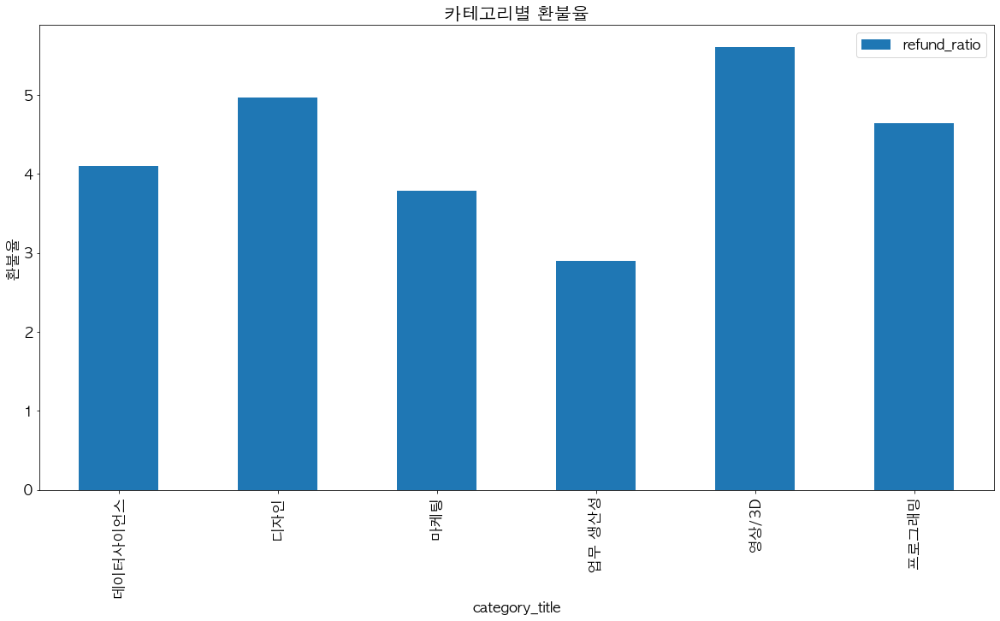

In [277]:
Result_Group = Result.groupby('category_name').mean()
Result_Group.plot(kind = 'bar' ) #시각화
plt.title("카테고리별 환불율")
plt.xlabel("category_title")
plt.ylabel("환불율") 

### (insight)영상/3D의 환불율이 가장 높습니다.